
#### SkyNet
#### Vertebra segmentation for spinal x-rays.
##### Jinchi Wei

This code is provided by Great Ideas for a Master's thesis.

@Copyright Jinchi Wei, the Johns Hopkins University, jwei9@jhu.edu


In [1]:
import os
import numpy as np
np.set_printoptions(precision=3, suppress=True)
import torch.nn as nn

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from skimage import io
from skimage.transform import rescale, resize, downscale_local_mean
# from unet import unet
from ifcn import unet
import json
import matplotlib.pyplot as plt

from PIL import Image

In [2]:
######################## Hyperparameters #################################
# These are SUGGESTED hyperparameters - please feel free to use what works for you.
# Batch size can be changed if it does not match your memory, please state your batch step_size
# in your report.
train_batch_size = 10  # orig 10, 5 for large original image size
validation_batch_size = 5  # orig 10
learning_rate = 0.001
num_classes = 26

# This num_epochs is probably too much, design an early stopping method.
num_epochs = 10  # 200

# Data Directory
# TODO: Please fill in the directory of the segmentation data here
# input_data_dir = mask_json = r'HW6_data/segmentation'
input_data_dir = mask_json = r'data'

# Mask Json directory
# TODO: Please fill in the path to the mapping.json here
# mask_json = r'HW6_data/mapping.json'
mask_json = r'data/mapping.json'

# Image Transforms
train_transform = transforms.Compose([
    transforms.ToTensor(),
])
img_transform = transforms.Compose([
    transforms.ToTensor(),
])

In [3]:
# We have provided you with some preprocessing code for the images but you should
# design your own dataloader
class SegmentationDataset(Dataset):
    def __init__(self, input_dir, op, mask_json_path, transforms=None):
        self.transform = transforms
        self.op = op
        with open(mask_json_path, 'r') as f:
            self.mask = json.load(f)
        self.mask_num = len(self.mask)
        self.mask_value = [value for value in self.mask.values()]
        self.mask_value.sort()
        try:
            if self.op == 'train':
                self.data_dir = os.path.join(input_dir, 'train')
            elif self.op == 'val':
                self.data_dir = os.path.join(input_dir, 'validation')
            elif self.op == 'test':
                self.data_dir = os.path.join(input_dir, 'test')
        except ValueError:
            print('op should be either train, val or test!')

    def __len__(self):
        return len(next(os.walk(self.data_dir))[1])

    def __getitem__(self, idx):
#         print('dataloader going through number',idx)
        idir = os.path.join(self.data_dir, str(idx))  # data/train/0 etc
        
        allfiles = list(os.listdir(idir))
        allfiles.sort()
        
        # get height, width  # MXJ resize
        sample_data = allfiles[0]
#         sample_data = io.imread(os.path.join(idir, sample_data))
        sample_data = Image.open(os.path.join(idir, sample_data))
#         height, width = np.shape(sample_data)  # 1250, 620
        
        # rescale to 1280 x 640 / 2, so 640 x 320
#         sample_data = resize(sample_data, (640, 320), anti_aliasing=True)
        sample_data = sample_data.resize((320, 640))  # PIL flipped for some reason
        sample_data = np.array(sample_data)  # to numpy
        height, width = np.shape(sample_data)  # 640 x 320
        
#         total_vertebra = list(range(0,26))
        
        mask_array = np.zeros((height, width, self.mask_num))
        
        for i in range(len(allfiles)):
            filename = allfiles[i]
            if filename.startswith('image'):
                img_name = filename
            elif filename.startswith('vertebra'):
                vertebra_num = np.uint8(filename.split('_')[1])
                rawpath = os.path.join(idir, filename)
#                 print('processing:',rawpath)  # for debug - see which files cause errors
                raw = Image.open(rawpath)
#                 raw = io.imread(rawpath)
#                 raw = resize(raw, (640, 320), anti_aliasing=True)  # MXJ resize
                raw = raw.resize((320,640))
                raw = np.array(raw)
                mask_array[:,:,vertebra_num] = raw
        
#         img_name = str(idx) + '_input.jpg'
#         mask_name = str(idx) + '_mask.png'
#         img = io.imread(os.path.join(self.data_dir, str(idx), img_name))
#         mask = io.imread(os.path.join(self.data_dir, str(idx), mask_name))
#         h, w = mask.shape

#         img = io.imread(os.path.join(idir, img_name))
        img = Image.open(os.path.join(idir, img_name)).convert('RGB')
#         img = resize(img, (640, 320), anti_aliasing=True)  # MXJ resize
        img = img.resize((320,640))
        img = np.array(img)
        mask = mask_array
        
        img = np.float32(img)
        mask = np.float32(mask)

        # Convert grey-scale label to one-hot encoding
#         new_mask = np.zeros((h, w, self.mask_num))
#         for idx in range(self.mask_num):
#             new_mask[:, :, idx] = mask == self.mask_value[idx]

        # Transform image and mask
        if self.transform:
#             img, mask = self.img_transform(img, new_mask)
            img, mask = self.img_transform(img, mask)

        # Use dictionary to output
        sample = {'img': img, 'mask': mask}

        return sample

    def img_transform(self, img, mask):
        img = self.transform(img)
        mask = self.transform(mask)

        return img, mask

In [4]:
# TODO: Implement DiceLoss, Training, Validation, Earlystopping, Loss Plots etc (whatever the qn asks you)
class dice_loss(nn.Module):
    def __init__(self):
        super(dice_loss, self).__init__()
        self.eps = 1e-9

    def forward(self, logits, target):
        # inputs are both shape N x K x H x W (N is batch size, K is # class), 
        N, K, H, W = logits.shape

        # Figure out how many classes there are in the target image for each batch
    #         _, label = torch.max(target, dim=1)
    #         label = label.cpu().numpy()
    #         N_label = np.zeros(N)
    #         for i in range(N):
    #             N_label[i] = np.unique(label[i,:,:]).shape[0]

        l_flat = logits.view(logits.size(0), logits.size(1), -1) # want to be size N x K x HW
        t_flat = target.view(target.size(0), target.size(1), -1) # want to be size N x K x HW
        intersection = torch.sum(torch.mul(l_flat, t_flat), dim=2) # N x K
        num = 2 * intersection # + self.eps

        den = torch.sum(l_flat, dim=2) + torch.sum(t_flat, dim=2) + self.eps # N x K
        dice_score = torch.div(num, den) # N x K

        # First mean over class manually, using N_label
    #         dice_score = torch.sum(dice_score, dim=1) / torch.from_numpy(N_label).to(device)
        # Now mean over batch
        dice_score = torch.mean(dice_score, dim=(0,1)) # scalar now

        loss = 1 +  -1.0*dice_score # per-class loss
        loss.requires_grad_(True)
        return loss


def dice_score(preds, one_hot_target, num_classes=num_classes):
    N, K, H, W = preds.shape
    
    #Not differentiating anything, so detach everything
    target_np = one_hot_target.clone().detach().cpu().numpy()
    preds_torch = preds.clone().detach().cpu()
    
    # one-hot encode preds to calculate denominator
    _, preds_torch = torch.max(preds_torch, dim=1)
    preds_onehot = nn.functional.one_hot(preds_torch, num_classes)
    preds_np = np.transpose(preds_onehot.numpy(), (0, 3, 1, 2)) # N x K x H x W

    num = 2*np.sum(((preds_np == target_np) & (target_np != 0) & (preds_np != 0)), axis=(0, 2, 3)) # sum up per class, so den is size (K,)

    den = np.sum(preds_np, axis=(0, 2, 3)) + np.sum(target_np, axis=(0, 2, 3)) # sum up per class, so den is size (K,)
    den[np.where(den == 0)] = 1e-9
    num[np.where(den == 0)] = 1e-9
    dice_coeff = num / den

    return(dice_coeff)

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.Linear):
        nn.init.xavier_uniform_(m.weight.data)
        if m.bias is not None:
            m.bias.data.zero_()

In [5]:
# Instantiate DataSets
train_dataset = SegmentationDataset(input_data_dir, 'train', mask_json, transforms=train_transform)
val_dataset   = SegmentationDataset(input_data_dir, 'val', mask_json, transforms=img_transform)
test_dataset  = SegmentationDataset(input_data_dir, 'test', mask_json, transforms=img_transform)

In [6]:
# Instantiate dataloaders
train_dataloader = DataLoader(train_dataset, batch_size=train_batch_size, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=validation_batch_size, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=False)

In [7]:
#
# Define parameters, model, etc
#

model = None
# num_classes = 26

# etc
print(torch.cuda.get_device_name(0))
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initializations
model = unet(num_classes=num_classes, useBN=True)
model = model.to(device)
weights_init(model)
# loss_fn = GeneralizedDiceLoss()
loss_fn = dice_loss()
# loss_fn = torch.nn.CrossEntropyLoss()
# loss_fn = vanilla_dice_loss

optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
# scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)


Tesla K80


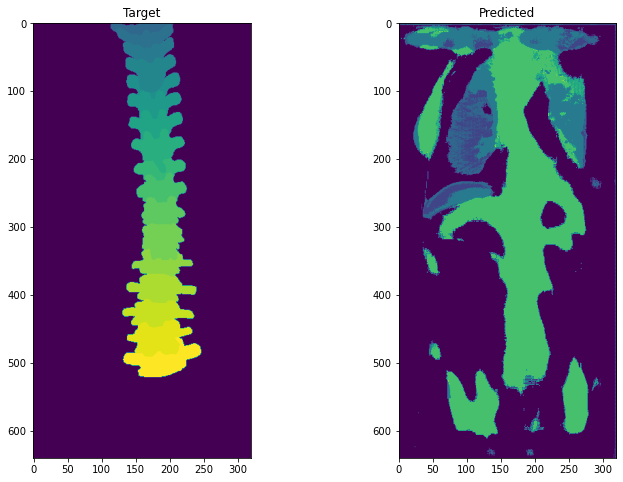

================================================== Training ==================================================
Epoch: 0, Train Loss: 0.9533588022630741, Average Dice Score: 0.031218902739792838
Dice Score Per Class
0: 0.59 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.00 6: 0.00 7: 0.00 8: 0.06 9: 0.00 10: 0.06 11: 0.00 12: 0.00 13: 0.00 14: 0.00 15: 0.00 16: 0.00 17: 0.05 18: 0.00 19: 0.00 20: 0.01 21: 0.00 22: 0.00 23: 0.01 24: 0.01 25: 0.00
================================================= Validation =================================================
Epoch: 0, Val Loss: 0.9515361561149848, Average Dice Score: 0.03519133635576245
Dice Score Per Class
0: 0.59 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.00 6: 0.00 7: 0.00 8: 0.06 9: 0.00 10: 0.06 11: 0.00 12: 0.00 13: 0.00 14: 0.00 15: 0.00 16: 0.00 17: 0.05 18: 0.00 19: 0.00 20: 0.01 21: 0.00 22: 0.00 23: 0.01 24: 0.01 25: 0.00


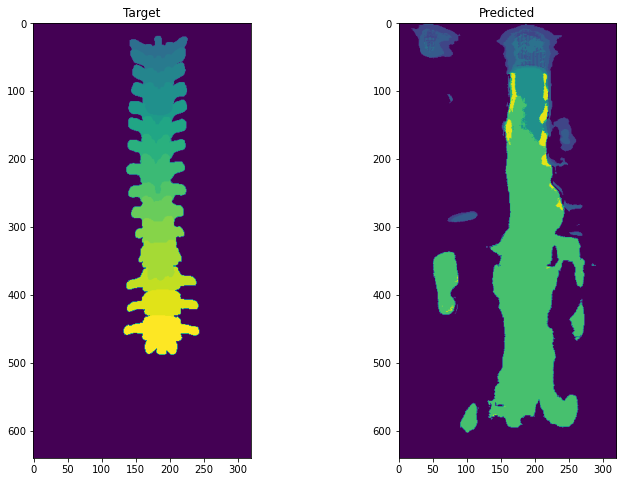

================================================== Training ==================================================
Epoch: 1, Train Loss: 0.9397919901476337, Average Dice Score: 0.04690759638331558
Dice Score Per Class
0: 0.85 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.02 6: 0.00 7: 0.01 8: 0.03 9: 0.02 10: 0.08 11: 0.01 12: 0.09 13: 0.00 14: 0.00 15: 0.00 16: 0.00 17: 0.08 18: 0.00 19: 0.00 20: 0.00 21: 0.00 22: 0.00 23: 0.03 24: 0.00 25: 0.00
================================================= Validation =================================================
Epoch: 1, Val Loss: 0.9400493502616882, Average Dice Score: 0.05276993380533227
Dice Score Per Class
0: 0.85 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.02 6: 0.00 7: 0.01 8: 0.03 9: 0.02 10: 0.08 11: 0.01 12: 0.09 13: 0.00 14: 0.00 15: 0.00 16: 0.00 17: 0.08 18: 0.00 19: 0.00 20: 0.00 21: 0.00 22: 0.00 23: 0.03 24: 0.00 25: 0.00


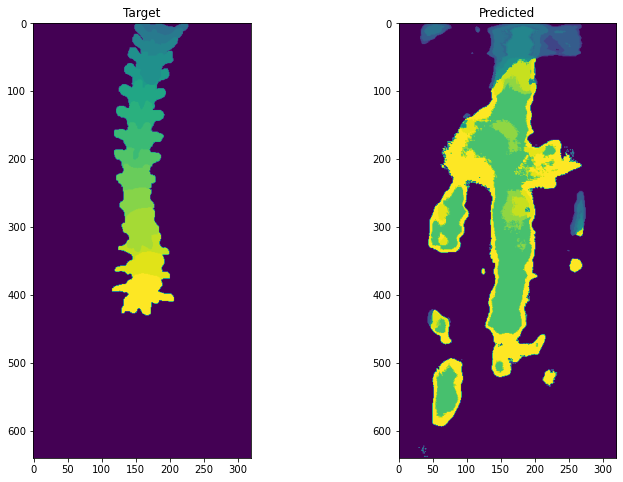

================================================== Training ==================================================
Epoch: 2, Train Loss: 0.9204632969763387, Average Dice Score: 0.07675996785789341
Dice Score Per Class
0: 0.89 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.01 6: 0.00 7: 0.06 8: 0.02 9: 0.33 10: 0.07 11: 0.13 12: 0.18 13: 0.00 14: 0.00 15: 0.00 16: 0.00 17: 0.10 18: 0.00 19: 0.00 20: 0.06 21: 0.00 22: 0.07 23: 0.05 24: 0.02 25: 0.00
================================================= Validation =================================================
Epoch: 2, Val Loss: 0.9457878353165798, Average Dice Score: 0.039176074597993195
Dice Score Per Class
0: 0.89 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.01 6: 0.00 7: 0.06 8: 0.02 9: 0.33 10: 0.07 11: 0.13 12: 0.18 13: 0.00 14: 0.00 15: 0.00 16: 0.00 17: 0.10 18: 0.00 19: 0.00 20: 0.06 21: 0.00 22: 0.07 23: 0.05 24: 0.02 25: 0.00


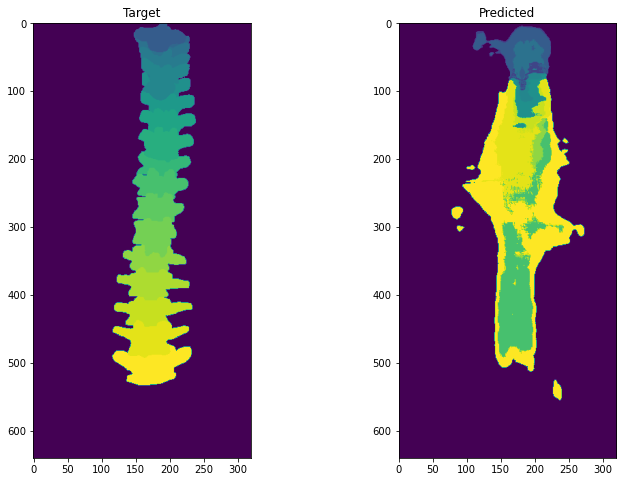

================================================== Training ==================================================
Epoch: 3, Train Loss: 0.8907583712682022, Average Dice Score: 0.0888688870844202
Dice Score Per Class
0: 0.91 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.01 6: 0.00 7: 0.11 8: 0.06 9: 0.38 10: 0.03 11: 0.23 12: 0.22 13: 0.00 14: 0.00 15: 0.00 16: 0.00 17: 0.14 18: 0.00 19: 0.00 20: 0.07 21: 0.00 22: 0.06 23: 0.06 24: 0.04 25: 0.00
================================================= Validation =================================================
Epoch: 3, Val Loss: 0.9375859293781343, Average Dice Score: 0.0374871488735905
Dice Score Per Class
0: 0.91 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.01 6: 0.00 7: 0.11 8: 0.06 9: 0.38 10: 0.03 11: 0.23 12: 0.22 13: 0.00 14: 0.00 15: 0.00 16: 0.00 17: 0.14 18: 0.00 19: 0.00 20: 0.07 21: 0.00 22: 0.06 23: 0.06 24: 0.04 25: 0.00


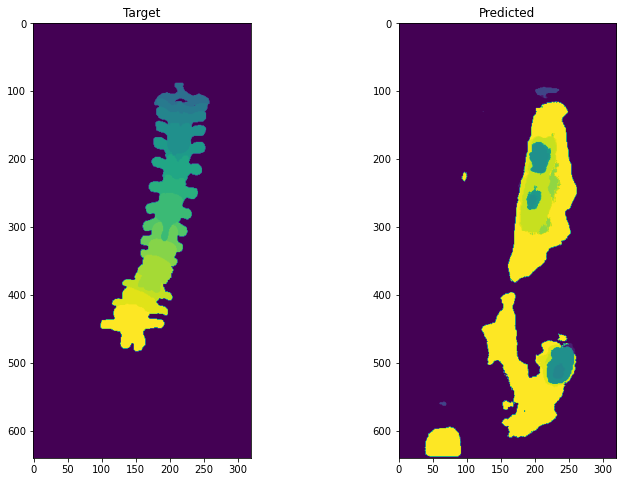

================================================== Training ==================================================
Epoch: 4, Train Loss: 0.8481421186068845, Average Dice Score: 0.07059352106943982
Dice Score Per Class
0: 0.92 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.02 6: 0.00 7: 0.15 8: 0.00 9: 0.05 10: 0.00 11: 0.17 12: 0.30 13: 0.00 14: 0.00 15: 0.00 16: 0.00 17: 0.08 18: 0.00 19: 0.00 20: 0.03 21: 0.00 22: 0.02 23: 0.05 24: 0.03 25: 0.00
================================================= Validation =================================================
Epoch: 4, Val Loss: 0.9235795667914094, Average Dice Score: 0.027377198798265837
Dice Score Per Class
0: 0.92 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.02 6: 0.00 7: 0.15 8: 0.00 9: 0.05 10: 0.00 11: 0.17 12: 0.30 13: 0.00 14: 0.00 15: 0.00 16: 0.00 17: 0.08 18: 0.00 19: 0.00 20: 0.03 21: 0.00 22: 0.02 23: 0.05 24: 0.03 25: 0.00


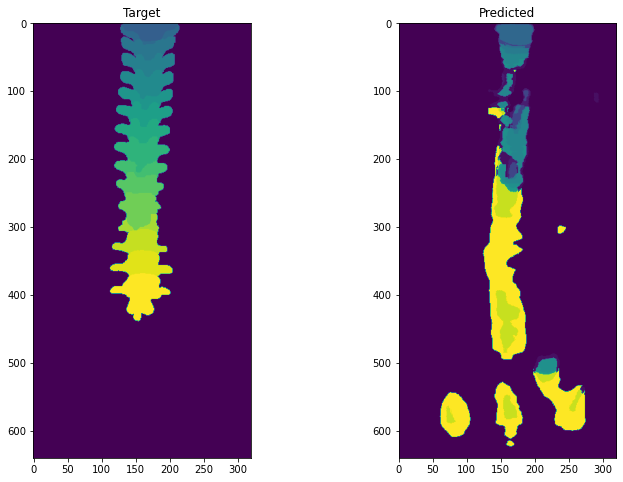

================================================== Training ==================================================
Epoch: 5, Train Loss: 0.7970844341570295, Average Dice Score: 0.08090481184109424
Dice Score Per Class
0: 0.96 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.03 6: 0.00 7: 0.00 8: 0.19 9: 0.10 10: 0.09 11: 0.25 12: 0.31 13: 0.09 14: 0.00 15: 0.00 16: 0.00 17: 0.00 18: 0.00 19: 0.00 20: 0.00 21: 0.00 22: 0.03 23: 0.02 24: 0.03 25: 0.00
================================================= Validation =================================================
Epoch: 5, Val Loss: 0.834021119797816, Average Dice Score: 0.08256574270455441
Dice Score Per Class
0: 0.96 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.03 6: 0.00 7: 0.00 8: 0.19 9: 0.10 10: 0.09 11: 0.25 12: 0.31 13: 0.09 14: 0.00 15: 0.00 16: 0.00 17: 0.00 18: 0.00 19: 0.00 20: 0.00 21: 0.00 22: 0.03 23: 0.02 24: 0.03 25: 0.00


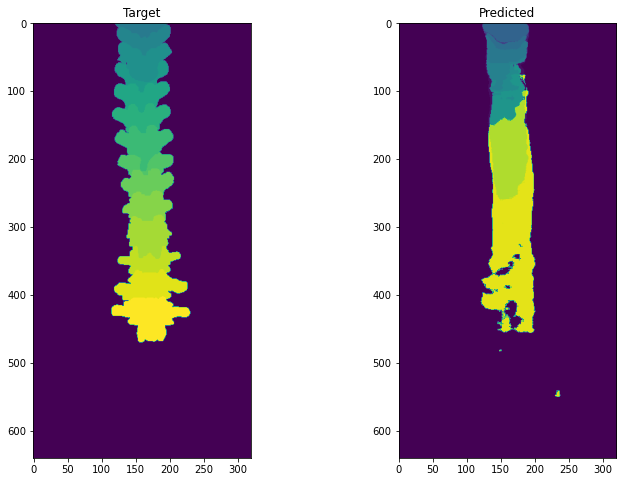

================================================== Training ==================================================
Epoch: 6, Train Loss: 0.7566302291287945, Average Dice Score: 0.12466246087332944
Dice Score Per Class
0: 0.96 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.01 6: 0.00 7: 0.00 8: 0.55 9: 0.32 10: 0.32 11: 0.41 12: 0.26 13: 0.30 14: 0.02 15: 0.00 16: 0.00 17: 0.00 18: 0.00 19: 0.00 20: 0.00 21: 0.00 22: 0.03 23: 0.00 24: 0.04 25: 0.00
================================================= Validation =================================================
Epoch: 6, Val Loss: 0.9052209072425718, Average Dice Score: 0.0513805364272746
Dice Score Per Class
0: 0.96 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.01 6: 0.00 7: 0.00 8: 0.55 9: 0.32 10: 0.32 11: 0.41 12: 0.26 13: 0.30 14: 0.02 15: 0.00 16: 0.00 17: 0.00 18: 0.00 19: 0.00 20: 0.00 21: 0.00 22: 0.03 23: 0.00 24: 0.04 25: 0.00


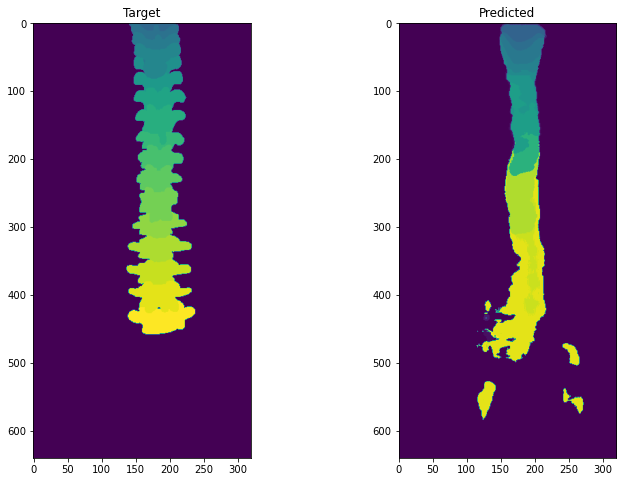

================================================== Training ==================================================
Epoch: 7, Train Loss: 0.7237336057948387, Average Dice Score: 0.15348722299949663
Dice Score Per Class
0: 0.96 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.01 6: 0.01 7: 0.00 8: 0.59 9: 0.38 10: 0.48 11: 0.37 12: 0.31 13: 0.36 14: 0.27 15: 0.00 16: 0.12 17: 0.00 18: 0.00 19: 0.00 20: 0.00 21: 0.00 22: 0.03 23: 0.03 24: 0.06 25: 0.00
================================================= Validation =================================================
Epoch: 7, Val Loss: 0.8859735434172583, Average Dice Score: 0.07053956516847668
Dice Score Per Class
0: 0.96 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.01 6: 0.01 7: 0.00 8: 0.59 9: 0.38 10: 0.48 11: 0.37 12: 0.31 13: 0.36 14: 0.27 15: 0.00 16: 0.12 17: 0.00 18: 0.00 19: 0.00 20: 0.00 21: 0.00 22: 0.03 23: 0.03 24: 0.06 25: 0.00


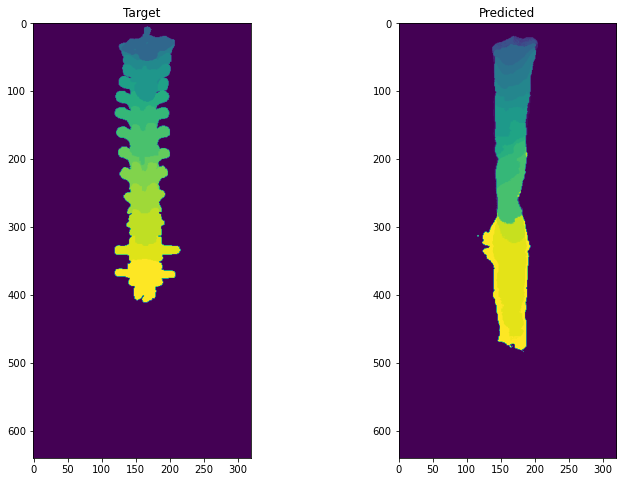

================================================== Training ==================================================
Epoch: 8, Train Loss: 0.6982506972310663, Average Dice Score: 0.18304941858047266
Dice Score Per Class
0: 0.97 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.01 6: 0.08 7: 0.00 8: 0.59 9: 0.39 10: 0.49 11: 0.41 12: 0.36 13: 0.34 14: 0.35 15: 0.09 16: 0.36 17: 0.16 18: 0.00 19: 0.00 20: 0.00 21: 0.00 22: 0.03 23: 0.08 24: 0.06 25: 0.00
================================================= Validation =================================================
Epoch: 8, Val Loss: 0.8491409743418459, Average Dice Score: 0.07967096421723543
Dice Score Per Class
0: 0.97 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.01 6: 0.08 7: 0.00 8: 0.59 9: 0.39 10: 0.49 11: 0.41 12: 0.36 13: 0.34 14: 0.35 15: 0.09 16: 0.36 17: 0.16 18: 0.00 19: 0.00 20: 0.00 21: 0.00 22: 0.03 23: 0.08 24: 0.06 25: 0.00


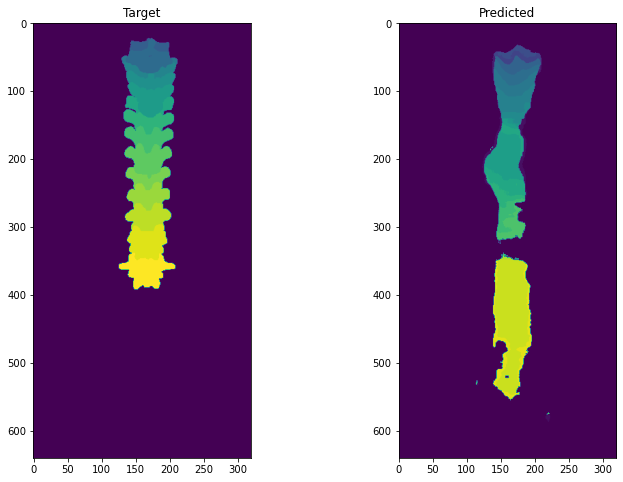

================================================== Training ==================================================
Epoch: 9, Train Loss: 0.6744687492094243, Average Dice Score: 0.21516411479350814
Dice Score Per Class
0: 0.97 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.05 6: 0.16 7: 0.02 8: 0.50 9: 0.50 10: 0.52 11: 0.45 12: 0.41 13: 0.30 14: 0.35 15: 0.24 16: 0.31 17: 0.37 18: 0.25 19: 0.01 20: 0.00 21: 0.00 22: 0.01 23: 0.11 24: 0.07 25: 0.00
================================================= Validation =================================================
Epoch: 9, Val Loss: 0.8842635975509393, Average Dice Score: 0.07467473854352077
Dice Score Per Class
0: 0.97 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.05 6: 0.16 7: 0.02 8: 0.50 9: 0.50 10: 0.52 11: 0.45 12: 0.41 13: 0.30 14: 0.35 15: 0.24 16: 0.31 17: 0.37 18: 0.25 19: 0.01 20: 0.00 21: 0.00 22: 0.01 23: 0.11 24: 0.07 25: 0.00


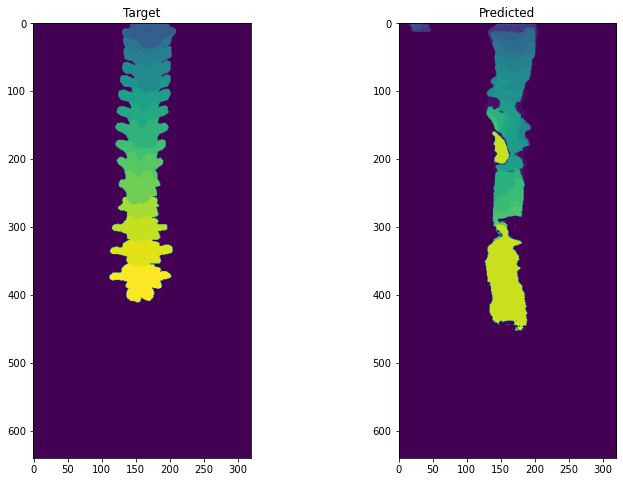

================================================== Training ==================================================
Epoch: 10, Train Loss: 0.6557173188112128, Average Dice Score: 0.22547094971976572
Dice Score Per Class
0: 0.97 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.04 6: 0.21 7: 0.01 8: 0.43 9: 0.54 10: 0.52 11: 0.46 12: 0.42 13: 0.31 14: 0.35 15: 0.27 16: 0.35 17: 0.37 18: 0.31 19: 0.10 20: 0.00 21: 0.00 22: 0.00 23: 0.14 24: 0.06 25: 0.00
================================================= Validation =================================================
Epoch: 10, Val Loss: 0.7584347666287031, Average Dice Score: 0.13767348051725303
Dice Score Per Class
0: 0.97 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.04 6: 0.21 7: 0.01 8: 0.43 9: 0.54 10: 0.52 11: 0.46 12: 0.42 13: 0.31 14: 0.35 15: 0.27 16: 0.35 17: 0.37 18: 0.31 19: 0.10 20: 0.00 21: 0.00 22: 0.00 23: 0.14 24: 0.06 25: 0.00


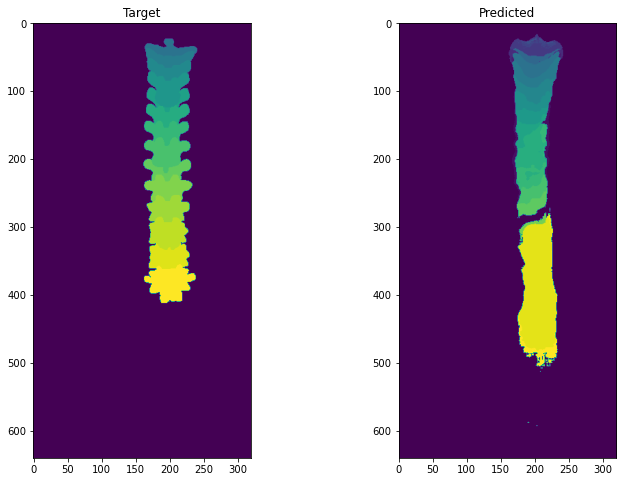

================================================== Training ==================================================
Epoch: 11, Train Loss: 0.638248537328634, Average Dice Score: 0.23888548007466662
Dice Score Per Class
0: 0.97 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.08 6: 0.08 7: 0.00 8: 0.46 9: 0.55 10: 0.53 11: 0.50 12: 0.45 13: 0.33 14: 0.40 15: 0.27 16: 0.39 17: 0.42 18: 0.39 19: 0.18 20: 0.00 21: 0.00 22: 0.00 23: 0.15 24: 0.06 25: 0.00
================================================= Validation =================================================
Epoch: 11, Val Loss: 0.7125146056784958, Average Dice Score: 0.16720562872238398
Dice Score Per Class
0: 0.97 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.08 6: 0.08 7: 0.00 8: 0.46 9: 0.55 10: 0.53 11: 0.50 12: 0.45 13: 0.33 14: 0.40 15: 0.27 16: 0.39 17: 0.42 18: 0.39 19: 0.18 20: 0.00 21: 0.00 22: 0.00 23: 0.15 24: 0.06 25: 0.00


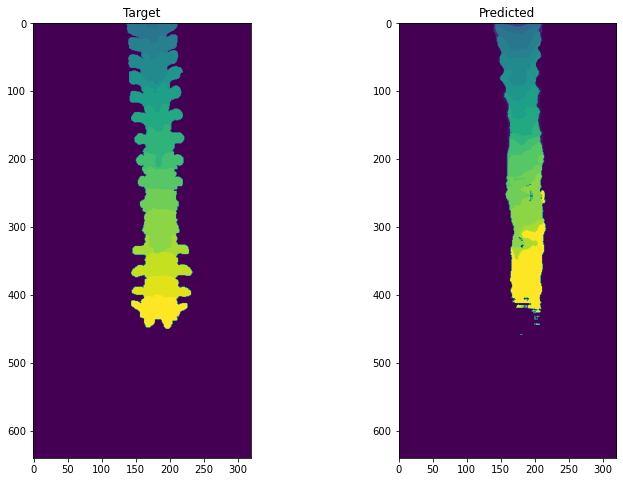

================================================== Training ==================================================
Epoch: 12, Train Loss: 0.6189287210020487, Average Dice Score: 0.2568480842860718
Dice Score Per Class
0: 0.97 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.14 6: 0.06 7: 0.00 8: 0.44 9: 0.61 10: 0.56 11: 0.52 12: 0.48 13: 0.34 14: 0.43 15: 0.31 16: 0.39 17: 0.44 18: 0.40 19: 0.32 20: 0.06 21: 0.00 22: 0.00 23: 0.16 24: 0.04 25: 0.00
================================================= Validation =================================================
Epoch: 12, Val Loss: 0.8826819140402997, Average Dice Score: 0.07467382093698141
Dice Score Per Class
0: 0.97 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.14 6: 0.06 7: 0.00 8: 0.44 9: 0.61 10: 0.56 11: 0.52 12: 0.48 13: 0.34 14: 0.43 15: 0.31 16: 0.39 17: 0.44 18: 0.40 19: 0.32 20: 0.06 21: 0.00 22: 0.00 23: 0.16 24: 0.04 25: 0.00


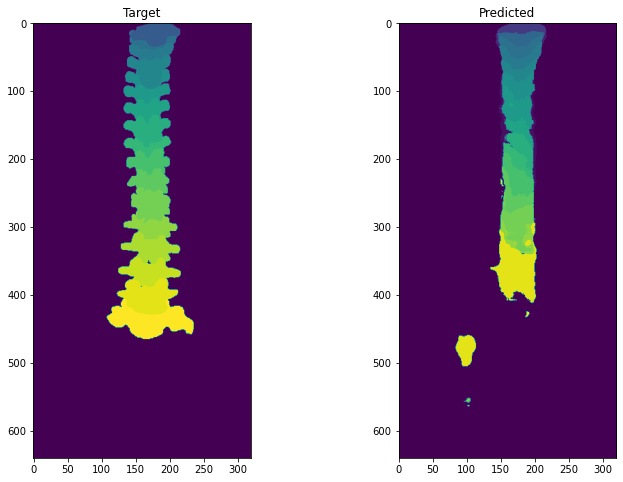

================================================== Training ==================================================
Epoch: 13, Train Loss: 0.6103365053190472, Average Dice Score: 0.27429302589517296
Dice Score Per Class
0: 0.97 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.14 6: 0.00 7: 0.00 8: 0.49 9: 0.61 10: 0.56 11: 0.53 12: 0.49 13: 0.34 14: 0.41 15: 0.31 16: 0.41 17: 0.48 18: 0.44 19: 0.47 20: 0.27 21: 0.00 22: 0.00 23: 0.18 24: 0.00 25: 0.00
================================================= Validation =================================================
Epoch: 13, Val Loss: 0.7791939768634859, Average Dice Score: 0.13206393388229032
Dice Score Per Class
0: 0.97 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.14 6: 0.00 7: 0.00 8: 0.49 9: 0.61 10: 0.56 11: 0.53 12: 0.49 13: 0.34 14: 0.41 15: 0.31 16: 0.41 17: 0.48 18: 0.44 19: 0.47 20: 0.27 21: 0.00 22: 0.00 23: 0.18 24: 0.00 25: 0.00


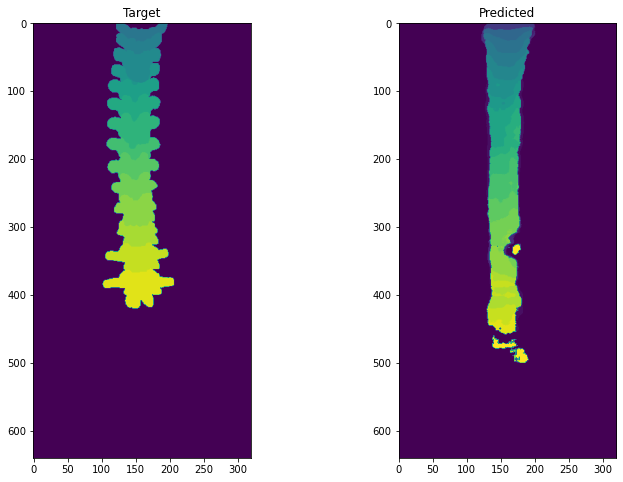

================================================== Training ==================================================
Epoch: 14, Train Loss: 0.6120227573886337, Average Dice Score: 0.28749793370694565
Dice Score Per Class
0: 0.97 1: 0.00 2: 0.00 3: 0.00 4: 0.02 5: 0.00 6: 0.00 7: 0.03 8: 0.48 9: 0.59 10: 0.55 11: 0.52 12: 0.48 13: 0.35 14: 0.40 15: 0.31 16: 0.38 17: 0.46 18: 0.43 19: 0.48 20: 0.36 21: 0.26 22: 0.11 23: 0.21 24: 0.08 25: 0.00
================================================= Validation =================================================
Epoch: 14, Val Loss: 0.844201991792585, Average Dice Score: 0.11788466982506314
Dice Score Per Class
0: 0.97 1: 0.00 2: 0.00 3: 0.00 4: 0.02 5: 0.00 6: 0.00 7: 0.03 8: 0.48 9: 0.59 10: 0.55 11: 0.52 12: 0.48 13: 0.35 14: 0.40 15: 0.31 16: 0.38 17: 0.46 18: 0.43 19: 0.48 20: 0.36 21: 0.26 22: 0.11 23: 0.21 24: 0.08 25: 0.00


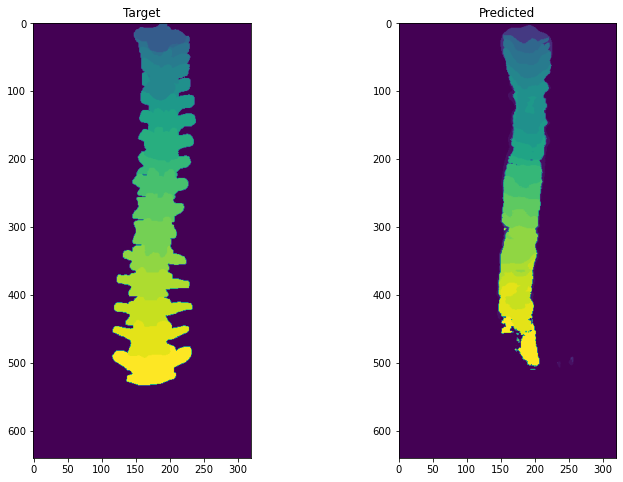

================================================== Training ==================================================
Epoch: 15, Train Loss: 0.5807339032302277, Average Dice Score: 0.33843700473278154
Dice Score Per Class
0: 0.97 1: 0.00 2: 0.00 3: 0.00 4: 0.03 5: 0.01 6: 0.00 7: 0.03 8: 0.53 9: 0.62 10: 0.59 11: 0.56 12: 0.54 13: 0.37 14: 0.44 15: 0.34 16: 0.46 17: 0.52 18: 0.52 19: 0.54 20: 0.47 21: 0.41 22: 0.41 23: 0.19 24: 0.25 25: 0.00
================================================= Validation =================================================
Epoch: 15, Val Loss: 0.6871298629729474, Average Dice Score: 0.22941896872346548
Dice Score Per Class
0: 0.97 1: 0.00 2: 0.00 3: 0.00 4: 0.03 5: 0.01 6: 0.00 7: 0.03 8: 0.53 9: 0.62 10: 0.59 11: 0.56 12: 0.54 13: 0.37 14: 0.44 15: 0.34 16: 0.46 17: 0.52 18: 0.52 19: 0.54 20: 0.47 21: 0.41 22: 0.41 23: 0.19 24: 0.25 25: 0.00


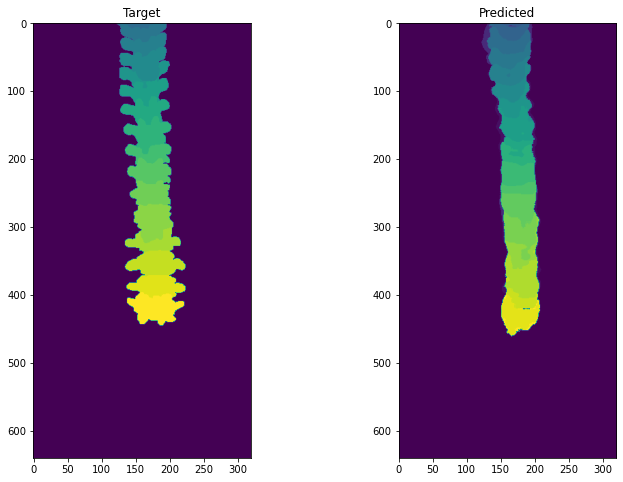

================================================== Training ==================================================
Epoch: 16, Train Loss: 0.5694121442328156, Average Dice Score: 0.35930527891458136
Dice Score Per Class
0: 0.97 1: 0.00 2: 0.00 3: 0.00 4: 0.03 5: 0.01 6: 0.00 7: 0.16 8: 0.58 9: 0.59 10: 0.61 11: 0.58 12: 0.54 13: 0.42 14: 0.45 15: 0.39 16: 0.47 17: 0.54 18: 0.54 19: 0.56 20: 0.50 21: 0.44 22: 0.44 23: 0.23 24: 0.28 25: 0.00
================================================= Validation =================================================
Epoch: 16, Val Loss: 0.6635707773146082, Average Dice Score: 0.252173411268607
Dice Score Per Class
0: 0.97 1: 0.00 2: 0.00 3: 0.00 4: 0.03 5: 0.01 6: 0.00 7: 0.16 8: 0.58 9: 0.59 10: 0.61 11: 0.58 12: 0.54 13: 0.42 14: 0.45 15: 0.39 16: 0.47 17: 0.54 18: 0.54 19: 0.56 20: 0.50 21: 0.44 22: 0.44 23: 0.23 24: 0.28 25: 0.00


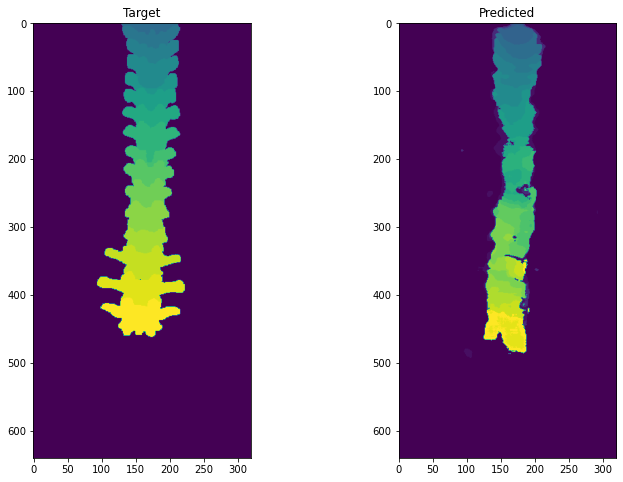

================================================== Training ==================================================
Epoch: 17, Train Loss: 0.5609359319306326, Average Dice Score: 0.37166533675401175
Dice Score Per Class
0: 0.97 1: 0.00 2: 0.00 3: 0.00 4: 0.04 5: 0.00 6: 0.00 7: 0.27 8: 0.57 9: 0.60 10: 0.61 11: 0.60 12: 0.56 13: 0.44 14: 0.44 15: 0.39 16: 0.49 17: 0.55 18: 0.56 19: 0.57 20: 0.50 21: 0.47 22: 0.45 23: 0.27 24: 0.29 25: 0.00
================================================= Validation =================================================
Epoch: 17, Val Loss: 0.6813425949362458, Average Dice Score: 0.2553620244514597
Dice Score Per Class
0: 0.97 1: 0.00 2: 0.00 3: 0.00 4: 0.04 5: 0.00 6: 0.00 7: 0.27 8: 0.57 9: 0.60 10: 0.61 11: 0.60 12: 0.56 13: 0.44 14: 0.44 15: 0.39 16: 0.49 17: 0.55 18: 0.56 19: 0.57 20: 0.50 21: 0.47 22: 0.45 23: 0.27 24: 0.29 25: 0.00


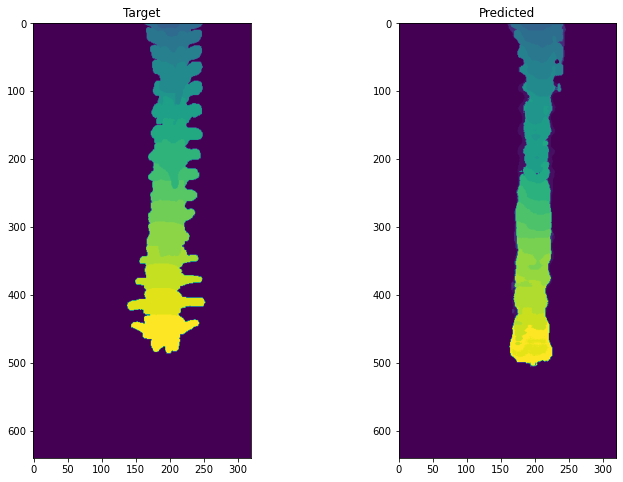

================================================== Training ==================================================
Epoch: 18, Train Loss: 0.5627818124594428, Average Dice Score: 0.3721864266253588
Dice Score Per Class
0: 0.97 1: 0.00 2: 0.00 3: 0.00 4: 0.04 5: 0.00 6: 0.00 7: 0.29 8: 0.59 9: 0.59 10: 0.61 11: 0.59 12: 0.55 13: 0.42 14: 0.45 15: 0.41 16: 0.49 17: 0.54 18: 0.56 19: 0.58 20: 0.52 21: 0.46 22: 0.46 23: 0.31 24: 0.24 25: 0.01
================================================= Validation =================================================
Epoch: 18, Val Loss: 0.6479670024309002, Average Dice Score: 0.2688280443067669
Dice Score Per Class
0: 0.97 1: 0.00 2: 0.00 3: 0.00 4: 0.04 5: 0.00 6: 0.00 7: 0.29 8: 0.59 9: 0.59 10: 0.61 11: 0.59 12: 0.55 13: 0.42 14: 0.45 15: 0.41 16: 0.49 17: 0.54 18: 0.56 19: 0.58 20: 0.52 21: 0.46 22: 0.46 23: 0.31 24: 0.24 25: 0.01


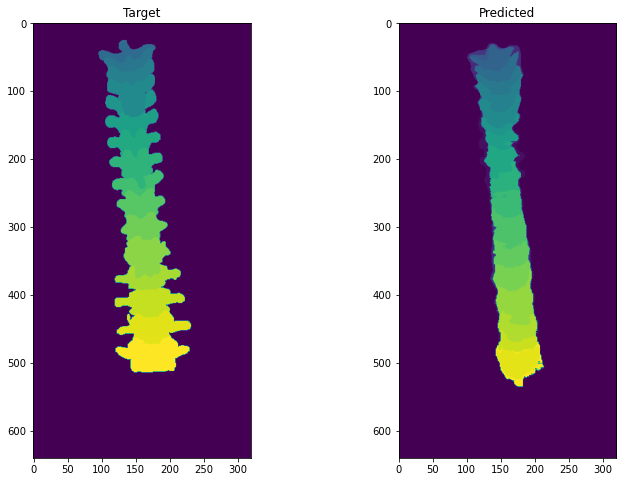

================================================== Training ==================================================
Epoch: 19, Train Loss: 0.5396790354382114, Average Dice Score: 0.39575205168052113
Dice Score Per Class
0: 0.97 1: 0.00 2: 0.00 3: 0.00 4: 0.04 5: 0.00 6: 0.00 7: 0.30 8: 0.63 9: 0.59 10: 0.64 11: 0.63 12: 0.60 13: 0.45 14: 0.47 15: 0.41 16: 0.53 17: 0.59 18: 0.62 19: 0.63 20: 0.56 21: 0.51 22: 0.49 23: 0.33 24: 0.27 25: 0.02
================================================= Validation =================================================
Epoch: 19, Val Loss: 0.6458425433909307, Average Dice Score: 0.2808589173256338
Dice Score Per Class
0: 0.97 1: 0.00 2: 0.00 3: 0.00 4: 0.04 5: 0.00 6: 0.00 7: 0.30 8: 0.63 9: 0.59 10: 0.64 11: 0.63 12: 0.60 13: 0.45 14: 0.47 15: 0.41 16: 0.53 17: 0.59 18: 0.62 19: 0.63 20: 0.56 21: 0.51 22: 0.49 23: 0.33 24: 0.27 25: 0.02


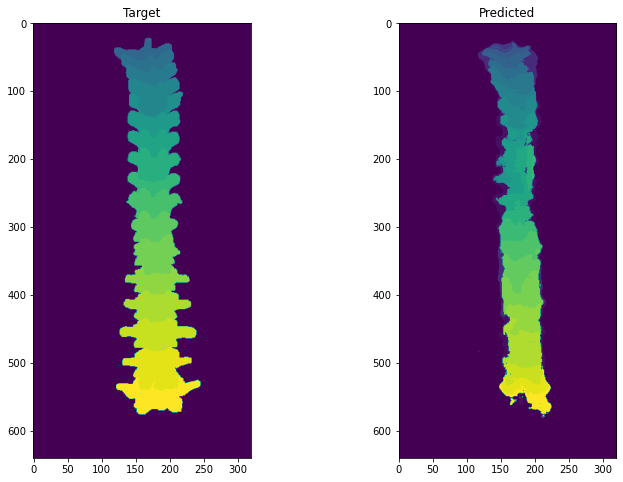

================================================== Training ==================================================
Epoch: 20, Train Loss: 0.5269241113560783, Average Dice Score: 0.41434023083554894
Dice Score Per Class
0: 0.97 1: 0.00 2: 0.00 3: 0.00 4: 0.05 5: 0.00 6: 0.10 7: 0.34 8: 0.62 9: 0.58 10: 0.66 11: 0.65 12: 0.62 13: 0.48 14: 0.50 15: 0.43 16: 0.52 17: 0.59 18: 0.61 19: 0.64 20: 0.59 21: 0.53 22: 0.51 23: 0.41 24: 0.35 25: 0.01
================================================= Validation =================================================
Epoch: 20, Val Loss: 0.6907666159457848, Average Dice Score: 0.24141515925675
Dice Score Per Class
0: 0.97 1: 0.00 2: 0.00 3: 0.00 4: 0.05 5: 0.00 6: 0.10 7: 0.34 8: 0.62 9: 0.58 10: 0.66 11: 0.65 12: 0.62 13: 0.48 14: 0.50 15: 0.43 16: 0.52 17: 0.59 18: 0.61 19: 0.64 20: 0.59 21: 0.53 22: 0.51 23: 0.41 24: 0.35 25: 0.01


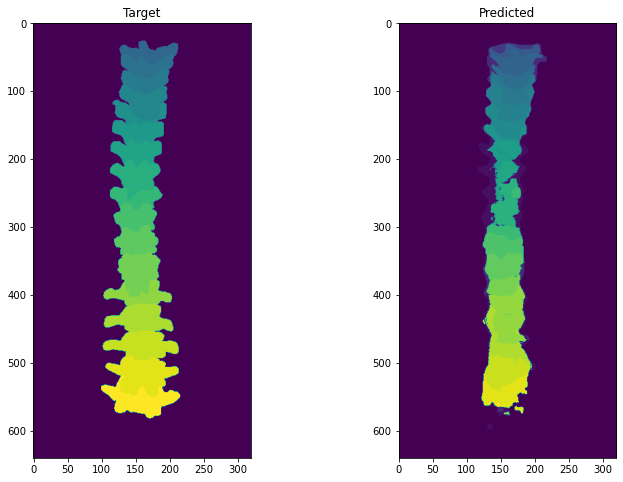

================================================== Training ==================================================
Epoch: 21, Train Loss: 0.5249019595053304, Average Dice Score: 0.426215352171306
Dice Score Per Class
0: 0.97 1: 0.00 2: 0.00 3: 0.00 4: 0.05 5: 0.00 6: 0.21 7: 0.36 8: 0.63 9: 0.60 10: 0.66 11: 0.65 12: 0.60 13: 0.48 14: 0.49 15: 0.46 16: 0.55 17: 0.62 18: 0.63 19: 0.66 20: 0.59 21: 0.54 22: 0.52 23: 0.43 24: 0.37 25: 0.03
================================================= Validation =================================================
Epoch: 21, Val Loss: 0.8565001008940525, Average Dice Score: 0.12273173470701218
Dice Score Per Class
0: 0.97 1: 0.00 2: 0.00 3: 0.00 4: 0.05 5: 0.00 6: 0.21 7: 0.36 8: 0.63 9: 0.60 10: 0.66 11: 0.65 12: 0.60 13: 0.48 14: 0.49 15: 0.46 16: 0.55 17: 0.62 18: 0.63 19: 0.66 20: 0.59 21: 0.54 22: 0.52 23: 0.43 24: 0.37 25: 0.03


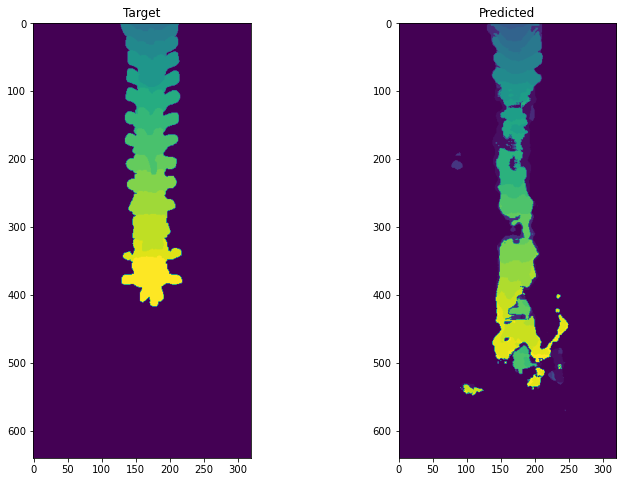

================================================== Training ==================================================
Epoch: 22, Train Loss: 0.5125844594701735, Average Dice Score: 0.4348763707970126
Dice Score Per Class
0: 0.97 1: 0.00 2: 0.00 3: 0.00 4: 0.06 5: 0.00 6: 0.26 7: 0.36 8: 0.60 9: 0.61 10: 0.66 11: 0.68 12: 0.63 13: 0.51 14: 0.52 15: 0.43 16: 0.56 17: 0.64 18: 0.66 19: 0.67 20: 0.61 21: 0.55 22: 0.52 23: 0.42 24: 0.36 25: 0.02
================================================= Validation =================================================
Epoch: 22, Val Loss: 0.6004890125305926, Average Dice Score: 0.34711908409524783
Dice Score Per Class
0: 0.97 1: 0.00 2: 0.00 3: 0.00 4: 0.06 5: 0.00 6: 0.26 7: 0.36 8: 0.60 9: 0.61 10: 0.66 11: 0.68 12: 0.63 13: 0.51 14: 0.52 15: 0.43 16: 0.56 17: 0.64 18: 0.66 19: 0.67 20: 0.61 21: 0.55 22: 0.52 23: 0.42 24: 0.36 25: 0.02


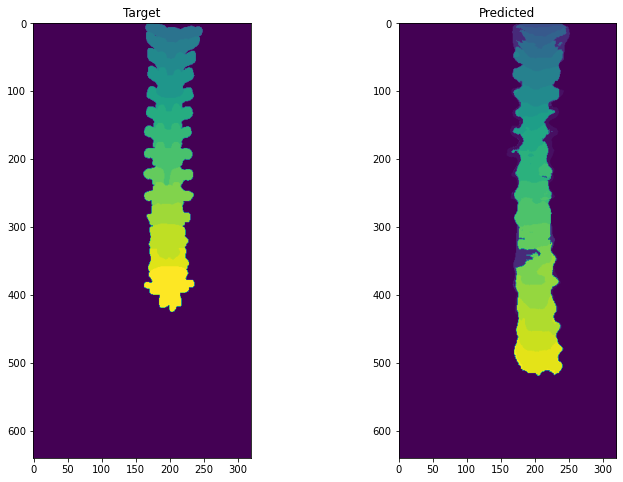

================================================== Training ==================================================
Epoch: 23, Train Loss: 0.5101730973590298, Average Dice Score: 0.44495198688802534
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.10 5: 0.00 6: 0.42 7: 0.38 8: 0.61 9: 0.58 10: 0.67 11: 0.68 12: 0.62 13: 0.51 14: 0.52 15: 0.45 16: 0.56 17: 0.64 18: 0.66 19: 0.66 20: 0.63 21: 0.56 22: 0.53 23: 0.43 24: 0.37 25: 0.02
================================================= Validation =================================================
Epoch: 23, Val Loss: 0.8495691829040403, Average Dice Score: 0.12072856261974688
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.10 5: 0.00 6: 0.42 7: 0.38 8: 0.61 9: 0.58 10: 0.67 11: 0.68 12: 0.62 13: 0.51 14: 0.52 15: 0.45 16: 0.56 17: 0.64 18: 0.66 19: 0.66 20: 0.63 21: 0.56 22: 0.53 23: 0.43 24: 0.37 25: 0.02


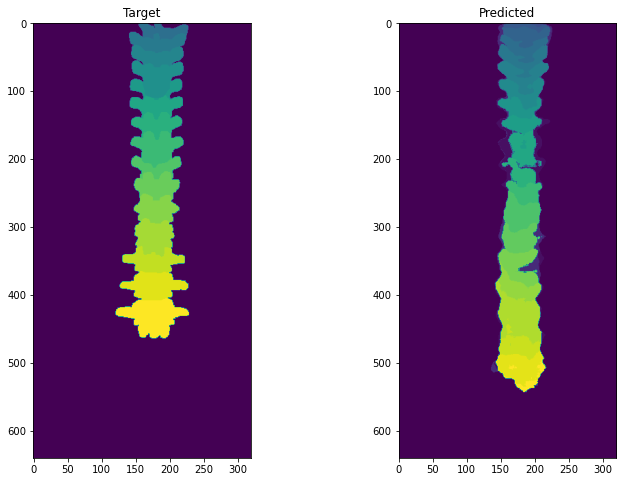

================================================== Training ==================================================
Epoch: 24, Train Loss: 0.5018733923905253, Average Dice Score: 0.45358439817981927
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.09 5: 0.00 6: 0.44 7: 0.37 8: 0.61 9: 0.59 10: 0.67 11: 0.70 12: 0.64 13: 0.53 14: 0.53 15: 0.50 16: 0.57 17: 0.66 18: 0.69 19: 0.65 20: 0.63 21: 0.58 22: 0.54 23: 0.44 24: 0.36 25: 0.02
================================================= Validation =================================================
Epoch: 24, Val Loss: 0.6168112149004077, Average Dice Score: 0.31503318125272656
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.09 5: 0.00 6: 0.44 7: 0.37 8: 0.61 9: 0.59 10: 0.67 11: 0.70 12: 0.64 13: 0.53 14: 0.53 15: 0.50 16: 0.57 17: 0.66 18: 0.69 19: 0.65 20: 0.63 21: 0.58 22: 0.54 23: 0.44 24: 0.36 25: 0.02


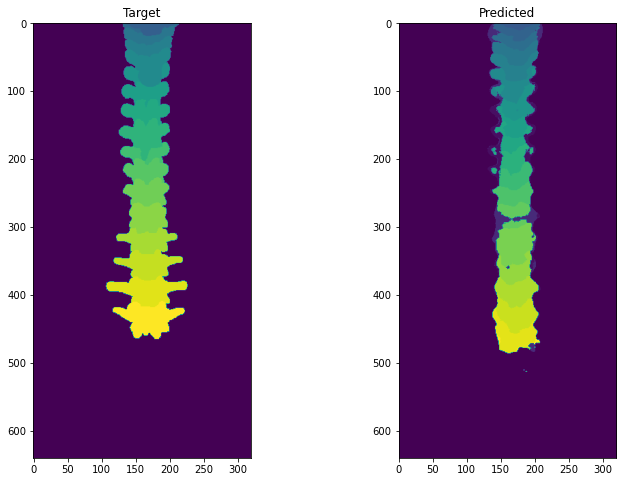

================================================== Training ==================================================
Epoch: 25, Train Loss: 0.4966049665793104, Average Dice Score: 0.4590283349702903
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.10 5: 0.00 6: 0.44 7: 0.40 8: 0.61 9: 0.59 10: 0.66 11: 0.70 12: 0.63 13: 0.54 14: 0.56 15: 0.49 16: 0.60 17: 0.67 18: 0.69 19: 0.64 20: 0.64 21: 0.59 22: 0.54 23: 0.47 24: 0.37 25: 0.03
================================================= Validation =================================================
Epoch: 25, Val Loss: 0.6578362310518984, Average Dice Score: 0.2874257294262602
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.10 5: 0.00 6: 0.44 7: 0.40 8: 0.61 9: 0.59 10: 0.66 11: 0.70 12: 0.63 13: 0.54 14: 0.56 15: 0.49 16: 0.60 17: 0.67 18: 0.69 19: 0.64 20: 0.64 21: 0.59 22: 0.54 23: 0.47 24: 0.37 25: 0.03


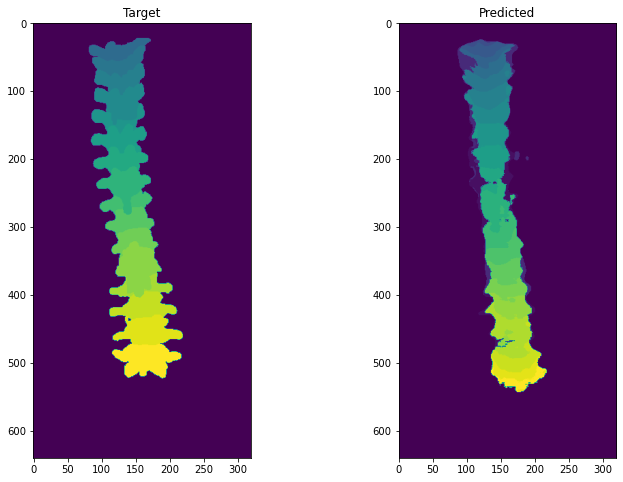

================================================== Training ==================================================
Epoch: 26, Train Loss: 0.4962529734024809, Average Dice Score: 0.45771017663112723
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.10 5: 0.00 6: 0.42 7: 0.38 8: 0.61 9: 0.57 10: 0.66 11: 0.70 12: 0.62 13: 0.55 14: 0.55 15: 0.50 16: 0.61 17: 0.66 18: 0.69 19: 0.64 20: 0.64 21: 0.60 22: 0.56 23: 0.47 24: 0.36 25: 0.03
================================================= Validation =================================================
Epoch: 26, Val Loss: 0.64982351025597, Average Dice Score: 0.2977562587952896
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.10 5: 0.00 6: 0.42 7: 0.38 8: 0.61 9: 0.57 10: 0.66 11: 0.70 12: 0.62 13: 0.55 14: 0.55 15: 0.50 16: 0.61 17: 0.66 18: 0.69 19: 0.64 20: 0.64 21: 0.60 22: 0.56 23: 0.47 24: 0.36 25: 0.03


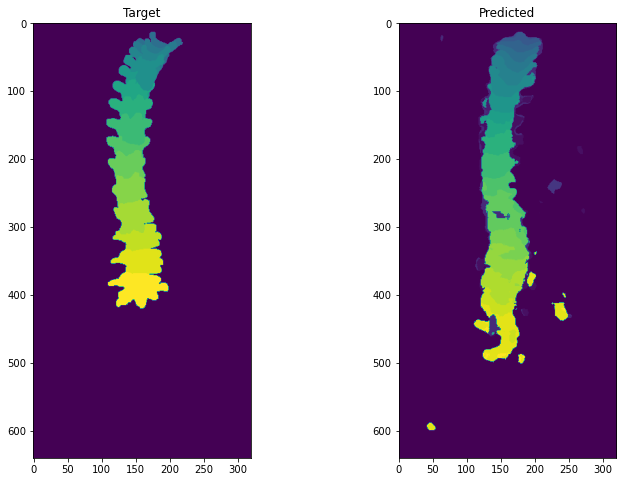

================================================== Training ==================================================
Epoch: 27, Train Loss: 0.4828957613743399, Average Dice Score: 0.4678116960911501
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.10 5: 0.00 6: 0.41 7: 0.40 8: 0.59 9: 0.58 10: 0.66 11: 0.73 12: 0.64 13: 0.56 14: 0.57 15: 0.54 16: 0.62 17: 0.70 18: 0.71 19: 0.66 20: 0.67 21: 0.61 22: 0.57 23: 0.46 24: 0.37 25: 0.04
================================================= Validation =================================================
Epoch: 27, Val Loss: 0.7223586596426417, Average Dice Score: 0.2289336746781268
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.10 5: 0.00 6: 0.41 7: 0.40 8: 0.59 9: 0.58 10: 0.66 11: 0.73 12: 0.64 13: 0.56 14: 0.57 15: 0.54 16: 0.62 17: 0.70 18: 0.71 19: 0.66 20: 0.67 21: 0.61 22: 0.57 23: 0.46 24: 0.37 25: 0.04


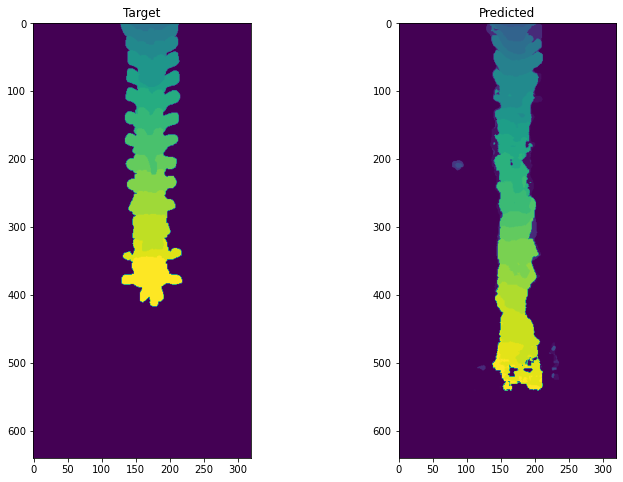

================================================== Training ==================================================
Epoch: 28, Train Loss: 0.4852659739111495, Average Dice Score: 0.4691402582808249
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.09 5: 0.00 6: 0.45 7: 0.41 8: 0.61 9: 0.59 10: 0.66 11: 0.71 12: 0.63 13: 0.56 14: 0.58 15: 0.53 16: 0.62 17: 0.69 18: 0.70 19: 0.65 20: 0.68 21: 0.60 22: 0.55 23: 0.48 24: 0.39 25: 0.03
================================================= Validation =================================================
Epoch: 28, Val Loss: 0.6969409487286552, Average Dice Score: 0.2547159785968344
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.09 5: 0.00 6: 0.45 7: 0.41 8: 0.61 9: 0.59 10: 0.66 11: 0.71 12: 0.63 13: 0.56 14: 0.58 15: 0.53 16: 0.62 17: 0.69 18: 0.70 19: 0.65 20: 0.68 21: 0.60 22: 0.55 23: 0.48 24: 0.39 25: 0.03


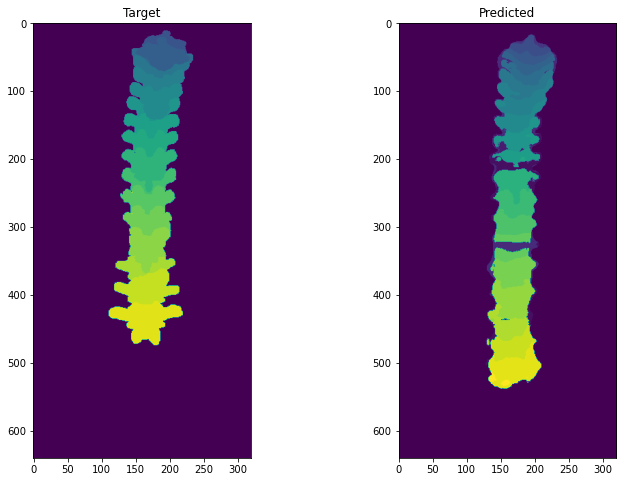

================================================== Training ==================================================
Epoch: 29, Train Loss: 0.48243678946959434, Average Dice Score: 0.4753052045719277
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.11 5: 0.00 6: 0.49 7: 0.43 8: 0.62 9: 0.58 10: 0.66 11: 0.72 12: 0.63 13: 0.57 14: 0.57 15: 0.54 16: 0.62 17: 0.69 18: 0.70 19: 0.65 20: 0.68 21: 0.63 22: 0.57 23: 0.48 24: 0.39 25: 0.03
================================================= Validation =================================================
Epoch: 29, Val Loss: 0.6452568144094749, Average Dice Score: 0.30027828686446867
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.11 5: 0.00 6: 0.49 7: 0.43 8: 0.62 9: 0.58 10: 0.66 11: 0.72 12: 0.63 13: 0.57 14: 0.57 15: 0.54 16: 0.62 17: 0.69 18: 0.70 19: 0.65 20: 0.68 21: 0.63 22: 0.57 23: 0.48 24: 0.39 25: 0.03


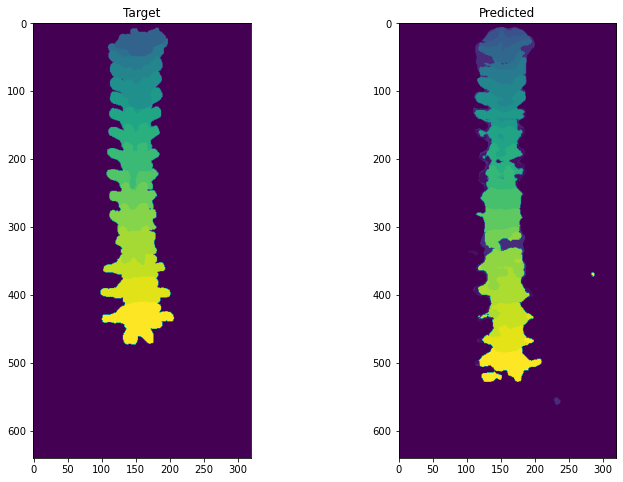

================================================== Training ==================================================
Epoch: 30, Train Loss: 0.4632344795236112, Average Dice Score: 0.49023479566572575
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.11 5: 0.01 6: 0.47 7: 0.43 8: 0.61 9: 0.58 10: 0.69 11: 0.74 12: 0.67 13: 0.60 14: 0.60 15: 0.59 16: 0.66 17: 0.73 18: 0.74 19: 0.67 20: 0.71 21: 0.64 22: 0.60 23: 0.49 24: 0.39 25: 0.04
================================================= Validation =================================================
Epoch: 30, Val Loss: 0.6184394809066273, Average Dice Score: 0.32615764675625425
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.11 5: 0.01 6: 0.47 7: 0.43 8: 0.61 9: 0.58 10: 0.69 11: 0.74 12: 0.67 13: 0.60 14: 0.60 15: 0.59 16: 0.66 17: 0.73 18: 0.74 19: 0.67 20: 0.71 21: 0.64 22: 0.60 23: 0.49 24: 0.39 25: 0.04


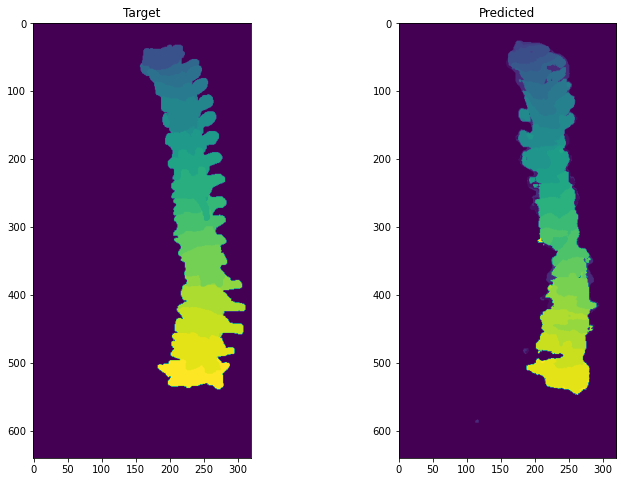

================================================== Training ==================================================
Epoch: 31, Train Loss: 0.45535299854437133, Average Dice Score: 0.5008861070529141
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.08 5: 0.11 6: 0.50 7: 0.44 8: 0.62 9: 0.58 10: 0.69 11: 0.76 12: 0.66 13: 0.60 14: 0.60 15: 0.60 16: 0.68 17: 0.74 18: 0.76 19: 0.67 20: 0.72 21: 0.65 22: 0.62 23: 0.51 24: 0.41 25: 0.05
================================================= Validation =================================================
Epoch: 31, Val Loss: 0.5980657485664868, Average Dice Score: 0.35727403708587857
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.08 5: 0.11 6: 0.50 7: 0.44 8: 0.62 9: 0.58 10: 0.69 11: 0.76 12: 0.66 13: 0.60 14: 0.60 15: 0.60 16: 0.68 17: 0.74 18: 0.76 19: 0.67 20: 0.72 21: 0.65 22: 0.62 23: 0.51 24: 0.41 25: 0.05


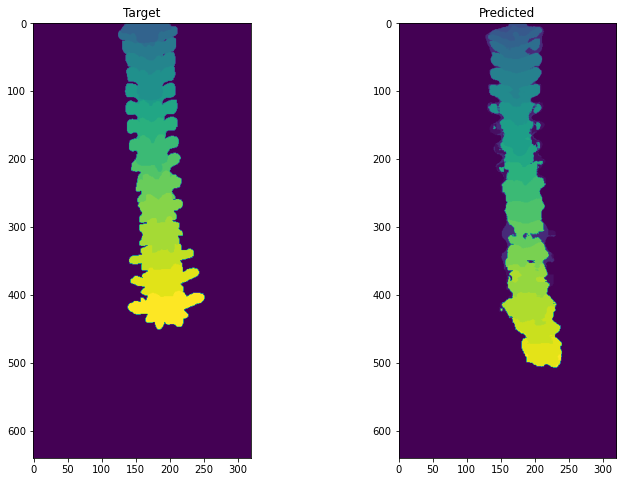

================================================== Training ==================================================
Epoch: 32, Train Loss: 0.45153965505455, Average Dice Score: 0.5073079575354245
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.05 5: 0.22 6: 0.48 7: 0.42 8: 0.63 9: 0.58 10: 0.69 11: 0.75 12: 0.67 13: 0.63 14: 0.61 15: 0.61 16: 0.69 17: 0.75 18: 0.75 19: 0.69 20: 0.74 21: 0.66 22: 0.62 23: 0.51 24: 0.39 25: 0.04
================================================= Validation =================================================
Epoch: 32, Val Loss: 0.5696635236505603, Average Dice Score: 0.3804235871574755
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.05 5: 0.22 6: 0.48 7: 0.42 8: 0.63 9: 0.58 10: 0.69 11: 0.75 12: 0.67 13: 0.63 14: 0.61 15: 0.61 16: 0.69 17: 0.75 18: 0.75 19: 0.69 20: 0.74 21: 0.66 22: 0.62 23: 0.51 24: 0.39 25: 0.04


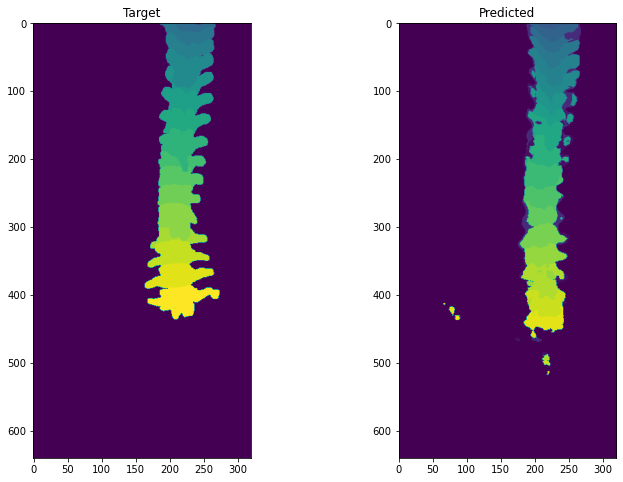

================================================== Training ==================================================
Epoch: 33, Train Loss: 0.4519184810815118, Average Dice Score: 0.5087844734729001
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.09 5: 0.23 6: 0.47 7: 0.43 8: 0.63 9: 0.59 10: 0.70 11: 0.74 12: 0.68 13: 0.61 14: 0.60 15: 0.61 16: 0.68 17: 0.75 18: 0.75 19: 0.68 20: 0.75 21: 0.67 22: 0.64 23: 0.52 24: 0.40 25: 0.04
================================================= Validation =================================================
Epoch: 33, Val Loss: 0.6038309716787494, Average Dice Score: 0.3490756941446263
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.09 5: 0.23 6: 0.47 7: 0.43 8: 0.63 9: 0.59 10: 0.70 11: 0.74 12: 0.68 13: 0.61 14: 0.60 15: 0.61 16: 0.68 17: 0.75 18: 0.75 19: 0.68 20: 0.75 21: 0.67 22: 0.64 23: 0.52 24: 0.40 25: 0.04


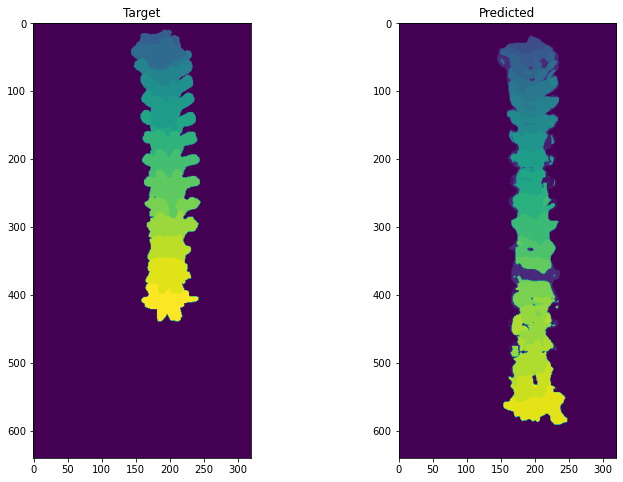

================================================== Training ==================================================
Epoch: 34, Train Loss: 0.44763103077926997, Average Dice Score: 0.5102582092461498
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.09 5: 0.19 6: 0.46 7: 0.44 8: 0.64 9: 0.58 10: 0.70 11: 0.74 12: 0.67 13: 0.63 14: 0.61 15: 0.63 16: 0.70 17: 0.76 18: 0.75 19: 0.69 20: 0.75 21: 0.65 22: 0.63 23: 0.52 24: 0.42 25: 0.03
================================================= Validation =================================================
Epoch: 34, Val Loss: 0.6227968335151672, Average Dice Score: 0.3309729922057795
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.09 5: 0.19 6: 0.46 7: 0.44 8: 0.64 9: 0.58 10: 0.70 11: 0.74 12: 0.67 13: 0.63 14: 0.61 15: 0.63 16: 0.70 17: 0.76 18: 0.75 19: 0.69 20: 0.75 21: 0.65 22: 0.63 23: 0.52 24: 0.42 25: 0.03


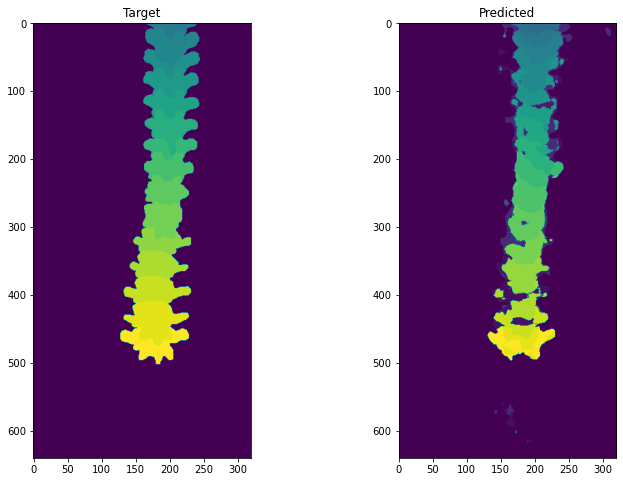

================================================== Training ==================================================
Epoch: 35, Train Loss: 0.44967899781224846, Average Dice Score: 0.512806960175729
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.10 5: 0.22 6: 0.48 7: 0.41 8: 0.65 9: 0.57 10: 0.69 11: 0.74 12: 0.66 13: 0.63 14: 0.61 15: 0.63 16: 0.69 17: 0.75 18: 0.75 19: 0.70 20: 0.75 21: 0.67 22: 0.65 23: 0.53 24: 0.44 25: 0.03
================================================= Validation =================================================
Epoch: 35, Val Loss: 0.6666839611334879, Average Dice Score: 0.2934836452658014
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.10 5: 0.22 6: 0.48 7: 0.41 8: 0.65 9: 0.57 10: 0.69 11: 0.74 12: 0.66 13: 0.63 14: 0.61 15: 0.63 16: 0.69 17: 0.75 18: 0.75 19: 0.70 20: 0.75 21: 0.67 22: 0.65 23: 0.53 24: 0.44 25: 0.03


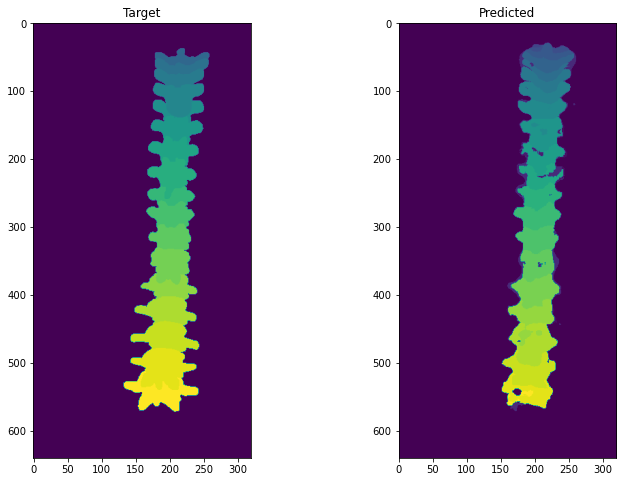

================================================== Training ==================================================
Epoch: 36, Train Loss: 0.4459464656202357, Average Dice Score: 0.5174866153309547
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.12 5: 0.21 6: 0.47 7: 0.41 8: 0.66 9: 0.58 10: 0.70 11: 0.74 12: 0.68 13: 0.64 14: 0.62 15: 0.65 16: 0.70 17: 0.76 18: 0.75 19: 0.71 20: 0.75 21: 0.66 22: 0.66 23: 0.54 24: 0.42 25: 0.04
================================================= Validation =================================================
Epoch: 36, Val Loss: 0.6181491017341614, Average Dice Score: 0.34446533042111277
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.12 5: 0.21 6: 0.47 7: 0.41 8: 0.66 9: 0.58 10: 0.70 11: 0.74 12: 0.68 13: 0.64 14: 0.62 15: 0.65 16: 0.70 17: 0.76 18: 0.75 19: 0.71 20: 0.75 21: 0.66 22: 0.66 23: 0.54 24: 0.42 25: 0.04


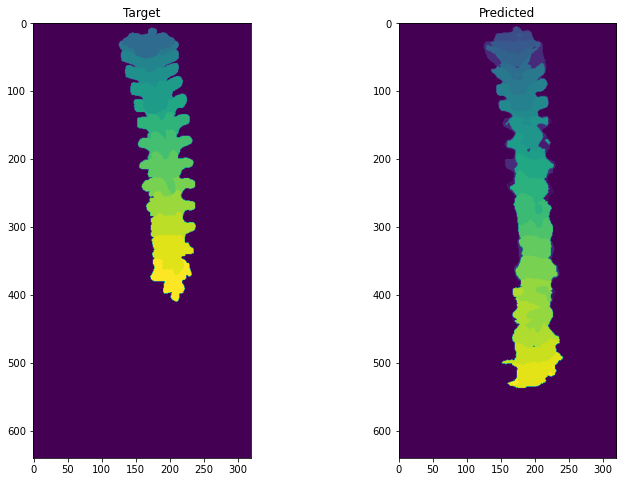

================================================== Training ==================================================
Epoch: 37, Train Loss: 0.43608222070046104, Average Dice Score: 0.523648858736047
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.12 5: 0.18 6: 0.45 7: 0.46 8: 0.66 9: 0.60 10: 0.71 11: 0.75 12: 0.68 13: 0.65 14: 0.64 15: 0.66 16: 0.73 17: 0.77 18: 0.76 19: 0.71 20: 0.77 21: 0.67 22: 0.65 23: 0.53 24: 0.41 25: 0.05
================================================= Validation =================================================
Epoch: 37, Val Loss: 0.6071030927486107, Average Dice Score: 0.3444918995068296
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.12 5: 0.18 6: 0.45 7: 0.46 8: 0.66 9: 0.60 10: 0.71 11: 0.75 12: 0.68 13: 0.65 14: 0.64 15: 0.66 16: 0.73 17: 0.77 18: 0.76 19: 0.71 20: 0.77 21: 0.67 22: 0.65 23: 0.53 24: 0.41 25: 0.05


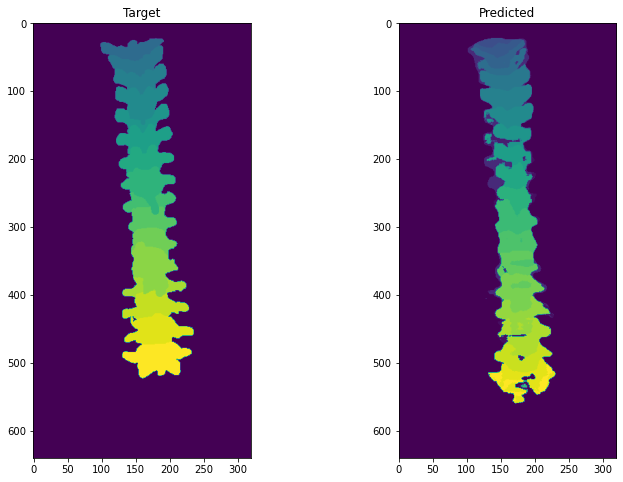

================================================== Training ==================================================
Epoch: 38, Train Loss: 0.43028516568367386, Average Dice Score: 0.531373661068162
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.12 5: 0.21 6: 0.48 7: 0.45 8: 0.65 9: 0.61 10: 0.71 11: 0.76 12: 0.70 13: 0.65 14: 0.65 15: 0.68 16: 0.73 17: 0.79 18: 0.77 19: 0.72 20: 0.78 21: 0.69 22: 0.67 23: 0.55 24: 0.43 25: 0.05
================================================= Validation =================================================
Epoch: 38, Val Loss: 0.5614081494143752, Average Dice Score: 0.4009573079879389
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.12 5: 0.21 6: 0.48 7: 0.45 8: 0.65 9: 0.61 10: 0.71 11: 0.76 12: 0.70 13: 0.65 14: 0.65 15: 0.68 16: 0.73 17: 0.79 18: 0.77 19: 0.72 20: 0.78 21: 0.69 22: 0.67 23: 0.55 24: 0.43 25: 0.05


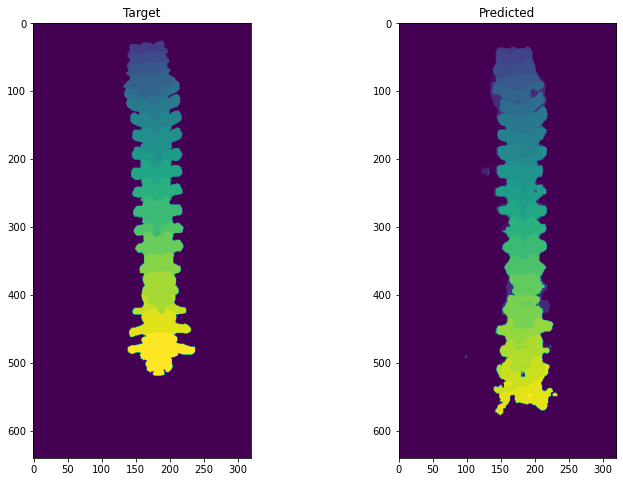

================================================== Training ==================================================
Epoch: 39, Train Loss: 0.4376265191408914, Average Dice Score: 0.529030967376472
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.11 5: 0.25 6: 0.49 7: 0.45 8: 0.67 9: 0.60 10: 0.72 11: 0.74 12: 0.69 13: 0.65 14: 0.65 15: 0.67 16: 0.73 17: 0.77 18: 0.76 19: 0.72 20: 0.78 21: 0.68 22: 0.67 23: 0.53 24: 0.42 25: 0.04
================================================= Validation =================================================
Epoch: 39, Val Loss: 0.624248387383633, Average Dice Score: 0.32810931587346204
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.11 5: 0.25 6: 0.49 7: 0.45 8: 0.67 9: 0.60 10: 0.72 11: 0.74 12: 0.69 13: 0.65 14: 0.65 15: 0.67 16: 0.73 17: 0.77 18: 0.76 19: 0.72 20: 0.78 21: 0.68 22: 0.67 23: 0.53 24: 0.42 25: 0.04


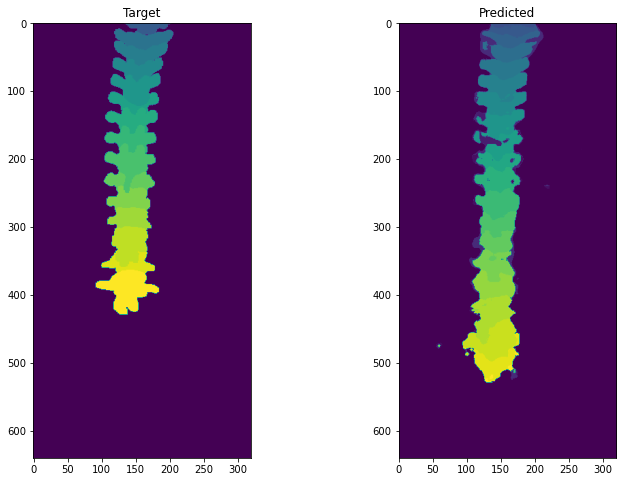

================================================== Training ==================================================
Epoch: 40, Train Loss: 0.4260654081358196, Average Dice Score: 0.5338205817872826
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.12 5: 0.18 6: 0.48 7: 0.45 8: 0.67 9: 0.61 10: 0.72 11: 0.76 12: 0.70 13: 0.67 14: 0.66 15: 0.69 16: 0.76 17: 0.80 18: 0.76 19: 0.74 20: 0.79 21: 0.69 22: 0.67 23: 0.53 24: 0.43 25: 0.04
================================================= Validation =================================================
Epoch: 40, Val Loss: 0.599046456032112, Average Dice Score: 0.35520879178645337
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.12 5: 0.18 6: 0.48 7: 0.45 8: 0.67 9: 0.61 10: 0.72 11: 0.76 12: 0.70 13: 0.67 14: 0.66 15: 0.69 16: 0.76 17: 0.80 18: 0.76 19: 0.74 20: 0.79 21: 0.69 22: 0.67 23: 0.53 24: 0.43 25: 0.04


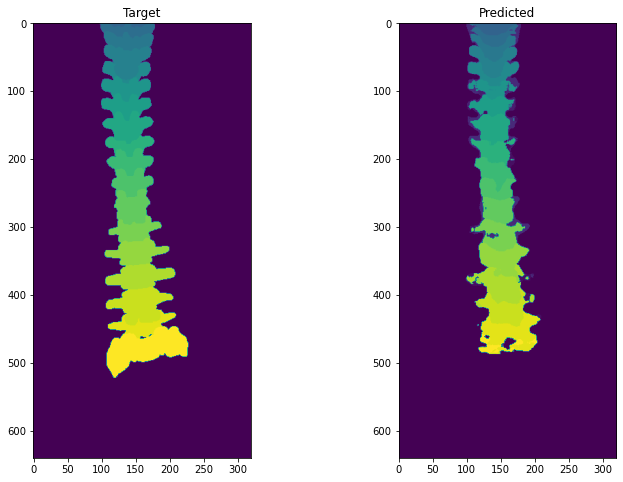

================================================== Training ==================================================
Epoch: 41, Train Loss: 0.4204746692877201, Average Dice Score: 0.5472624530706929
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.16 5: 0.22 6: 0.54 7: 0.45 8: 0.69 9: 0.60 10: 0.71 11: 0.76 12: 0.71 13: 0.68 14: 0.69 15: 0.71 16: 0.76 17: 0.80 18: 0.77 19: 0.74 20: 0.80 21: 0.70 22: 0.70 23: 0.56 24: 0.45 25: 0.04
================================================= Validation =================================================
Epoch: 41, Val Loss: 0.5613361782714968, Average Dice Score: 0.3878907185630426
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.16 5: 0.22 6: 0.54 7: 0.45 8: 0.69 9: 0.60 10: 0.71 11: 0.76 12: 0.71 13: 0.68 14: 0.69 15: 0.71 16: 0.76 17: 0.80 18: 0.77 19: 0.74 20: 0.80 21: 0.70 22: 0.70 23: 0.56 24: 0.45 25: 0.04


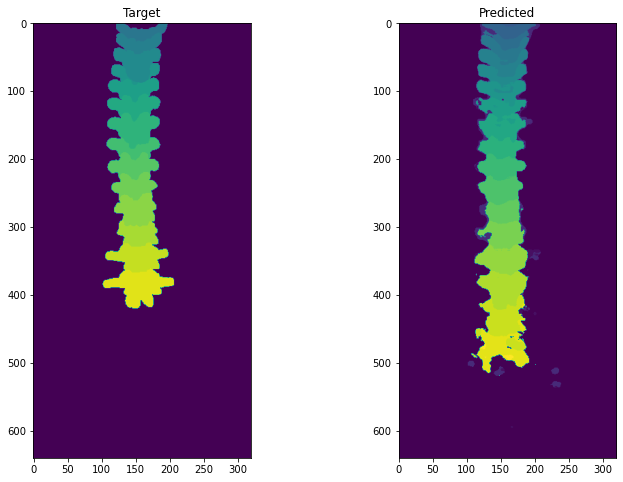

================================================== Training ==================================================
Epoch: 42, Train Loss: 0.4206341305424652, Average Dice Score: 0.5439674599404921
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.16 5: 0.22 6: 0.48 7: 0.44 8: 0.65 9: 0.63 10: 0.72 11: 0.75 12: 0.72 13: 0.69 14: 0.70 15: 0.71 16: 0.77 17: 0.80 18: 0.77 19: 0.74 20: 0.80 21: 0.69 22: 0.69 23: 0.54 24: 0.43 25: 0.05
================================================= Validation =================================================
Epoch: 42, Val Loss: 0.5732586569473391, Average Dice Score: 0.3754230283639014
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.16 5: 0.22 6: 0.48 7: 0.44 8: 0.65 9: 0.63 10: 0.72 11: 0.75 12: 0.72 13: 0.69 14: 0.70 15: 0.71 16: 0.77 17: 0.80 18: 0.77 19: 0.74 20: 0.80 21: 0.69 22: 0.69 23: 0.54 24: 0.43 25: 0.05


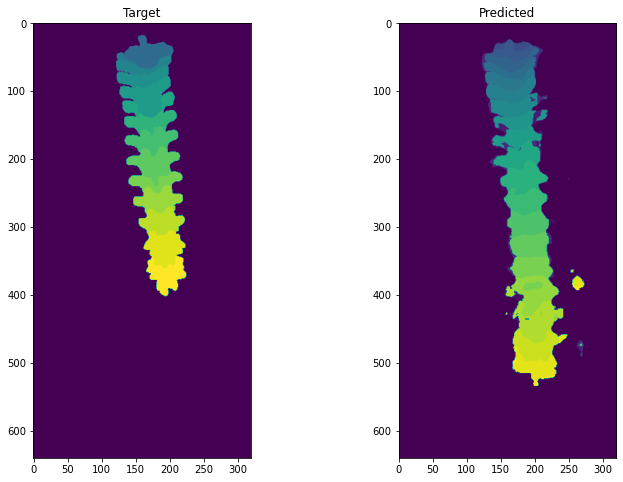

================================================== Training ==================================================
Epoch: 43, Train Loss: 0.421993760909717, Average Dice Score: 0.5417669380369916
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.14 5: 0.22 6: 0.48 7: 0.45 8: 0.68 9: 0.61 10: 0.73 11: 0.75 12: 0.71 13: 0.69 14: 0.68 15: 0.69 16: 0.76 17: 0.80 18: 0.76 19: 0.75 20: 0.80 21: 0.68 22: 0.68 23: 0.55 24: 0.45 25: 0.04
================================================= Validation =================================================
Epoch: 43, Val Loss: 0.658541377450599, Average Dice Score: 0.31172306336378924
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.14 5: 0.22 6: 0.48 7: 0.45 8: 0.68 9: 0.61 10: 0.73 11: 0.75 12: 0.71 13: 0.69 14: 0.68 15: 0.69 16: 0.76 17: 0.80 18: 0.76 19: 0.75 20: 0.80 21: 0.68 22: 0.68 23: 0.55 24: 0.45 25: 0.04


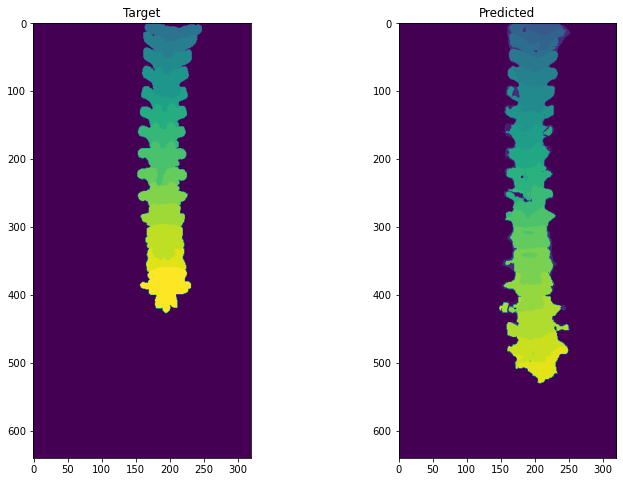

================================================== Training ==================================================
Epoch: 44, Train Loss: 0.4304783825636476, Average Dice Score: 0.5387532261384896
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.14 5: 0.23 6: 0.50 7: 0.47 8: 0.66 9: 0.64 10: 0.71 11: 0.73 12: 0.69 13: 0.69 14: 0.66 15: 0.68 16: 0.75 17: 0.78 18: 0.76 19: 0.74 20: 0.79 21: 0.70 22: 0.67 23: 0.55 24: 0.45 25: 0.04
================================================= Validation =================================================
Epoch: 44, Val Loss: 0.5683234431704537, Average Dice Score: 0.3951727150715079
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.14 5: 0.23 6: 0.50 7: 0.47 8: 0.66 9: 0.64 10: 0.71 11: 0.73 12: 0.69 13: 0.69 14: 0.66 15: 0.68 16: 0.75 17: 0.78 18: 0.76 19: 0.74 20: 0.79 21: 0.70 22: 0.67 23: 0.55 24: 0.45 25: 0.04


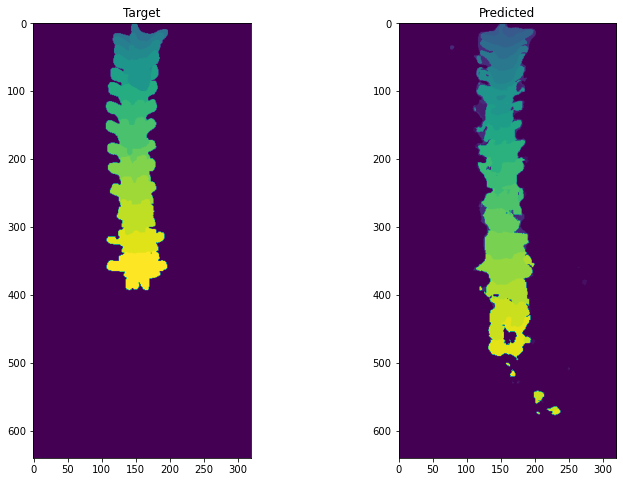

================================================== Training ==================================================
Epoch: 45, Train Loss: 0.422777463591297, Average Dice Score: 0.5416391817210038
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.15 5: 0.22 6: 0.47 7: 0.45 8: 0.68 9: 0.62 10: 0.72 11: 0.73 12: 0.70 13: 0.70 14: 0.67 15: 0.70 16: 0.75 17: 0.80 18: 0.76 19: 0.75 20: 0.80 21: 0.70 22: 0.68 23: 0.55 24: 0.46 25: 0.03
================================================= Validation =================================================
Epoch: 45, Val Loss: 0.5779726749560872, Average Dice Score: 0.3776760602364982
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.15 5: 0.22 6: 0.47 7: 0.45 8: 0.68 9: 0.62 10: 0.72 11: 0.73 12: 0.70 13: 0.70 14: 0.67 15: 0.70 16: 0.75 17: 0.80 18: 0.76 19: 0.75 20: 0.80 21: 0.70 22: 0.68 23: 0.55 24: 0.46 25: 0.03


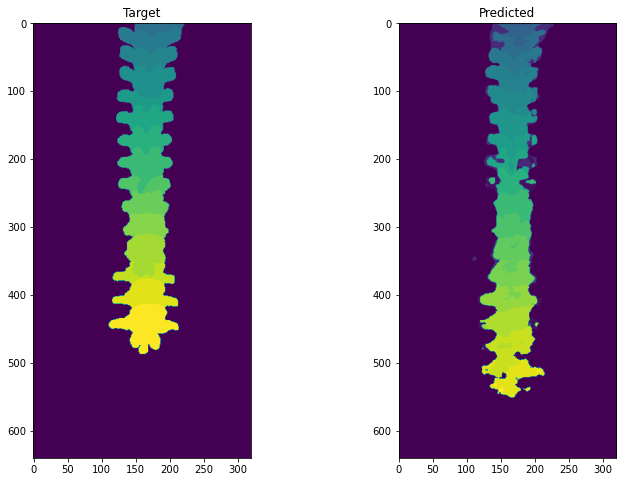

================================================== Training ==================================================
Epoch: 46, Train Loss: 0.42641318099232584, Average Dice Score: 0.5433735936851852
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.18 5: 0.25 6: 0.51 7: 0.45 8: 0.68 9: 0.63 10: 0.71 11: 0.74 12: 0.70 13: 0.68 14: 0.68 15: 0.70 16: 0.75 17: 0.79 18: 0.77 19: 0.75 20: 0.79 21: 0.69 22: 0.69 23: 0.54 24: 0.44 25: 0.03
================================================= Validation =================================================
Epoch: 46, Val Loss: 0.6231833872247915, Average Dice Score: 0.33358989851501475
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.18 5: 0.25 6: 0.51 7: 0.45 8: 0.68 9: 0.63 10: 0.71 11: 0.74 12: 0.70 13: 0.68 14: 0.68 15: 0.70 16: 0.75 17: 0.79 18: 0.77 19: 0.75 20: 0.79 21: 0.69 22: 0.69 23: 0.54 24: 0.44 25: 0.03


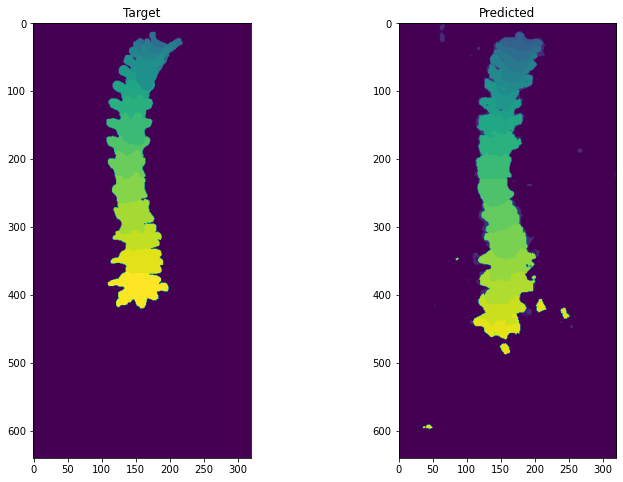

================================================== Training ==================================================
Epoch: 47, Train Loss: 0.41471058965578783, Average Dice Score: 0.5533074031069919
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.19 5: 0.25 6: 0.52 7: 0.45 8: 0.68 9: 0.63 10: 0.72 11: 0.76 12: 0.72 13: 0.70 14: 0.70 15: 0.72 16: 0.77 17: 0.81 18: 0.77 19: 0.77 20: 0.80 21: 0.70 22: 0.71 23: 0.54 24: 0.44 25: 0.03
================================================= Validation =================================================
Epoch: 47, Val Loss: 0.5490984359725577, Average Dice Score: 0.4092634651215039
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.19 5: 0.25 6: 0.52 7: 0.45 8: 0.68 9: 0.63 10: 0.72 11: 0.76 12: 0.72 13: 0.70 14: 0.70 15: 0.72 16: 0.77 17: 0.81 18: 0.77 19: 0.77 20: 0.80 21: 0.70 22: 0.71 23: 0.54 24: 0.44 25: 0.03


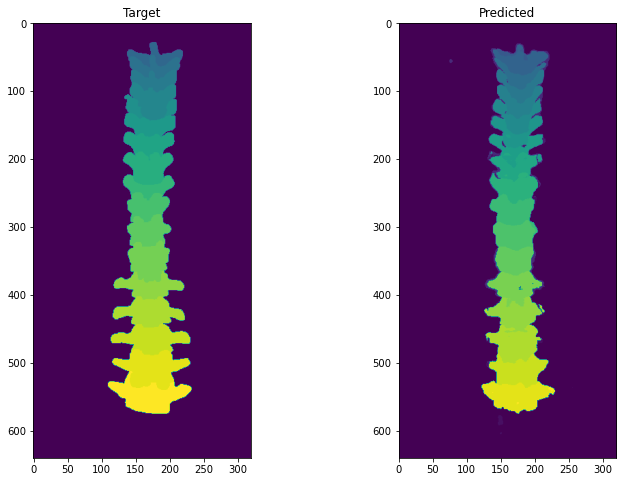

================================================== Training ==================================================
Epoch: 48, Train Loss: 0.4068538689556711, Average Dice Score: 0.5610381900901957
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.17 5: 0.27 6: 0.47 7: 0.47 8: 0.68 9: 0.64 10: 0.73 11: 0.77 12: 0.73 13: 0.73 14: 0.72 15: 0.73 16: 0.80 17: 0.82 18: 0.77 19: 0.77 20: 0.82 21: 0.71 22: 0.71 23: 0.58 24: 0.48 25: 0.03
================================================= Validation =================================================
Epoch: 48, Val Loss: 0.5881593051503916, Average Dice Score: 0.36935839590422054
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.17 5: 0.27 6: 0.47 7: 0.47 8: 0.68 9: 0.64 10: 0.73 11: 0.77 12: 0.73 13: 0.73 14: 0.72 15: 0.73 16: 0.80 17: 0.82 18: 0.77 19: 0.77 20: 0.82 21: 0.71 22: 0.71 23: 0.58 24: 0.48 25: 0.03


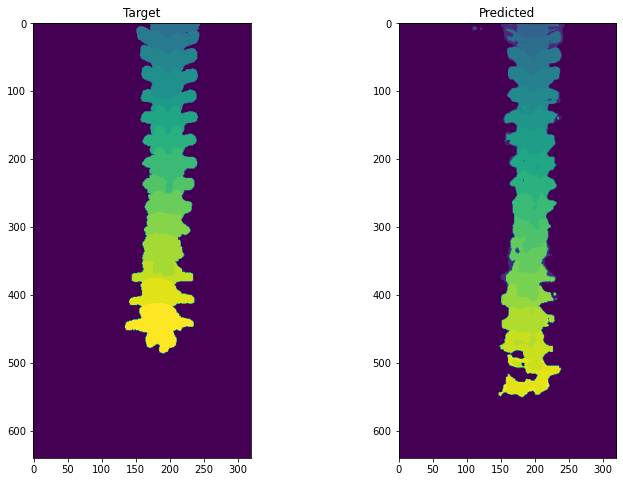

================================================== Training ==================================================
Epoch: 49, Train Loss: 0.4044256220237659, Average Dice Score: 0.5676484445057619
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.20 5: 0.33 6: 0.51 7: 0.47 8: 0.69 9: 0.65 10: 0.74 11: 0.76 12: 0.74 13: 0.74 14: 0.73 15: 0.74 16: 0.80 17: 0.82 18: 0.77 19: 0.78 20: 0.82 21: 0.70 22: 0.72 23: 0.55 24: 0.46 25: 0.03
================================================= Validation =================================================
Epoch: 49, Val Loss: 0.5393193667052222, Average Dice Score: 0.4176485164695422
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.20 5: 0.33 6: 0.51 7: 0.47 8: 0.69 9: 0.65 10: 0.74 11: 0.76 12: 0.74 13: 0.74 14: 0.73 15: 0.74 16: 0.80 17: 0.82 18: 0.77 19: 0.78 20: 0.82 21: 0.70 22: 0.72 23: 0.55 24: 0.46 25: 0.03


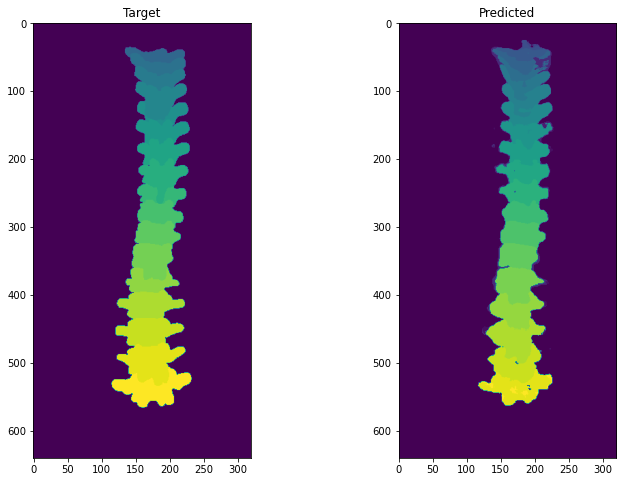

================================================== Training ==================================================
Epoch: 50, Train Loss: 0.4002020139592277, Average Dice Score: 0.5686217705181112
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.17 5: 0.24 6: 0.52 7: 0.46 8: 0.69 9: 0.64 10: 0.73 11: 0.77 12: 0.76 13: 0.75 14: 0.74 15: 0.75 16: 0.81 17: 0.83 18: 0.78 19: 0.78 20: 0.82 21: 0.71 22: 0.73 23: 0.58 24: 0.48 25: 0.05
================================================= Validation =================================================
Epoch: 50, Val Loss: 0.5499107603166924, Average Dice Score: 0.41535727517725635
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.17 5: 0.24 6: 0.52 7: 0.46 8: 0.69 9: 0.64 10: 0.73 11: 0.77 12: 0.76 13: 0.75 14: 0.74 15: 0.75 16: 0.81 17: 0.83 18: 0.78 19: 0.78 20: 0.82 21: 0.71 22: 0.73 23: 0.58 24: 0.48 25: 0.05


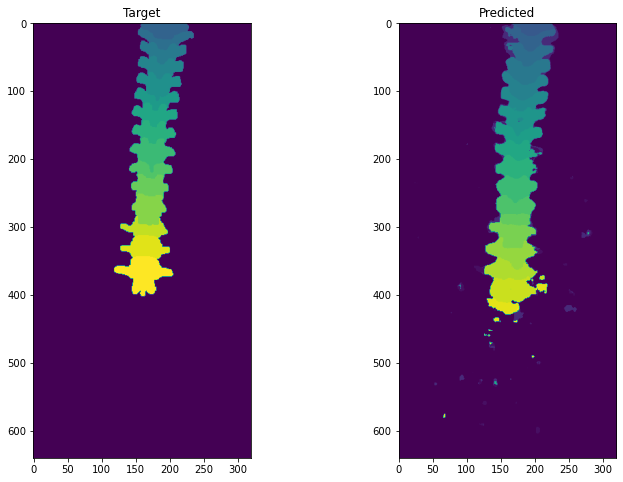

================================================== Training ==================================================
Epoch: 51, Train Loss: 0.39808796080727477, Average Dice Score: 0.5713748788803417
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.19 5: 0.24 6: 0.54 7: 0.49 8: 0.70 9: 0.66 10: 0.74 11: 0.78 12: 0.76 13: 0.76 14: 0.74 15: 0.76 16: 0.82 17: 0.84 18: 0.77 19: 0.76 20: 0.82 21: 0.72 22: 0.73 23: 0.56 24: 0.47 25: 0.03
================================================= Validation =================================================
Epoch: 51, Val Loss: 0.5620018634639803, Average Dice Score: 0.3960942375459263
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.19 5: 0.24 6: 0.54 7: 0.49 8: 0.70 9: 0.66 10: 0.74 11: 0.78 12: 0.76 13: 0.76 14: 0.74 15: 0.76 16: 0.82 17: 0.84 18: 0.77 19: 0.76 20: 0.82 21: 0.72 22: 0.73 23: 0.56 24: 0.47 25: 0.03


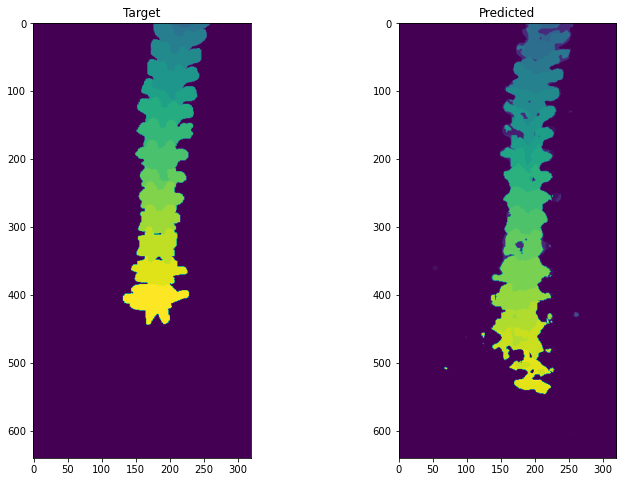

================================================== Training ==================================================
Epoch: 52, Train Loss: 0.39896173049605094, Average Dice Score: 0.567832173518013
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.18 5: 0.25 6: 0.48 7: 0.49 8: 0.69 9: 0.65 10: 0.74 11: 0.77 12: 0.75 13: 0.75 14: 0.75 15: 0.76 16: 0.81 17: 0.84 18: 0.77 19: 0.79 20: 0.83 21: 0.71 22: 0.71 23: 0.55 24: 0.46 25: 0.05
================================================= Validation =================================================
Epoch: 52, Val Loss: 0.5982147914464356, Average Dice Score: 0.3495957977651343
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.18 5: 0.25 6: 0.48 7: 0.49 8: 0.69 9: 0.65 10: 0.74 11: 0.77 12: 0.75 13: 0.75 14: 0.75 15: 0.76 16: 0.81 17: 0.84 18: 0.77 19: 0.79 20: 0.83 21: 0.71 22: 0.71 23: 0.55 24: 0.46 25: 0.05


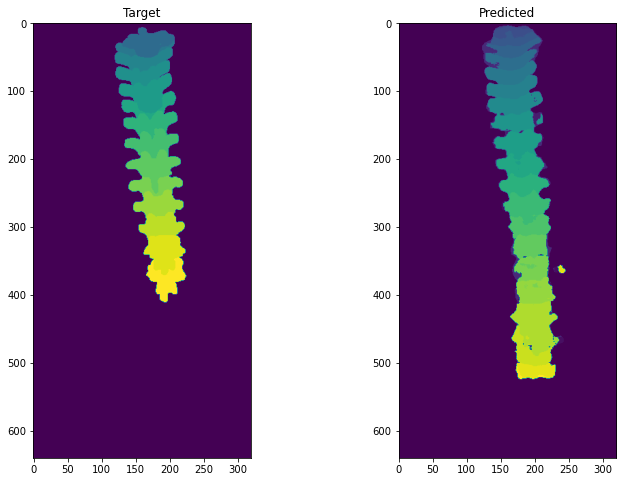

================================================== Training ==================================================
Epoch: 53, Train Loss: 0.41600233344737253, Average Dice Score: 0.548354003719134
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.13 5: 0.23 6: 0.45 7: 0.47 8: 0.69 9: 0.62 10: 0.71 11: 0.75 12: 0.72 13: 0.70 14: 0.72 15: 0.72 16: 0.78 17: 0.82 18: 0.75 19: 0.78 20: 0.80 21: 0.69 22: 0.70 23: 0.55 24: 0.45 25: 0.04
================================================= Validation =================================================
Epoch: 53, Val Loss: 0.5851982489961093, Average Dice Score: 0.36494188011214196
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.13 5: 0.23 6: 0.45 7: 0.47 8: 0.69 9: 0.62 10: 0.71 11: 0.75 12: 0.72 13: 0.70 14: 0.72 15: 0.72 16: 0.78 17: 0.82 18: 0.75 19: 0.78 20: 0.80 21: 0.69 22: 0.70 23: 0.55 24: 0.45 25: 0.04


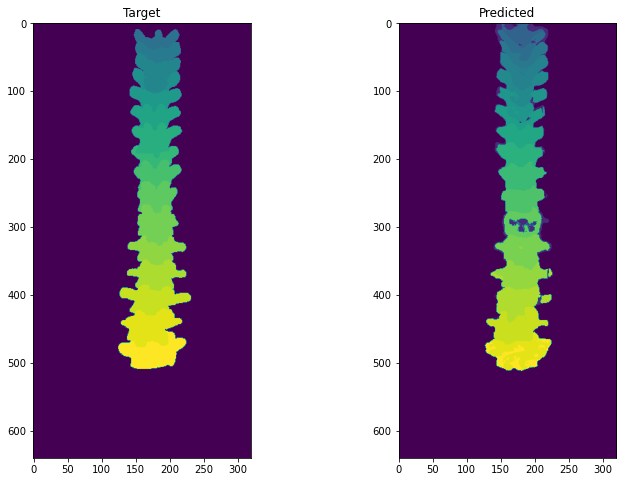

================================================== Training ==================================================
Epoch: 54, Train Loss: 0.40814383593421083, Average Dice Score: 0.5564539912350832
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.13 5: 0.20 6: 0.49 7: 0.45 8: 0.67 9: 0.65 10: 0.73 11: 0.76 12: 0.74 13: 0.71 14: 0.73 15: 0.73 16: 0.79 17: 0.82 18: 0.78 19: 0.77 20: 0.82 21: 0.71 22: 0.72 23: 0.58 24: 0.46 25: 0.06
================================================= Validation =================================================
Epoch: 54, Val Loss: 0.5660633904034974, Average Dice Score: 0.38879548708073197
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.13 5: 0.20 6: 0.49 7: 0.45 8: 0.67 9: 0.65 10: 0.73 11: 0.76 12: 0.74 13: 0.71 14: 0.73 15: 0.73 16: 0.79 17: 0.82 18: 0.78 19: 0.77 20: 0.82 21: 0.71 22: 0.72 23: 0.58 24: 0.46 25: 0.06


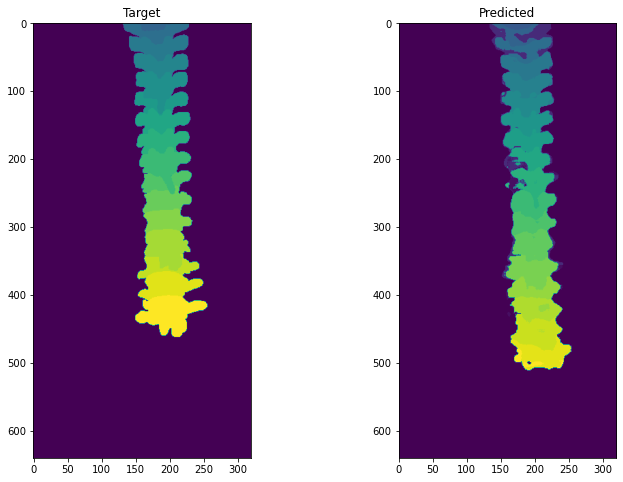

================================================== Training ==================================================
Epoch: 55, Train Loss: 0.40408472012454144, Average Dice Score: 0.5614985326401396
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.13 5: 0.24 6: 0.46 7: 0.48 8: 0.69 9: 0.66 10: 0.73 11: 0.77 12: 0.74 13: 0.74 14: 0.74 15: 0.74 16: 0.80 17: 0.84 18: 0.78 19: 0.77 20: 0.82 21: 0.71 22: 0.72 23: 0.56 24: 0.46 25: 0.07
================================================= Validation =================================================
Epoch: 55, Val Loss: 0.5740404637133489, Average Dice Score: 0.3893010250854747
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.13 5: 0.24 6: 0.46 7: 0.48 8: 0.69 9: 0.66 10: 0.73 11: 0.77 12: 0.74 13: 0.74 14: 0.74 15: 0.74 16: 0.80 17: 0.84 18: 0.78 19: 0.77 20: 0.82 21: 0.71 22: 0.72 23: 0.56 24: 0.46 25: 0.07


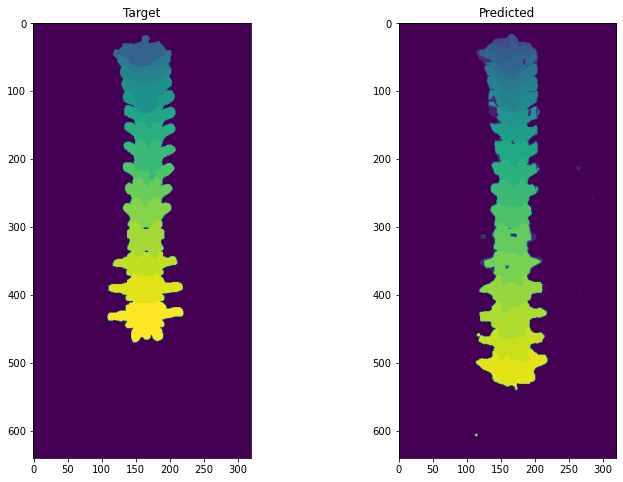

================================================== Training ==================================================
Epoch: 56, Train Loss: 0.4000537539887598, Average Dice Score: 0.5675345864808788
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.15 5: 0.25 6: 0.49 7: 0.50 8: 0.70 9: 0.65 10: 0.73 11: 0.78 12: 0.74 13: 0.73 14: 0.74 15: 0.74 16: 0.80 17: 0.85 18: 0.78 19: 0.78 20: 0.83 21: 0.71 22: 0.74 23: 0.57 24: 0.45 25: 0.07
================================================= Validation =================================================
Epoch: 56, Val Loss: 0.5613460452830206, Average Dice Score: 0.4045879275749848
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.15 5: 0.25 6: 0.49 7: 0.50 8: 0.70 9: 0.65 10: 0.73 11: 0.78 12: 0.74 13: 0.73 14: 0.74 15: 0.74 16: 0.80 17: 0.85 18: 0.78 19: 0.78 20: 0.83 21: 0.71 22: 0.74 23: 0.57 24: 0.45 25: 0.07


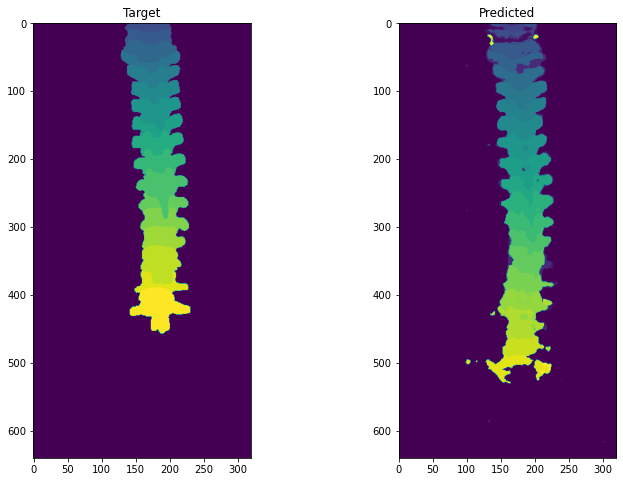

================================================== Training ==================================================
Epoch: 57, Train Loss: 0.39621103107221334, Average Dice Score: 0.5720231954193926
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.17 5: 0.27 6: 0.51 7: 0.50 8: 0.69 9: 0.66 10: 0.74 11: 0.77 12: 0.76 13: 0.74 14: 0.75 15: 0.75 16: 0.82 17: 0.85 18: 0.78 19: 0.79 20: 0.83 21: 0.72 22: 0.72 23: 0.57 24: 0.45 25: 0.06
================================================= Validation =================================================
Epoch: 57, Val Loss: 0.5561201269509363, Average Dice Score: 0.41205366125464377
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.17 5: 0.27 6: 0.51 7: 0.50 8: 0.69 9: 0.66 10: 0.74 11: 0.77 12: 0.76 13: 0.74 14: 0.75 15: 0.75 16: 0.82 17: 0.85 18: 0.78 19: 0.79 20: 0.83 21: 0.72 22: 0.72 23: 0.57 24: 0.45 25: 0.06


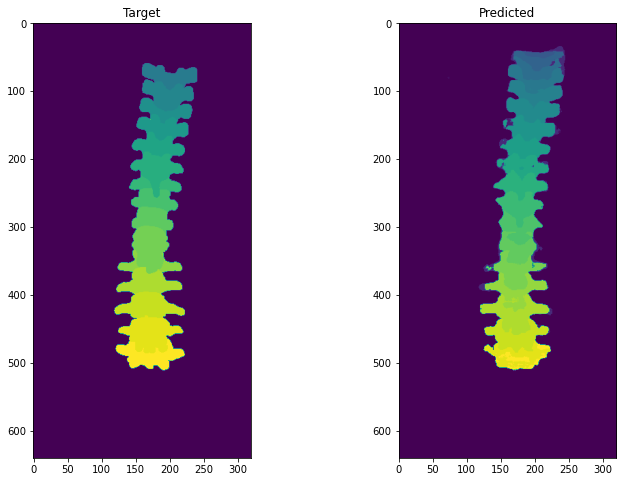

================================================== Training ==================================================
Epoch: 58, Train Loss: 0.3959243212629667, Average Dice Score: 0.5674177768857417
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.09 5: 0.30 6: 0.44 7: 0.48 8: 0.67 9: 0.65 10: 0.73 11: 0.78 12: 0.76 13: 0.74 14: 0.76 15: 0.76 16: 0.82 17: 0.85 18: 0.78 19: 0.79 20: 0.83 21: 0.71 22: 0.75 23: 0.59 24: 0.43 25: 0.07
================================================= Validation =================================================
Epoch: 58, Val Loss: 0.565362461277696, Average Dice Score: 0.39702730235932
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.09 5: 0.30 6: 0.44 7: 0.48 8: 0.67 9: 0.65 10: 0.73 11: 0.78 12: 0.76 13: 0.74 14: 0.76 15: 0.76 16: 0.82 17: 0.85 18: 0.78 19: 0.79 20: 0.83 21: 0.71 22: 0.75 23: 0.59 24: 0.43 25: 0.07


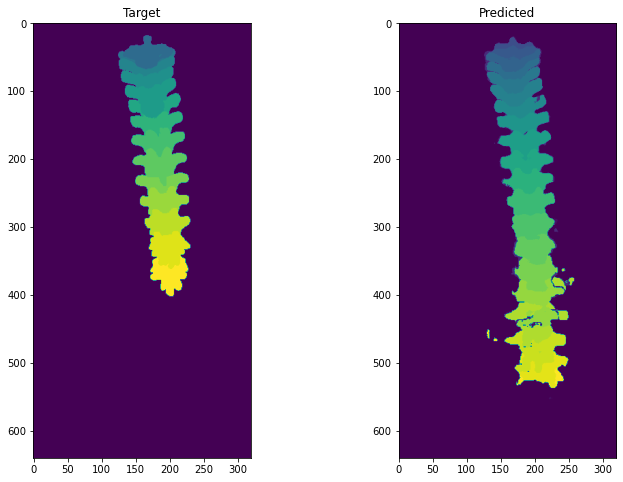

================================================== Training ==================================================
Epoch: 59, Train Loss: 0.3918624748243572, Average Dice Score: 0.5717596607899925
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.11 5: 0.32 6: 0.44 7: 0.50 8: 0.70 9: 0.68 10: 0.73 11: 0.77 12: 0.76 13: 0.75 14: 0.78 15: 0.75 16: 0.82 17: 0.85 18: 0.78 19: 0.80 20: 0.84 21: 0.71 22: 0.73 23: 0.58 24: 0.42 25: 0.06
================================================= Validation =================================================
Epoch: 59, Val Loss: 0.5541111035425155, Average Dice Score: 0.4005931595821706
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.11 5: 0.32 6: 0.44 7: 0.50 8: 0.70 9: 0.68 10: 0.73 11: 0.77 12: 0.76 13: 0.75 14: 0.78 15: 0.75 16: 0.82 17: 0.85 18: 0.78 19: 0.80 20: 0.84 21: 0.71 22: 0.73 23: 0.58 24: 0.42 25: 0.06


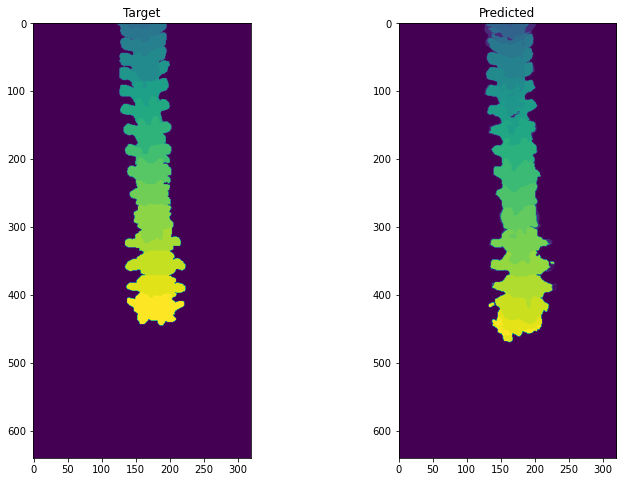

================================================== Training ==================================================
Epoch: 60, Train Loss: 0.389222295578755, Average Dice Score: 0.5744086676621114
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.09 5: 0.29 6: 0.43 7: 0.50 8: 0.70 9: 0.68 10: 0.73 11: 0.79 12: 0.77 13: 0.75 14: 0.77 15: 0.76 16: 0.83 17: 0.86 18: 0.78 19: 0.80 20: 0.84 21: 0.72 22: 0.76 23: 0.60 24: 0.42 25: 0.06
================================================= Validation =================================================
Epoch: 60, Val Loss: 0.5647576656497892, Average Dice Score: 0.4023053127300828
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.09 5: 0.29 6: 0.43 7: 0.50 8: 0.70 9: 0.68 10: 0.73 11: 0.79 12: 0.77 13: 0.75 14: 0.77 15: 0.76 16: 0.83 17: 0.86 18: 0.78 19: 0.80 20: 0.84 21: 0.72 22: 0.76 23: 0.60 24: 0.42 25: 0.06


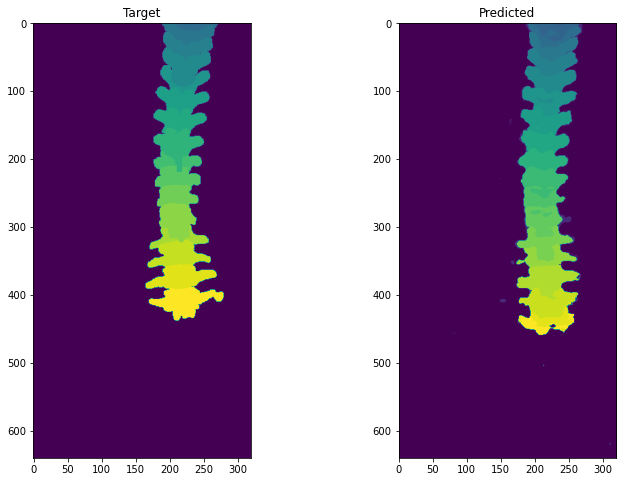

================================================== Training ==================================================
Epoch: 61, Train Loss: 0.38868898549725495, Average Dice Score: 0.5774114939867578
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.15 5: 0.28 6: 0.46 7: 0.50 8: 0.72 9: 0.67 10: 0.74 11: 0.78 12: 0.78 13: 0.75 14: 0.78 15: 0.77 16: 0.83 17: 0.87 18: 0.78 19: 0.81 20: 0.84 21: 0.72 22: 0.75 23: 0.59 24: 0.41 25: 0.07
================================================= Validation =================================================
Epoch: 61, Val Loss: 0.5488298779628316, Average Dice Score: 0.42059112822814076
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.15 5: 0.28 6: 0.46 7: 0.50 8: 0.72 9: 0.67 10: 0.74 11: 0.78 12: 0.78 13: 0.75 14: 0.78 15: 0.77 16: 0.83 17: 0.87 18: 0.78 19: 0.81 20: 0.84 21: 0.72 22: 0.75 23: 0.59 24: 0.41 25: 0.07


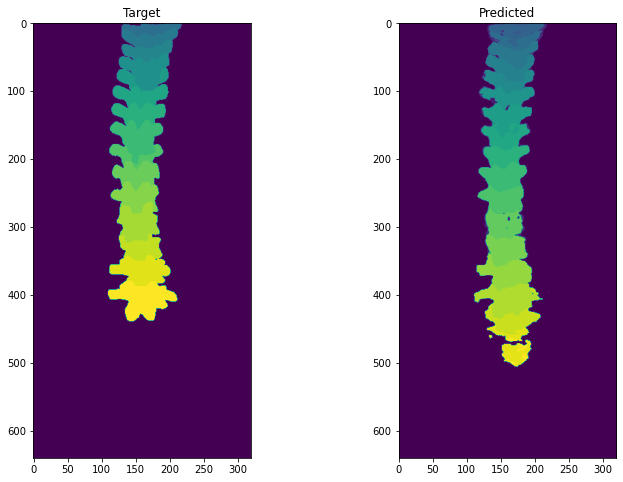

================================================== Training ==================================================
Epoch: 62, Train Loss: 0.386351204258246, Average Dice Score: 0.5798984713170461
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.13 5: 0.25 6: 0.50 7: 0.49 8: 0.71 9: 0.68 10: 0.73 11: 0.77 12: 0.78 13: 0.76 14: 0.78 15: 0.77 16: 0.83 17: 0.87 18: 0.78 19: 0.81 20: 0.85 21: 0.73 22: 0.76 23: 0.59 24: 0.47 25: 0.05
================================================= Validation =================================================
Epoch: 62, Val Loss: 0.5389724627870028, Average Dice Score: 0.40403875812807183
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.13 5: 0.25 6: 0.50 7: 0.49 8: 0.71 9: 0.68 10: 0.73 11: 0.77 12: 0.78 13: 0.76 14: 0.78 15: 0.77 16: 0.83 17: 0.87 18: 0.78 19: 0.81 20: 0.85 21: 0.73 22: 0.76 23: 0.59 24: 0.47 25: 0.05


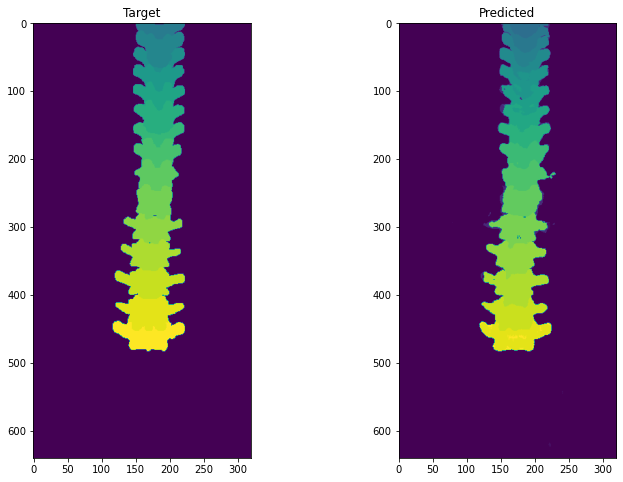

================================================== Training ==================================================
Epoch: 63, Train Loss: 0.38488116117101384, Average Dice Score: 0.5821513006089089
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.12 5: 0.28 6: 0.52 7: 0.49 8: 0.70 9: 0.65 10: 0.74 11: 0.78 12: 0.79 13: 0.75 14: 0.78 15: 0.78 16: 0.83 17: 0.87 18: 0.77 19: 0.81 20: 0.84 21: 0.74 22: 0.76 23: 0.60 24: 0.48 25: 0.05
================================================= Validation =================================================
Epoch: 63, Val Loss: 0.5447154269843805, Average Dice Score: 0.4027807899658548
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.12 5: 0.28 6: 0.52 7: 0.49 8: 0.70 9: 0.65 10: 0.74 11: 0.78 12: 0.79 13: 0.75 14: 0.78 15: 0.78 16: 0.83 17: 0.87 18: 0.77 19: 0.81 20: 0.84 21: 0.74 22: 0.76 23: 0.60 24: 0.48 25: 0.05


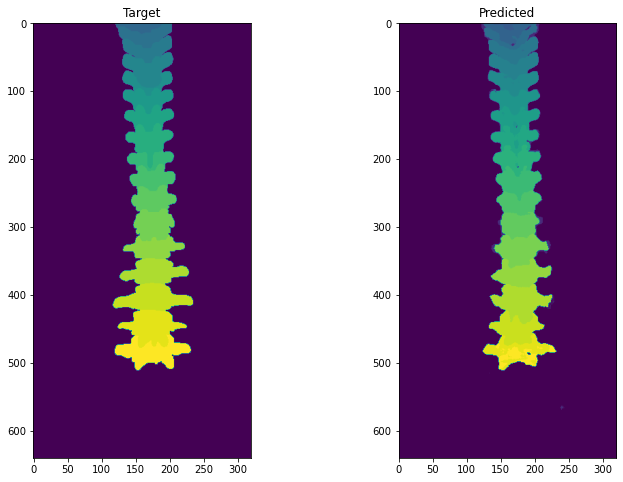

================================================== Training ==================================================
Epoch: 64, Train Loss: 0.38535284996032715, Average Dice Score: 0.5793966557395208
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.10 5: 0.26 6: 0.50 7: 0.47 8: 0.71 9: 0.67 10: 0.73 11: 0.78 12: 0.79 13: 0.75 14: 0.79 15: 0.78 16: 0.83 17: 0.87 18: 0.77 19: 0.81 20: 0.85 21: 0.73 22: 0.76 23: 0.59 24: 0.49 25: 0.04
================================================= Validation =================================================
Epoch: 64, Val Loss: 0.5446181238674727, Average Dice Score: 0.41828747860785925
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.10 5: 0.26 6: 0.50 7: 0.47 8: 0.71 9: 0.67 10: 0.73 11: 0.78 12: 0.79 13: 0.75 14: 0.79 15: 0.78 16: 0.83 17: 0.87 18: 0.77 19: 0.81 20: 0.85 21: 0.73 22: 0.76 23: 0.59 24: 0.49 25: 0.04


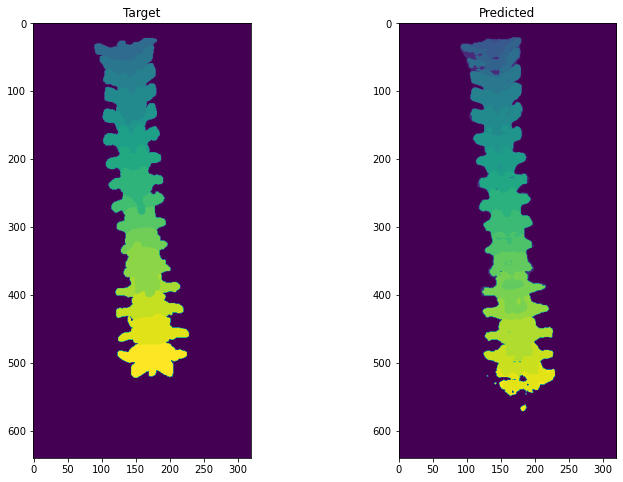

================================================== Training ==================================================
Epoch: 65, Train Loss: 0.3824522903016514, Average Dice Score: 0.5836753009518161
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.12 5: 0.31 6: 0.52 7: 0.49 8: 0.72 9: 0.68 10: 0.74 11: 0.78 12: 0.79 13: 0.75 14: 0.80 15: 0.78 16: 0.84 17: 0.87 18: 0.77 19: 0.82 20: 0.85 21: 0.73 22: 0.77 23: 0.60 24: 0.46 25: 0.04
================================================= Validation =================================================
Epoch: 65, Val Loss: 0.5364246612689534, Average Dice Score: 0.4284417040749584
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.12 5: 0.31 6: 0.52 7: 0.49 8: 0.72 9: 0.68 10: 0.74 11: 0.78 12: 0.79 13: 0.75 14: 0.80 15: 0.78 16: 0.84 17: 0.87 18: 0.77 19: 0.82 20: 0.85 21: 0.73 22: 0.77 23: 0.60 24: 0.46 25: 0.04


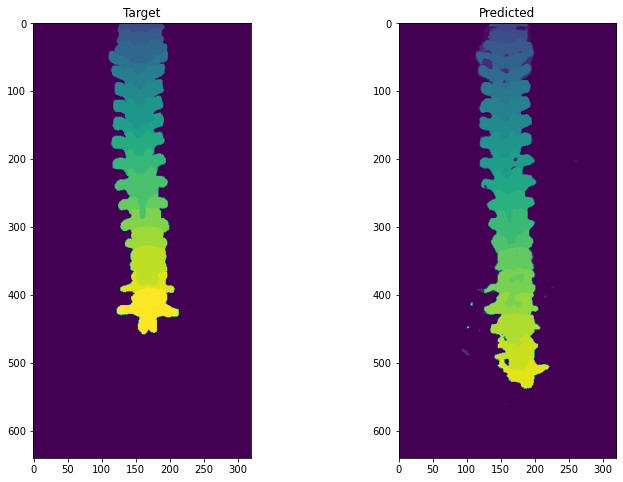

================================================== Training ==================================================
Epoch: 66, Train Loss: 0.3807869831060287, Average Dice Score: 0.5857978182834805
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.12 5: 0.30 6: 0.52 7: 0.50 8: 0.73 9: 0.68 10: 0.73 11: 0.79 12: 0.80 13: 0.76 14: 0.80 15: 0.78 16: 0.84 17: 0.87 18: 0.77 19: 0.82 20: 0.85 21: 0.73 22: 0.75 23: 0.59 24: 0.48 25: 0.03
================================================= Validation =================================================
Epoch: 66, Val Loss: 0.5754462226492459, Average Dice Score: 0.38323176049825564
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.12 5: 0.30 6: 0.52 7: 0.50 8: 0.73 9: 0.68 10: 0.73 11: 0.79 12: 0.80 13: 0.76 14: 0.80 15: 0.78 16: 0.84 17: 0.87 18: 0.77 19: 0.82 20: 0.85 21: 0.73 22: 0.75 23: 0.59 24: 0.48 25: 0.03


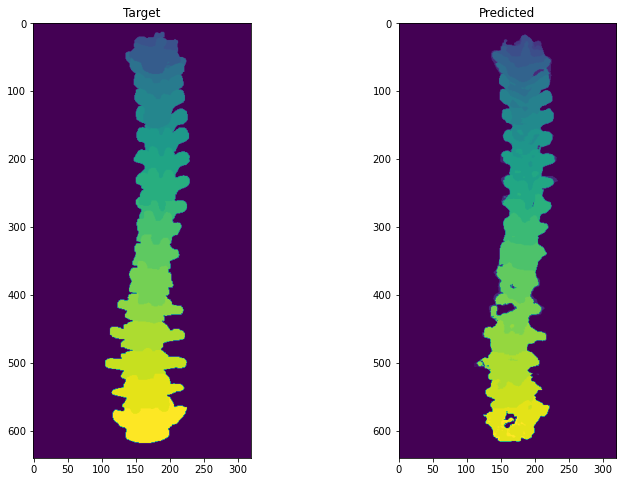

================================================== Training ==================================================
Epoch: 67, Train Loss: 0.3971374081602572, Average Dice Score: 0.5584161310981756
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.12 5: 0.11 6: 0.37 7: 0.42 8: 0.69 9: 0.65 10: 0.71 11: 0.78 12: 0.78 13: 0.74 14: 0.78 15: 0.76 16: 0.82 17: 0.85 18: 0.78 19: 0.79 20: 0.84 21: 0.71 22: 0.75 23: 0.59 24: 0.47 25: 0.03
================================================= Validation =================================================
Epoch: 67, Val Loss: 0.5606322865017125, Average Dice Score: 0.40004857866399146
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.12 5: 0.11 6: 0.37 7: 0.42 8: 0.69 9: 0.65 10: 0.71 11: 0.78 12: 0.78 13: 0.74 14: 0.78 15: 0.76 16: 0.82 17: 0.85 18: 0.78 19: 0.79 20: 0.84 21: 0.71 22: 0.75 23: 0.59 24: 0.47 25: 0.03


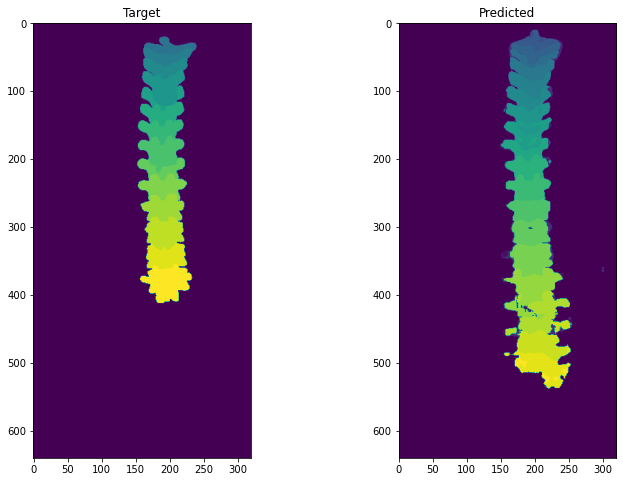

================================================== Training ==================================================
Epoch: 68, Train Loss: 0.3947467567518601, Average Dice Score: 0.5618390704177765
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.13 5: 0.14 6: 0.43 7: 0.44 8: 0.70 9: 0.66 10: 0.71 11: 0.78 12: 0.77 13: 0.74 14: 0.77 15: 0.74 16: 0.82 17: 0.85 18: 0.77 19: 0.79 20: 0.85 21: 0.72 22: 0.73 23: 0.57 24: 0.47 25: 0.03
================================================= Validation =================================================
Epoch: 68, Val Loss: 0.569986930636109, Average Dice Score: 0.3900017396170983
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.13 5: 0.14 6: 0.43 7: 0.44 8: 0.70 9: 0.66 10: 0.71 11: 0.78 12: 0.77 13: 0.74 14: 0.77 15: 0.74 16: 0.82 17: 0.85 18: 0.77 19: 0.79 20: 0.85 21: 0.72 22: 0.73 23: 0.57 24: 0.47 25: 0.03


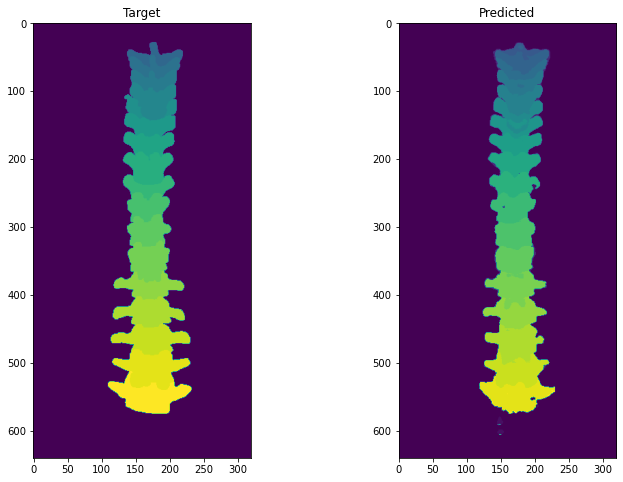

================================================== Training ==================================================
Epoch: 69, Train Loss: 0.3934837510353596, Average Dice Score: 0.5686197651698501
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.14 5: 0.15 6: 0.49 7: 0.45 8: 0.71 9: 0.68 10: 0.72 11: 0.78 12: 0.76 13: 0.74 14: 0.76 15: 0.75 16: 0.82 17: 0.85 18: 0.77 19: 0.80 20: 0.83 21: 0.72 22: 0.75 23: 0.59 24: 0.49 25: 0.03
================================================= Validation =================================================
Epoch: 69, Val Loss: 0.5596293123041998, Average Dice Score: 0.4152398809313629
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.14 5: 0.15 6: 0.49 7: 0.45 8: 0.71 9: 0.68 10: 0.72 11: 0.78 12: 0.76 13: 0.74 14: 0.76 15: 0.75 16: 0.82 17: 0.85 18: 0.77 19: 0.80 20: 0.83 21: 0.72 22: 0.75 23: 0.59 24: 0.49 25: 0.03


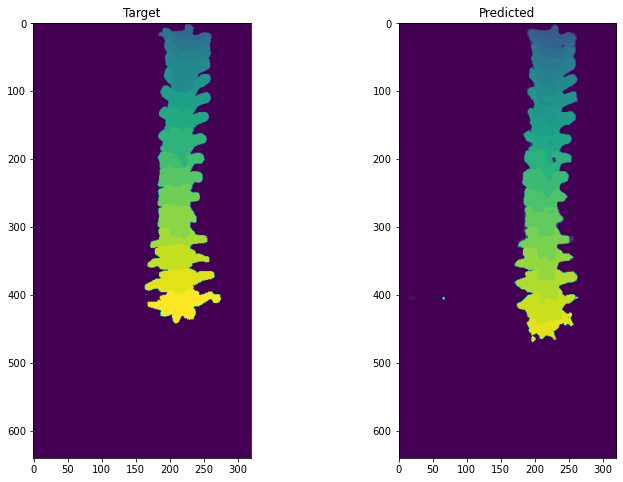

================================================== Training ==================================================
Epoch: 70, Train Loss: 0.3886865053210859, Average Dice Score: 0.5747482810464825
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.13 5: 0.16 6: 0.54 7: 0.46 8: 0.72 9: 0.68 10: 0.72 11: 0.79 12: 0.77 13: 0.74 14: 0.77 15: 0.77 16: 0.83 17: 0.85 18: 0.78 19: 0.80 20: 0.84 21: 0.73 22: 0.75 23: 0.60 24: 0.49 25: 0.03
================================================= Validation =================================================
Epoch: 70, Val Loss: 0.5560822183968591, Average Dice Score: 0.39995199316569396
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.13 5: 0.16 6: 0.54 7: 0.46 8: 0.72 9: 0.68 10: 0.72 11: 0.79 12: 0.77 13: 0.74 14: 0.77 15: 0.77 16: 0.83 17: 0.85 18: 0.78 19: 0.80 20: 0.84 21: 0.73 22: 0.75 23: 0.60 24: 0.49 25: 0.03


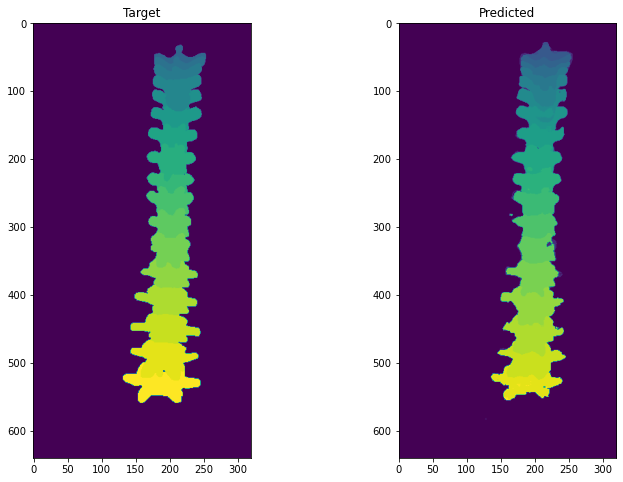

================================================== Training ==================================================
Epoch: 71, Train Loss: 0.3882487890556136, Average Dice Score: 0.5727109126757652
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.10 5: 0.17 6: 0.52 7: 0.45 8: 0.73 9: 0.67 10: 0.73 11: 0.78 12: 0.78 13: 0.74 14: 0.76 15: 0.77 16: 0.83 17: 0.86 18: 0.78 19: 0.81 20: 0.84 21: 0.73 22: 0.75 23: 0.60 24: 0.49 25: 0.02
================================================= Validation =================================================
Epoch: 71, Val Loss: 0.5443284824246266, Average Dice Score: 0.4180557180288832
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.10 5: 0.17 6: 0.52 7: 0.45 8: 0.73 9: 0.67 10: 0.73 11: 0.78 12: 0.78 13: 0.74 14: 0.76 15: 0.77 16: 0.83 17: 0.86 18: 0.78 19: 0.81 20: 0.84 21: 0.73 22: 0.75 23: 0.60 24: 0.49 25: 0.02


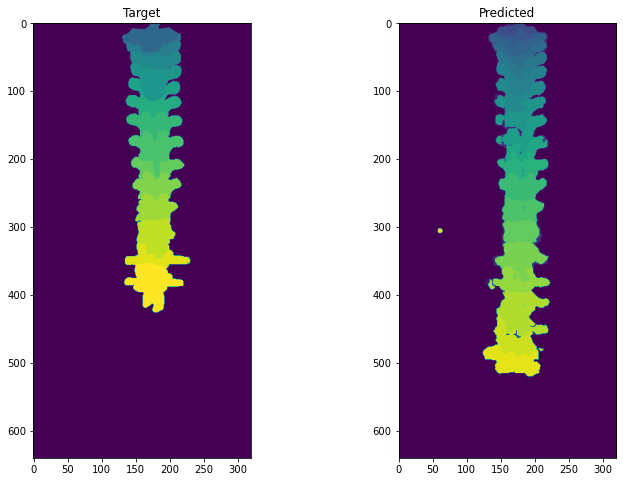

================================================== Training ==================================================
Epoch: 72, Train Loss: 0.386037988787309, Average Dice Score: 0.5774004638267523
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.09 5: 0.22 6: 0.58 7: 0.49 8: 0.74 9: 0.68 10: 0.73 11: 0.79 12: 0.76 13: 0.75 14: 0.78 15: 0.77 16: 0.83 17: 0.86 18: 0.78 19: 0.81 20: 0.85 21: 0.73 22: 0.73 23: 0.58 24: 0.48 25: 0.01
================================================= Validation =================================================
Epoch: 72, Val Loss: 0.570899106439997, Average Dice Score: 0.40048270516230633
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.09 5: 0.22 6: 0.58 7: 0.49 8: 0.74 9: 0.68 10: 0.73 11: 0.79 12: 0.76 13: 0.75 14: 0.78 15: 0.77 16: 0.83 17: 0.86 18: 0.78 19: 0.81 20: 0.85 21: 0.73 22: 0.73 23: 0.58 24: 0.48 25: 0.01


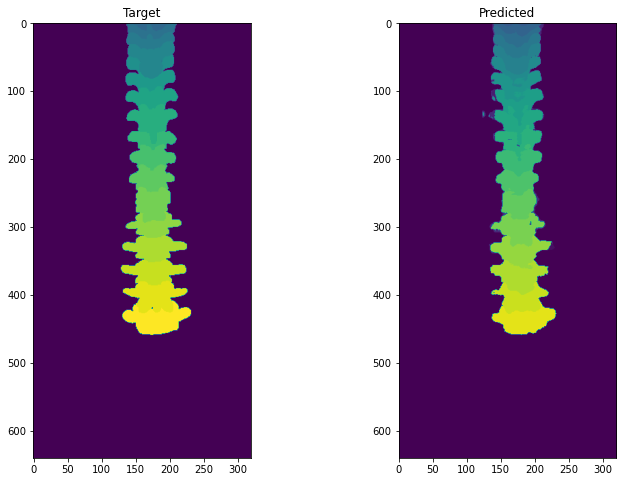

================================================== Training ==================================================
Epoch: 73, Train Loss: 0.3846585586348509, Average Dice Score: 0.5753015065882195
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.03 5: 0.15 6: 0.55 7: 0.48 8: 0.74 9: 0.68 10: 0.73 11: 0.79 12: 0.77 13: 0.75 14: 0.77 15: 0.79 16: 0.83 17: 0.86 18: 0.78 19: 0.82 20: 0.85 21: 0.74 22: 0.76 23: 0.60 24: 0.51 25: 0.01
================================================= Validation =================================================
Epoch: 73, Val Loss: 0.5540326960751267, Average Dice Score: 0.4060501809702093
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.03 5: 0.15 6: 0.55 7: 0.48 8: 0.74 9: 0.68 10: 0.73 11: 0.79 12: 0.77 13: 0.75 14: 0.77 15: 0.79 16: 0.83 17: 0.86 18: 0.78 19: 0.82 20: 0.85 21: 0.74 22: 0.76 23: 0.60 24: 0.51 25: 0.01


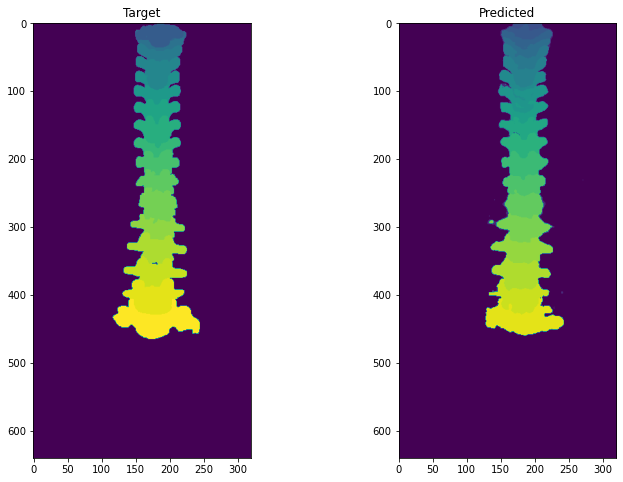

================================================== Training ==================================================
Epoch: 74, Train Loss: 0.3835030065013224, Average Dice Score: 0.5808567279471147
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.03 5: 0.22 6: 0.57 7: 0.50 8: 0.75 9: 0.68 10: 0.72 11: 0.79 12: 0.77 13: 0.75 14: 0.77 15: 0.79 16: 0.83 17: 0.86 18: 0.78 19: 0.82 20: 0.85 21: 0.74 22: 0.76 23: 0.61 24: 0.52 25: 0.00
================================================= Validation =================================================
Epoch: 74, Val Loss: 0.5478773322261747, Average Dice Score: 0.4188399601440947
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.03 5: 0.22 6: 0.57 7: 0.50 8: 0.75 9: 0.68 10: 0.72 11: 0.79 12: 0.77 13: 0.75 14: 0.77 15: 0.79 16: 0.83 17: 0.86 18: 0.78 19: 0.82 20: 0.85 21: 0.74 22: 0.76 23: 0.61 24: 0.52 25: 0.00


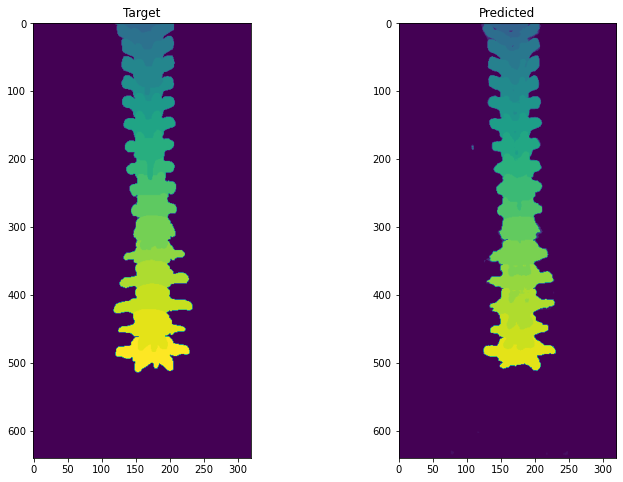

================================================== Training ==================================================
Epoch: 75, Train Loss: 0.3809223955147623, Average Dice Score: 0.5812206940060007
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.03 5: 0.23 6: 0.55 7: 0.48 8: 0.74 9: 0.69 10: 0.72 11: 0.80 12: 0.78 13: 0.74 14: 0.78 15: 0.78 16: 0.84 17: 0.87 18: 0.77 19: 0.83 20: 0.86 21: 0.74 22: 0.76 23: 0.60 24: 0.52 25: 0.01
================================================= Validation =================================================
Epoch: 75, Val Loss: 0.5513545118394445, Average Dice Score: 0.41250349575544504
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.03 5: 0.23 6: 0.55 7: 0.48 8: 0.74 9: 0.69 10: 0.72 11: 0.80 12: 0.78 13: 0.74 14: 0.78 15: 0.78 16: 0.84 17: 0.87 18: 0.77 19: 0.83 20: 0.86 21: 0.74 22: 0.76 23: 0.60 24: 0.52 25: 0.01


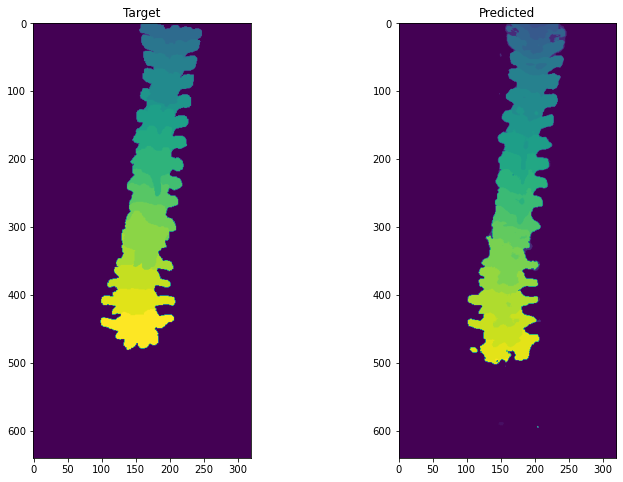

================================================== Training ==================================================
Epoch: 76, Train Loss: 0.37756718139467216, Average Dice Score: 0.5831260419113345
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.25 6: 0.56 7: 0.49 8: 0.75 9: 0.68 10: 0.73 11: 0.81 12: 0.78 13: 0.76 14: 0.79 15: 0.80 16: 0.84 17: 0.87 18: 0.78 19: 0.82 20: 0.86 21: 0.75 22: 0.77 23: 0.61 24: 0.50 25: 0.00
================================================= Validation =================================================
Epoch: 76, Val Loss: 0.5341676903552697, Average Dice Score: 0.4206778483901679
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.25 6: 0.56 7: 0.49 8: 0.75 9: 0.68 10: 0.73 11: 0.81 12: 0.78 13: 0.76 14: 0.79 15: 0.80 16: 0.84 17: 0.87 18: 0.78 19: 0.82 20: 0.86 21: 0.75 22: 0.77 23: 0.61 24: 0.50 25: 0.00


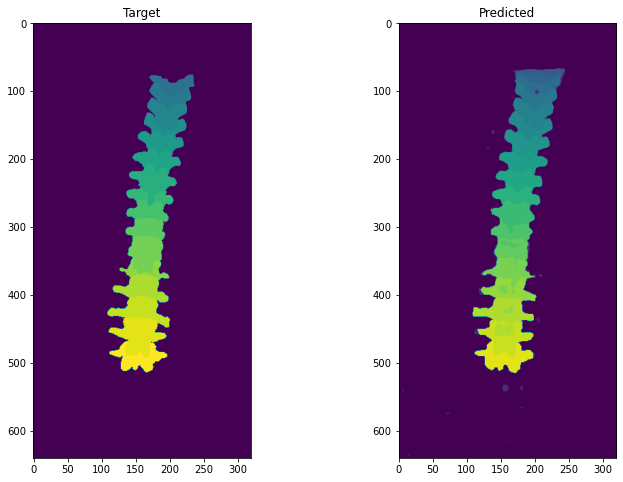

================================================== Training ==================================================
Epoch: 77, Train Loss: 0.37610701285745074, Average Dice Score: 0.5834712521434149
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.21 6: 0.55 7: 0.51 8: 0.73 9: 0.68 10: 0.74 11: 0.81 12: 0.79 13: 0.75 14: 0.80 15: 0.79 16: 0.85 17: 0.87 18: 0.77 19: 0.83 20: 0.86 21: 0.74 22: 0.77 23: 0.61 24: 0.52 25: 0.00
================================================= Validation =================================================
Epoch: 77, Val Loss: 0.5462580323219299, Average Dice Score: 0.3967592484985001
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.21 6: 0.55 7: 0.51 8: 0.73 9: 0.68 10: 0.74 11: 0.81 12: 0.79 13: 0.75 14: 0.80 15: 0.79 16: 0.85 17: 0.87 18: 0.77 19: 0.83 20: 0.86 21: 0.74 22: 0.77 23: 0.61 24: 0.52 25: 0.00


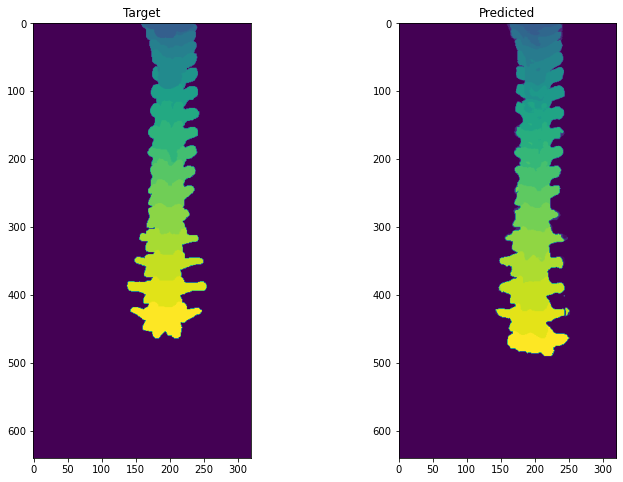

================================================== Training ==================================================
Epoch: 78, Train Loss: 0.3751871936961194, Average Dice Score: 0.5838437952300185
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.21 6: 0.55 7: 0.51 8: 0.75 9: 0.69 10: 0.73 11: 0.80 12: 0.80 13: 0.75 14: 0.79 15: 0.80 16: 0.85 17: 0.87 18: 0.77 19: 0.83 20: 0.86 21: 0.75 22: 0.76 23: 0.61 24: 0.50 25: 0.00
================================================= Validation =================================================
Epoch: 78, Val Loss: 0.5418699080826807, Average Dice Score: 0.41918038624127646
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.21 6: 0.55 7: 0.51 8: 0.75 9: 0.69 10: 0.73 11: 0.80 12: 0.80 13: 0.75 14: 0.79 15: 0.80 16: 0.85 17: 0.87 18: 0.77 19: 0.83 20: 0.86 21: 0.75 22: 0.76 23: 0.61 24: 0.50 25: 0.00


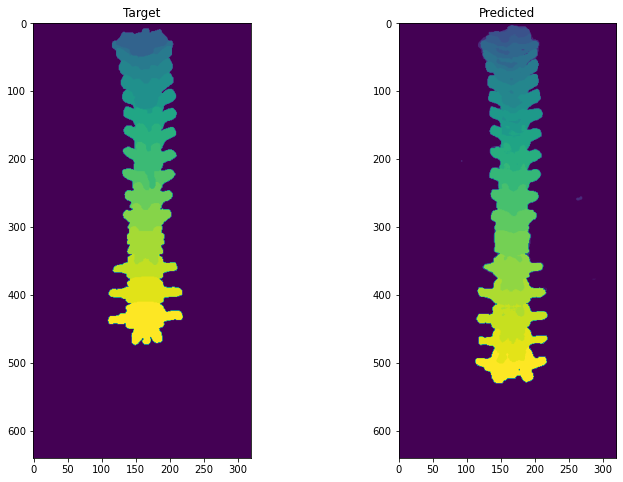

================================================== Training ==================================================
Epoch: 79, Train Loss: 0.3741117116957549, Average Dice Score: 0.5847602266201036
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.24 6: 0.54 7: 0.49 8: 0.75 9: 0.70 10: 0.73 11: 0.80 12: 0.80 13: 0.75 14: 0.80 15: 0.80 16: 0.85 17: 0.87 18: 0.77 19: 0.84 20: 0.86 21: 0.75 22: 0.77 23: 0.60 24: 0.51 25: 0.00
================================================= Validation =================================================
Epoch: 79, Val Loss: 0.5412203014874067, Average Dice Score: 0.4095442467639838
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.24 6: 0.54 7: 0.49 8: 0.75 9: 0.70 10: 0.73 11: 0.80 12: 0.80 13: 0.75 14: 0.80 15: 0.80 16: 0.85 17: 0.87 18: 0.77 19: 0.84 20: 0.86 21: 0.75 22: 0.77 23: 0.60 24: 0.51 25: 0.00


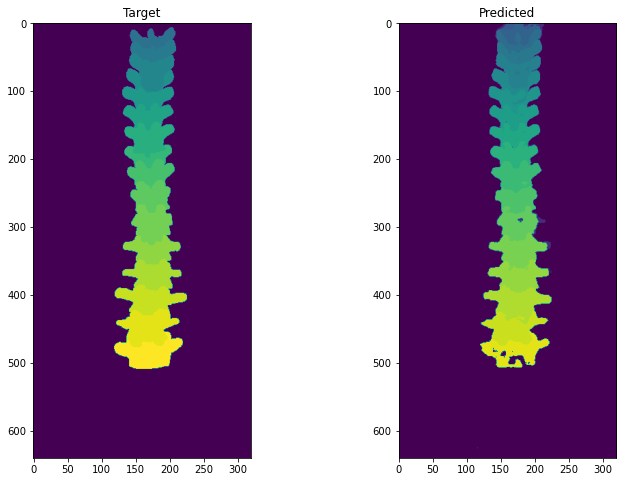

================================================== Training ==================================================
Epoch: 80, Train Loss: 0.3736691542872341, Average Dice Score: 0.5848375406764145
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.22 6: 0.53 7: 0.50 8: 0.73 9: 0.69 10: 0.73 11: 0.80 12: 0.81 13: 0.75 14: 0.80 15: 0.80 16: 0.85 17: 0.87 18: 0.77 19: 0.83 20: 0.87 21: 0.76 22: 0.77 23: 0.61 24: 0.52 25: 0.00
================================================= Validation =================================================
Epoch: 80, Val Loss: 0.5377630816131341, Average Dice Score: 0.4303001381947954
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.22 6: 0.53 7: 0.50 8: 0.73 9: 0.69 10: 0.73 11: 0.80 12: 0.81 13: 0.75 14: 0.80 15: 0.80 16: 0.85 17: 0.87 18: 0.77 19: 0.83 20: 0.87 21: 0.76 22: 0.77 23: 0.61 24: 0.52 25: 0.00


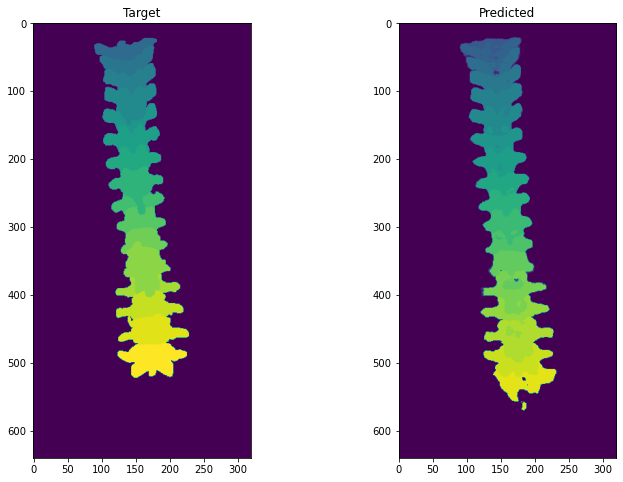

================================================== Training ==================================================
Epoch: 81, Train Loss: 0.3725114136297176, Average Dice Score: 0.5863859607454287
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.24 6: 0.55 7: 0.49 8: 0.76 9: 0.69 10: 0.74 11: 0.80 12: 0.81 13: 0.75 14: 0.81 15: 0.80 16: 0.85 17: 0.87 18: 0.77 19: 0.84 20: 0.86 21: 0.75 22: 0.77 23: 0.62 24: 0.50 25: 0.00
================================================= Validation =================================================
Epoch: 81, Val Loss: 0.5364695777658557, Average Dice Score: 0.4260091585678786
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.24 6: 0.55 7: 0.49 8: 0.76 9: 0.69 10: 0.74 11: 0.80 12: 0.81 13: 0.75 14: 0.81 15: 0.80 16: 0.85 17: 0.87 18: 0.77 19: 0.84 20: 0.86 21: 0.75 22: 0.77 23: 0.62 24: 0.50 25: 0.00


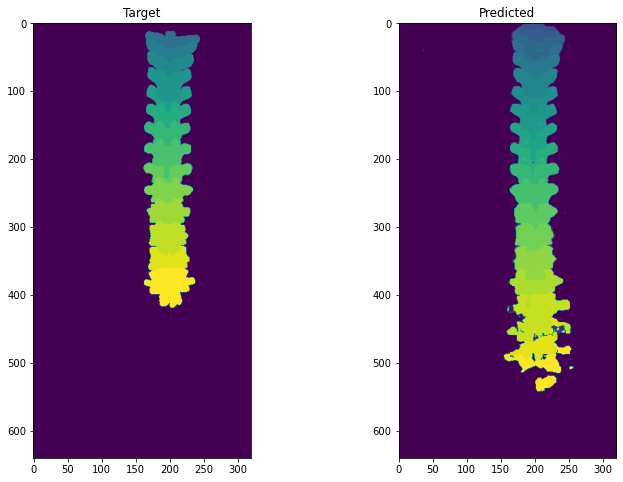

================================================== Training ==================================================
Epoch: 82, Train Loss: 0.3718929361560849, Average Dice Score: 0.5854936439798809
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.02 5: 0.24 6: 0.54 7: 0.49 8: 0.76 9: 0.69 10: 0.73 11: 0.80 12: 0.81 13: 0.75 14: 0.81 15: 0.80 16: 0.85 17: 0.87 18: 0.77 19: 0.84 20: 0.87 21: 0.75 22: 0.75 23: 0.60 24: 0.49 25: 0.00
================================================= Validation =================================================
Epoch: 82, Val Loss: 0.5338824889698967, Average Dice Score: 0.42667377067366224
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.02 5: 0.24 6: 0.54 7: 0.49 8: 0.76 9: 0.69 10: 0.73 11: 0.80 12: 0.81 13: 0.75 14: 0.81 15: 0.80 16: 0.85 17: 0.87 18: 0.77 19: 0.84 20: 0.87 21: 0.75 22: 0.75 23: 0.60 24: 0.49 25: 0.00


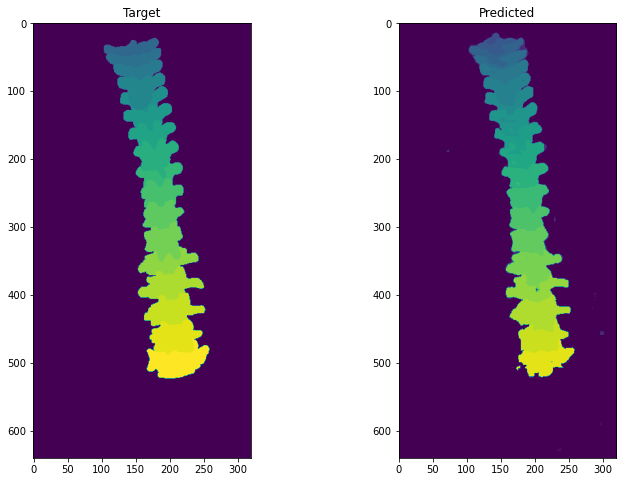

================================================== Training ==================================================
Epoch: 83, Train Loss: 0.3717443430508684, Average Dice Score: 0.5901589587953626
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.05 5: 0.24 6: 0.55 7: 0.49 8: 0.76 9: 0.69 10: 0.74 11: 0.80 12: 0.80 13: 0.75 14: 0.80 15: 0.80 16: 0.85 17: 0.87 18: 0.77 19: 0.84 20: 0.86 21: 0.76 22: 0.77 23: 0.63 24: 0.53 25: 0.00
================================================= Validation =================================================
Epoch: 83, Val Loss: 0.5497867113254109, Average Dice Score: 0.3993411829914634
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.05 5: 0.24 6: 0.55 7: 0.49 8: 0.76 9: 0.69 10: 0.74 11: 0.80 12: 0.80 13: 0.75 14: 0.80 15: 0.80 16: 0.85 17: 0.87 18: 0.77 19: 0.84 20: 0.86 21: 0.76 22: 0.77 23: 0.63 24: 0.53 25: 0.00


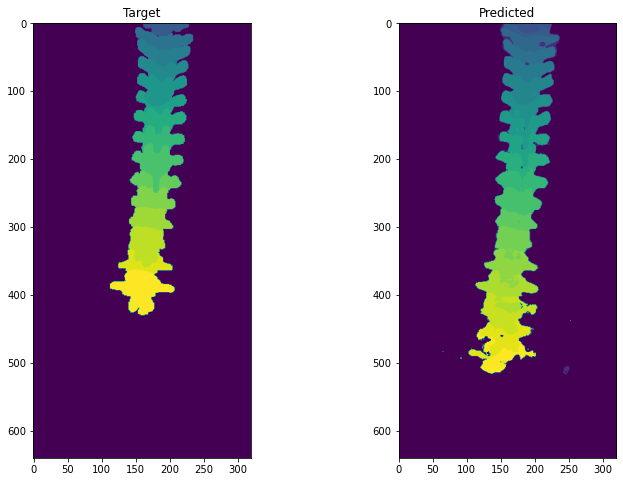

================================================== Training ==================================================
Epoch: 84, Train Loss: 0.373786698894093, Average Dice Score: 0.5864357360819425
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.26 6: 0.57 7: 0.50 8: 0.76 9: 0.70 10: 0.74 11: 0.81 12: 0.80 13: 0.75 14: 0.81 15: 0.79 16: 0.85 17: 0.87 18: 0.77 19: 0.83 20: 0.85 21: 0.75 22: 0.75 23: 0.59 24: 0.50 25: 0.00
================================================= Validation =================================================
Epoch: 84, Val Loss: 0.5432971471645793, Average Dice Score: 0.41830559627222585
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.26 6: 0.57 7: 0.50 8: 0.76 9: 0.70 10: 0.74 11: 0.81 12: 0.80 13: 0.75 14: 0.81 15: 0.79 16: 0.85 17: 0.87 18: 0.77 19: 0.83 20: 0.85 21: 0.75 22: 0.75 23: 0.59 24: 0.50 25: 0.00


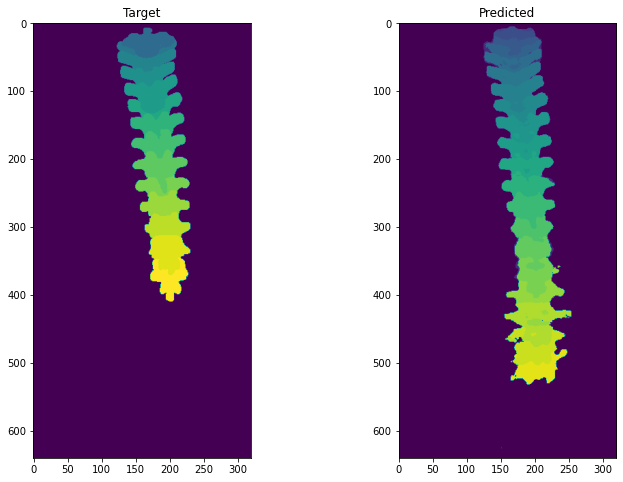

================================================== Training ==================================================
Epoch: 85, Train Loss: 0.3738122995845496, Average Dice Score: 0.5864034578274079
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.26 6: 0.56 7: 0.50 8: 0.77 9: 0.69 10: 0.74 11: 0.81 12: 0.80 13: 0.75 14: 0.80 15: 0.80 16: 0.84 17: 0.87 18: 0.77 19: 0.83 20: 0.86 21: 0.73 22: 0.75 23: 0.61 24: 0.52 25: 0.00
================================================= Validation =================================================
Epoch: 85, Val Loss: 0.5486313739760977, Average Dice Score: 0.4123619217932576
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.26 6: 0.56 7: 0.50 8: 0.77 9: 0.69 10: 0.74 11: 0.81 12: 0.80 13: 0.75 14: 0.80 15: 0.80 16: 0.84 17: 0.87 18: 0.77 19: 0.83 20: 0.86 21: 0.73 22: 0.75 23: 0.61 24: 0.52 25: 0.00


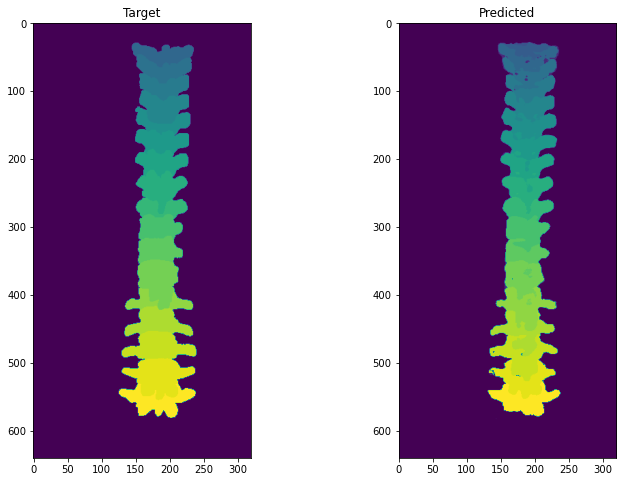

================================================== Training ==================================================
Epoch: 86, Train Loss: 0.3724198011491191, Average Dice Score: 0.5890999686627467
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.28 6: 0.55 7: 0.49 8: 0.75 9: 0.70 10: 0.73 11: 0.81 12: 0.80 13: 0.75 14: 0.81 15: 0.80 16: 0.85 17: 0.87 18: 0.77 19: 0.83 20: 0.86 21: 0.76 22: 0.77 23: 0.62 24: 0.52 25: 0.00
================================================= Validation =================================================
Epoch: 86, Val Loss: 0.5695971905208025, Average Dice Score: 0.3879109879310961
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.28 6: 0.55 7: 0.49 8: 0.75 9: 0.70 10: 0.73 11: 0.81 12: 0.80 13: 0.75 14: 0.81 15: 0.80 16: 0.85 17: 0.87 18: 0.77 19: 0.83 20: 0.86 21: 0.76 22: 0.77 23: 0.62 24: 0.52 25: 0.00


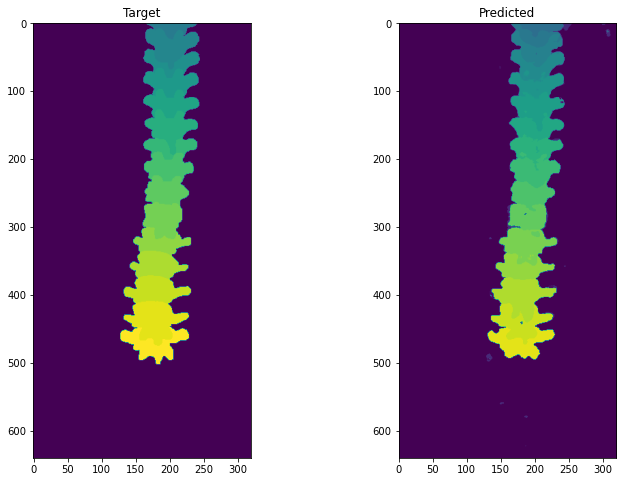

================================================== Training ==================================================
Epoch: 87, Train Loss: 0.37344701117404566, Average Dice Score: 0.5880713542176783
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.04 5: 0.29 6: 0.53 7: 0.49 8: 0.75 9: 0.68 10: 0.73 11: 0.80 12: 0.79 13: 0.75 14: 0.80 15: 0.80 16: 0.85 17: 0.87 18: 0.78 19: 0.83 20: 0.87 21: 0.76 22: 0.77 23: 0.63 24: 0.53 25: 0.00
================================================= Validation =================================================
Epoch: 87, Val Loss: 0.5477422514899832, Average Dice Score: 0.41973799317223576
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.04 5: 0.29 6: 0.53 7: 0.49 8: 0.75 9: 0.68 10: 0.73 11: 0.80 12: 0.79 13: 0.75 14: 0.80 15: 0.80 16: 0.85 17: 0.87 18: 0.78 19: 0.83 20: 0.87 21: 0.76 22: 0.77 23: 0.63 24: 0.53 25: 0.00


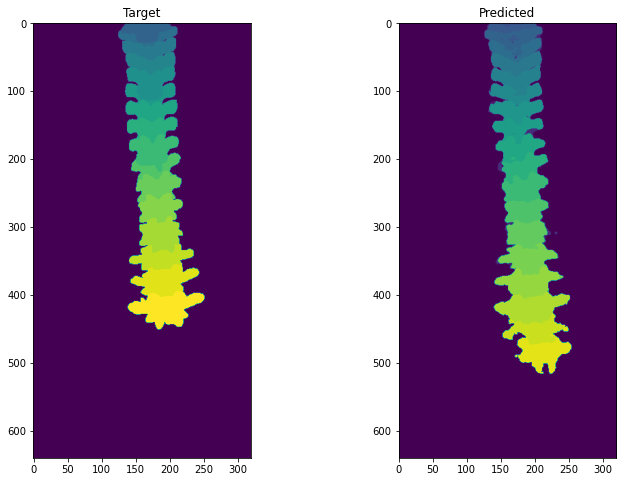

================================================== Training ==================================================
Epoch: 88, Train Loss: 0.3791134030405529, Average Dice Score: 0.5823567239250493
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.03 5: 0.24 6: 0.54 7: 0.50 8: 0.75 9: 0.69 10: 0.73 11: 0.79 12: 0.78 13: 0.74 14: 0.78 15: 0.79 16: 0.84 17: 0.86 18: 0.78 19: 0.82 20: 0.86 21: 0.76 22: 0.76 23: 0.60 24: 0.51 25: 0.00
================================================= Validation =================================================
Epoch: 88, Val Loss: 0.5506399410669921, Average Dice Score: 0.4083175415790177
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.03 5: 0.24 6: 0.54 7: 0.50 8: 0.75 9: 0.69 10: 0.73 11: 0.79 12: 0.78 13: 0.74 14: 0.78 15: 0.79 16: 0.84 17: 0.86 18: 0.78 19: 0.82 20: 0.86 21: 0.76 22: 0.76 23: 0.60 24: 0.51 25: 0.00


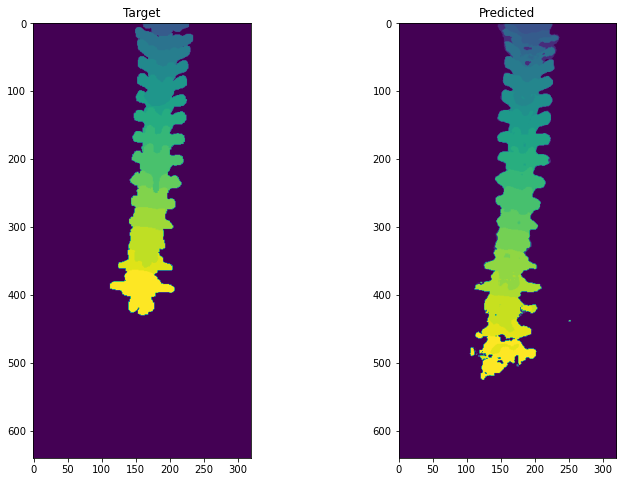

================================================== Training ==================================================
Epoch: 89, Train Loss: 0.37953691018165714, Average Dice Score: 0.5785407450292807
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.26 6: 0.54 7: 0.47 8: 0.75 9: 0.70 10: 0.73 11: 0.80 12: 0.78 13: 0.74 14: 0.78 15: 0.78 16: 0.83 17: 0.85 18: 0.78 19: 0.81 20: 0.86 21: 0.75 22: 0.74 23: 0.60 24: 0.50 25: 0.00
================================================= Validation =================================================
Epoch: 89, Val Loss: 0.5519795955204573, Average Dice Score: 0.39966102386748925
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.26 6: 0.54 7: 0.47 8: 0.75 9: 0.70 10: 0.73 11: 0.80 12: 0.78 13: 0.74 14: 0.78 15: 0.78 16: 0.83 17: 0.85 18: 0.78 19: 0.81 20: 0.86 21: 0.75 22: 0.74 23: 0.60 24: 0.50 25: 0.00


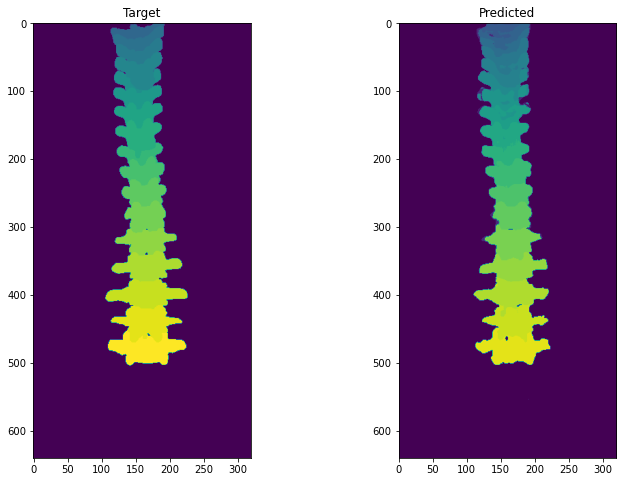

================================================== Training ==================================================
Epoch: 90, Train Loss: 0.38480370189118557, Average Dice Score: 0.5771767261743469
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.26 6: 0.54 7: 0.47 8: 0.76 9: 0.69 10: 0.72 11: 0.79 12: 0.77 13: 0.73 14: 0.76 15: 0.78 16: 0.82 17: 0.85 18: 0.78 19: 0.82 20: 0.85 21: 0.75 22: 0.76 23: 0.61 24: 0.51 25: 0.00
================================================= Validation =================================================
Epoch: 90, Val Loss: 0.6225291803234914, Average Dice Score: 0.3520633339044353
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.26 6: 0.54 7: 0.47 8: 0.76 9: 0.69 10: 0.72 11: 0.79 12: 0.77 13: 0.73 14: 0.76 15: 0.78 16: 0.82 17: 0.85 18: 0.78 19: 0.82 20: 0.85 21: 0.75 22: 0.76 23: 0.61 24: 0.51 25: 0.00


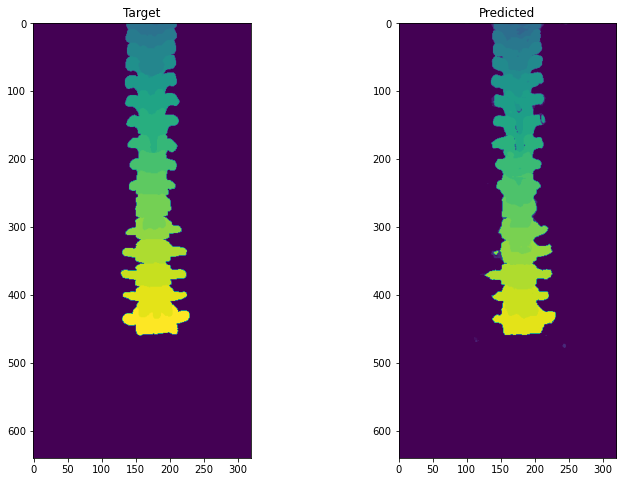

================================================== Training ==================================================
Epoch: 91, Train Loss: 0.39253734522930517, Average Dice Score: 0.5675783956574871
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.22 6: 0.53 7: 0.47 8: 0.76 9: 0.68 10: 0.71 11: 0.78 12: 0.76 13: 0.73 14: 0.75 15: 0.76 16: 0.81 17: 0.83 18: 0.78 19: 0.79 20: 0.83 21: 0.73 22: 0.73 23: 0.59 24: 0.51 25: 0.00
================================================= Validation =================================================
Epoch: 91, Val Loss: 0.8123625536433986, Average Dice Score: 0.16523586614886704
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.22 6: 0.53 7: 0.47 8: 0.76 9: 0.68 10: 0.71 11: 0.78 12: 0.76 13: 0.73 14: 0.75 15: 0.76 16: 0.81 17: 0.83 18: 0.78 19: 0.79 20: 0.83 21: 0.73 22: 0.73 23: 0.59 24: 0.51 25: 0.00


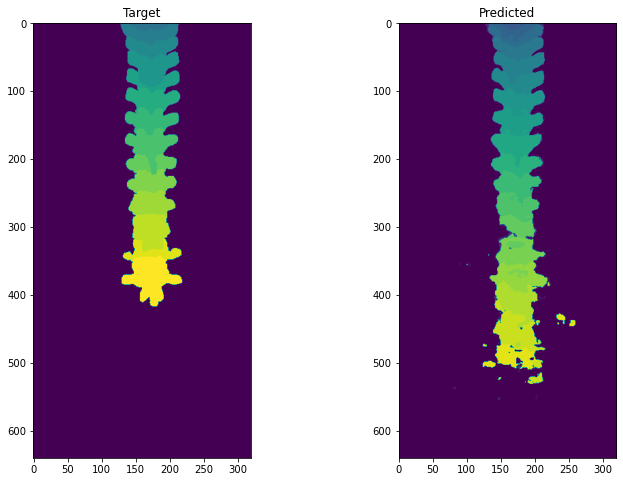

================================================== Training ==================================================
Epoch: 92, Train Loss: 0.39185657353978826, Average Dice Score: 0.5683435724914434
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.22 6: 0.56 7: 0.48 8: 0.75 9: 0.68 10: 0.71 11: 0.79 12: 0.76 13: 0.72 14: 0.75 15: 0.77 16: 0.82 17: 0.83 18: 0.78 19: 0.79 20: 0.83 21: 0.74 22: 0.71 23: 0.58 24: 0.50 25: 0.00
================================================= Validation =================================================
Epoch: 92, Val Loss: 0.6408688836410398, Average Dice Score: 0.3322938295410228
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.22 6: 0.56 7: 0.48 8: 0.75 9: 0.68 10: 0.71 11: 0.79 12: 0.76 13: 0.72 14: 0.75 15: 0.77 16: 0.82 17: 0.83 18: 0.78 19: 0.79 20: 0.83 21: 0.74 22: 0.71 23: 0.58 24: 0.50 25: 0.00


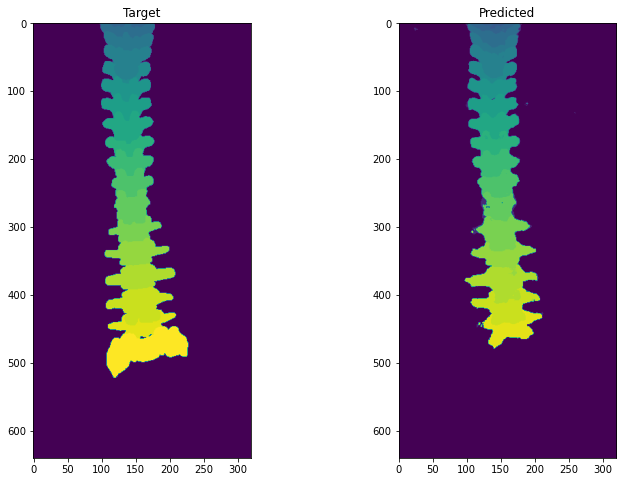

================================================== Training ==================================================
Epoch: 93, Train Loss: 0.3840857180733579, Average Dice Score: 0.5802939433743043
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.02 5: 0.26 6: 0.58 7: 0.49 8: 0.76 9: 0.69 10: 0.73 11: 0.79 12: 0.76 13: 0.73 14: 0.78 15: 0.78 16: 0.84 17: 0.85 18: 0.79 19: 0.81 20: 0.84 21: 0.75 22: 0.74 23: 0.61 24: 0.51 25: 0.00
================================================= Validation =================================================
Epoch: 93, Val Loss: 0.5473455210201076, Average Dice Score: 0.40313074934670634
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.02 5: 0.26 6: 0.58 7: 0.49 8: 0.76 9: 0.69 10: 0.73 11: 0.79 12: 0.76 13: 0.73 14: 0.78 15: 0.78 16: 0.84 17: 0.85 18: 0.79 19: 0.81 20: 0.84 21: 0.75 22: 0.74 23: 0.61 24: 0.51 25: 0.00


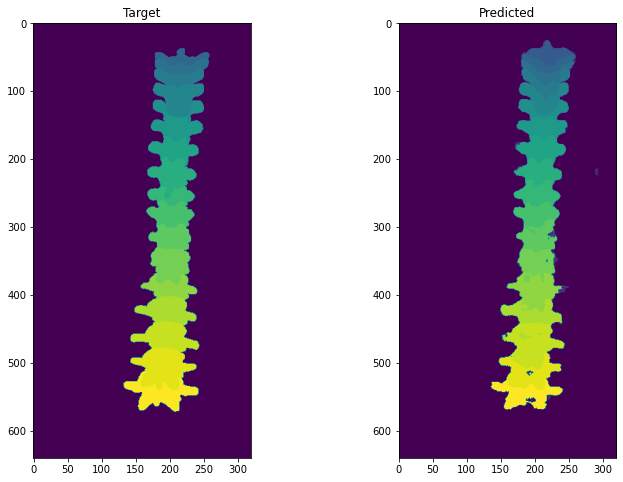

================================================== Training ==================================================
Epoch: 94, Train Loss: 0.37934403889536006, Average Dice Score: 0.5790881795148118
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.21 6: 0.53 7: 0.49 8: 0.76 9: 0.69 10: 0.73 11: 0.80 12: 0.78 13: 0.73 14: 0.77 15: 0.80 16: 0.84 17: 0.85 18: 0.79 19: 0.82 20: 0.85 21: 0.75 22: 0.76 23: 0.61 24: 0.51 25: 0.00
================================================= Validation =================================================
Epoch: 94, Val Loss: 0.5872709321194007, Average Dice Score: 0.3695874047891228
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.21 6: 0.53 7: 0.49 8: 0.76 9: 0.69 10: 0.73 11: 0.80 12: 0.78 13: 0.73 14: 0.77 15: 0.80 16: 0.84 17: 0.85 18: 0.79 19: 0.82 20: 0.85 21: 0.75 22: 0.76 23: 0.61 24: 0.51 25: 0.00


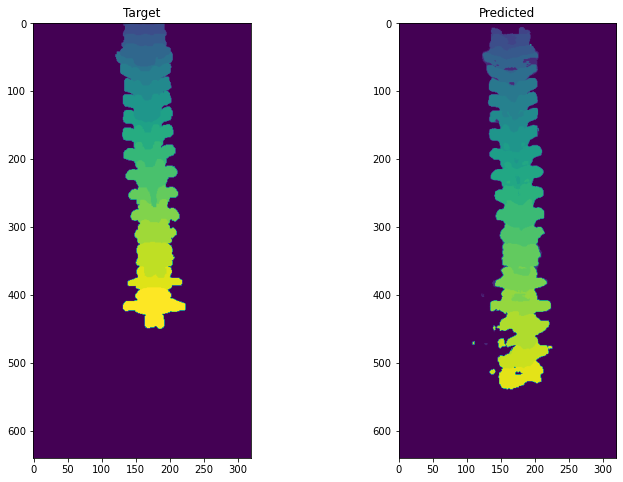

================================================== Training ==================================================
Epoch: 95, Train Loss: 0.38022637763668976, Average Dice Score: 0.5805511891255065
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.21 6: 0.60 7: 0.50 8: 0.77 9: 0.69 10: 0.72 11: 0.81 12: 0.78 13: 0.75 14: 0.77 15: 0.80 16: 0.84 17: 0.85 18: 0.78 19: 0.81 20: 0.85 21: 0.75 22: 0.74 23: 0.59 24: 0.50 25: 0.00
================================================= Validation =================================================
Epoch: 95, Val Loss: 0.5734440049187082, Average Dice Score: 0.392984199028664
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.21 6: 0.60 7: 0.50 8: 0.77 9: 0.69 10: 0.72 11: 0.81 12: 0.78 13: 0.75 14: 0.77 15: 0.80 16: 0.84 17: 0.85 18: 0.78 19: 0.81 20: 0.85 21: 0.75 22: 0.74 23: 0.59 24: 0.50 25: 0.00


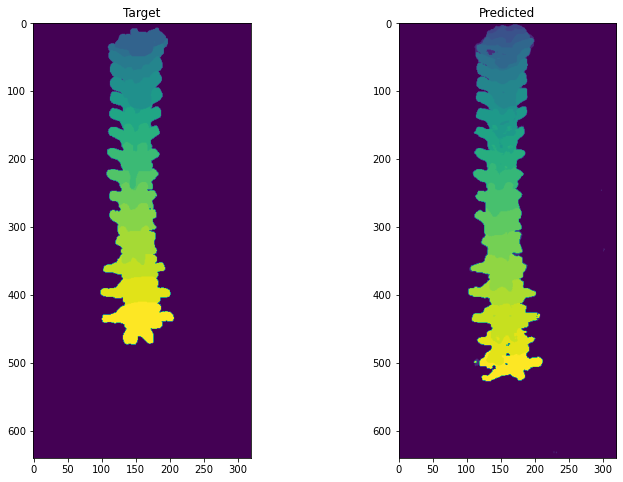

================================================== Training ==================================================
Epoch: 96, Train Loss: 0.3745165608840997, Average Dice Score: 0.5864878325146604
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.09 5: 0.24 6: 0.52 7: 0.49 8: 0.76 9: 0.70 10: 0.73 11: 0.81 12: 0.79 13: 0.75 14: 0.78 15: 0.82 16: 0.84 17: 0.86 18: 0.79 19: 0.82 20: 0.86 21: 0.76 22: 0.77 23: 0.60 24: 0.50 25: 0.00
================================================= Validation =================================================
Epoch: 96, Val Loss: 0.5486082708249327, Average Dice Score: 0.4055241200178363
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.09 5: 0.24 6: 0.52 7: 0.49 8: 0.76 9: 0.70 10: 0.73 11: 0.81 12: 0.79 13: 0.75 14: 0.78 15: 0.82 16: 0.84 17: 0.86 18: 0.79 19: 0.82 20: 0.86 21: 0.76 22: 0.77 23: 0.60 24: 0.50 25: 0.00


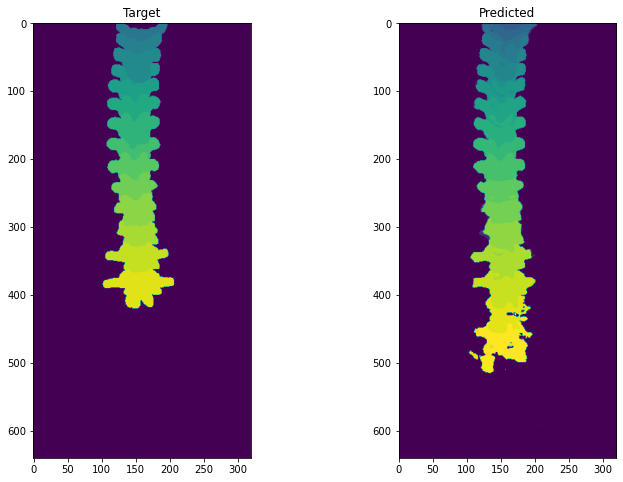

================================================== Training ==================================================
Epoch: 97, Train Loss: 0.37074814669593215, Average Dice Score: 0.5898331922502192
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.04 5: 0.27 6: 0.54 7: 0.48 8: 0.76 9: 0.69 10: 0.73 11: 0.82 12: 0.80 13: 0.75 14: 0.79 15: 0.82 16: 0.84 17: 0.87 18: 0.79 19: 0.83 20: 0.86 21: 0.77 22: 0.77 23: 0.61 24: 0.52 25: 0.00
================================================= Validation =================================================
Epoch: 97, Val Loss: 0.5320702390592607, Average Dice Score: 0.4295798196113766
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.04 5: 0.27 6: 0.54 7: 0.48 8: 0.76 9: 0.69 10: 0.73 11: 0.82 12: 0.80 13: 0.75 14: 0.79 15: 0.82 16: 0.84 17: 0.87 18: 0.79 19: 0.83 20: 0.86 21: 0.77 22: 0.77 23: 0.61 24: 0.52 25: 0.00


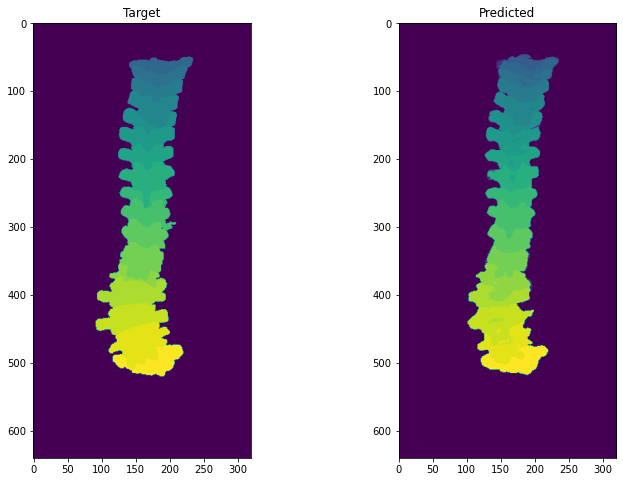

================================================== Training ==================================================
Epoch: 98, Train Loss: 0.36839234347581296, Average Dice Score: 0.5923745162804489
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.28 6: 0.55 7: 0.50 8: 0.77 9: 0.70 10: 0.73 11: 0.82 12: 0.80 13: 0.76 14: 0.80 15: 0.81 16: 0.85 17: 0.87 18: 0.78 19: 0.84 20: 0.86 21: 0.77 22: 0.77 23: 0.62 24: 0.53 25: 0.00
================================================= Validation =================================================
Epoch: 98, Val Loss: 0.5287359630475279, Average Dice Score: 0.4288492627308376
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.28 6: 0.55 7: 0.50 8: 0.77 9: 0.70 10: 0.73 11: 0.82 12: 0.80 13: 0.76 14: 0.80 15: 0.81 16: 0.85 17: 0.87 18: 0.78 19: 0.84 20: 0.86 21: 0.77 22: 0.77 23: 0.62 24: 0.53 25: 0.00


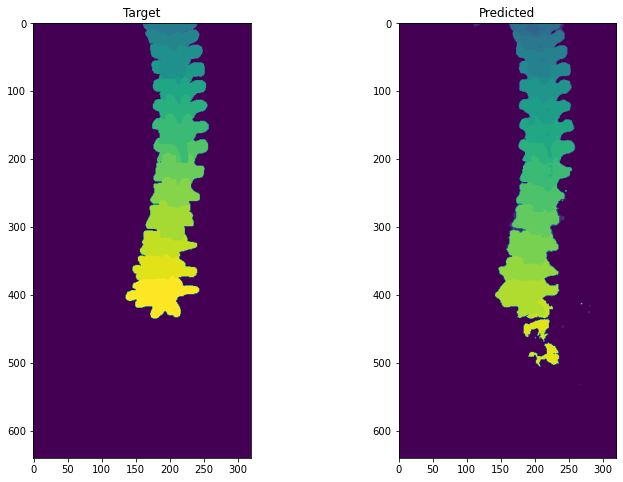

================================================== Training ==================================================
Epoch: 99, Train Loss: 0.3669343811599206, Average Dice Score: 0.5934274378026602
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.29 6: 0.55 7: 0.50 8: 0.78 9: 0.71 10: 0.73 11: 0.81 12: 0.80 13: 0.76 14: 0.80 15: 0.82 16: 0.85 17: 0.86 18: 0.78 19: 0.85 20: 0.86 21: 0.78 22: 0.77 23: 0.61 24: 0.51 25: 0.00
================================================= Validation =================================================
Epoch: 99, Val Loss: 0.5340246333450568, Average Dice Score: 0.42229150575920454
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.29 6: 0.55 7: 0.50 8: 0.78 9: 0.71 10: 0.73 11: 0.81 12: 0.80 13: 0.76 14: 0.80 15: 0.82 16: 0.85 17: 0.86 18: 0.78 19: 0.85 20: 0.86 21: 0.78 22: 0.77 23: 0.61 24: 0.51 25: 0.00


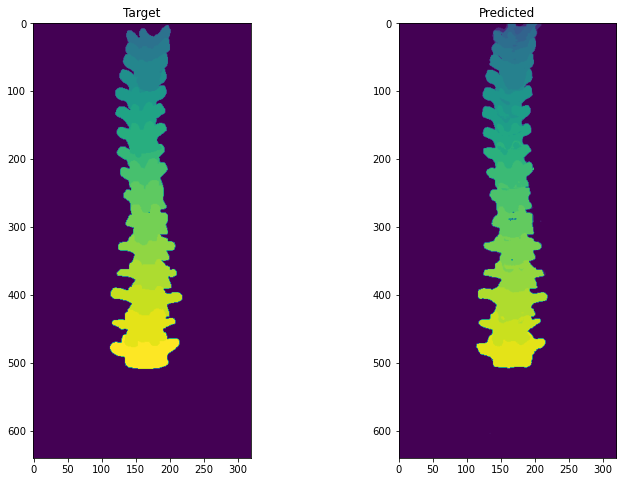

================================================== Training ==================================================
Epoch: 100, Train Loss: 0.36704877224217686, Average Dice Score: 0.5918738106370757
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.25 6: 0.53 7: 0.50 8: 0.76 9: 0.70 10: 0.74 11: 0.81 12: 0.80 13: 0.77 14: 0.80 15: 0.81 16: 0.85 17: 0.87 18: 0.78 19: 0.85 20: 0.86 21: 0.78 22: 0.77 23: 0.63 24: 0.54 25: 0.00
================================================= Validation =================================================
Epoch: 100, Val Loss: 0.5344660702298899, Average Dice Score: 0.42481299098278247
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.25 6: 0.53 7: 0.50 8: 0.76 9: 0.70 10: 0.74 11: 0.81 12: 0.80 13: 0.77 14: 0.80 15: 0.81 16: 0.85 17: 0.87 18: 0.78 19: 0.85 20: 0.86 21: 0.78 22: 0.77 23: 0.63 24: 0.54 25: 0.00


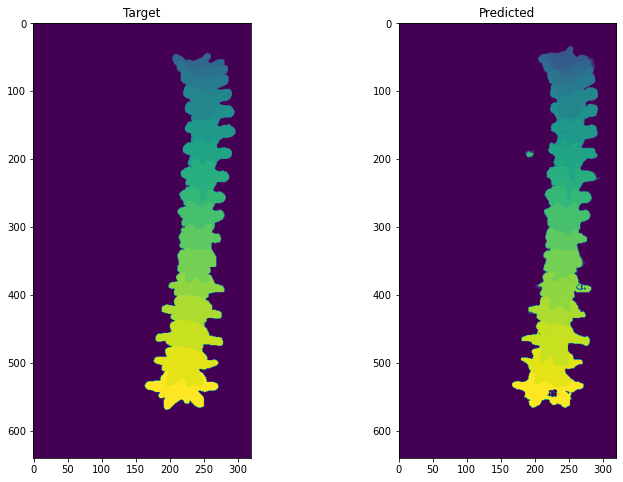

================================================== Training ==================================================
Epoch: 101, Train Loss: 0.36560019079126826, Average Dice Score: 0.5939566104680235
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.23 6: 0.57 7: 0.51 8: 0.79 9: 0.70 10: 0.74 11: 0.81 12: 0.80 13: 0.77 14: 0.81 15: 0.82 16: 0.85 17: 0.87 18: 0.78 19: 0.85 20: 0.86 21: 0.78 22: 0.77 23: 0.63 24: 0.52 25: 0.00
================================================= Validation =================================================
Epoch: 101, Val Loss: 0.5407888772057705, Average Dice Score: 0.43597931381781785
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.23 6: 0.57 7: 0.51 8: 0.79 9: 0.70 10: 0.74 11: 0.81 12: 0.80 13: 0.77 14: 0.81 15: 0.82 16: 0.85 17: 0.87 18: 0.78 19: 0.85 20: 0.86 21: 0.78 22: 0.77 23: 0.63 24: 0.52 25: 0.00


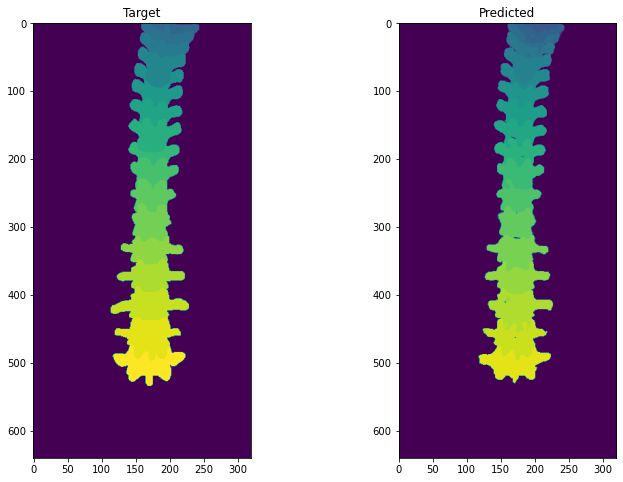

================================================== Training ==================================================
Epoch: 102, Train Loss: 0.3678687401735301, Average Dice Score: 0.5940567073939367
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.28 6: 0.58 7: 0.50 8: 0.78 9: 0.71 10: 0.73 11: 0.81 12: 0.80 13: 0.76 14: 0.80 15: 0.82 16: 0.84 17: 0.87 18: 0.79 19: 0.84 20: 0.86 21: 0.78 22: 0.76 23: 0.63 24: 0.52 25: 0.00
================================================= Validation =================================================
Epoch: 102, Val Loss: 0.5351879381742634, Average Dice Score: 0.43910045734763137
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.28 6: 0.58 7: 0.50 8: 0.78 9: 0.71 10: 0.73 11: 0.81 12: 0.80 13: 0.76 14: 0.80 15: 0.82 16: 0.84 17: 0.87 18: 0.79 19: 0.84 20: 0.86 21: 0.78 22: 0.76 23: 0.63 24: 0.52 25: 0.00


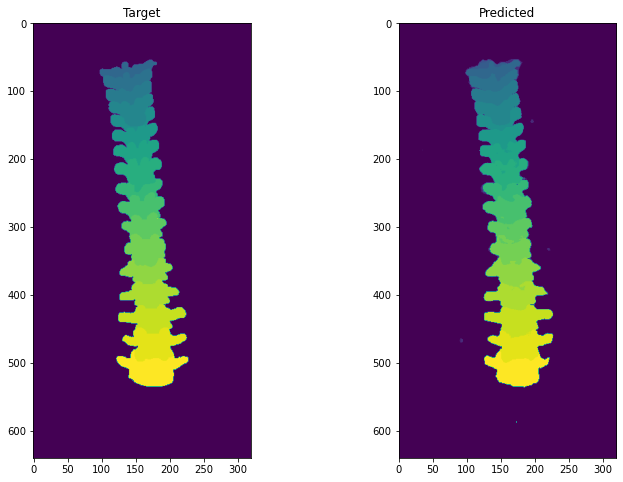

================================================== Training ==================================================
Epoch: 103, Train Loss: 0.3656242185420492, Average Dice Score: 0.5962607208602488
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.27 6: 0.58 7: 0.49 8: 0.79 9: 0.71 10: 0.74 11: 0.81 12: 0.80 13: 0.77 14: 0.81 15: 0.82 16: 0.84 17: 0.87 18: 0.78 19: 0.85 20: 0.86 21: 0.78 22: 0.77 23: 0.64 24: 0.54 25: 0.00
================================================= Validation =================================================
Epoch: 103, Val Loss: 0.5367862044787798, Average Dice Score: 0.42251540190470116
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.27 6: 0.58 7: 0.49 8: 0.79 9: 0.71 10: 0.74 11: 0.81 12: 0.80 13: 0.77 14: 0.81 15: 0.82 16: 0.84 17: 0.87 18: 0.78 19: 0.85 20: 0.86 21: 0.78 22: 0.77 23: 0.64 24: 0.54 25: 0.00


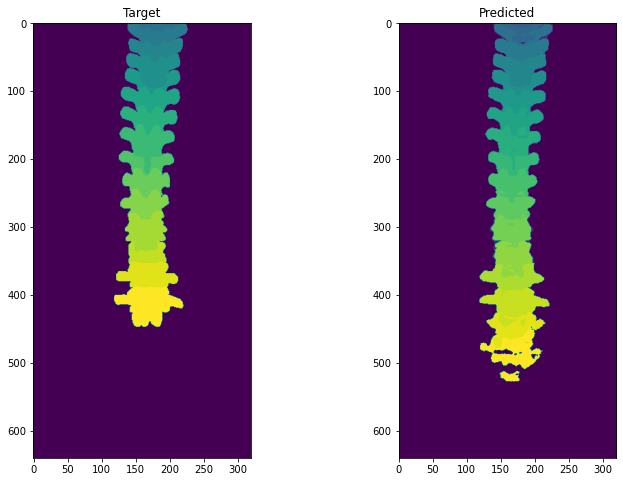

================================================== Training ==================================================
Epoch: 104, Train Loss: 0.36602738988088035, Average Dice Score: 0.5961915020469194
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.32 6: 0.56 7: 0.50 8: 0.78 9: 0.70 10: 0.73 11: 0.81 12: 0.80 13: 0.77 14: 0.80 15: 0.82 16: 0.85 17: 0.86 18: 0.79 19: 0.84 20: 0.86 21: 0.78 22: 0.77 23: 0.62 24: 0.52 25: 0.00
================================================= Validation =================================================
Epoch: 104, Val Loss: 0.5370312802127151, Average Dice Score: 0.43044291465007206
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.32 6: 0.56 7: 0.50 8: 0.78 9: 0.70 10: 0.73 11: 0.81 12: 0.80 13: 0.77 14: 0.80 15: 0.82 16: 0.85 17: 0.86 18: 0.79 19: 0.84 20: 0.86 21: 0.78 22: 0.77 23: 0.62 24: 0.52 25: 0.00


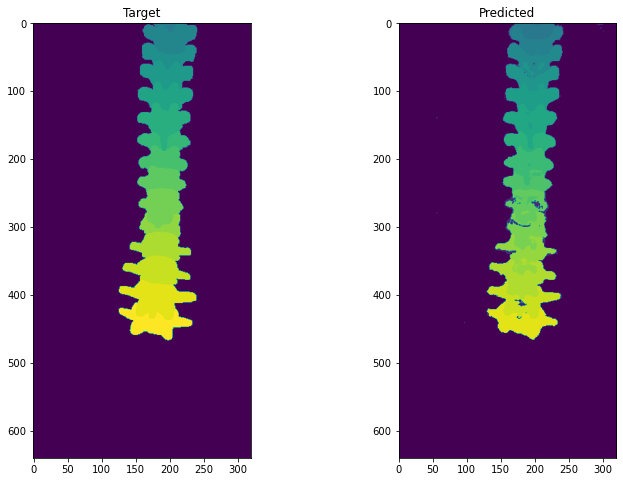

================================================== Training ==================================================
Epoch: 105, Train Loss: 0.3648233320254328, Average Dice Score: 0.5932214196408637
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.25 6: 0.55 7: 0.50 8: 0.77 9: 0.70 10: 0.74 11: 0.81 12: 0.81 13: 0.77 14: 0.81 15: 0.82 16: 0.85 17: 0.86 18: 0.78 19: 0.84 20: 0.86 21: 0.78 22: 0.77 23: 0.63 24: 0.53 25: 0.00
================================================= Validation =================================================
Epoch: 105, Val Loss: 0.5440423136851826, Average Dice Score: 0.4280183675630008
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.25 6: 0.55 7: 0.50 8: 0.77 9: 0.70 10: 0.74 11: 0.81 12: 0.81 13: 0.77 14: 0.81 15: 0.82 16: 0.85 17: 0.86 18: 0.78 19: 0.84 20: 0.86 21: 0.78 22: 0.77 23: 0.63 24: 0.53 25: 0.00


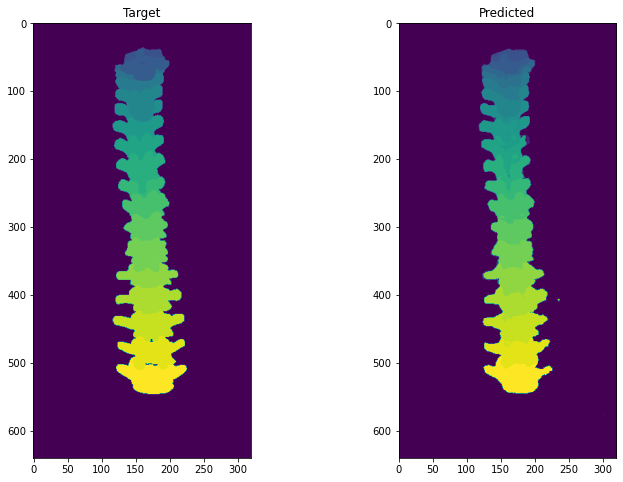

================================================== Training ==================================================
Epoch: 106, Train Loss: 0.37459234627861876, Average Dice Score: 0.5885327768793207
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.25 6: 0.58 7: 0.52 8: 0.76 9: 0.69 10: 0.74 11: 0.79 12: 0.77 13: 0.74 14: 0.78 15: 0.80 16: 0.84 17: 0.86 18: 0.79 19: 0.84 20: 0.86 21: 0.78 22: 0.77 23: 0.63 24: 0.53 25: 0.00
================================================= Validation =================================================
Epoch: 106, Val Loss: 0.5488432870536554, Average Dice Score: 0.41392834421828856
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.25 6: 0.58 7: 0.52 8: 0.76 9: 0.69 10: 0.74 11: 0.79 12: 0.77 13: 0.74 14: 0.78 15: 0.80 16: 0.84 17: 0.86 18: 0.79 19: 0.84 20: 0.86 21: 0.78 22: 0.77 23: 0.63 24: 0.53 25: 0.00


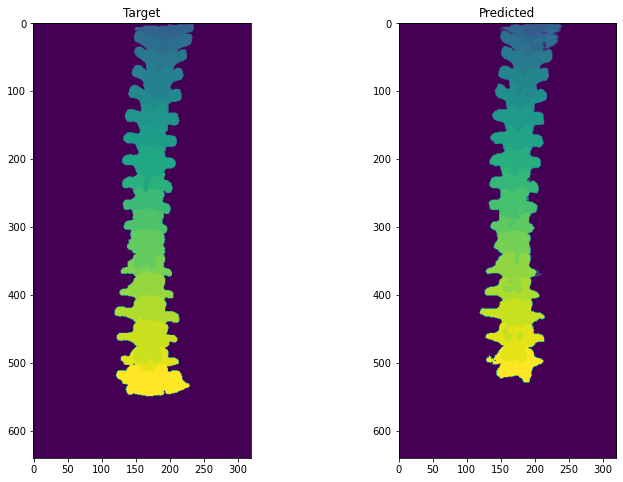

================================================== Training ==================================================
Epoch: 107, Train Loss: 0.37375745566610485, Average Dice Score: 0.5872640194003562
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.28 6: 0.55 7: 0.49 8: 0.77 9: 0.70 10: 0.73 11: 0.80 12: 0.78 13: 0.75 14: 0.78 15: 0.80 16: 0.84 17: 0.86 18: 0.78 19: 0.83 20: 0.86 21: 0.77 22: 0.77 23: 0.62 24: 0.51 25: 0.00
================================================= Validation =================================================
Epoch: 107, Val Loss: 0.54836662382376, Average Dice Score: 0.3937486928693069
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.28 6: 0.55 7: 0.49 8: 0.77 9: 0.70 10: 0.73 11: 0.80 12: 0.78 13: 0.75 14: 0.78 15: 0.80 16: 0.84 17: 0.86 18: 0.78 19: 0.83 20: 0.86 21: 0.77 22: 0.77 23: 0.62 24: 0.51 25: 0.00


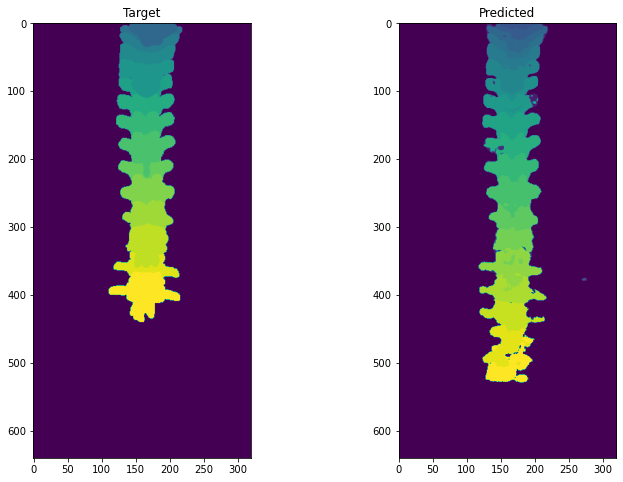

================================================== Training ==================================================
Epoch: 108, Train Loss: 0.3704236047851218, Average Dice Score: 0.5850571357132677
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.19 6: 0.58 7: 0.48 8: 0.78 9: 0.70 10: 0.73 11: 0.80 12: 0.79 13: 0.75 14: 0.79 15: 0.81 16: 0.84 17: 0.86 18: 0.79 19: 0.83 20: 0.86 21: 0.77 22: 0.75 23: 0.61 24: 0.49 25: 0.00
================================================= Validation =================================================
Epoch: 108, Val Loss: 0.5488350039622822, Average Dice Score: 0.4249362354559104
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.19 6: 0.58 7: 0.48 8: 0.78 9: 0.70 10: 0.73 11: 0.80 12: 0.79 13: 0.75 14: 0.79 15: 0.81 16: 0.84 17: 0.86 18: 0.79 19: 0.83 20: 0.86 21: 0.77 22: 0.75 23: 0.61 24: 0.49 25: 0.00


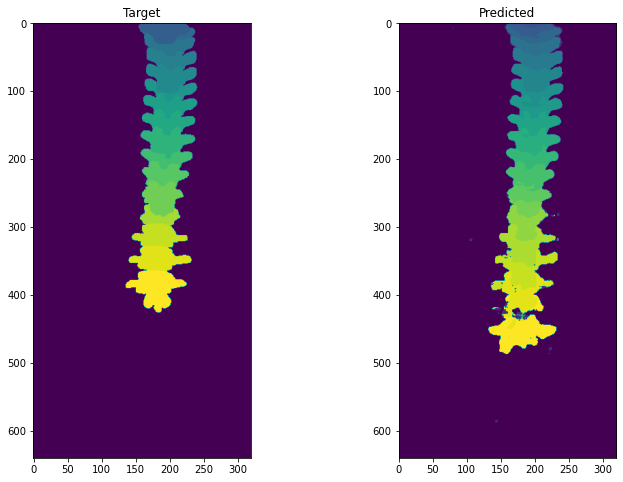

================================================== Training ==================================================
Epoch: 109, Train Loss: 0.371097872347843, Average Dice Score: 0.5878638270430181
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.22 6: 0.56 7: 0.51 8: 0.79 9: 0.70 10: 0.73 11: 0.81 12: 0.78 13: 0.75 14: 0.79 15: 0.81 16: 0.84 17: 0.86 18: 0.79 19: 0.81 20: 0.86 21: 0.77 22: 0.77 23: 0.63 24: 0.51 25: 0.00
================================================= Validation =================================================
Epoch: 109, Val Loss: 0.6314986905113595, Average Dice Score: 0.3373976029594991
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.22 6: 0.56 7: 0.51 8: 0.79 9: 0.70 10: 0.73 11: 0.81 12: 0.78 13: 0.75 14: 0.79 15: 0.81 16: 0.84 17: 0.86 18: 0.79 19: 0.81 20: 0.86 21: 0.77 22: 0.77 23: 0.63 24: 0.51 25: 0.00


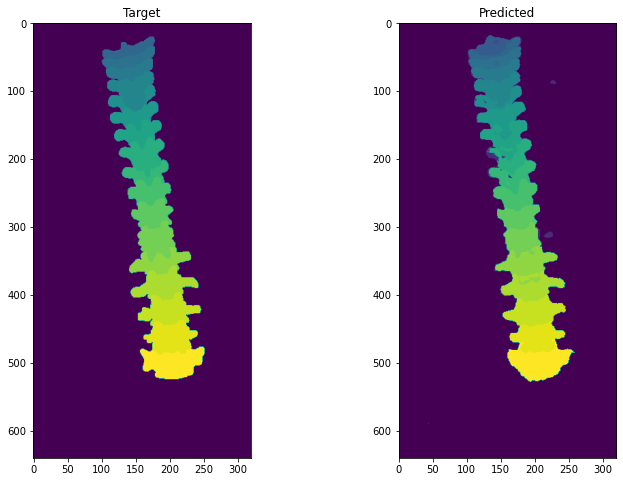

================================================== Training ==================================================
Epoch: 110, Train Loss: 0.3781597411830748, Average Dice Score: 0.5831371514921521
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.03 5: 0.27 6: 0.53 7: 0.49 8: 0.78 9: 0.71 10: 0.72 11: 0.82 12: 0.79 13: 0.75 14: 0.79 15: 0.80 16: 0.84 17: 0.86 18: 0.80 19: 0.79 20: 0.86 21: 0.73 22: 0.73 23: 0.59 24: 0.51 25: 0.00
================================================= Validation =================================================
Epoch: 110, Val Loss: 0.5319711917736492, Average Dice Score: 0.4244212802391259
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.03 5: 0.27 6: 0.53 7: 0.49 8: 0.78 9: 0.71 10: 0.72 11: 0.82 12: 0.79 13: 0.75 14: 0.79 15: 0.80 16: 0.84 17: 0.86 18: 0.80 19: 0.79 20: 0.86 21: 0.73 22: 0.73 23: 0.59 24: 0.51 25: 0.00


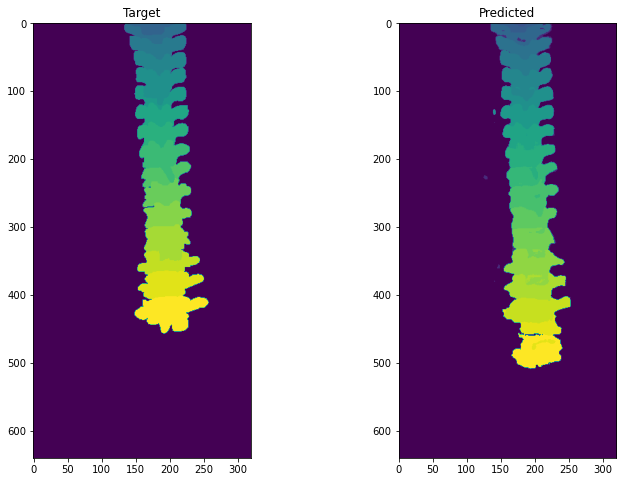

================================================== Training ==================================================
Epoch: 111, Train Loss: 0.3725859454861729, Average Dice Score: 0.5884022603380262
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.24 6: 0.56 7: 0.51 8: 0.80 9: 0.71 10: 0.73 11: 0.81 12: 0.78 13: 0.76 14: 0.78 15: 0.81 16: 0.84 17: 0.86 18: 0.80 19: 0.81 20: 0.86 21: 0.77 22: 0.76 23: 0.61 24: 0.51 25: 0.00
================================================= Validation =================================================
Epoch: 111, Val Loss: 0.5413266557161925, Average Dice Score: 0.42686135914589285
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.24 6: 0.56 7: 0.51 8: 0.80 9: 0.71 10: 0.73 11: 0.81 12: 0.78 13: 0.76 14: 0.78 15: 0.81 16: 0.84 17: 0.86 18: 0.80 19: 0.81 20: 0.86 21: 0.77 22: 0.76 23: 0.61 24: 0.51 25: 0.00


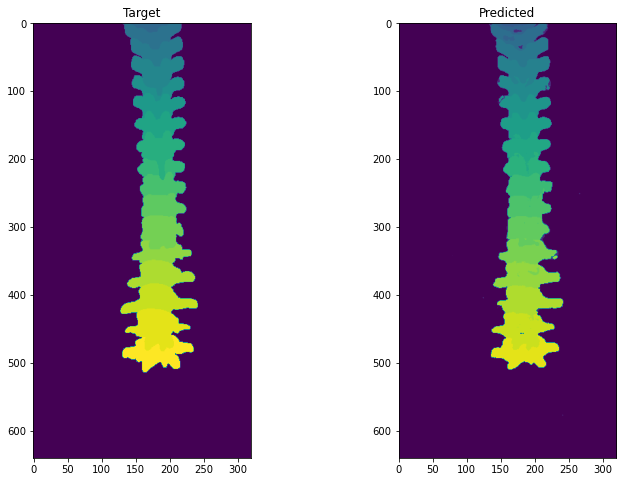

================================================== Training ==================================================
Epoch: 112, Train Loss: 0.3694402373035277, Average Dice Score: 0.5928490912826054
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.27 6: 0.57 7: 0.50 8: 0.79 9: 0.71 10: 0.74 11: 0.81 12: 0.79 13: 0.76 14: 0.80 15: 0.82 16: 0.84 17: 0.87 18: 0.79 19: 0.84 20: 0.86 21: 0.77 22: 0.77 23: 0.62 24: 0.52 25: 0.00
================================================= Validation =================================================
Epoch: 112, Val Loss: 0.5497712424544038, Average Dice Score: 0.408863723977412
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.27 6: 0.57 7: 0.50 8: 0.79 9: 0.71 10: 0.74 11: 0.81 12: 0.79 13: 0.76 14: 0.80 15: 0.82 16: 0.84 17: 0.87 18: 0.79 19: 0.84 20: 0.86 21: 0.77 22: 0.77 23: 0.62 24: 0.52 25: 0.00


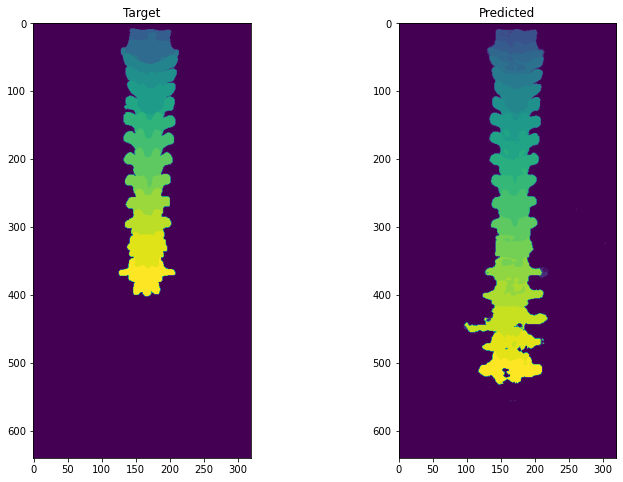

================================================== Training ==================================================
Epoch: 113, Train Loss: 0.3669631634075681, Average Dice Score: 0.5932206390996706
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.25 6: 0.59 7: 0.52 8: 0.79 9: 0.71 10: 0.74 11: 0.81 12: 0.79 13: 0.77 14: 0.79 15: 0.82 16: 0.84 17: 0.86 18: 0.80 19: 0.83 20: 0.86 21: 0.76 22: 0.74 23: 0.61 24: 0.52 25: 0.00
================================================= Validation =================================================
Epoch: 113, Val Loss: 0.5310141346493705, Average Dice Score: 0.4307469176355006
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.25 6: 0.59 7: 0.52 8: 0.79 9: 0.71 10: 0.74 11: 0.81 12: 0.79 13: 0.77 14: 0.79 15: 0.82 16: 0.84 17: 0.86 18: 0.80 19: 0.83 20: 0.86 21: 0.76 22: 0.74 23: 0.61 24: 0.52 25: 0.00


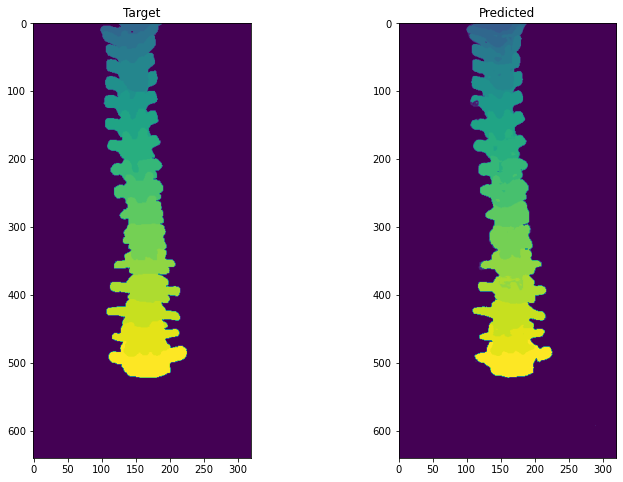

================================================== Training ==================================================
Epoch: 114, Train Loss: 0.364384893850023, Average Dice Score: 0.596548358237368
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.27 6: 0.56 7: 0.51 8: 0.80 9: 0.71 10: 0.74 11: 0.81 12: 0.80 13: 0.77 14: 0.81 15: 0.82 16: 0.84 17: 0.86 18: 0.80 19: 0.84 20: 0.87 21: 0.79 22: 0.77 23: 0.63 24: 0.52 25: 0.00
================================================= Validation =================================================
Epoch: 114, Val Loss: 0.5368164680043205, Average Dice Score: 0.42588699760182214
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.27 6: 0.56 7: 0.51 8: 0.80 9: 0.71 10: 0.74 11: 0.81 12: 0.80 13: 0.77 14: 0.81 15: 0.82 16: 0.84 17: 0.86 18: 0.80 19: 0.84 20: 0.87 21: 0.79 22: 0.77 23: 0.63 24: 0.52 25: 0.00


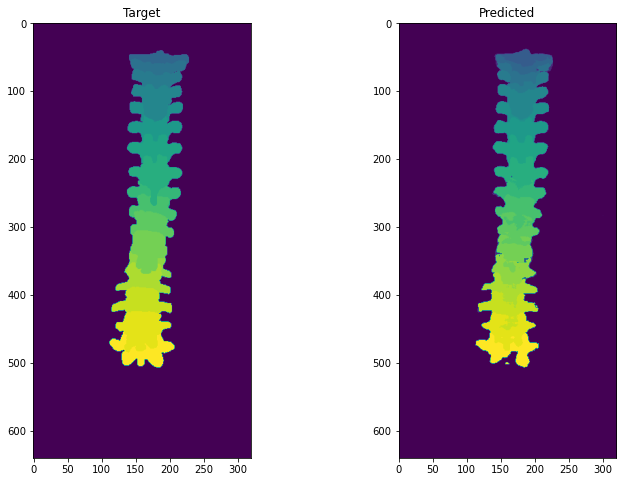

================================================== Training ==================================================
Epoch: 115, Train Loss: 0.3636319495719855, Average Dice Score: 0.5971984707237039
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.25 6: 0.61 7: 0.52 8: 0.79 9: 0.71 10: 0.74 11: 0.81 12: 0.80 13: 0.77 14: 0.81 15: 0.82 16: 0.84 17: 0.86 18: 0.80 19: 0.83 20: 0.86 21: 0.78 22: 0.77 23: 0.64 24: 0.53 25: 0.00
================================================= Validation =================================================
Epoch: 115, Val Loss: 0.5407574577409713, Average Dice Score: 0.42449933544555346
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.25 6: 0.61 7: 0.52 8: 0.79 9: 0.71 10: 0.74 11: 0.81 12: 0.80 13: 0.77 14: 0.81 15: 0.82 16: 0.84 17: 0.86 18: 0.80 19: 0.83 20: 0.86 21: 0.78 22: 0.77 23: 0.64 24: 0.53 25: 0.00


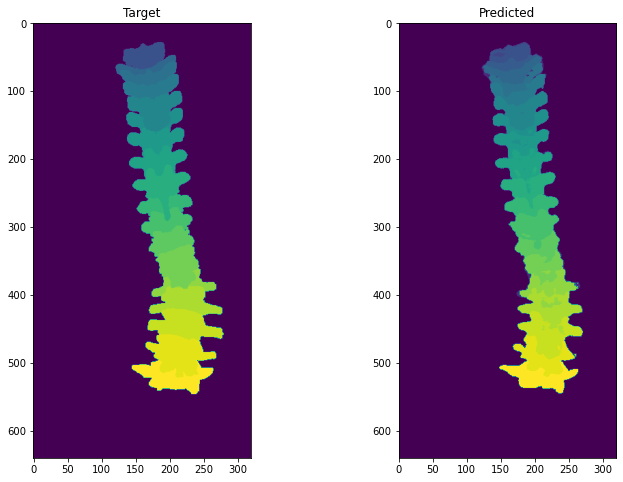

================================================== Training ==================================================
Epoch: 116, Train Loss: 0.3665021724485728, Average Dice Score: 0.5955237003917184
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.26 6: 0.60 7: 0.52 8: 0.79 9: 0.70 10: 0.73 11: 0.81 12: 0.80 13: 0.77 14: 0.80 15: 0.82 16: 0.84 17: 0.87 18: 0.81 19: 0.82 20: 0.85 21: 0.78 22: 0.76 23: 0.63 24: 0.52 25: 0.00
================================================= Validation =================================================
Epoch: 116, Val Loss: 0.5270989527467822, Average Dice Score: 0.4463519151094848
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.26 6: 0.60 7: 0.52 8: 0.79 9: 0.70 10: 0.73 11: 0.81 12: 0.80 13: 0.77 14: 0.80 15: 0.82 16: 0.84 17: 0.87 18: 0.81 19: 0.82 20: 0.85 21: 0.78 22: 0.76 23: 0.63 24: 0.52 25: 0.00


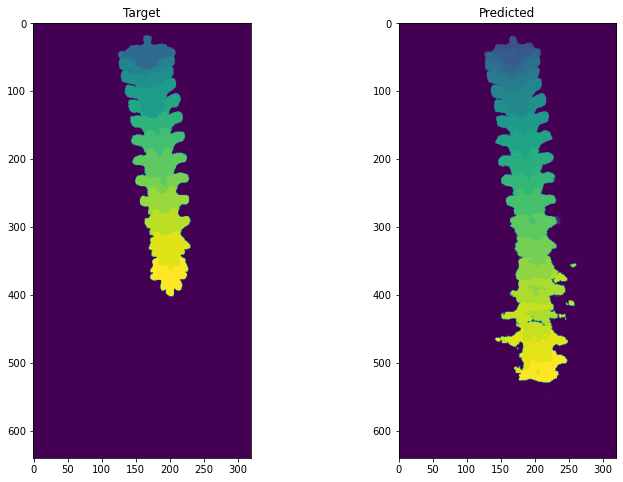

================================================== Training ==================================================
Epoch: 117, Train Loss: 0.36459183834510855, Average Dice Score: 0.5953232016667404
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.26 6: 0.60 7: 0.53 8: 0.79 9: 0.71 10: 0.74 11: 0.81 12: 0.80 13: 0.77 14: 0.82 15: 0.81 16: 0.84 17: 0.86 18: 0.81 19: 0.84 20: 0.86 21: 0.77 22: 0.75 23: 0.61 24: 0.51 25: 0.00
================================================= Validation =================================================
Epoch: 117, Val Loss: 0.5294672573199037, Average Dice Score: 0.434858749518683
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.26 6: 0.60 7: 0.53 8: 0.79 9: 0.71 10: 0.74 11: 0.81 12: 0.80 13: 0.77 14: 0.82 15: 0.81 16: 0.84 17: 0.86 18: 0.81 19: 0.84 20: 0.86 21: 0.77 22: 0.75 23: 0.61 24: 0.51 25: 0.00


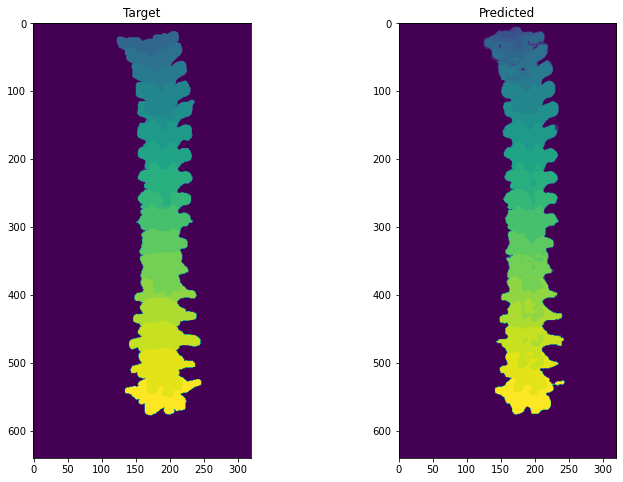

================================================== Training ==================================================
Epoch: 118, Train Loss: 0.36284228939908136, Average Dice Score: 0.596869173657568
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.24 6: 0.56 7: 0.53 8: 0.79 9: 0.71 10: 0.74 11: 0.81 12: 0.80 13: 0.78 14: 0.82 15: 0.82 16: 0.84 17: 0.86 18: 0.80 19: 0.84 20: 0.86 21: 0.79 22: 0.77 23: 0.64 24: 0.53 25: 0.00
================================================= Validation =================================================
Epoch: 118, Val Loss: 0.5311677768582204, Average Dice Score: 0.4333794662091825
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.24 6: 0.56 7: 0.53 8: 0.79 9: 0.71 10: 0.74 11: 0.81 12: 0.80 13: 0.78 14: 0.82 15: 0.82 16: 0.84 17: 0.86 18: 0.80 19: 0.84 20: 0.86 21: 0.79 22: 0.77 23: 0.64 24: 0.53 25: 0.00


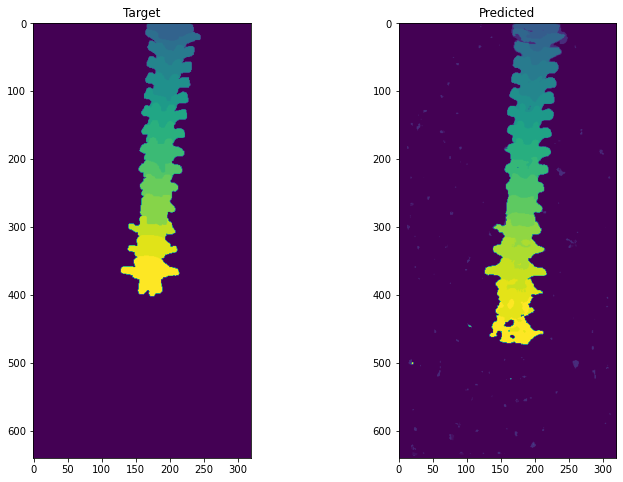

================================================== Training ==================================================
Epoch: 119, Train Loss: 0.3625750343476792, Average Dice Score: 0.5987133681306153
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.26 6: 0.60 7: 0.53 8: 0.80 9: 0.72 10: 0.74 11: 0.81 12: 0.80 13: 0.78 14: 0.82 15: 0.82 16: 0.84 17: 0.86 18: 0.80 19: 0.82 20: 0.86 21: 0.79 22: 0.77 23: 0.62 24: 0.52 25: 0.00
================================================= Validation =================================================
Epoch: 119, Val Loss: 0.5397985743694618, Average Dice Score: 0.4226762855593414
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.26 6: 0.60 7: 0.53 8: 0.80 9: 0.72 10: 0.74 11: 0.81 12: 0.80 13: 0.78 14: 0.82 15: 0.82 16: 0.84 17: 0.86 18: 0.80 19: 0.82 20: 0.86 21: 0.79 22: 0.77 23: 0.62 24: 0.52 25: 0.00


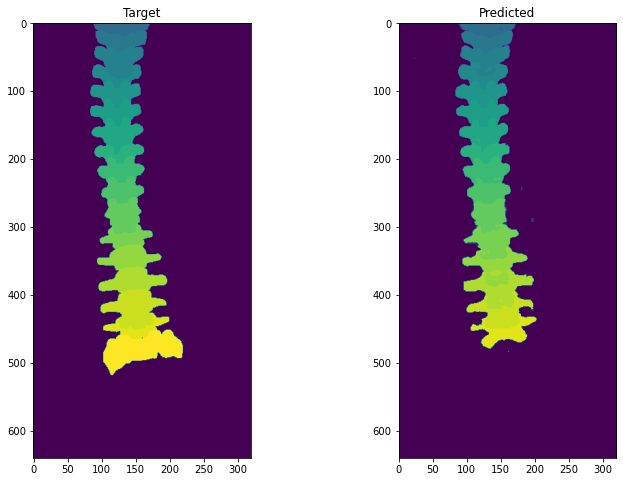

================================================== Training ==================================================
Epoch: 120, Train Loss: 0.3653380654203637, Average Dice Score: 0.5964900299898689
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.24 6: 0.58 7: 0.53 8: 0.79 9: 0.70 10: 0.73 11: 0.81 12: 0.80 13: 0.78 14: 0.82 15: 0.81 16: 0.84 17: 0.86 18: 0.82 19: 0.82 20: 0.87 21: 0.79 22: 0.77 23: 0.63 24: 0.53 25: 0.00
================================================= Validation =================================================
Epoch: 120, Val Loss: 0.5357657993426088, Average Dice Score: 0.40768930251625934
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.24 6: 0.58 7: 0.53 8: 0.79 9: 0.70 10: 0.73 11: 0.81 12: 0.80 13: 0.78 14: 0.82 15: 0.81 16: 0.84 17: 0.86 18: 0.82 19: 0.82 20: 0.87 21: 0.79 22: 0.77 23: 0.63 24: 0.53 25: 0.00


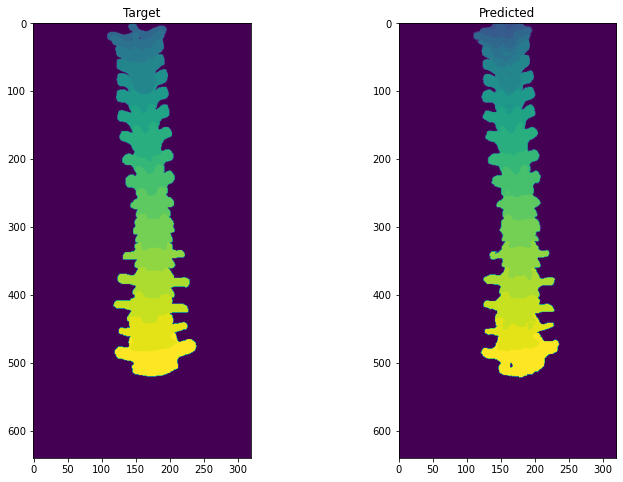

================================================== Training ==================================================
Epoch: 121, Train Loss: 0.36479068538638587, Average Dice Score: 0.5942132259482015
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.22 6: 0.57 7: 0.53 8: 0.79 9: 0.71 10: 0.73 11: 0.81 12: 0.79 13: 0.77 14: 0.82 15: 0.81 16: 0.85 17: 0.86 18: 0.81 19: 0.83 20: 0.87 21: 0.78 22: 0.77 23: 0.63 24: 0.51 25: 0.00
================================================= Validation =================================================
Epoch: 121, Val Loss: 0.5302755764273347, Average Dice Score: 0.4360971291562178
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.22 6: 0.57 7: 0.53 8: 0.79 9: 0.71 10: 0.73 11: 0.81 12: 0.79 13: 0.77 14: 0.82 15: 0.81 16: 0.85 17: 0.86 18: 0.81 19: 0.83 20: 0.87 21: 0.78 22: 0.77 23: 0.63 24: 0.51 25: 0.00


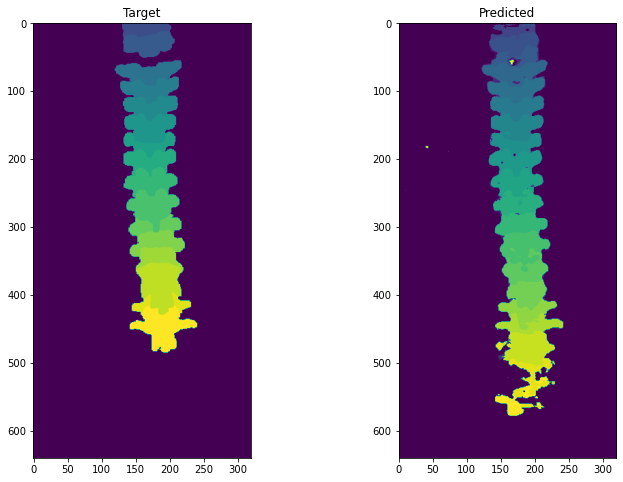

================================================== Training ==================================================
Epoch: 122, Train Loss: 0.3629148572754124, Average Dice Score: 0.5969460372066456
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.27 6: 0.59 7: 0.52 8: 0.80 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.78 14: 0.82 15: 0.82 16: 0.84 17: 0.86 18: 0.81 19: 0.82 20: 0.86 21: 0.78 22: 0.76 23: 0.62 24: 0.51 25: 0.00
================================================= Validation =================================================
Epoch: 122, Val Loss: 0.6025715509399039, Average Dice Score: 0.358089734361652
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.27 6: 0.59 7: 0.52 8: 0.80 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.78 14: 0.82 15: 0.82 16: 0.84 17: 0.86 18: 0.81 19: 0.82 20: 0.86 21: 0.78 22: 0.76 23: 0.62 24: 0.51 25: 0.00


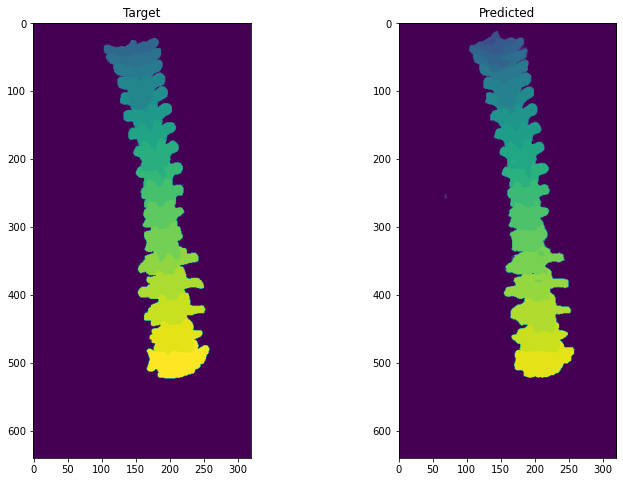

================================================== Training ==================================================
Epoch: 123, Train Loss: 0.37328568589375877, Average Dice Score: 0.5914628210059684
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.28 6: 0.59 7: 0.51 8: 0.79 9: 0.70 10: 0.72 11: 0.80 12: 0.79 13: 0.75 14: 0.81 15: 0.80 16: 0.84 17: 0.85 18: 0.81 19: 0.80 20: 0.85 21: 0.78 22: 0.76 23: 0.62 24: 0.53 25: 0.00
================================================= Validation =================================================
Epoch: 123, Val Loss: 0.5440363405180759, Average Dice Score: 0.4099523632346454
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.28 6: 0.59 7: 0.51 8: 0.79 9: 0.70 10: 0.72 11: 0.80 12: 0.79 13: 0.75 14: 0.81 15: 0.80 16: 0.84 17: 0.85 18: 0.81 19: 0.80 20: 0.85 21: 0.78 22: 0.76 23: 0.62 24: 0.53 25: 0.00


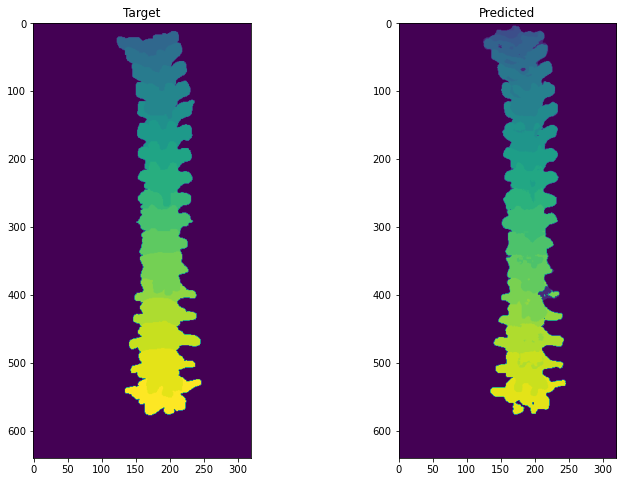

================================================== Training ==================================================
Epoch: 124, Train Loss: 0.3728032249452949, Average Dice Score: 0.5876141868428643
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.20 6: 0.60 7: 0.50 8: 0.80 9: 0.70 10: 0.73 11: 0.80 12: 0.79 13: 0.75 14: 0.79 15: 0.80 16: 0.83 17: 0.86 18: 0.81 19: 0.81 20: 0.85 21: 0.77 22: 0.76 23: 0.62 24: 0.51 25: 0.00
================================================= Validation =================================================
Epoch: 124, Val Loss: 0.553340247420014, Average Dice Score: 0.40839204797014805
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.20 6: 0.60 7: 0.50 8: 0.80 9: 0.70 10: 0.73 11: 0.80 12: 0.79 13: 0.75 14: 0.79 15: 0.80 16: 0.83 17: 0.86 18: 0.81 19: 0.81 20: 0.85 21: 0.77 22: 0.76 23: 0.62 24: 0.51 25: 0.00


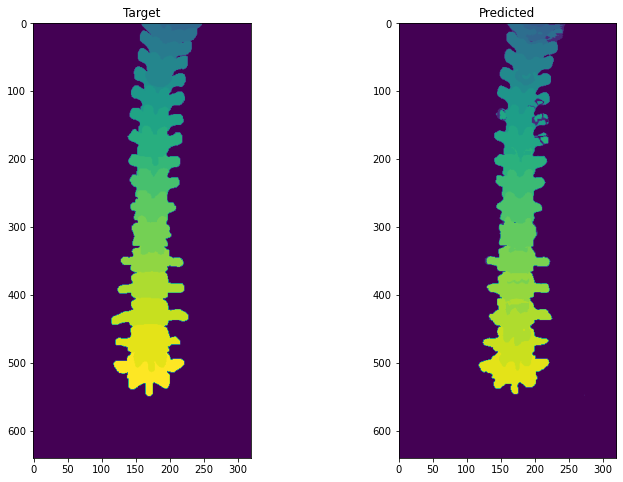

================================================== Training ==================================================
Epoch: 125, Train Loss: 0.3751486927766415, Average Dice Score: 0.5849192054128177
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.21 6: 0.57 7: 0.52 8: 0.79 9: 0.70 10: 0.73 11: 0.80 12: 0.77 13: 0.73 14: 0.80 15: 0.80 16: 0.83 17: 0.84 18: 0.81 19: 0.81 20: 0.85 21: 0.77 22: 0.76 23: 0.61 24: 0.52 25: 0.00
================================================= Validation =================================================
Epoch: 125, Val Loss: 0.5619177163624373, Average Dice Score: 0.3922733968614621
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.21 6: 0.57 7: 0.52 8: 0.79 9: 0.70 10: 0.73 11: 0.80 12: 0.77 13: 0.73 14: 0.80 15: 0.80 16: 0.83 17: 0.84 18: 0.81 19: 0.81 20: 0.85 21: 0.77 22: 0.76 23: 0.61 24: 0.52 25: 0.00


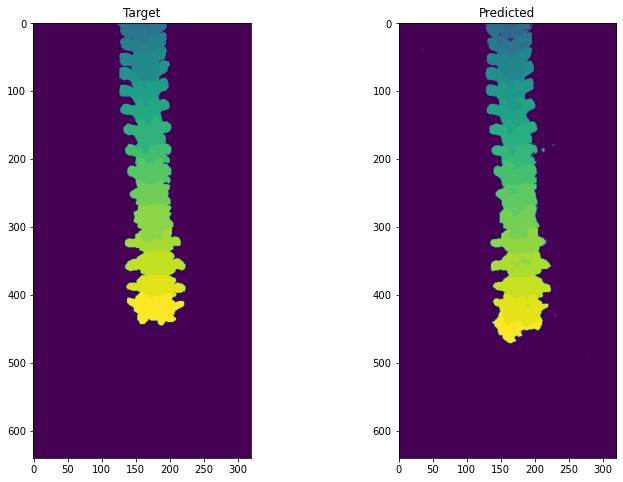

================================================== Training ==================================================
Epoch: 126, Train Loss: 0.3775300460020324, Average Dice Score: 0.5831966329153361
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.22 6: 0.57 7: 0.51 8: 0.80 9: 0.70 10: 0.72 11: 0.79 12: 0.77 13: 0.73 14: 0.77 15: 0.80 16: 0.82 17: 0.85 18: 0.82 19: 0.81 20: 0.85 21: 0.77 22: 0.76 23: 0.62 24: 0.50 25: 0.00
================================================= Validation =================================================
Epoch: 126, Val Loss: 0.6047224158146343, Average Dice Score: 0.3562403984386261
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.22 6: 0.57 7: 0.51 8: 0.80 9: 0.70 10: 0.72 11: 0.79 12: 0.77 13: 0.73 14: 0.77 15: 0.80 16: 0.82 17: 0.85 18: 0.82 19: 0.81 20: 0.85 21: 0.77 22: 0.76 23: 0.62 24: 0.50 25: 0.00


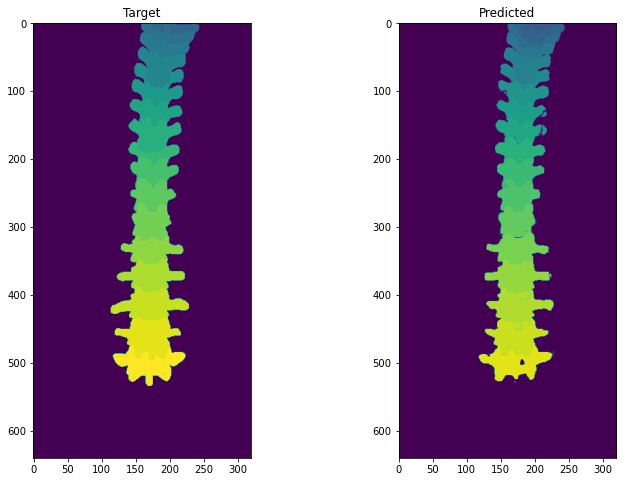

================================================== Training ==================================================
Epoch: 127, Train Loss: 0.3763900627149822, Average Dice Score: 0.5828028396205545
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.20 6: 0.55 7: 0.50 8: 0.78 9: 0.69 10: 0.72 11: 0.80 12: 0.77 13: 0.74 14: 0.78 15: 0.79 16: 0.83 17: 0.84 18: 0.81 19: 0.82 20: 0.86 21: 0.77 22: 0.76 23: 0.62 24: 0.53 25: 0.00
================================================= Validation =================================================
Epoch: 127, Val Loss: 0.5950369961926194, Average Dice Score: 0.375424328791479
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.20 6: 0.55 7: 0.50 8: 0.78 9: 0.69 10: 0.72 11: 0.80 12: 0.77 13: 0.74 14: 0.78 15: 0.79 16: 0.83 17: 0.84 18: 0.81 19: 0.82 20: 0.86 21: 0.77 22: 0.76 23: 0.62 24: 0.53 25: 0.00


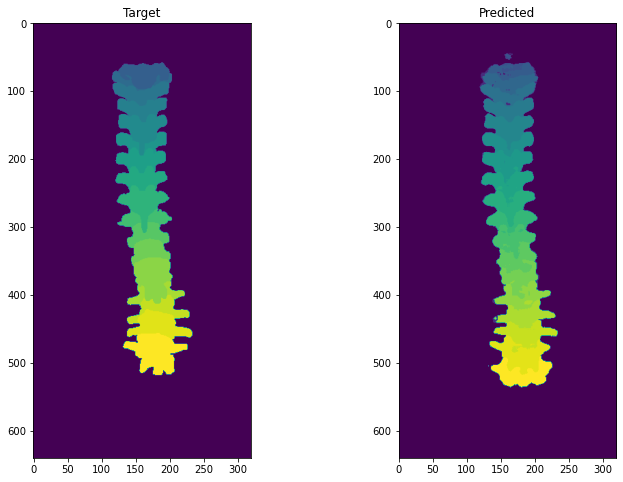

================================================== Training ==================================================
Epoch: 128, Train Loss: 0.37304422407988413, Average Dice Score: 0.5882518305917183
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.22 6: 0.59 7: 0.54 8: 0.78 9: 0.70 10: 0.73 11: 0.81 12: 0.78 13: 0.75 14: 0.79 15: 0.81 16: 0.83 17: 0.85 18: 0.81 19: 0.81 20: 0.85 21: 0.78 22: 0.76 23: 0.62 24: 0.50 25: 0.00
================================================= Validation =================================================
Epoch: 128, Val Loss: 0.5455784025739451, Average Dice Score: 0.42230222427114106
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.22 6: 0.59 7: 0.54 8: 0.78 9: 0.70 10: 0.73 11: 0.81 12: 0.78 13: 0.75 14: 0.79 15: 0.81 16: 0.83 17: 0.85 18: 0.81 19: 0.81 20: 0.85 21: 0.78 22: 0.76 23: 0.62 24: 0.50 25: 0.00


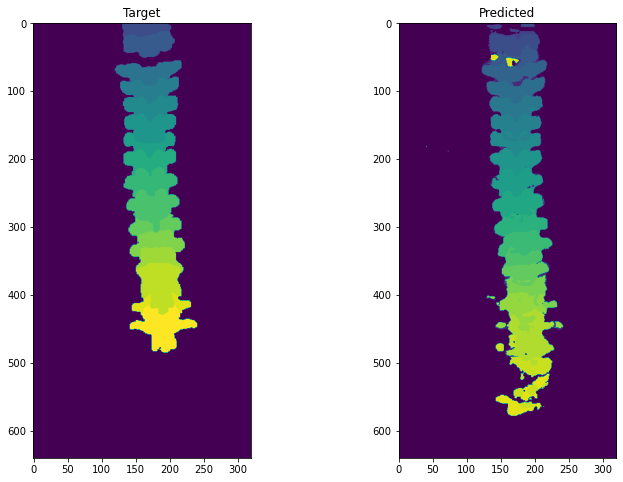

================================================== Training ==================================================
Epoch: 129, Train Loss: 0.3677388421147, Average Dice Score: 0.5900435791813435
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.22 6: 0.57 7: 0.52 8: 0.79 9: 0.70 10: 0.74 11: 0.81 12: 0.79 13: 0.76 14: 0.81 15: 0.81 16: 0.84 17: 0.85 18: 0.81 19: 0.82 20: 0.85 21: 0.78 22: 0.75 23: 0.62 24: 0.51 25: 0.00
================================================= Validation =================================================
Epoch: 129, Val Loss: 0.5478504446686291, Average Dice Score: 0.4134074120963861
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.22 6: 0.57 7: 0.52 8: 0.79 9: 0.70 10: 0.74 11: 0.81 12: 0.79 13: 0.76 14: 0.81 15: 0.81 16: 0.84 17: 0.85 18: 0.81 19: 0.82 20: 0.85 21: 0.78 22: 0.75 23: 0.62 24: 0.51 25: 0.00


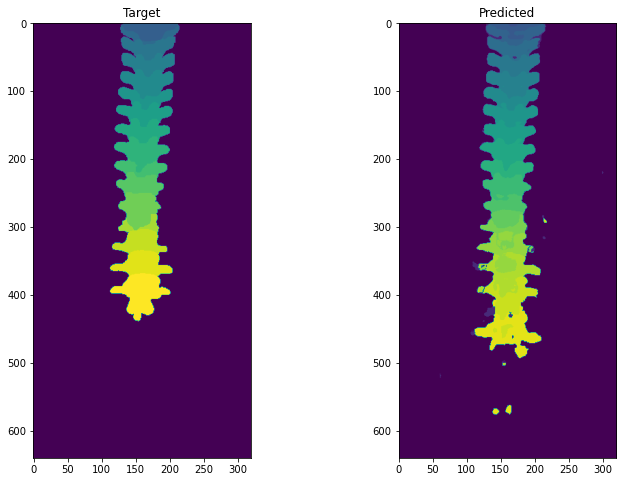

================================================== Training ==================================================
Epoch: 130, Train Loss: 0.3732767337291654, Average Dice Score: 0.5882994229365258
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.05 5: 0.24 6: 0.56 7: 0.52 8: 0.78 9: 0.69 10: 0.73 11: 0.80 12: 0.78 13: 0.76 14: 0.81 15: 0.80 16: 0.84 17: 0.85 18: 0.80 19: 0.80 20: 0.85 21: 0.77 22: 0.75 23: 0.62 24: 0.50 25: 0.00
================================================= Validation =================================================
Epoch: 130, Val Loss: 0.5509838198052078, Average Dice Score: 0.4172212016699499
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.05 5: 0.24 6: 0.56 7: 0.52 8: 0.78 9: 0.69 10: 0.73 11: 0.80 12: 0.78 13: 0.76 14: 0.81 15: 0.80 16: 0.84 17: 0.85 18: 0.80 19: 0.80 20: 0.85 21: 0.77 22: 0.75 23: 0.62 24: 0.50 25: 0.00


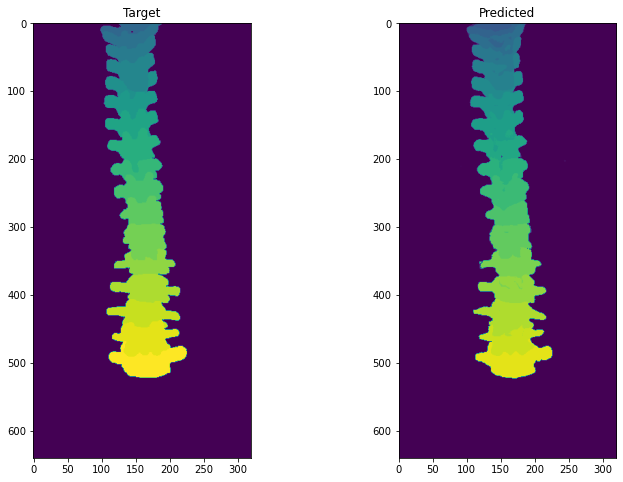

================================================== Training ==================================================
Epoch: 131, Train Loss: 0.3694650629920235, Average Dice Score: 0.593462663541808
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.02 5: 0.30 6: 0.52 7: 0.53 8: 0.79 9: 0.70 10: 0.73 11: 0.81 12: 0.79 13: 0.76 14: 0.81 15: 0.83 16: 0.83 17: 0.86 18: 0.82 19: 0.81 20: 0.86 21: 0.77 22: 0.76 23: 0.62 24: 0.52 25: 0.00
================================================= Validation =================================================
Epoch: 131, Val Loss: 0.5411508083343506, Average Dice Score: 0.4206726995518166
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.02 5: 0.30 6: 0.52 7: 0.53 8: 0.79 9: 0.70 10: 0.73 11: 0.81 12: 0.79 13: 0.76 14: 0.81 15: 0.83 16: 0.83 17: 0.86 18: 0.82 19: 0.81 20: 0.86 21: 0.77 22: 0.76 23: 0.62 24: 0.52 25: 0.00


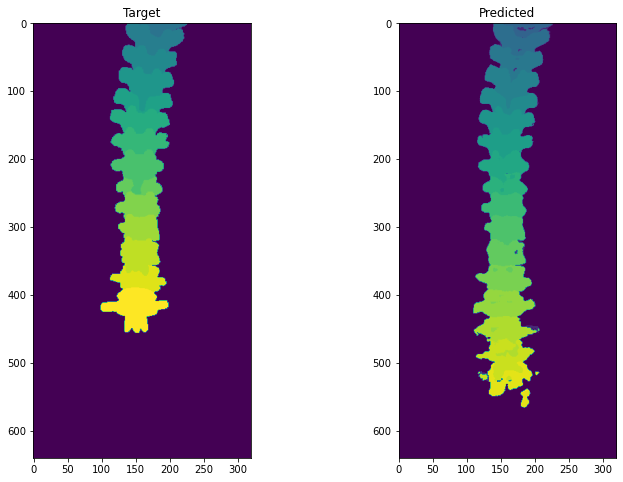

================================================== Training ==================================================
Epoch: 132, Train Loss: 0.3644945317096212, Average Dice Score: 0.5981100884496662
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.31 6: 0.59 7: 0.53 8: 0.80 9: 0.70 10: 0.74 11: 0.81 12: 0.80 13: 0.77 14: 0.81 15: 0.82 16: 0.83 17: 0.86 18: 0.81 19: 0.83 20: 0.86 21: 0.78 22: 0.75 23: 0.62 24: 0.52 25: 0.00
================================================= Validation =================================================
Epoch: 132, Val Loss: 0.5395233533421501, Average Dice Score: 0.4347765300440257
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.31 6: 0.59 7: 0.53 8: 0.80 9: 0.70 10: 0.74 11: 0.81 12: 0.80 13: 0.77 14: 0.81 15: 0.82 16: 0.83 17: 0.86 18: 0.81 19: 0.83 20: 0.86 21: 0.78 22: 0.75 23: 0.62 24: 0.52 25: 0.00


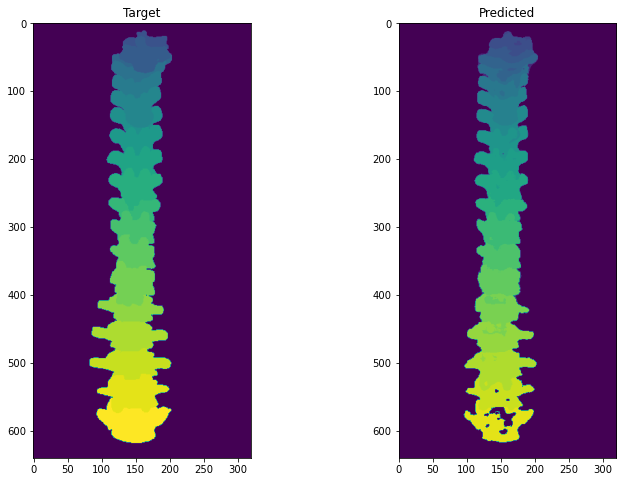

================================================== Training ==================================================
Epoch: 133, Train Loss: 0.3621194310256251, Average Dice Score: 0.6028258634007297
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.31 6: 0.62 7: 0.53 8: 0.80 9: 0.71 10: 0.74 11: 0.81 12: 0.80 13: 0.78 14: 0.82 15: 0.82 16: 0.84 17: 0.86 18: 0.82 19: 0.82 20: 0.87 21: 0.78 22: 0.78 23: 0.64 24: 0.54 25: 0.00
================================================= Validation =================================================
Epoch: 133, Val Loss: 0.5279631546286286, Average Dice Score: 0.4315754798095103
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.31 6: 0.62 7: 0.53 8: 0.80 9: 0.71 10: 0.74 11: 0.81 12: 0.80 13: 0.78 14: 0.82 15: 0.82 16: 0.84 17: 0.86 18: 0.82 19: 0.82 20: 0.87 21: 0.78 22: 0.78 23: 0.64 24: 0.54 25: 0.00


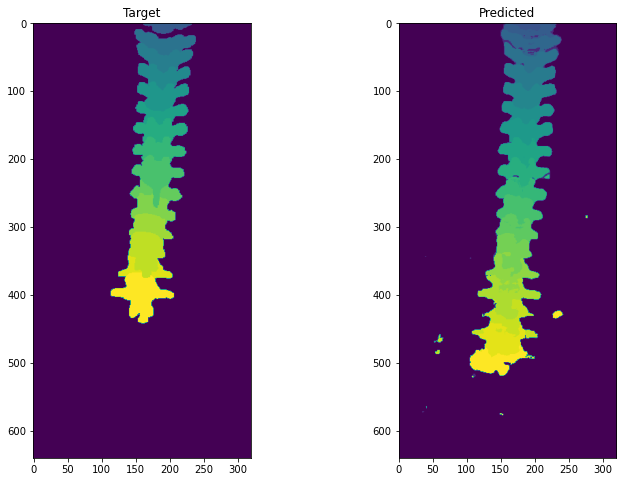

================================================== Training ==================================================
Epoch: 134, Train Loss: 0.36221581640832495, Average Dice Score: 0.5977343160283414
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.30 6: 0.59 7: 0.51 8: 0.80 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.78 14: 0.82 15: 0.82 16: 0.84 17: 0.86 18: 0.82 19: 0.83 20: 0.86 21: 0.79 22: 0.76 23: 0.61 24: 0.49 25: 0.00
================================================= Validation =================================================
Epoch: 134, Val Loss: 0.5430611880099188, Average Dice Score: 0.4185604586629324
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.01 5: 0.30 6: 0.59 7: 0.51 8: 0.80 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.78 14: 0.82 15: 0.82 16: 0.84 17: 0.86 18: 0.82 19: 0.83 20: 0.86 21: 0.79 22: 0.76 23: 0.61 24: 0.49 25: 0.00


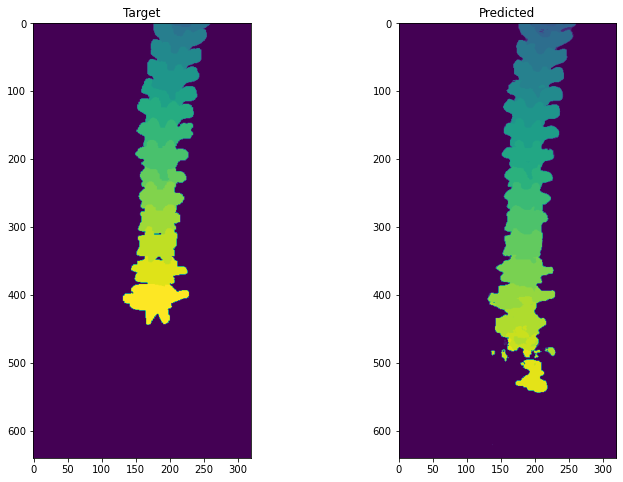

================================================== Training ==================================================
Epoch: 135, Train Loss: 0.36295436481965127, Average Dice Score: 0.598470548236207
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.28 6: 0.59 7: 0.54 8: 0.79 9: 0.71 10: 0.74 11: 0.81 12: 0.80 13: 0.78 14: 0.82 15: 0.81 16: 0.84 17: 0.86 18: 0.82 19: 0.83 20: 0.87 21: 0.79 22: 0.75 23: 0.61 24: 0.51 25: 0.00
================================================= Validation =================================================
Epoch: 135, Val Loss: 0.5389416637967844, Average Dice Score: 0.41873770299152674
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.28 6: 0.59 7: 0.54 8: 0.79 9: 0.71 10: 0.74 11: 0.81 12: 0.80 13: 0.78 14: 0.82 15: 0.81 16: 0.84 17: 0.86 18: 0.82 19: 0.83 20: 0.87 21: 0.79 22: 0.75 23: 0.61 24: 0.51 25: 0.00


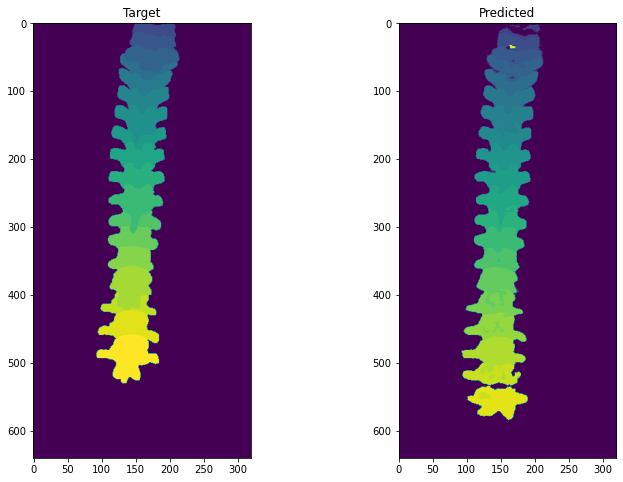

================================================== Training ==================================================
Epoch: 136, Train Loss: 0.3606613789488188, Average Dice Score: 0.6013135221446448
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.28 6: 0.57 7: 0.56 8: 0.81 9: 0.71 10: 0.74 11: 0.81 12: 0.80 13: 0.78 14: 0.83 15: 0.81 16: 0.84 17: 0.85 18: 0.81 19: 0.83 20: 0.86 21: 0.79 22: 0.78 23: 0.63 24: 0.53 25: 0.00
================================================= Validation =================================================
Epoch: 136, Val Loss: 0.5305896919281756, Average Dice Score: 0.4289109939364364
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.28 6: 0.57 7: 0.56 8: 0.81 9: 0.71 10: 0.74 11: 0.81 12: 0.80 13: 0.78 14: 0.83 15: 0.81 16: 0.84 17: 0.85 18: 0.81 19: 0.83 20: 0.86 21: 0.79 22: 0.78 23: 0.63 24: 0.53 25: 0.00


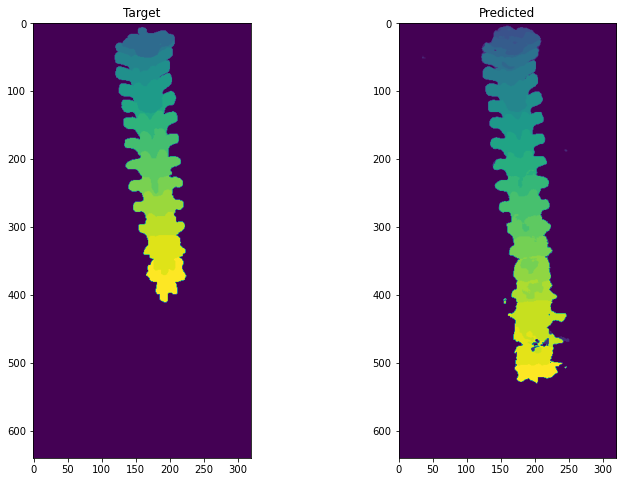

================================================== Training ==================================================
Epoch: 137, Train Loss: 0.36075213133864054, Average Dice Score: 0.5984123172035354
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.28 6: 0.57 7: 0.53 8: 0.80 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.78 14: 0.83 15: 0.81 16: 0.84 17: 0.86 18: 0.82 19: 0.83 20: 0.87 21: 0.77 22: 0.76 23: 0.63 24: 0.52 25: 0.01
================================================= Validation =================================================
Epoch: 137, Val Loss: 0.5318391479429652, Average Dice Score: 0.430200342011797
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.28 6: 0.57 7: 0.53 8: 0.80 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.78 14: 0.83 15: 0.81 16: 0.84 17: 0.86 18: 0.82 19: 0.83 20: 0.87 21: 0.77 22: 0.76 23: 0.63 24: 0.52 25: 0.01


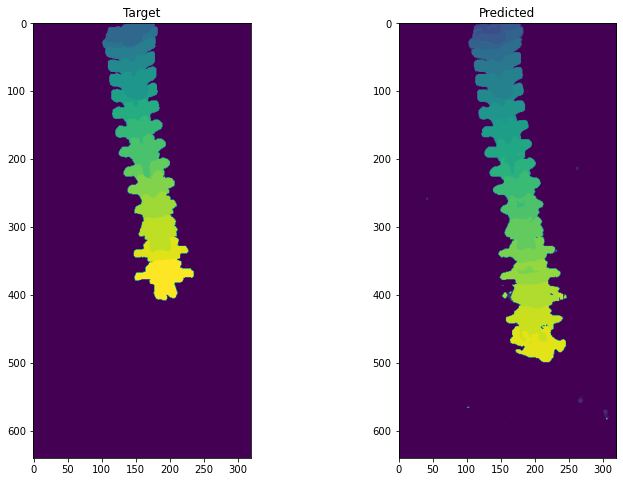

================================================== Training ==================================================
Epoch: 138, Train Loss: 0.35951142257296276, Average Dice Score: 0.6028888105854311
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.32 6: 0.58 7: 0.55 8: 0.80 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.84 17: 0.86 18: 0.82 19: 0.83 20: 0.86 21: 0.79 22: 0.76 23: 0.63 24: 0.52 25: 0.00
================================================= Validation =================================================
Epoch: 138, Val Loss: 0.5285032147266826, Average Dice Score: 0.44100419653704004
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.32 6: 0.58 7: 0.55 8: 0.80 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.84 17: 0.86 18: 0.82 19: 0.83 20: 0.86 21: 0.79 22: 0.76 23: 0.63 24: 0.52 25: 0.00


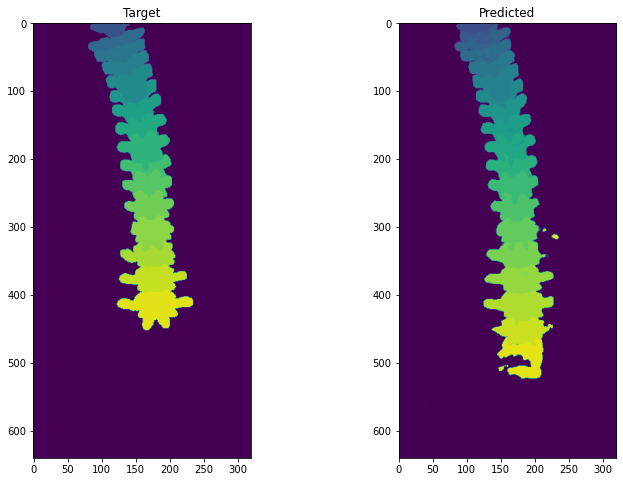

================================================== Training ==================================================
Epoch: 139, Train Loss: 0.35843136842913415, Average Dice Score: 0.6028118915796747
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.27 6: 0.63 7: 0.53 8: 0.79 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.83 15: 0.81 16: 0.84 17: 0.86 18: 0.82 19: 0.83 20: 0.87 21: 0.79 22: 0.78 23: 0.63 24: 0.53 25: 0.00
================================================= Validation =================================================
Epoch: 139, Val Loss: 0.5287382387724079, Average Dice Score: 0.4403046221903362
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.27 6: 0.63 7: 0.53 8: 0.79 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.83 15: 0.81 16: 0.84 17: 0.86 18: 0.82 19: 0.83 20: 0.87 21: 0.79 22: 0.78 23: 0.63 24: 0.53 25: 0.00


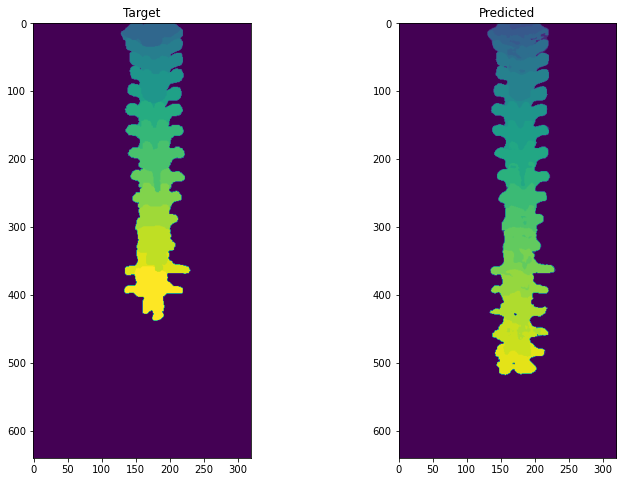

================================================== Training ==================================================
Epoch: 140, Train Loss: 0.3583750116003947, Average Dice Score: 0.6050105069730064
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.32 6: 0.64 7: 0.55 8: 0.80 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.84 17: 0.86 18: 0.82 19: 0.83 20: 0.86 21: 0.79 22: 0.76 23: 0.63 24: 0.53 25: 0.00
================================================= Validation =================================================
Epoch: 140, Val Loss: 0.5298597626998777, Average Dice Score: 0.44083993364619484
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.32 6: 0.64 7: 0.55 8: 0.80 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.84 17: 0.86 18: 0.82 19: 0.83 20: 0.86 21: 0.79 22: 0.76 23: 0.63 24: 0.53 25: 0.00


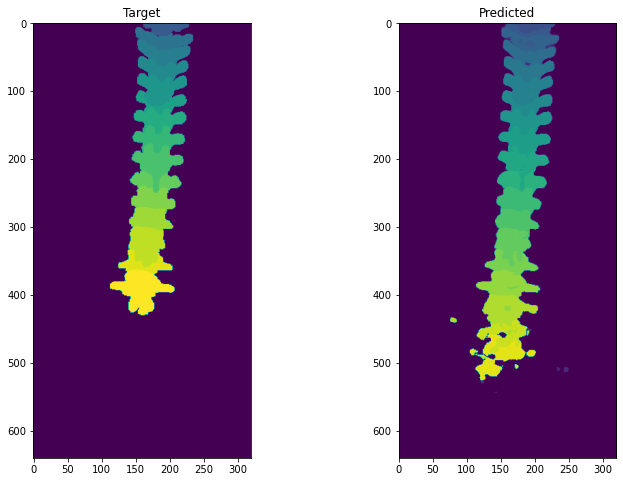

================================================== Training ==================================================
Epoch: 141, Train Loss: 0.3582786770444585, Average Dice Score: 0.6028324493819672
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.28 6: 0.63 7: 0.53 8: 0.80 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.84 17: 0.86 18: 0.83 19: 0.83 20: 0.86 21: 0.80 22: 0.76 23: 0.63 24: 0.53 25: 0.00
================================================= Validation =================================================
Epoch: 141, Val Loss: 0.533541458552001, Average Dice Score: 0.42580207086764954
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.28 6: 0.63 7: 0.53 8: 0.80 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.84 17: 0.86 18: 0.83 19: 0.83 20: 0.86 21: 0.80 22: 0.76 23: 0.63 24: 0.53 25: 0.00


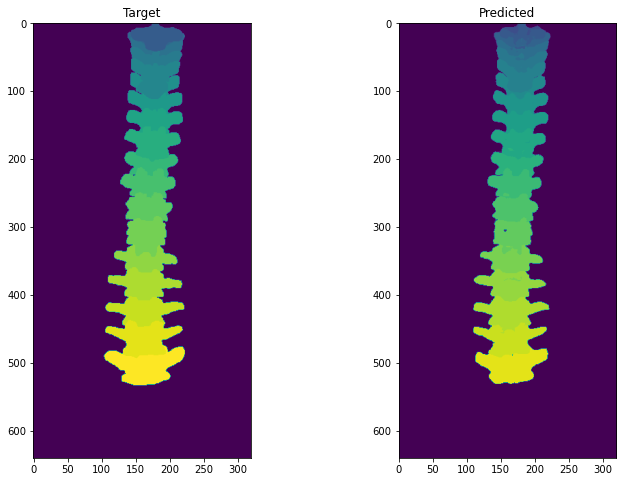

================================================== Training ==================================================
Epoch: 142, Train Loss: 0.3584130574858387, Average Dice Score: 0.6018154365559036
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.24 6: 0.58 7: 0.53 8: 0.80 9: 0.70 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.84 17: 0.86 18: 0.83 19: 0.83 20: 0.86 21: 0.80 22: 0.78 23: 0.66 24: 0.55 25: 0.00
================================================= Validation =================================================
Epoch: 142, Val Loss: 0.5239933944139324, Average Dice Score: 0.43665750676918796
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.24 6: 0.58 7: 0.53 8: 0.80 9: 0.70 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.84 17: 0.86 18: 0.83 19: 0.83 20: 0.86 21: 0.80 22: 0.78 23: 0.66 24: 0.55 25: 0.00


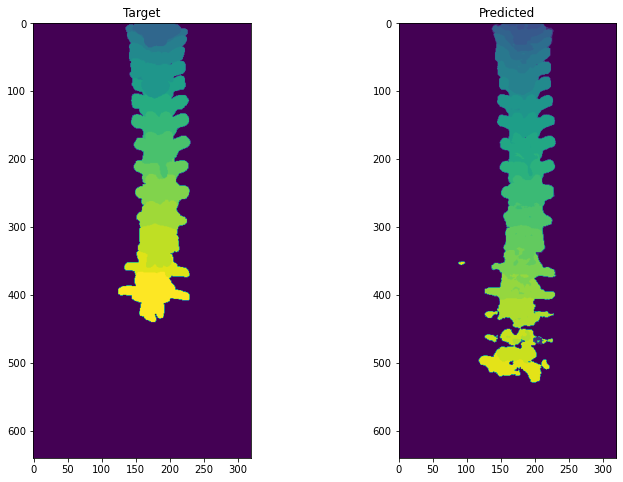

================================================== Training ==================================================
Epoch: 143, Train Loss: 0.35879319962866235, Average Dice Score: 0.6029941224327905
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.30 6: 0.60 7: 0.55 8: 0.79 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.84 17: 0.86 18: 0.83 19: 0.83 20: 0.86 21: 0.80 22: 0.76 23: 0.64 24: 0.54 25: 0.01
================================================= Validation =================================================
Epoch: 143, Val Loss: 0.5337956303455791, Average Dice Score: 0.429088894160344
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.30 6: 0.60 7: 0.55 8: 0.79 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.84 17: 0.86 18: 0.83 19: 0.83 20: 0.86 21: 0.80 22: 0.76 23: 0.64 24: 0.54 25: 0.01


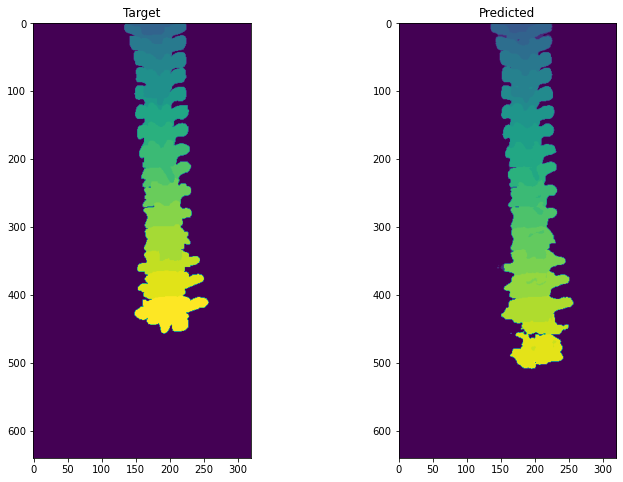

================================================== Training ==================================================
Epoch: 144, Train Loss: 0.35849146590946407, Average Dice Score: 0.6055091786602774
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.29 6: 0.62 7: 0.56 8: 0.79 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.85 17: 0.86 18: 0.83 19: 0.83 20: 0.86 21: 0.80 22: 0.78 23: 0.64 24: 0.54 25: 0.00
================================================= Validation =================================================
Epoch: 144, Val Loss: 0.5369447215658719, Average Dice Score: 0.4272149250835949
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.29 6: 0.62 7: 0.56 8: 0.79 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.85 17: 0.86 18: 0.83 19: 0.83 20: 0.86 21: 0.80 22: 0.78 23: 0.64 24: 0.54 25: 0.00


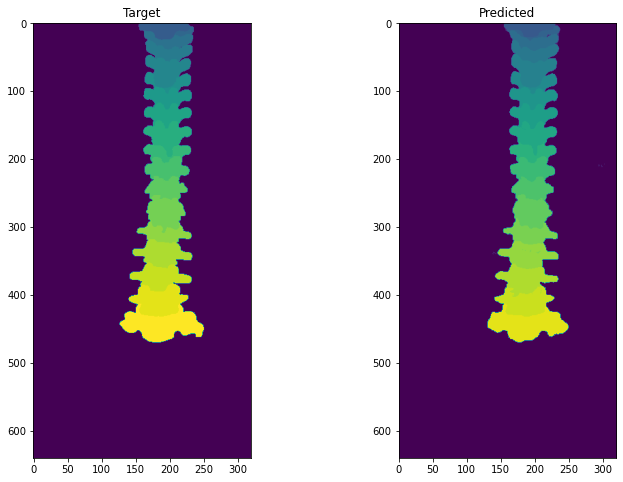

================================================== Training ==================================================
Epoch: 145, Train Loss: 0.3579983504537732, Average Dice Score: 0.6069173267628508
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.31 6: 0.62 7: 0.56 8: 0.79 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.85 17: 0.85 18: 0.83 19: 0.83 20: 0.86 21: 0.80 22: 0.78 23: 0.65 24: 0.55 25: 0.00
================================================= Validation =================================================
Epoch: 145, Val Loss: 0.5350361700917854, Average Dice Score: 0.4371122124039892
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.31 6: 0.62 7: 0.56 8: 0.79 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.85 17: 0.85 18: 0.83 19: 0.83 20: 0.86 21: 0.80 22: 0.78 23: 0.65 24: 0.55 25: 0.00


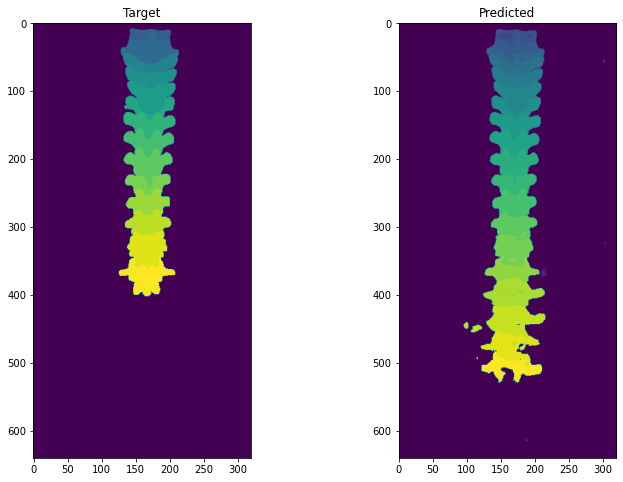

================================================== Training ==================================================
Epoch: 146, Train Loss: 0.35829964386312524, Average Dice Score: 0.6015846970579538
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.28 6: 0.59 7: 0.55 8: 0.79 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.84 17: 0.86 18: 0.83 19: 0.83 20: 0.86 21: 0.78 22: 0.76 23: 0.64 24: 0.54 25: 0.00
================================================= Validation =================================================
Epoch: 146, Val Loss: 0.5366108143915895, Average Dice Score: 0.4357282386312031
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.28 6: 0.59 7: 0.55 8: 0.79 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.84 17: 0.86 18: 0.83 19: 0.83 20: 0.86 21: 0.78 22: 0.76 23: 0.64 24: 0.54 25: 0.00


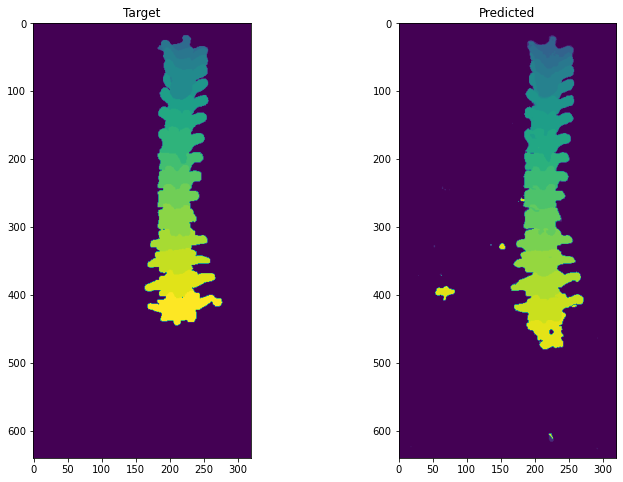

================================================== Training ==================================================
Epoch: 147, Train Loss: 0.3580410997261627, Average Dice Score: 0.6008284509978261
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.23 6: 0.59 7: 0.52 8: 0.80 9: 0.70 10: 0.75 11: 0.80 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.85 17: 0.85 18: 0.83 19: 0.83 20: 0.87 21: 0.80 22: 0.78 23: 0.66 24: 0.54 25: 0.00
================================================= Validation =================================================
Epoch: 147, Val Loss: 0.5345955510608486, Average Dice Score: 0.43006588529308104
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.23 6: 0.59 7: 0.52 8: 0.80 9: 0.70 10: 0.75 11: 0.80 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.85 17: 0.85 18: 0.83 19: 0.83 20: 0.87 21: 0.80 22: 0.78 23: 0.66 24: 0.54 25: 0.00


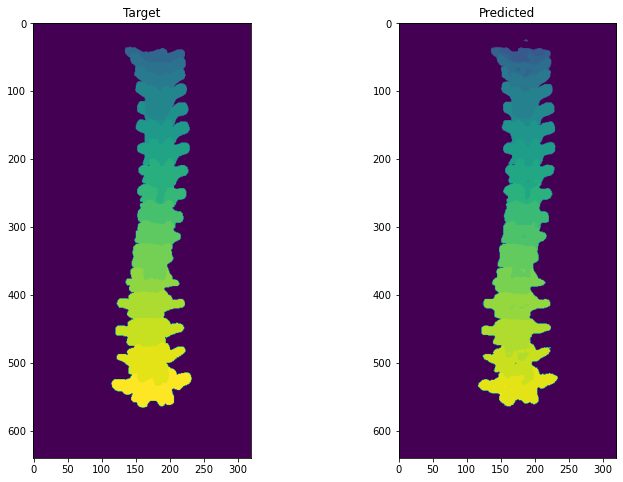

================================================== Training ==================================================
Epoch: 148, Train Loss: 0.3586379737015858, Average Dice Score: 0.6030334668873791
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.28 6: 0.59 7: 0.53 8: 0.79 9: 0.70 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.84 17: 0.85 18: 0.83 19: 0.83 20: 0.86 21: 0.80 22: 0.78 23: 0.65 24: 0.55 25: 0.00
================================================= Validation =================================================
Epoch: 148, Val Loss: 0.5284522244187652, Average Dice Score: 0.4366253472641401
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.28 6: 0.59 7: 0.53 8: 0.79 9: 0.70 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.84 17: 0.85 18: 0.83 19: 0.83 20: 0.86 21: 0.80 22: 0.78 23: 0.65 24: 0.55 25: 0.00


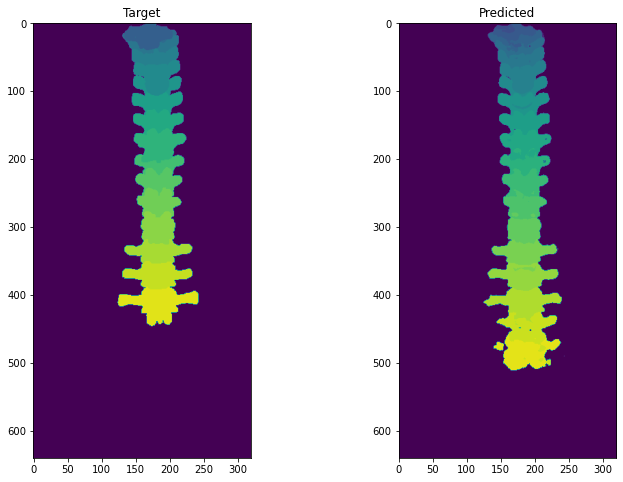

================================================== Training ==================================================
Epoch: 149, Train Loss: 0.35767378178458314, Average Dice Score: 0.5988029247849214
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.24 6: 0.58 7: 0.53 8: 0.80 9: 0.71 10: 0.75 11: 0.80 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.84 17: 0.86 18: 0.83 19: 0.83 20: 0.86 21: 0.80 22: 0.77 23: 0.61 24: 0.51 25: 0.00
================================================= Validation =================================================
Epoch: 149, Val Loss: 0.538722243465361, Average Dice Score: 0.4257290055879767
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.24 6: 0.58 7: 0.53 8: 0.80 9: 0.71 10: 0.75 11: 0.80 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.84 17: 0.86 18: 0.83 19: 0.83 20: 0.86 21: 0.80 22: 0.77 23: 0.61 24: 0.51 25: 0.00


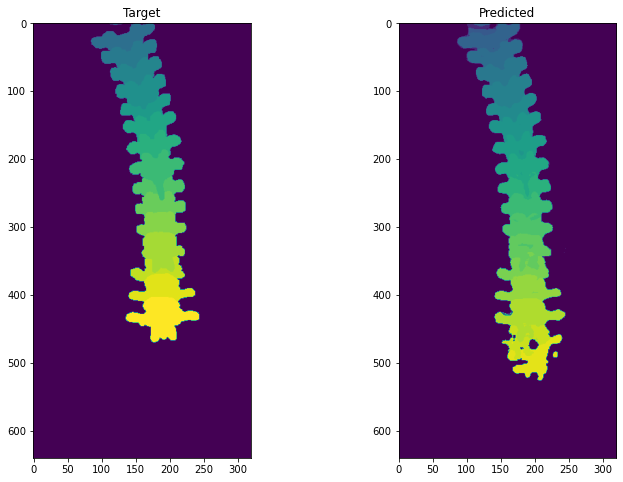

================================================== Training ==================================================
Epoch: 150, Train Loss: 0.35732689365355247, Average Dice Score: 0.6054656272679878
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.26 6: 0.64 7: 0.54 8: 0.80 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.85 17: 0.86 18: 0.83 19: 0.83 20: 0.86 21: 0.80 22: 0.78 23: 0.64 24: 0.55 25: 0.00
================================================= Validation =================================================
Epoch: 150, Val Loss: 0.5351961196446028, Average Dice Score: 0.42735425693891915
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.26 6: 0.64 7: 0.54 8: 0.80 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.85 17: 0.86 18: 0.83 19: 0.83 20: 0.86 21: 0.80 22: 0.78 23: 0.64 24: 0.55 25: 0.00


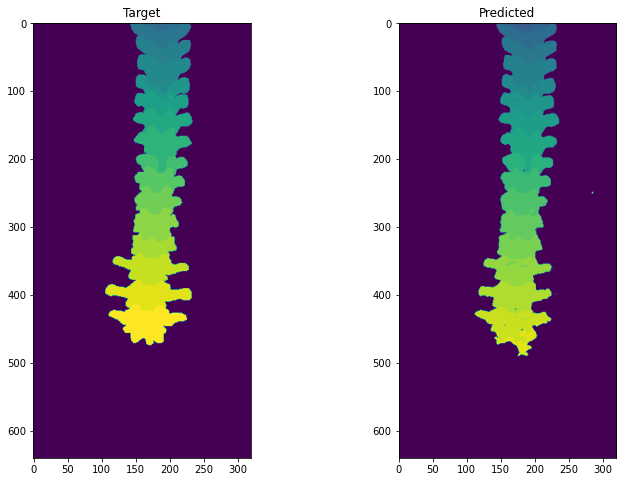

================================================== Training ==================================================
Epoch: 151, Train Loss: 0.35976401233333305, Average Dice Score: 0.5963283172845688
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.20 6: 0.60 7: 0.48 8: 0.78 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.85 17: 0.85 18: 0.82 19: 0.83 20: 0.86 21: 0.80 22: 0.78 23: 0.65 24: 0.52 25: 0.00
================================================= Validation =================================================
Epoch: 151, Val Loss: 0.5422266233162801, Average Dice Score: 0.42920181568652194
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.20 6: 0.60 7: 0.48 8: 0.78 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.85 17: 0.85 18: 0.82 19: 0.83 20: 0.86 21: 0.80 22: 0.78 23: 0.65 24: 0.52 25: 0.00


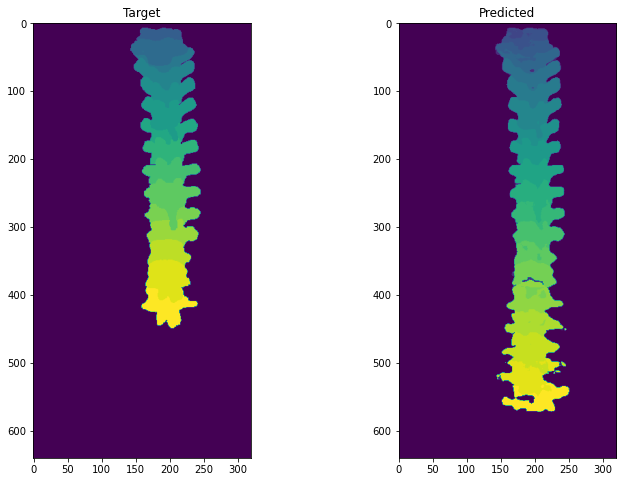

================================================== Training ==================================================
Epoch: 152, Train Loss: 0.35887738347336684, Average Dice Score: 0.6005170620540253
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.24 6: 0.62 7: 0.55 8: 0.78 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.85 17: 0.85 18: 0.83 19: 0.82 20: 0.86 21: 0.78 22: 0.76 23: 0.63 24: 0.55 25: 0.00
================================================= Validation =================================================
Epoch: 152, Val Loss: 0.5297882732797842, Average Dice Score: 0.415149169403093
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.24 6: 0.62 7: 0.55 8: 0.78 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.85 17: 0.85 18: 0.83 19: 0.82 20: 0.86 21: 0.78 22: 0.76 23: 0.63 24: 0.55 25: 0.00


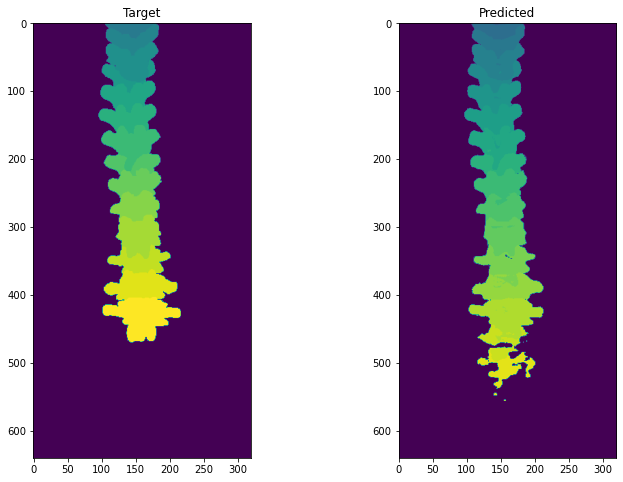

================================================== Training ==================================================
Epoch: 153, Train Loss: 0.3585582895120362, Average Dice Score: 0.5996497111143162
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.25 6: 0.57 7: 0.52 8: 0.78 9: 0.70 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.85 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.79 22: 0.78 23: 0.63 24: 0.54 25: 0.00
================================================= Validation =================================================
Epoch: 153, Val Loss: 0.5322625480714391, Average Dice Score: 0.42716570589585373
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.25 6: 0.57 7: 0.52 8: 0.78 9: 0.70 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.85 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.79 22: 0.78 23: 0.63 24: 0.54 25: 0.00


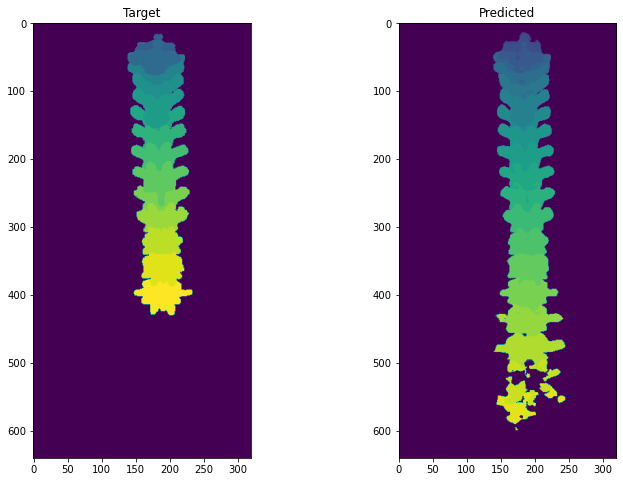

================================================== Training ==================================================
Epoch: 154, Train Loss: 0.3575390087453883, Average Dice Score: 0.6005086416881287
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.21 6: 0.63 7: 0.54 8: 0.78 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.85 17: 0.86 18: 0.83 19: 0.83 20: 0.87 21: 0.78 22: 0.76 23: 0.64 24: 0.55 25: 0.00
================================================= Validation =================================================
Epoch: 154, Val Loss: 0.5440314705254602, Average Dice Score: 0.4222203065828382
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.21 6: 0.63 7: 0.54 8: 0.78 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.85 17: 0.86 18: 0.83 19: 0.83 20: 0.87 21: 0.78 22: 0.76 23: 0.64 24: 0.55 25: 0.00


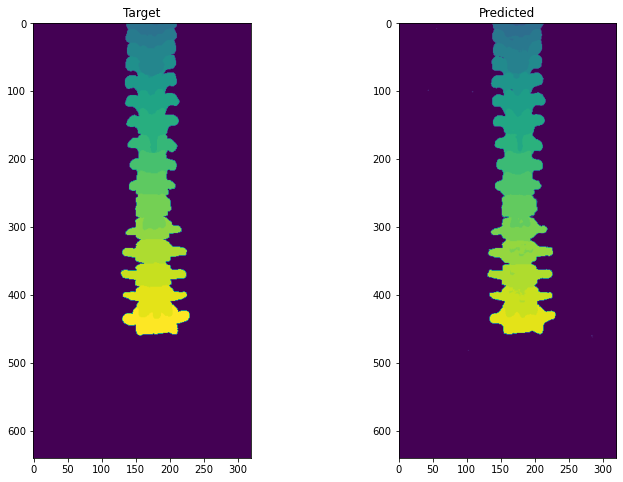

================================================== Training ==================================================
Epoch: 155, Train Loss: 0.3574246485272949, Average Dice Score: 0.6001149672599296
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.21 6: 0.59 7: 0.53 8: 0.78 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.85 17: 0.85 18: 0.83 19: 0.83 20: 0.86 21: 0.80 22: 0.78 23: 0.65 24: 0.55 25: 0.00
================================================= Validation =================================================
Epoch: 155, Val Loss: 0.5355439508547548, Average Dice Score: 0.42245822216905127
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.21 6: 0.59 7: 0.53 8: 0.78 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.85 17: 0.85 18: 0.83 19: 0.83 20: 0.86 21: 0.80 22: 0.78 23: 0.65 24: 0.55 25: 0.00


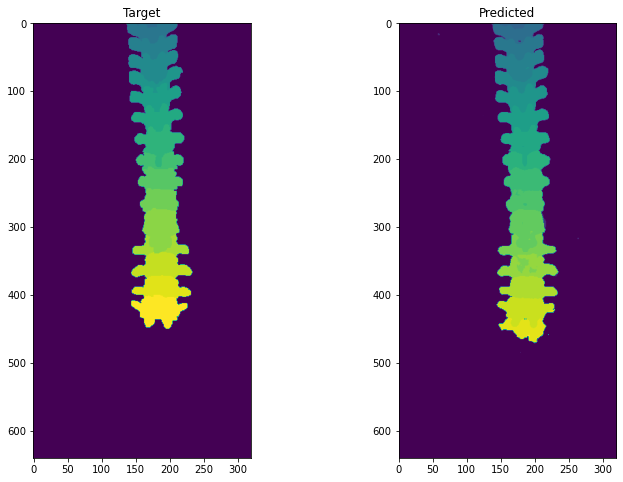

================================================== Training ==================================================
Epoch: 156, Train Loss: 0.35712521914348466, Average Dice Score: 0.6017277734140218
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.19 6: 0.65 7: 0.52 8: 0.79 9: 0.71 10: 0.76 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.83 16: 0.84 17: 0.86 18: 0.83 19: 0.83 20: 0.86 21: 0.80 22: 0.78 23: 0.65 24: 0.53 25: 0.00
================================================= Validation =================================================
Epoch: 156, Val Loss: 0.5355189208124504, Average Dice Score: 0.40913508843817026
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.19 6: 0.65 7: 0.52 8: 0.79 9: 0.71 10: 0.76 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.83 16: 0.84 17: 0.86 18: 0.83 19: 0.83 20: 0.86 21: 0.80 22: 0.78 23: 0.65 24: 0.53 25: 0.00


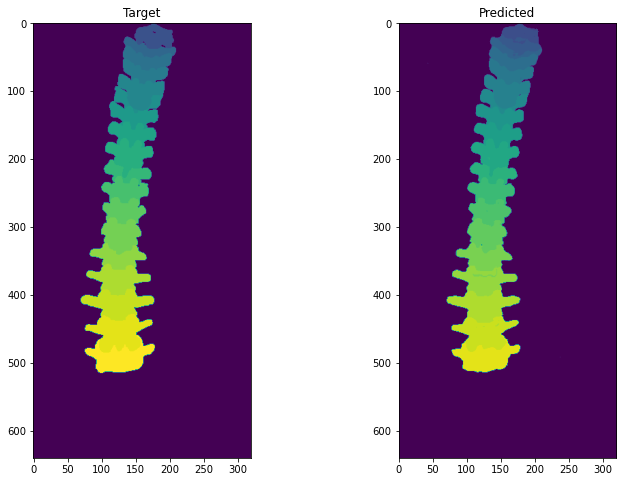

================================================== Training ==================================================
Epoch: 157, Train Loss: 0.35713549959971047, Average Dice Score: 0.6041687481713337
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.25 6: 0.58 7: 0.53 8: 0.79 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.83 16: 0.84 17: 0.86 18: 0.84 19: 0.83 20: 0.86 21: 0.80 22: 0.78 23: 0.66 24: 0.57 25: 0.00
================================================= Validation =================================================
Epoch: 157, Val Loss: 0.5326424201980966, Average Dice Score: 0.43463372150359275
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.25 6: 0.58 7: 0.53 8: 0.79 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.83 16: 0.84 17: 0.86 18: 0.84 19: 0.83 20: 0.86 21: 0.80 22: 0.78 23: 0.66 24: 0.57 25: 0.00


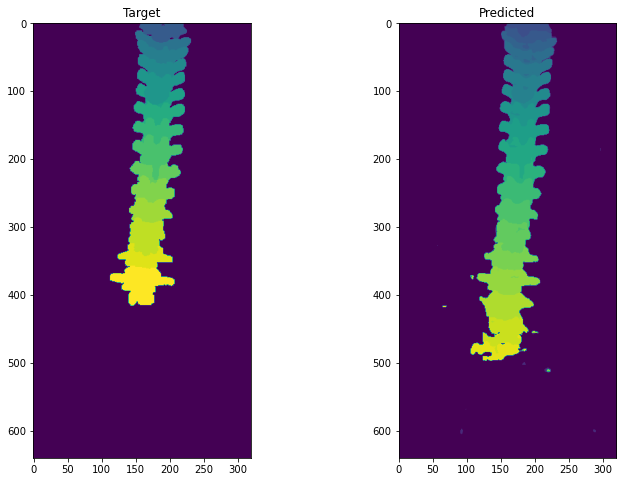

================================================== Training ==================================================
Epoch: 158, Train Loss: 0.3571776661340528, Average Dice Score: 0.6003970637726715
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.18 6: 0.63 7: 0.54 8: 0.78 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.80 14: 0.82 15: 0.82 16: 0.85 17: 0.85 18: 0.83 19: 0.83 20: 0.86 21: 0.80 22: 0.76 23: 0.65 24: 0.54 25: 0.00
================================================= Validation =================================================
Epoch: 158, Val Loss: 0.5303402728721743, Average Dice Score: 0.43645671302959116
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.18 6: 0.63 7: 0.54 8: 0.78 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.80 14: 0.82 15: 0.82 16: 0.85 17: 0.85 18: 0.83 19: 0.83 20: 0.86 21: 0.80 22: 0.76 23: 0.65 24: 0.54 25: 0.00


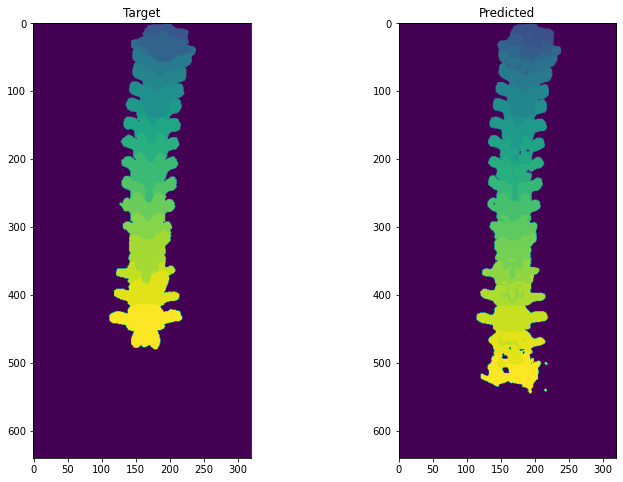

================================================== Training ==================================================
Epoch: 159, Train Loss: 0.35677935250298143, Average Dice Score: 0.6013893361292333
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.20 6: 0.61 7: 0.55 8: 0.78 9: 0.71 10: 0.75 11: 0.80 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.84 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.80 22: 0.78 23: 0.64 24: 0.55 25: 0.00
================================================= Validation =================================================
Epoch: 159, Val Loss: 0.5336236093865067, Average Dice Score: 0.42700525731498207
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.20 6: 0.61 7: 0.55 8: 0.78 9: 0.71 10: 0.75 11: 0.80 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.84 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.80 22: 0.78 23: 0.64 24: 0.55 25: 0.00


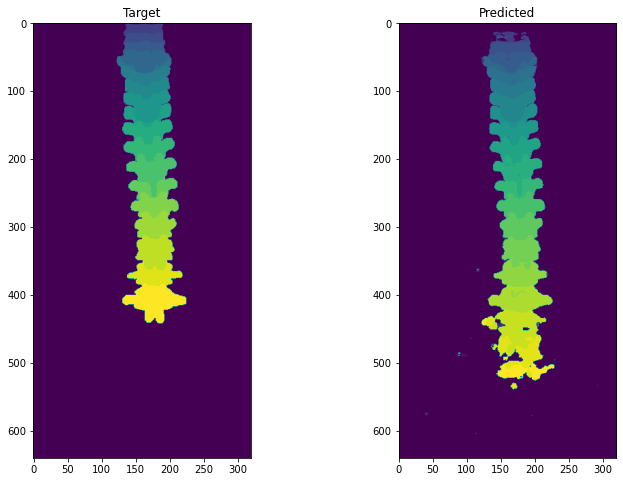

================================================== Training ==================================================
Epoch: 160, Train Loss: 0.35717285627990325, Average Dice Score: 0.6037724015459521
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.22 6: 0.61 7: 0.56 8: 0.78 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.85 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.80 22: 0.76 23: 0.65 24: 0.57 25: 0.00
================================================= Validation =================================================
Epoch: 160, Val Loss: 0.5353213382548974, Average Dice Score: 0.41226886554878733
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.22 6: 0.61 7: 0.56 8: 0.78 9: 0.71 10: 0.75 11: 0.81 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.85 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.80 22: 0.76 23: 0.65 24: 0.57 25: 0.00


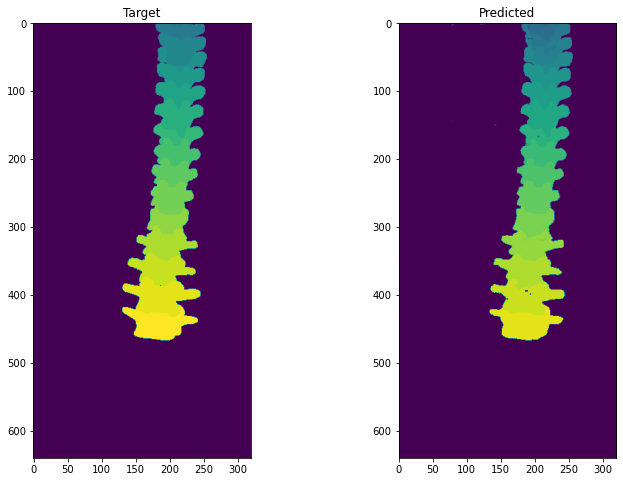

================================================== Training ==================================================
Epoch: 161, Train Loss: 0.35765762906742776, Average Dice Score: 0.6005280283492236
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.19 6: 0.60 7: 0.53 8: 0.76 9: 0.71 10: 0.75 11: 0.80 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.84 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.80 22: 0.79 23: 0.66 24: 0.57 25: 0.00
================================================= Validation =================================================
Epoch: 161, Val Loss: 0.5452701889100622, Average Dice Score: 0.41997811095698917
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.19 6: 0.60 7: 0.53 8: 0.76 9: 0.71 10: 0.75 11: 0.80 12: 0.80 13: 0.79 14: 0.82 15: 0.82 16: 0.84 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.80 22: 0.79 23: 0.66 24: 0.57 25: 0.00


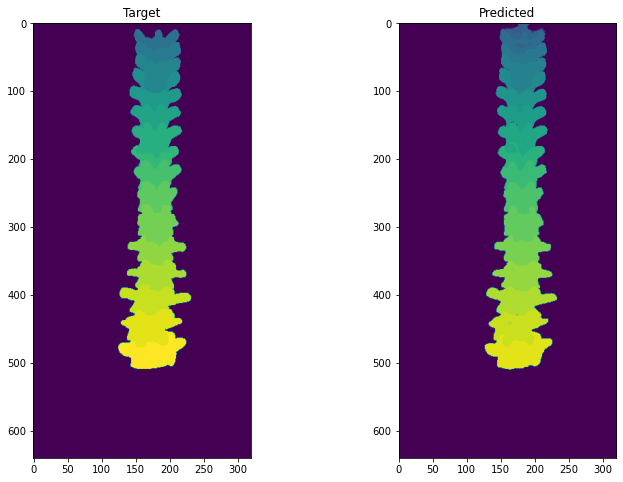

================================================== Training ==================================================
Epoch: 162, Train Loss: 0.3605850916577065, Average Dice Score: 0.5986675883457689
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.16 6: 0.62 7: 0.54 8: 0.77 9: 0.70 10: 0.75 11: 0.80 12: 0.79 13: 0.78 14: 0.81 15: 0.82 16: 0.85 17: 0.86 18: 0.84 19: 0.83 20: 0.86 21: 0.80 22: 0.78 23: 0.65 24: 0.57 25: 0.00
================================================= Validation =================================================
Epoch: 162, Val Loss: 0.5448783694720659, Average Dice Score: 0.4193384419307312
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.16 6: 0.62 7: 0.54 8: 0.77 9: 0.70 10: 0.75 11: 0.80 12: 0.79 13: 0.78 14: 0.81 15: 0.82 16: 0.85 17: 0.86 18: 0.84 19: 0.83 20: 0.86 21: 0.80 22: 0.78 23: 0.65 24: 0.57 25: 0.00


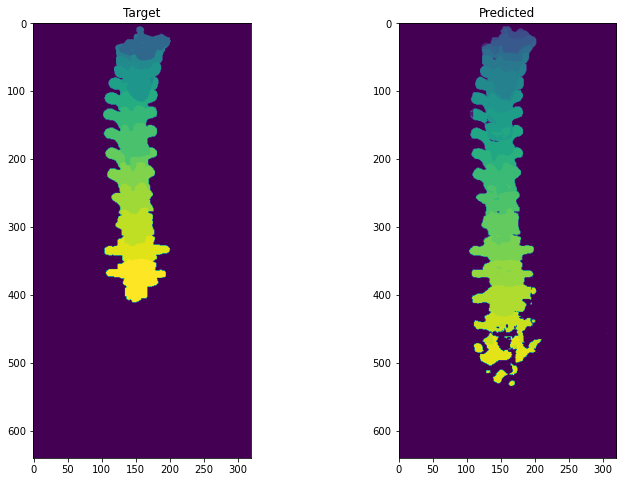

================================================== Training ==================================================
Epoch: 163, Train Loss: 0.35912348921112097, Average Dice Score: 0.5985793141827469
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.22 6: 0.59 7: 0.55 8: 0.79 9: 0.70 10: 0.75 11: 0.80 12: 0.80 13: 0.78 14: 0.82 15: 0.82 16: 0.85 17: 0.85 18: 0.83 19: 0.83 20: 0.86 21: 0.80 22: 0.76 23: 0.64 24: 0.55 25: 0.00
================================================= Validation =================================================
Epoch: 163, Val Loss: 0.5433709680056963, Average Dice Score: 0.42016055327998886
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.22 6: 0.59 7: 0.55 8: 0.79 9: 0.70 10: 0.75 11: 0.80 12: 0.80 13: 0.78 14: 0.82 15: 0.82 16: 0.85 17: 0.85 18: 0.83 19: 0.83 20: 0.86 21: 0.80 22: 0.76 23: 0.64 24: 0.55 25: 0.00


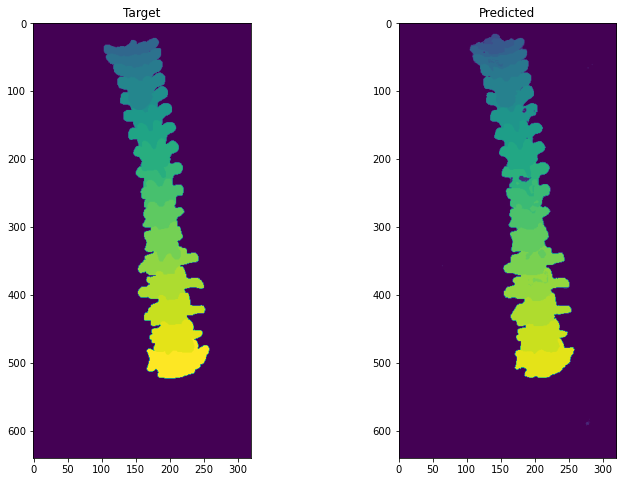

================================================== Training ==================================================
Epoch: 164, Train Loss: 0.36087429976519947, Average Dice Score: 0.5986482376434378
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.20 6: 0.59 7: 0.53 8: 0.78 9: 0.70 10: 0.75 11: 0.80 12: 0.79 13: 0.78 14: 0.81 15: 0.82 16: 0.84 17: 0.85 18: 0.84 19: 0.82 20: 0.86 21: 0.80 22: 0.78 23: 0.65 24: 0.57 25: 0.00
================================================= Validation =================================================
Epoch: 164, Val Loss: 0.5516533753911003, Average Dice Score: 0.4079239457328816
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.20 6: 0.59 7: 0.53 8: 0.78 9: 0.70 10: 0.75 11: 0.80 12: 0.79 13: 0.78 14: 0.81 15: 0.82 16: 0.84 17: 0.85 18: 0.84 19: 0.82 20: 0.86 21: 0.80 22: 0.78 23: 0.65 24: 0.57 25: 0.00


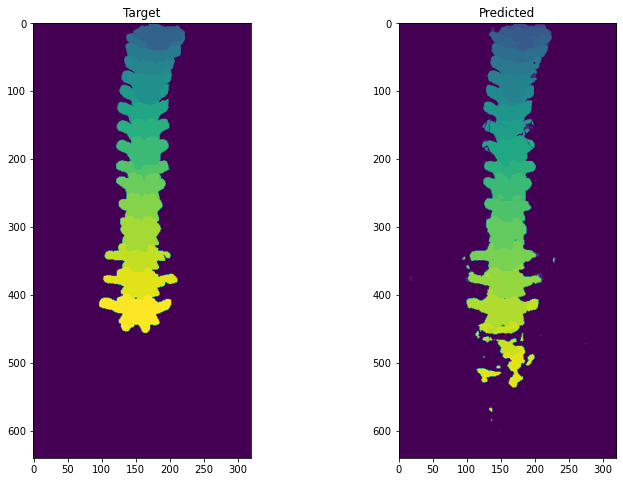

================================================== Training ==================================================
Epoch: 165, Train Loss: 0.376230545678218, Average Dice Score: 0.5850628487185707
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.19 6: 0.60 7: 0.55 8: 0.79 9: 0.70 10: 0.74 11: 0.78 12: 0.77 13: 0.75 14: 0.77 15: 0.78 16: 0.80 17: 0.83 18: 0.82 19: 0.81 20: 0.85 21: 0.78 22: 0.76 23: 0.61 24: 0.53 25: 0.00
================================================= Validation =================================================
Epoch: 165, Val Loss: 0.6915738699866123, Average Dice Score: 0.28258844070276196
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.19 6: 0.60 7: 0.55 8: 0.79 9: 0.70 10: 0.74 11: 0.78 12: 0.77 13: 0.75 14: 0.77 15: 0.78 16: 0.80 17: 0.83 18: 0.82 19: 0.81 20: 0.85 21: 0.78 22: 0.76 23: 0.61 24: 0.53 25: 0.00


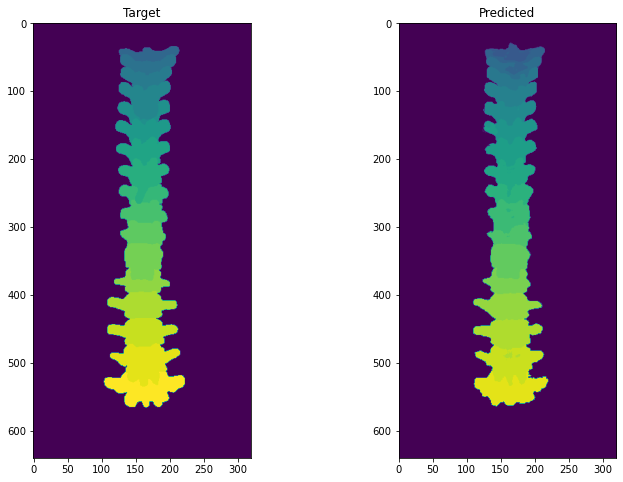

================================================== Training ==================================================
Epoch: 166, Train Loss: 0.4123799043426604, Average Dice Score: 0.5542617639110283
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.25 6: 0.54 7: 0.49 8: 0.77 9: 0.66 10: 0.70 11: 0.74 12: 0.72 13: 0.70 14: 0.73 15: 0.73 16: 0.75 17: 0.78 18: 0.78 19: 0.76 20: 0.78 21: 0.71 22: 0.69 23: 0.58 24: 0.53 25: 0.01
================================================= Validation =================================================
Epoch: 166, Val Loss: 0.666381540845652, Average Dice Score: 0.30528863523886773
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.25 6: 0.54 7: 0.49 8: 0.77 9: 0.66 10: 0.70 11: 0.74 12: 0.72 13: 0.70 14: 0.73 15: 0.73 16: 0.75 17: 0.78 18: 0.78 19: 0.76 20: 0.78 21: 0.71 22: 0.69 23: 0.58 24: 0.53 25: 0.01


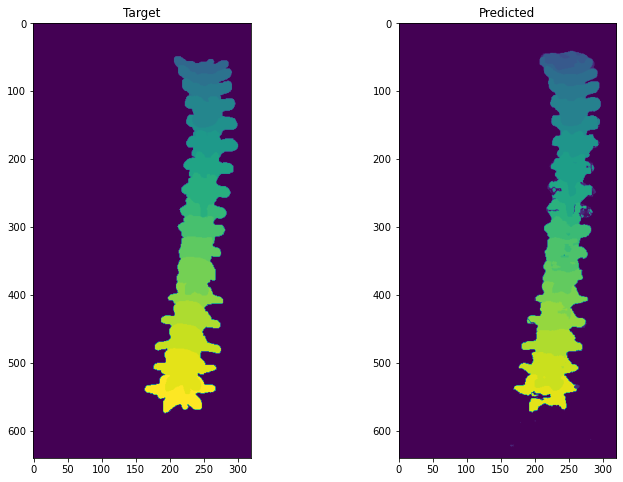

================================================== Training ==================================================
Epoch: 167, Train Loss: 0.40427347217772747, Average Dice Score: 0.5624384330289837
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.25 6: 0.57 7: 0.52 8: 0.78 9: 0.68 10: 0.71 11: 0.76 12: 0.72 13: 0.71 14: 0.75 15: 0.75 16: 0.77 17: 0.79 18: 0.79 19: 0.76 20: 0.80 21: 0.73 22: 0.70 23: 0.58 24: 0.51 25: 0.01
================================================= Validation =================================================
Epoch: 167, Val Loss: 0.7846159641859961, Average Dice Score: 0.20873806394514638
Dice Score Per Class
0: 0.98 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.25 6: 0.57 7: 0.52 8: 0.78 9: 0.68 10: 0.71 11: 0.76 12: 0.72 13: 0.71 14: 0.75 15: 0.75 16: 0.77 17: 0.79 18: 0.79 19: 0.76 20: 0.80 21: 0.73 22: 0.70 23: 0.58 24: 0.51 25: 0.01


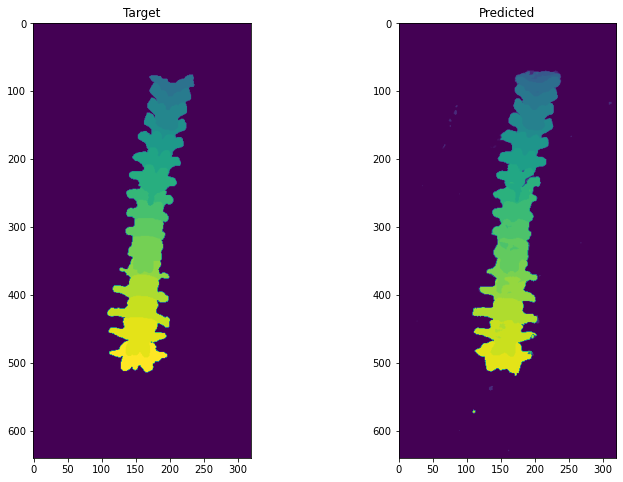

================================================== Training ==================================================
Epoch: 168, Train Loss: 0.3944252534037248, Average Dice Score: 0.5662255774242585
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.19 6: 0.54 7: 0.51 8: 0.78 9: 0.68 10: 0.73 11: 0.78 12: 0.75 13: 0.74 14: 0.75 15: 0.76 16: 0.77 17: 0.79 18: 0.81 19: 0.78 20: 0.81 21: 0.76 22: 0.71 23: 0.59 24: 0.51 25: 0.00
================================================= Validation =================================================
Epoch: 168, Val Loss: 0.5780260514040463, Average Dice Score: 0.38303064143391674
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.19 6: 0.54 7: 0.51 8: 0.78 9: 0.68 10: 0.73 11: 0.78 12: 0.75 13: 0.74 14: 0.75 15: 0.76 16: 0.77 17: 0.79 18: 0.81 19: 0.78 20: 0.81 21: 0.76 22: 0.71 23: 0.59 24: 0.51 25: 0.00


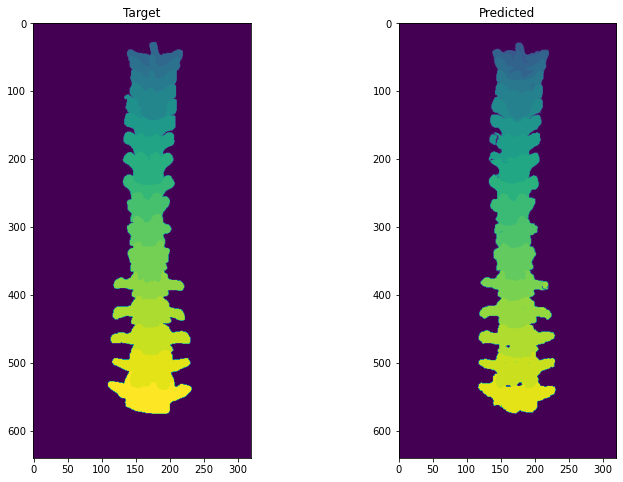

================================================== Training ==================================================
Epoch: 169, Train Loss: 0.3797372656027099, Average Dice Score: 0.5813389196567226
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.18 6: 0.58 7: 0.50 8: 0.80 9: 0.69 10: 0.74 11: 0.78 12: 0.76 13: 0.74 14: 0.78 15: 0.79 16: 0.82 17: 0.82 18: 0.82 19: 0.80 20: 0.84 21: 0.78 22: 0.74 23: 0.62 24: 0.54 25: 0.00
================================================= Validation =================================================
Epoch: 169, Val Loss: 0.6207106220917623, Average Dice Score: 0.33014578005739786
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.18 6: 0.58 7: 0.50 8: 0.80 9: 0.69 10: 0.74 11: 0.78 12: 0.76 13: 0.74 14: 0.78 15: 0.79 16: 0.82 17: 0.82 18: 0.82 19: 0.80 20: 0.84 21: 0.78 22: 0.74 23: 0.62 24: 0.54 25: 0.00


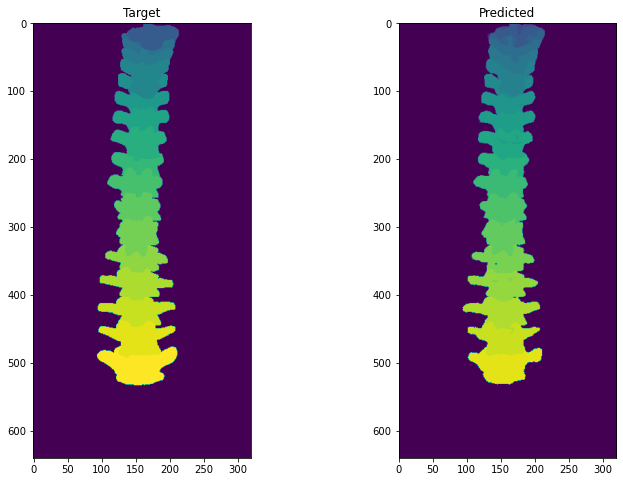

================================================== Training ==================================================
Epoch: 170, Train Loss: 0.3695718551191751, Average Dice Score: 0.5909412597713475
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.15 6: 0.62 7: 0.54 8: 0.79 9: 0.70 10: 0.74 11: 0.79 12: 0.78 13: 0.77 14: 0.81 15: 0.80 16: 0.83 17: 0.84 18: 0.83 19: 0.82 20: 0.85 21: 0.80 22: 0.76 23: 0.62 24: 0.54 25: 0.00
================================================= Validation =================================================
Epoch: 170, Val Loss: 0.5324746370315552, Average Dice Score: 0.43469404806028167
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.15 6: 0.62 7: 0.54 8: 0.79 9: 0.70 10: 0.74 11: 0.79 12: 0.78 13: 0.77 14: 0.81 15: 0.80 16: 0.83 17: 0.84 18: 0.83 19: 0.82 20: 0.85 21: 0.80 22: 0.76 23: 0.62 24: 0.54 25: 0.00


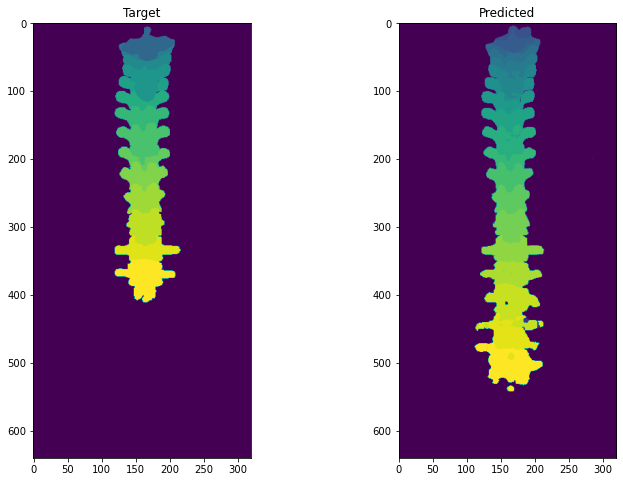

================================================== Training ==================================================
Epoch: 171, Train Loss: 0.3625211475014403, Average Dice Score: 0.5948128557061114
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.19 6: 0.58 7: 0.55 8: 0.80 9: 0.70 10: 0.75 11: 0.80 12: 0.80 13: 0.78 14: 0.82 15: 0.82 16: 0.84 17: 0.84 18: 0.83 19: 0.83 20: 0.85 21: 0.80 22: 0.75 23: 0.61 24: 0.53 25: 0.00
================================================= Validation =================================================
Epoch: 171, Val Loss: 0.5291239580170053, Average Dice Score: 0.44253871107025033
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.19 6: 0.58 7: 0.55 8: 0.80 9: 0.70 10: 0.75 11: 0.80 12: 0.80 13: 0.78 14: 0.82 15: 0.82 16: 0.84 17: 0.84 18: 0.83 19: 0.83 20: 0.85 21: 0.80 22: 0.75 23: 0.61 24: 0.53 25: 0.00


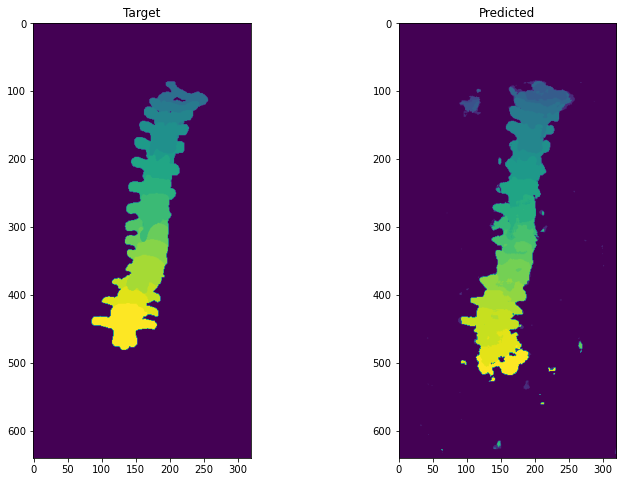

================================================== Training ==================================================
Epoch: 172, Train Loss: 0.3597271768044406, Average Dice Score: 0.5988026193033908
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.21 6: 0.63 7: 0.53 8: 0.79 9: 0.71 10: 0.75 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.82 16: 0.84 17: 0.84 18: 0.83 19: 0.82 20: 0.86 21: 0.80 22: 0.77 23: 0.63 24: 0.54 25: 0.00
================================================= Validation =================================================
Epoch: 172, Val Loss: 0.5380038472472645, Average Dice Score: 0.4337375815795451
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.21 6: 0.63 7: 0.53 8: 0.79 9: 0.71 10: 0.75 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.82 16: 0.84 17: 0.84 18: 0.83 19: 0.82 20: 0.86 21: 0.80 22: 0.77 23: 0.63 24: 0.54 25: 0.00


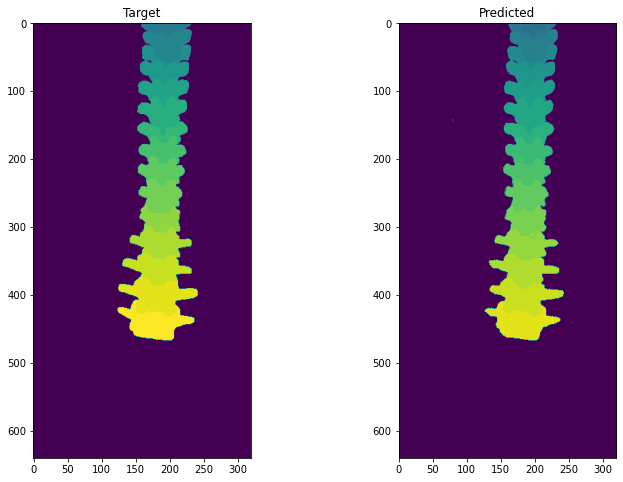

================================================== Training ==================================================
Epoch: 173, Train Loss: 0.360982143963884, Average Dice Score: 0.6000847875535964
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.21 6: 0.62 7: 0.53 8: 0.77 9: 0.71 10: 0.75 11: 0.80 12: 0.80 13: 0.79 14: 0.82 15: 0.81 16: 0.84 17: 0.85 18: 0.83 19: 0.82 20: 0.86 21: 0.80 22: 0.77 23: 0.64 24: 0.57 25: 0.00
================================================= Validation =================================================
Epoch: 173, Val Loss: 0.5300638548663406, Average Dice Score: 0.4306473114930507
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.21 6: 0.62 7: 0.53 8: 0.77 9: 0.71 10: 0.75 11: 0.80 12: 0.80 13: 0.79 14: 0.82 15: 0.81 16: 0.84 17: 0.85 18: 0.83 19: 0.82 20: 0.86 21: 0.80 22: 0.77 23: 0.64 24: 0.57 25: 0.00


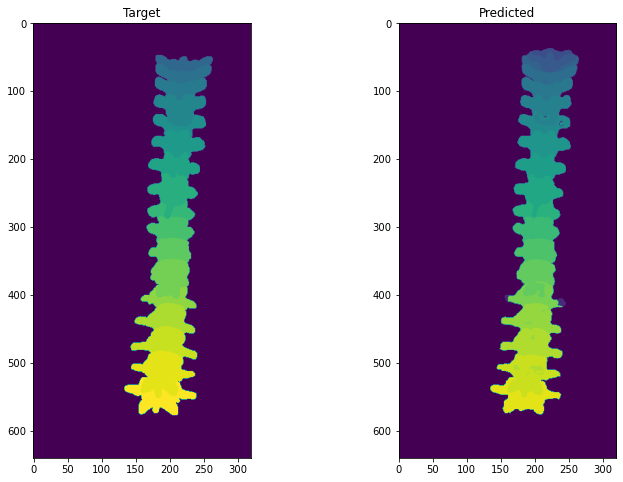

================================================== Training ==================================================
Epoch: 174, Train Loss: 0.35859611764939553, Average Dice Score: 0.6007369926230116
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.19 6: 0.62 7: 0.51 8: 0.80 9: 0.71 10: 0.76 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.82 16: 0.84 17: 0.85 18: 0.84 19: 0.82 20: 0.86 21: 0.80 22: 0.77 23: 0.64 24: 0.57 25: 0.00
================================================= Validation =================================================
Epoch: 174, Val Loss: 0.5245919208057591, Average Dice Score: 0.43689851951650105
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.19 6: 0.62 7: 0.51 8: 0.80 9: 0.71 10: 0.76 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.82 16: 0.84 17: 0.85 18: 0.84 19: 0.82 20: 0.86 21: 0.80 22: 0.77 23: 0.64 24: 0.57 25: 0.00


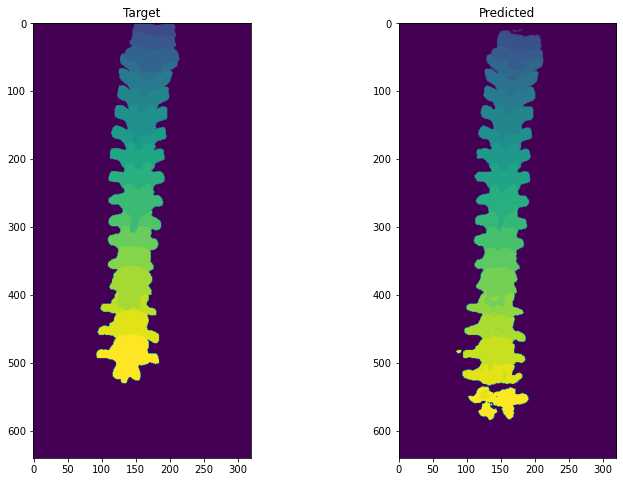

================================================== Training ==================================================
Epoch: 175, Train Loss: 0.35712834123760956, Average Dice Score: 0.5996262734143972
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.19 6: 0.58 7: 0.54 8: 0.79 9: 0.72 10: 0.76 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.82 16: 0.84 17: 0.85 18: 0.83 19: 0.83 20: 0.86 21: 0.81 22: 0.77 23: 0.64 24: 0.54 25: 0.00
================================================= Validation =================================================
Epoch: 175, Val Loss: 0.5248764909681727, Average Dice Score: 0.44022093880916463
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.19 6: 0.58 7: 0.54 8: 0.79 9: 0.72 10: 0.76 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.82 16: 0.84 17: 0.85 18: 0.83 19: 0.83 20: 0.86 21: 0.81 22: 0.77 23: 0.64 24: 0.54 25: 0.00


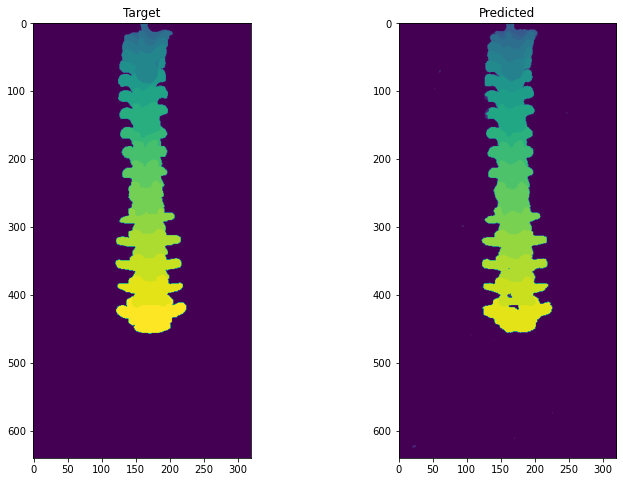

================================================== Training ==================================================
Epoch: 176, Train Loss: 0.3566307516109349, Average Dice Score: 0.6019609518489135
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.21 6: 0.57 7: 0.54 8: 0.79 9: 0.71 10: 0.75 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.82 16: 0.84 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.78 23: 0.67 24: 0.57 25: 0.00
================================================= Validation =================================================
Epoch: 176, Val Loss: 0.5241552874690196, Average Dice Score: 0.43352058595299725
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.21 6: 0.57 7: 0.54 8: 0.79 9: 0.71 10: 0.75 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.82 16: 0.84 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.78 23: 0.67 24: 0.57 25: 0.00


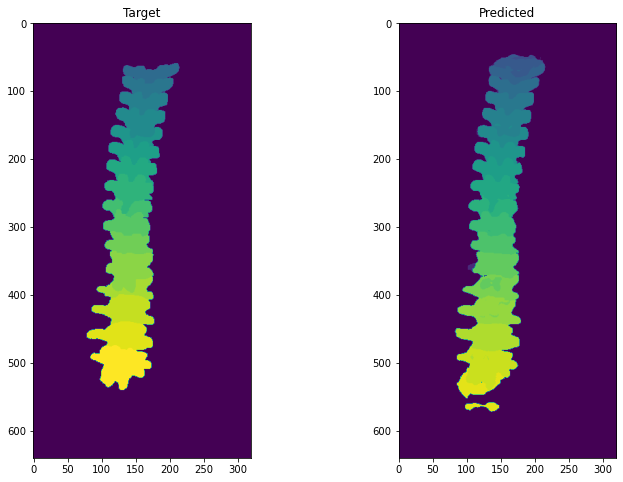

================================================== Training ==================================================
Epoch: 177, Train Loss: 0.35630799161000376, Average Dice Score: 0.6032979157167824
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.22 6: 0.62 7: 0.53 8: 0.79 9: 0.71 10: 0.76 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.83 16: 0.84 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.80 22: 0.78 23: 0.66 24: 0.56 25: 0.00
================================================= Validation =================================================
Epoch: 177, Val Loss: 0.5311387611217186, Average Dice Score: 0.43506527590493627
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.22 6: 0.62 7: 0.53 8: 0.79 9: 0.71 10: 0.76 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.83 16: 0.84 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.80 22: 0.78 23: 0.66 24: 0.56 25: 0.00


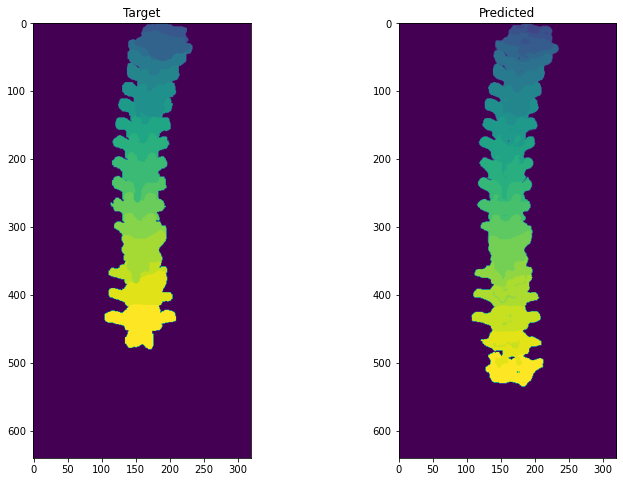

================================================== Training ==================================================
Epoch: 178, Train Loss: 0.35610585073960366, Average Dice Score: 0.6018696694429957
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.18 6: 0.63 7: 0.54 8: 0.79 9: 0.71 10: 0.76 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.82 16: 0.84 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.80 22: 0.78 23: 0.65 24: 0.55 25: 0.00
================================================= Validation =================================================
Epoch: 178, Val Loss: 0.5248236138312543, Average Dice Score: 0.4292465105823544
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.18 6: 0.63 7: 0.54 8: 0.79 9: 0.71 10: 0.76 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.82 16: 0.84 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.80 22: 0.78 23: 0.65 24: 0.55 25: 0.00


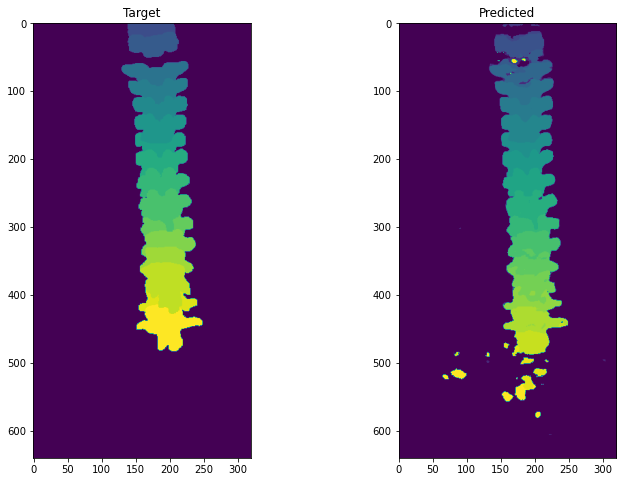

================================================== Training ==================================================
Epoch: 179, Train Loss: 0.35637097404008805, Average Dice Score: 0.6055817623128825
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.26 6: 0.68 7: 0.52 8: 0.79 9: 0.71 10: 0.76 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.82 16: 0.84 17: 0.85 18: 0.83 19: 0.83 20: 0.86 21: 0.80 22: 0.76 23: 0.65 24: 0.56 25: 0.00
================================================= Validation =================================================
Epoch: 179, Val Loss: 0.5509418620437873, Average Dice Score: 0.41760710622914426
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.26 6: 0.68 7: 0.52 8: 0.79 9: 0.71 10: 0.76 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.82 16: 0.84 17: 0.85 18: 0.83 19: 0.83 20: 0.86 21: 0.80 22: 0.76 23: 0.65 24: 0.56 25: 0.00


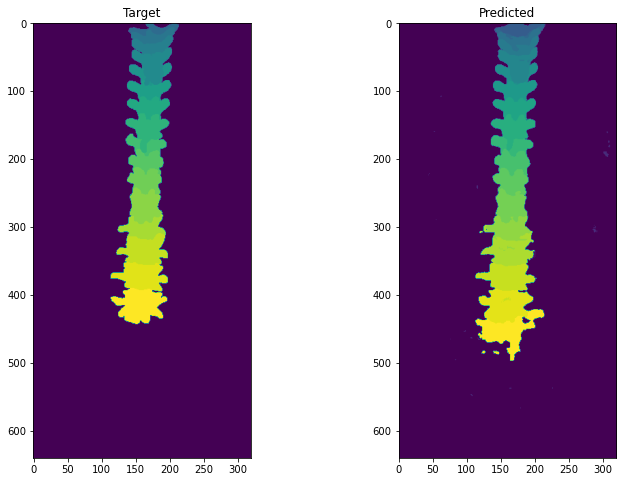

================================================== Training ==================================================
Epoch: 180, Train Loss: 0.3635445976200693, Average Dice Score: 0.5978826464272214
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.29 6: 0.55 7: 0.50 8: 0.77 9: 0.70 10: 0.75 11: 0.79 12: 0.79 13: 0.80 14: 0.82 15: 0.82 16: 0.84 17: 0.85 18: 0.83 19: 0.83 20: 0.86 21: 0.79 22: 0.78 23: 0.65 24: 0.55 25: 0.00
================================================= Validation =================================================
Epoch: 180, Val Loss: 0.5396665578982869, Average Dice Score: 0.42720186139548666
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.29 6: 0.55 7: 0.50 8: 0.77 9: 0.70 10: 0.75 11: 0.79 12: 0.79 13: 0.80 14: 0.82 15: 0.82 16: 0.84 17: 0.85 18: 0.83 19: 0.83 20: 0.86 21: 0.79 22: 0.78 23: 0.65 24: 0.55 25: 0.00


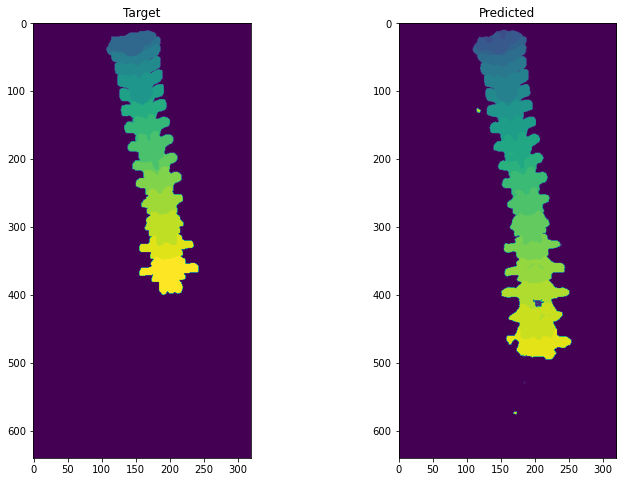

================================================== Training ==================================================
Epoch: 181, Train Loss: 0.3592383259832151, Average Dice Score: 0.6061805394866744
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.34 6: 0.64 7: 0.55 8: 0.78 9: 0.71 10: 0.75 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.82 16: 0.84 17: 0.85 18: 0.83 19: 0.83 20: 0.86 21: 0.80 22: 0.76 23: 0.64 24: 0.55 25: 0.00
================================================= Validation =================================================
Epoch: 181, Val Loss: 0.5292966053134105, Average Dice Score: 0.4380239462269258
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.34 6: 0.64 7: 0.55 8: 0.78 9: 0.71 10: 0.75 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.82 16: 0.84 17: 0.85 18: 0.83 19: 0.83 20: 0.86 21: 0.80 22: 0.76 23: 0.64 24: 0.55 25: 0.00


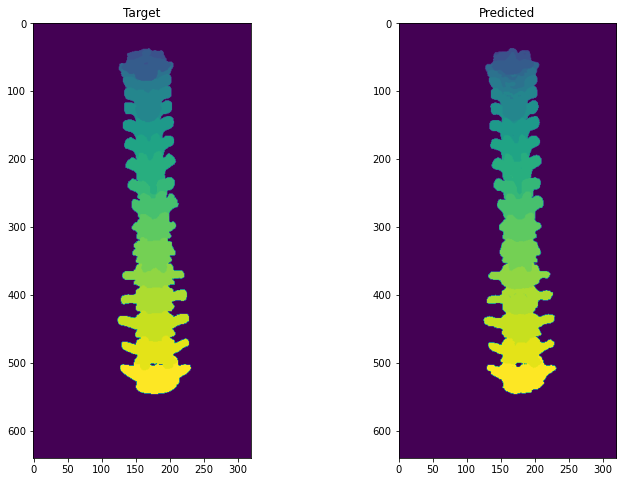

================================================== Training ==================================================
Epoch: 182, Train Loss: 0.3576314425241919, Average Dice Score: 0.6059254962982596
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.28 6: 0.61 7: 0.55 8: 0.77 9: 0.71 10: 0.75 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.82 16: 0.84 17: 0.85 18: 0.83 19: 0.83 20: 0.86 21: 0.81 22: 0.78 23: 0.66 24: 0.57 25: 0.00
================================================= Validation =================================================
Epoch: 182, Val Loss: 0.5291453766041114, Average Dice Score: 0.44106369816291485
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.28 6: 0.61 7: 0.55 8: 0.77 9: 0.71 10: 0.75 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.82 16: 0.84 17: 0.85 18: 0.83 19: 0.83 20: 0.86 21: 0.81 22: 0.78 23: 0.66 24: 0.57 25: 0.00


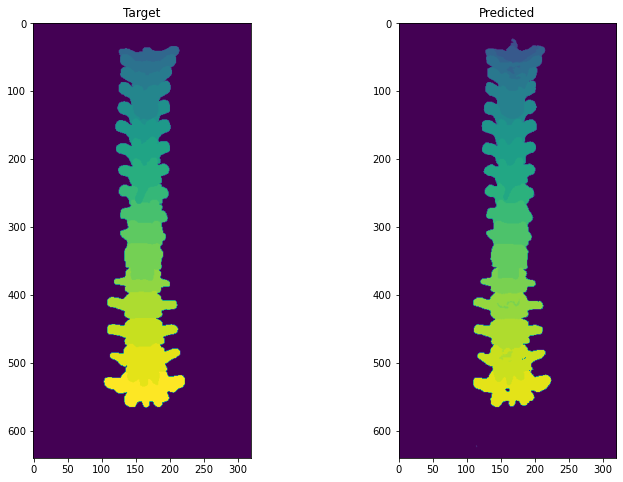

================================================== Training ==================================================
Epoch: 183, Train Loss: 0.35766832944616284, Average Dice Score: 0.6038703479669543
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.27 6: 0.61 7: 0.51 8: 0.78 9: 0.71 10: 0.75 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.83 16: 0.84 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.78 23: 0.65 24: 0.57 25: 0.00
================================================= Validation =================================================
Epoch: 183, Val Loss: 0.530510850617143, Average Dice Score: 0.4272743116655534
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.27 6: 0.61 7: 0.51 8: 0.78 9: 0.71 10: 0.75 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.83 16: 0.84 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.78 23: 0.65 24: 0.57 25: 0.00


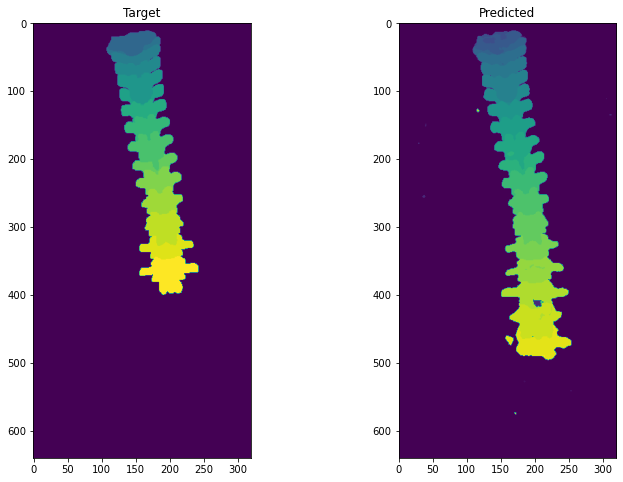

================================================== Training ==================================================
Epoch: 184, Train Loss: 0.35675203318833737, Average Dice Score: 0.6027217814016946
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.28 6: 0.59 7: 0.52 8: 0.78 9: 0.71 10: 0.75 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.82 16: 0.84 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.76 23: 0.64 24: 0.55 25: 0.00
================================================= Validation =================================================
Epoch: 184, Val Loss: 0.5276266678434903, Average Dice Score: 0.43711884597718353
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.28 6: 0.59 7: 0.52 8: 0.78 9: 0.71 10: 0.75 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.82 16: 0.84 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.76 23: 0.64 24: 0.55 25: 0.00


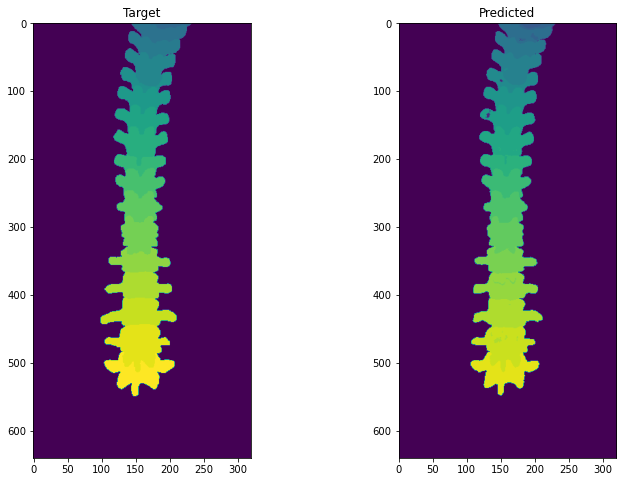

================================================== Training ==================================================
Epoch: 185, Train Loss: 0.35618504209359864, Average Dice Score: 0.6075976055563994
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.28 6: 0.64 7: 0.52 8: 0.78 9: 0.71 10: 0.76 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.83 16: 0.85 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.78 23: 0.66 24: 0.58 25: 0.00
================================================= Validation =================================================
Epoch: 185, Val Loss: 0.5325233848368536, Average Dice Score: 0.42702593976915365
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.28 6: 0.64 7: 0.52 8: 0.78 9: 0.71 10: 0.76 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.83 16: 0.85 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.78 23: 0.66 24: 0.58 25: 0.00


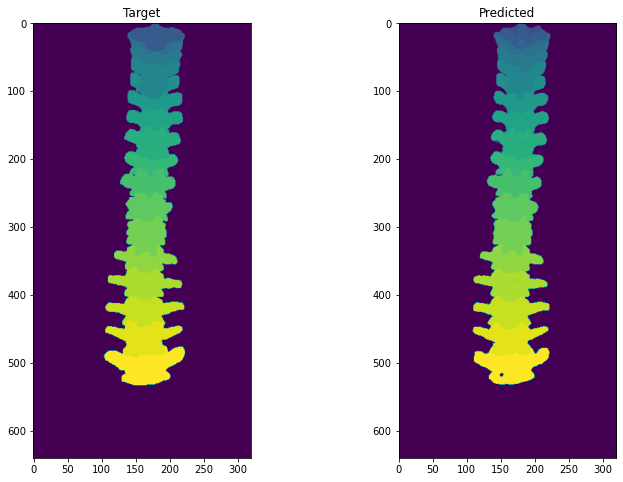

================================================== Training ==================================================
Epoch: 186, Train Loss: 0.3568399067162901, Average Dice Score: 0.6074886200111348
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.27 6: 0.61 7: 0.55 8: 0.79 9: 0.71 10: 0.75 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.83 16: 0.84 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.78 23: 0.66 24: 0.59 25: 0.00
================================================= Validation =================================================
Epoch: 186, Val Loss: 0.5368867311321321, Average Dice Score: 0.41106154465217987
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.27 6: 0.61 7: 0.55 8: 0.79 9: 0.71 10: 0.75 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.83 16: 0.84 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.78 23: 0.66 24: 0.59 25: 0.00


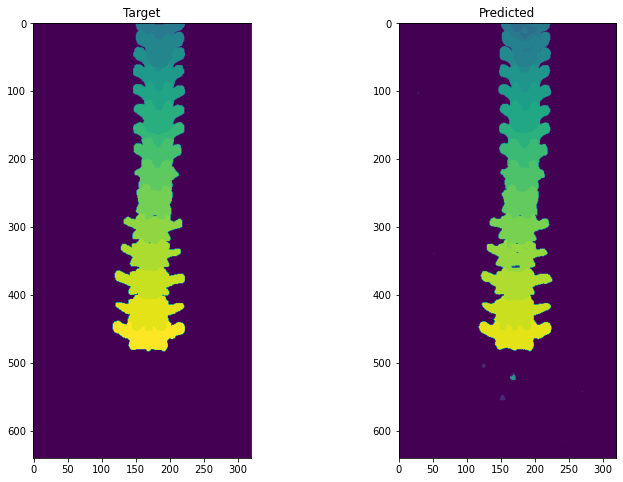

================================================== Training ==================================================
Epoch: 187, Train Loss: 0.3560960949741463, Average Dice Score: 0.6092910269151434
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.31 6: 0.65 7: 0.53 8: 0.77 9: 0.70 10: 0.76 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.83 16: 0.85 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.78 23: 0.67 24: 0.59 25: 0.00
================================================= Validation =================================================
Epoch: 187, Val Loss: 0.5317319006216331, Average Dice Score: 0.42757833423239516
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.31 6: 0.65 7: 0.53 8: 0.77 9: 0.70 10: 0.76 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.83 16: 0.85 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.78 23: 0.67 24: 0.59 25: 0.00


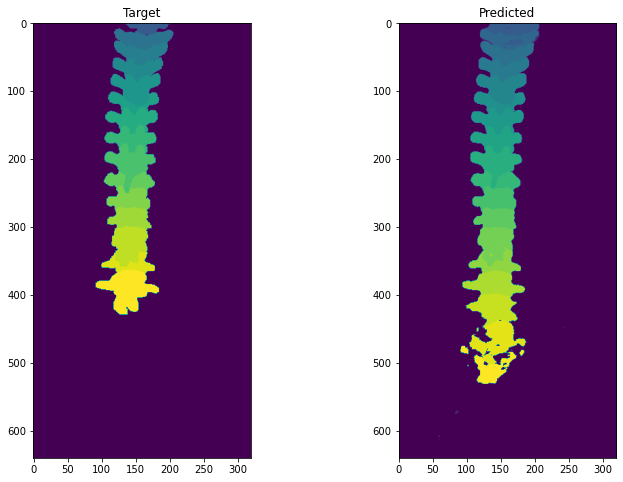

================================================== Training ==================================================
Epoch: 188, Train Loss: 0.35612749841037666, Average Dice Score: 0.603951944352849
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.26 6: 0.61 7: 0.51 8: 0.79 9: 0.71 10: 0.76 11: 0.80 12: 0.80 13: 0.81 14: 0.82 15: 0.82 16: 0.84 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.77 23: 0.65 24: 0.56 25: 0.00
================================================= Validation =================================================
Epoch: 188, Val Loss: 0.5275021136784163, Average Dice Score: 0.4450908071170905
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.26 6: 0.61 7: 0.51 8: 0.79 9: 0.71 10: 0.76 11: 0.80 12: 0.80 13: 0.81 14: 0.82 15: 0.82 16: 0.84 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.77 23: 0.65 24: 0.56 25: 0.00


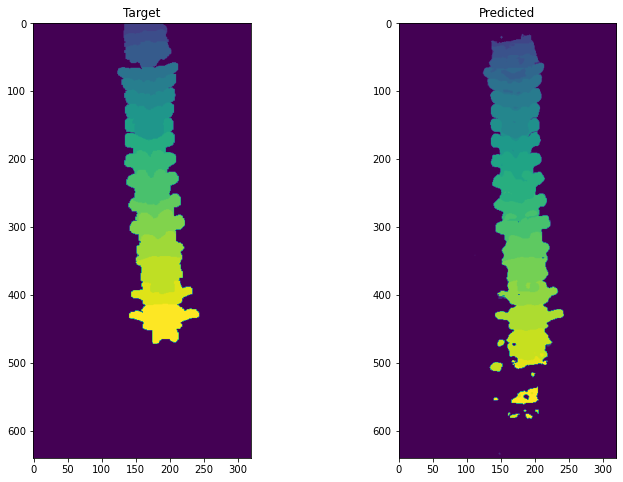

================================================== Training ==================================================
Epoch: 189, Train Loss: 0.3561805523489547, Average Dice Score: 0.6085667964718825
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.32 6: 0.65 7: 0.52 8: 0.78 9: 0.71 10: 0.76 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.83 16: 0.85 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.76 23: 0.65 24: 0.58 25: 0.00
================================================= Validation =================================================
Epoch: 189, Val Loss: 0.5308324147443302, Average Dice Score: 0.4226441256536803
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.32 6: 0.65 7: 0.52 8: 0.78 9: 0.71 10: 0.76 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.83 16: 0.85 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.76 23: 0.65 24: 0.58 25: 0.00


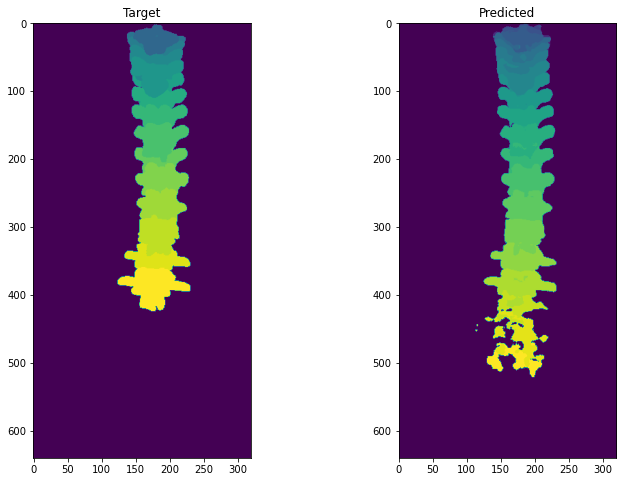

================================================== Training ==================================================
Epoch: 190, Train Loss: 0.35612165205835444, Average Dice Score: 0.6045728768432653
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.34 6: 0.56 7: 0.54 8: 0.78 9: 0.71 10: 0.75 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.82 16: 0.85 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.76 23: 0.64 24: 0.56 25: 0.00
================================================= Validation =================================================
Epoch: 190, Val Loss: 0.529013379675443, Average Dice Score: 0.42657658247243774
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.34 6: 0.56 7: 0.54 8: 0.78 9: 0.71 10: 0.75 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.82 16: 0.85 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.76 23: 0.64 24: 0.56 25: 0.00


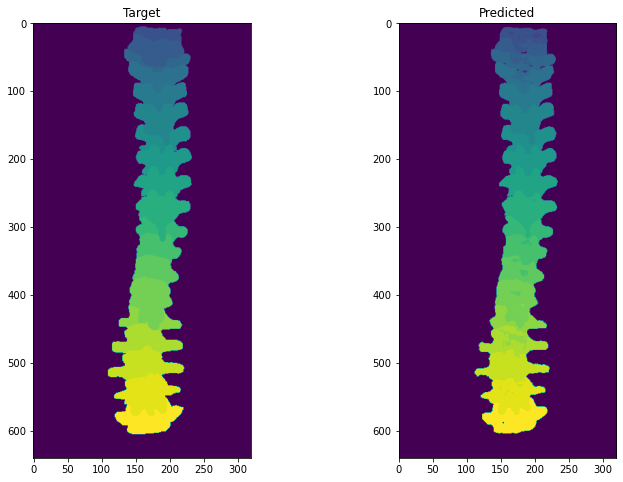

================================================== Training ==================================================
Epoch: 191, Train Loss: 0.35589372743620157, Average Dice Score: 0.6088874783512849
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.30 6: 0.62 7: 0.53 8: 0.78 9: 0.71 10: 0.76 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.83 16: 0.84 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.80 22: 0.79 23: 0.67 24: 0.59 25: 0.00
================================================= Validation =================================================
Epoch: 191, Val Loss: 0.5398396282899575, Average Dice Score: 0.4398174545096939
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.30 6: 0.62 7: 0.53 8: 0.78 9: 0.71 10: 0.76 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.83 16: 0.84 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.80 22: 0.79 23: 0.67 24: 0.59 25: 0.00


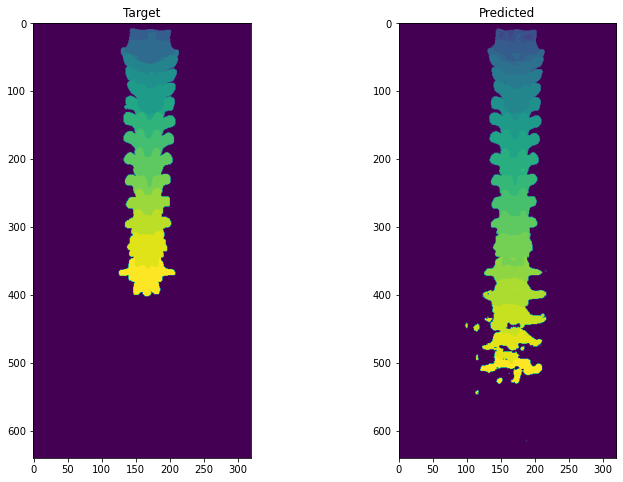

================================================== Training ==================================================
Epoch: 192, Train Loss: 0.35581866862371814, Average Dice Score: 0.6065864005082678
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.32 6: 0.65 7: 0.53 8: 0.78 9: 0.71 10: 0.76 11: 0.80 12: 0.80 13: 0.81 14: 0.82 15: 0.83 16: 0.85 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.79 22: 0.77 23: 0.64 24: 0.55 25: 0.00
================================================= Validation =================================================
Epoch: 192, Val Loss: 0.5297775258783435, Average Dice Score: 0.431413456804158
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.32 6: 0.65 7: 0.53 8: 0.78 9: 0.71 10: 0.76 11: 0.80 12: 0.80 13: 0.81 14: 0.82 15: 0.83 16: 0.85 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.79 22: 0.77 23: 0.64 24: 0.55 25: 0.00


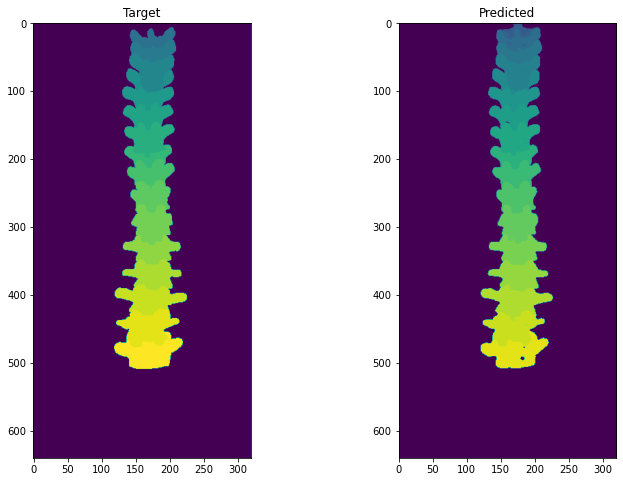

================================================== Training ==================================================
Epoch: 193, Train Loss: 0.355362881674053, Average Dice Score: 0.6101452590916061
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.31 6: 0.66 7: 0.53 8: 0.76 9: 0.71 10: 0.76 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.82 16: 0.85 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.79 23: 0.67 24: 0.59 25: 0.00
================================================= Validation =================================================
Epoch: 193, Val Loss: 0.5290393194214242, Average Dice Score: 0.43710846785725227
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.31 6: 0.66 7: 0.53 8: 0.76 9: 0.71 10: 0.76 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.82 16: 0.85 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.79 23: 0.67 24: 0.59 25: 0.00


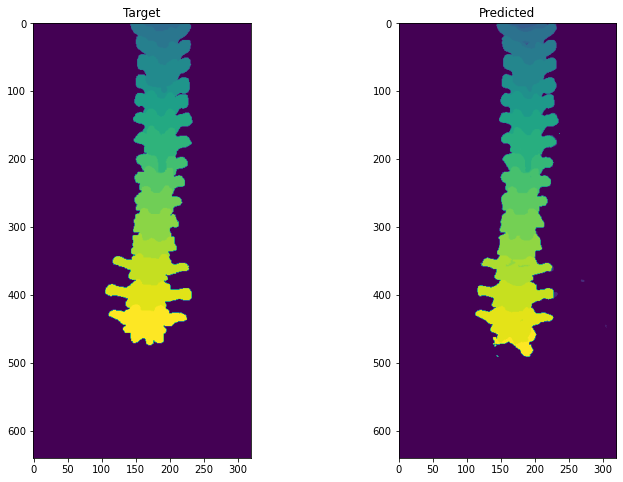

================================================== Training ==================================================
Epoch: 194, Train Loss: 0.35541351971320473, Average Dice Score: 0.6088882623450773
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.33 6: 0.60 7: 0.54 8: 0.78 9: 0.71 10: 0.76 11: 0.80 12: 0.80 13: 0.81 14: 0.82 15: 0.83 16: 0.84 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.79 23: 0.66 24: 0.57 25: 0.00
================================================= Validation =================================================
Epoch: 194, Val Loss: 0.5314942705826681, Average Dice Score: 0.43295899755461886
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.33 6: 0.60 7: 0.54 8: 0.78 9: 0.71 10: 0.76 11: 0.80 12: 0.80 13: 0.81 14: 0.82 15: 0.83 16: 0.84 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.79 23: 0.66 24: 0.57 25: 0.00


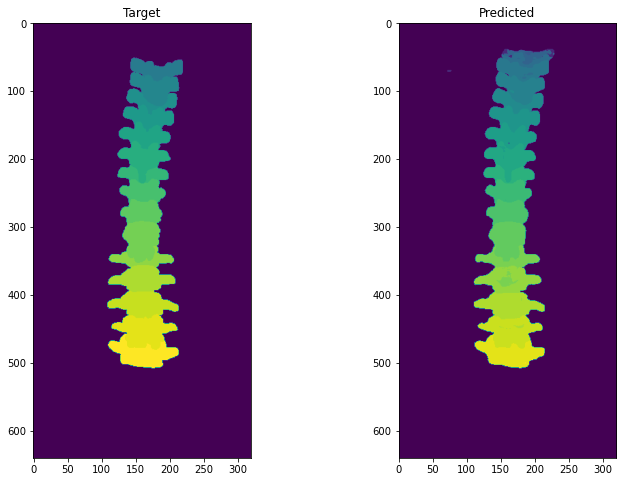

================================================== Training ==================================================
Epoch: 195, Train Loss: 0.35536078460992376, Average Dice Score: 0.6083563071154477
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.30 6: 0.63 7: 0.53 8: 0.76 9: 0.70 10: 0.76 11: 0.80 12: 0.80 13: 0.81 14: 0.82 15: 0.83 16: 0.85 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.78 23: 0.67 24: 0.60 25: 0.00
================================================= Validation =================================================
Epoch: 195, Val Loss: 0.5362989599587488, Average Dice Score: 0.4340695342113154
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.30 6: 0.63 7: 0.53 8: 0.76 9: 0.70 10: 0.76 11: 0.80 12: 0.80 13: 0.81 14: 0.82 15: 0.83 16: 0.85 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.78 23: 0.67 24: 0.60 25: 0.00


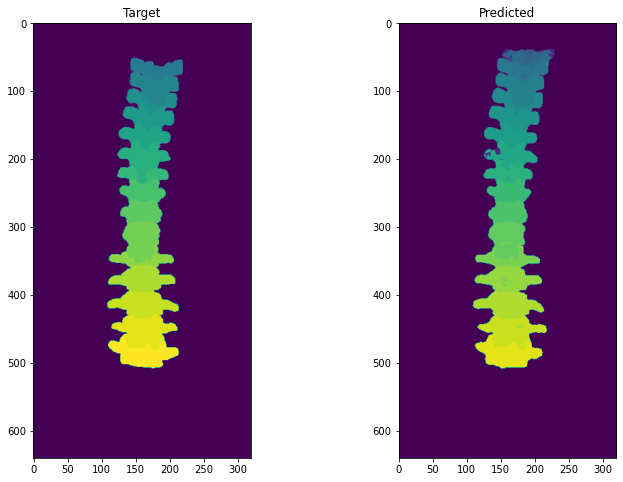

================================================== Training ==================================================
Epoch: 196, Train Loss: 0.3555750323021497, Average Dice Score: 0.6078244016388001
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.31 6: 0.63 7: 0.52 8: 0.76 9: 0.70 10: 0.76 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.82 16: 0.85 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.78 23: 0.67 24: 0.60 25: 0.00
================================================= Validation =================================================
Epoch: 196, Val Loss: 0.5383277662464829, Average Dice Score: 0.42296692826901794
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.31 6: 0.63 7: 0.52 8: 0.76 9: 0.70 10: 0.76 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.82 16: 0.85 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.78 23: 0.67 24: 0.60 25: 0.00


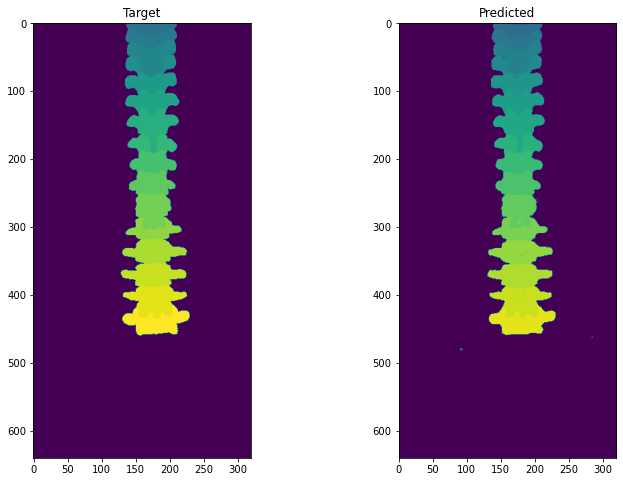

================================================== Training ==================================================
Epoch: 197, Train Loss: 0.3579258741788796, Average Dice Score: 0.6084158668783751
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.31 6: 0.63 7: 0.54 8: 0.78 9: 0.71 10: 0.76 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.82 16: 0.84 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.78 23: 0.67 24: 0.59 25: 0.00
================================================= Validation =================================================
Epoch: 197, Val Loss: 0.5360854834806724, Average Dice Score: 0.42723572326875797
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.31 6: 0.63 7: 0.54 8: 0.78 9: 0.71 10: 0.76 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.82 16: 0.84 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.78 23: 0.67 24: 0.59 25: 0.00


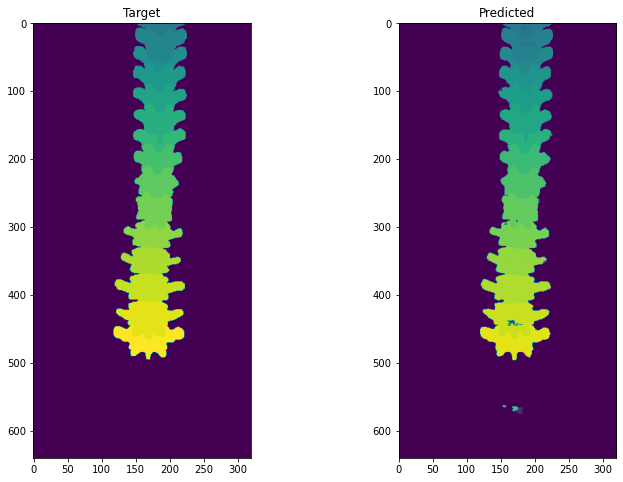

================================================== Training ==================================================
Epoch: 198, Train Loss: 0.35529013455905145, Average Dice Score: 0.6023458422643934
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.22 6: 0.57 7: 0.53 8: 0.76 9: 0.70 10: 0.76 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.82 16: 0.84 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.79 23: 0.67 24: 0.59 25: 0.00
================================================= Validation =================================================
Epoch: 198, Val Loss: 0.5328348445110633, Average Dice Score: 0.4306306661210897
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.22 6: 0.57 7: 0.53 8: 0.76 9: 0.70 10: 0.76 11: 0.80 12: 0.80 13: 0.80 14: 0.82 15: 0.82 16: 0.84 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.79 23: 0.67 24: 0.59 25: 0.00


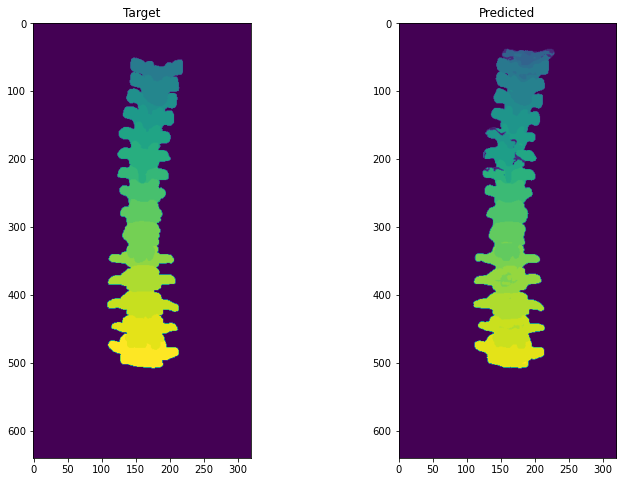

================================================== Training ==================================================
Epoch: 199, Train Loss: 0.3544861718198183, Average Dice Score: 0.6044741912514577
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.22 6: 0.63 7: 0.54 8: 0.76 9: 0.70 10: 0.76 11: 0.80 12: 0.80 13: 0.80 14: 0.81 15: 0.82 16: 0.84 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.79 23: 0.67 24: 0.59 25: 0.00
================================================= Validation =================================================
Epoch: 199, Val Loss: 0.5434359536796319, Average Dice Score: 0.42631099577160164
Dice Score Per Class
0: 0.99 1: 0.00 2: 0.00 3: 0.00 4: 0.00 5: 0.22 6: 0.63 7: 0.54 8: 0.76 9: 0.70 10: 0.76 11: 0.80 12: 0.80 13: 0.80 14: 0.81 15: 0.82 16: 0.84 17: 0.85 18: 0.84 19: 0.83 20: 0.86 21: 0.81 22: 0.79 23: 0.67 24: 0.59 25: 0.00


In [8]:
# Initialize 
displayBatch =  False
displayEpoch =  True
epoch_train_loss = []
epoch_train_accuracy_per_class = []
epoch_train_accuracy_average = []

epoch_val_loss = []
epoch_val_accuracy_per_class = []
epoch_val_accuracy_average = []

for epic in range(num_epochs):
    
    # Put model in training mode
    model.train()
    
    train_total = 0
    train_batch_loss = 0
    train_batch_accuracy = np.empty((0, num_classes))
    
    for i, sample in enumerate(train_dataloader):
        
        # move inputs to device
        if torch.cuda.is_available():
            x = sample['img'].to(device)
            y = sample['mask'].to(device)
        
        # Loop over model, calculate loss
        optimizer.zero_grad()
        output = model.forward(x)  # N K H W
        loss = loss_fn(output, y)
        loss.backward()
        optimizer.step()
        
        # Dice score for training
        train_batch_accuracy = np.vstack((train_batch_accuracy, dice_score(output, y)))
        
        # Display
        if displayBatch is True:
            _, y_hat = torch.max(output, dim=1) # argmax over classes
            _, y_flat = torch.max(y.detach().clone(), dim=1)
            disp_mask = y_flat.cpu().numpy()
            disp_y_hat = y_hat.cpu().numpy()
            plt.figure(figsize=(12,8))
            plt.subplot(1,2,1)
            plt.imshow(disp_mask[0])
            plt.title("Target")
            plt.subplot(1,2,2)
            plt.imshow(disp_y_hat[0])
            plt.title("Predicted")
            plt.show()
        
        # Since loss is averaged over class and batch, to get total loss we need to multiply by NK
        N, K, H, W = x.shape
        train_total += N*K
        train_batch_loss += loss.item() * N * K

    if displayEpoch is True:
        _, y_hat = torch.max(output, dim=1) # argmax over classes
        _, y_flat = torch.max(y.detach().clone(), dim=1)
        disp_mask = y_flat.cpu().numpy()
        disp_y_hat = y_hat.cpu().numpy()
        plt.figure(figsize=(12,8))
        plt.subplot(1,2,1)
        plt.imshow(disp_mask[0])
        plt.title("Target")
        plt.subplot(1,2,2)
        plt.imshow(disp_y_hat[0])
        plt.title("Predicted")
        plt.show()
        
    # Append to epoch loss/accuracy
    epoch_train_loss.append(train_batch_loss / train_total)
    a = train_batch_accuracy.mean(axis=0)
    epoch_train_accuracy_per_class.append(a) # mean over class to get per class accuracy
    epoch_train_accuracy_average.append(train_batch_accuracy.mean())
    
    print('='*50 + " Training " + '='*50)
    print(f'Epoch: {epic}, Train Loss: {epoch_train_loss[-1]}, Average Dice Score: {epoch_train_accuracy_average[-1]}')
    print('Dice Score Per Class')
    print('0: {0:.2f} 1: {1:.2f} 2: {2:.2f} 3: {3:.2f} 4: {4:.2f} 5: {5:.2f} 6: {6:.2f} 7: {7:.2f} 8: {8:.2f} 9: {9:.2f} 10: {10:.2f} 11: {11:.2f} 12: {12:.2f} 13: {13:.2f} 14: {14:.2f} 15: {15:.2f} 16: {16:.2f} 17: {17:.2f} 18: {18:.2f} 19: {19:.2f} 20: {20:.2f} 21: {21:.2f} 22: {22:.2f} 23: {23:.2f} 24: {24:.2f} 25: {25:.2f}'.format(a[0], a[1], a[2], a[3], a[4], a[5], a[6], a[7], a[8], a[9], a[10], a[11], a[12], a[13], a[14], a[15], a[16], a[17], a[18], a[19], a[20], a[21], a[22], a[23], a[24], a[25]))
    
    # Put model in validation mode
    model.eval()

    val_total = 0
    val_batch_loss = 0
    val_batch_accuracy = np.empty((0, num_classes))
          
    with torch.no_grad():
        for i, sample in enumerate(val_dataloader):
            
            # move inputs to device
            if torch.cuda.is_available():
                x = sample['img'].to(device)
                y = sample['mask'].to(device)
            
            output = model.forward(x)
            loss = loss_fn(output, y)
            
            # Dice score for training
            val_batch_accuracy = np.vstack((val_batch_accuracy, dice_score(output, y)))
            
            # Since loss is averaged over class and batch, to get total loss we need to multiply by NK
            N, K, H, W = x.shape
            val_total += N*K
            val_batch_loss += loss.item() * N * K
            
        # Append to epoch loss/accuracy
        epoch_val_loss.append(val_batch_loss / val_total)
        b = val_batch_accuracy.mean(axis=0)
        epoch_val_accuracy_per_class.append(a) # mean over class to get per class accuracy
        epoch_val_accuracy_average.append(val_batch_accuracy.mean())
        
        print('='*49 + " Validation " + '='*49)
        print(f'Epoch: {epic}, Val Loss: {epoch_val_loss[-1]}, Average Dice Score: {epoch_val_accuracy_average[-1]}')
        print('Dice Score Per Class')
        print('0: {0:.2f} 1: {1:.2f} 2: {2:.2f} 3: {3:.2f} 4: {4:.2f} 5: {5:.2f} 6: {6:.2f} 7: {7:.2f} 8: {8:.2f} 9: {9:.2f} 10: {10:.2f} 11: {11:.2f} 12: {12:.2f} 13: {13:.2f} 14: {14:.2f} 15: {15:.2f} 16: {16:.2f} 17: {17:.2f} 18: {18:.2f} 19: {19:.2f} 20: {20:.2f} 21: {21:.2f} 22: {22:.2f} 23: {23:.2f} 24: {24:.2f} 25: {25:.2f}'.format(a[0], a[1], a[2], a[3], a[4], a[5], a[6], a[7], a[8], a[9], a[10], a[11], a[12], a[13], a[14], a[15], a[16], a[17], a[18], a[19], a[20], a[21], a[22], a[23], a[24], a[25]))
        print('='*110)

### saving and loading models

In [12]:
torch.save(model.state_dict(), 'saved_models/ir1')

In [13]:
# Save stats and what not
import pickle

ir1_stats = {'epoch_train_loss': epoch_train_loss,
             'epoch_train_accuracy_per_class': epoch_train_accuracy_per_class,
             'epoch_train_accuracy_average': epoch_train_accuracy_average,
             'epoch_val_loss': epoch_val_loss,
             'epoch_val_accuracy_per_class': epoch_val_accuracy_per_class,
             'epoch_val_accuracy_average': epoch_val_accuracy_average
            }

In [14]:
with open('ir1_stats.pickle', 'wb') as handle:
    pickle.dump(a, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [34]:
# with open('ir1_stats.pickle', 'rb') as handle:
#     41_stats = pickle.load(handle)
    

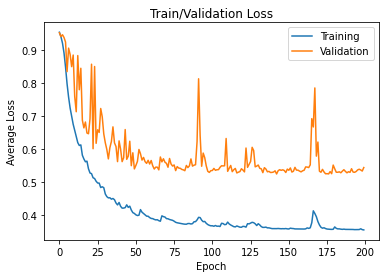

In [15]:
plt.figure()
plt.plot(epoch_train_loss)
plt.plot(epoch_val_loss)
plt.xlabel("Epoch")
plt.ylabel("Average Loss")
plt.title("Train/Validation Loss")
plt.legend(["Training", "Validation"])

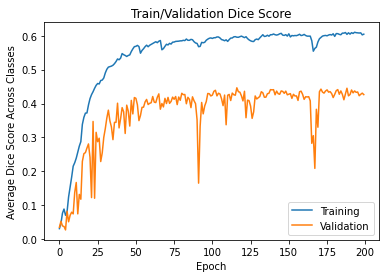

In [16]:
plt.figure()
plt.plot(epoch_train_accuracy_average)
plt.plot(epoch_val_accuracy_average)
plt.xlabel("Epoch")
plt.ylabel("Average Dice Score Across Classes")
plt.title("Train/Validation Dice Score")
plt.legend(["Training", "Validation"])

In [ ]:
## Uncomment to load in model
num_classes = 26
print(torch.cuda.get_device_name(0))
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = unet(num_classes=num_classes, useBN=True)
model.load_state_dict(torch.load('saved_models/ir1'))
model.to(device)
model.eval()

Testing sample: 0
Displaying stats for case 0:
output shape is torch.Size([1, 26, 640, 320])


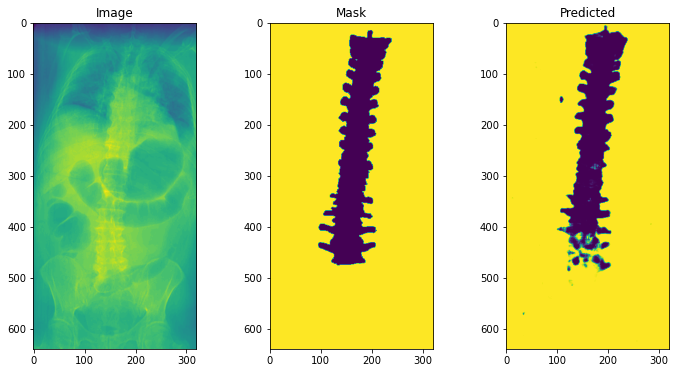

Displaying mask stats for case 0:
showing label 0


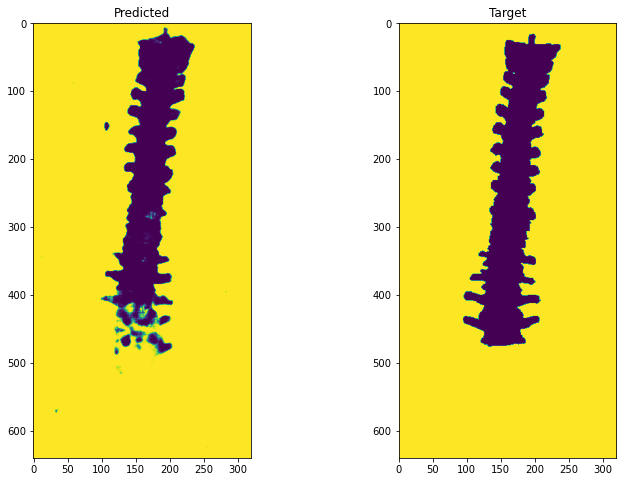

showing label 1


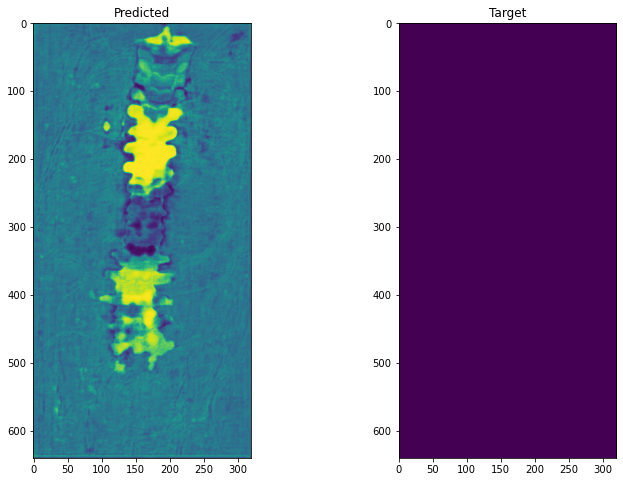

showing label 2


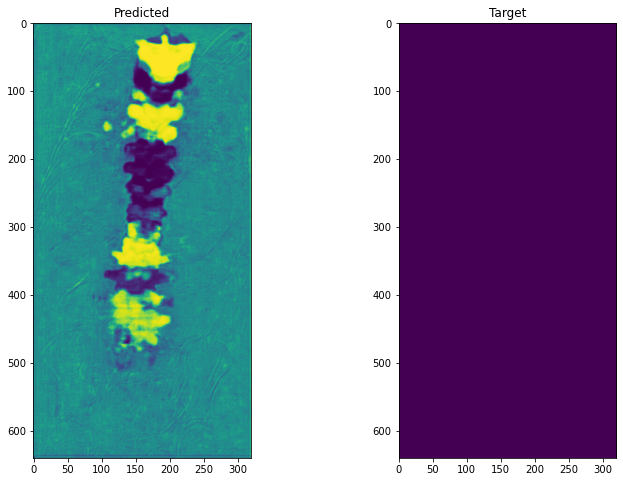

showing label 3


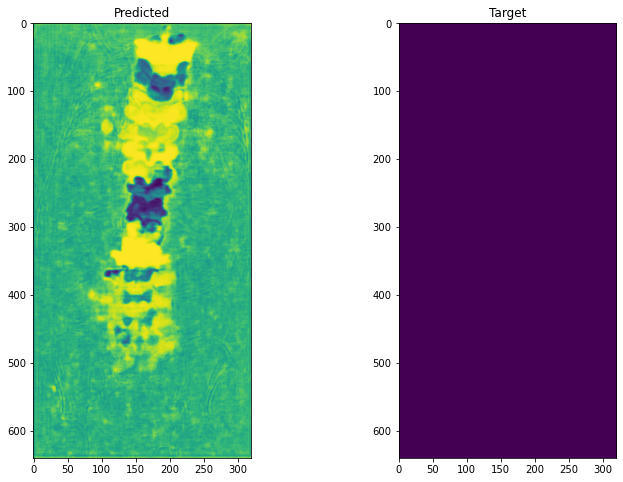

showing label 4


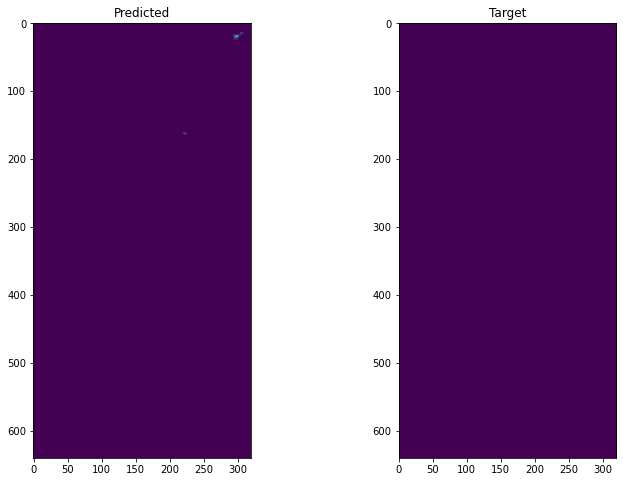

showing label 5


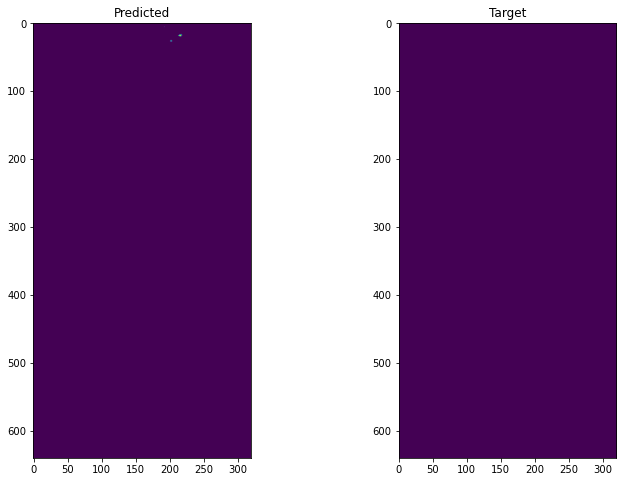

showing label 6


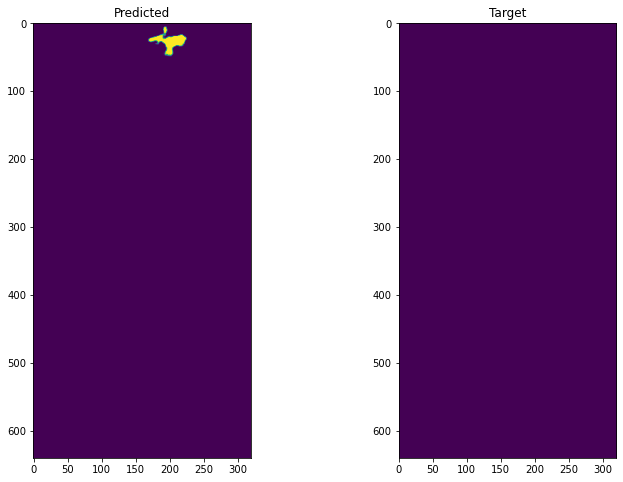

showing label 7


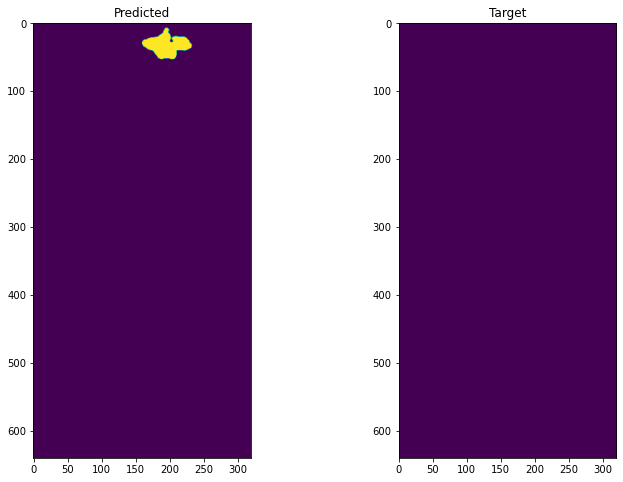

showing label 8


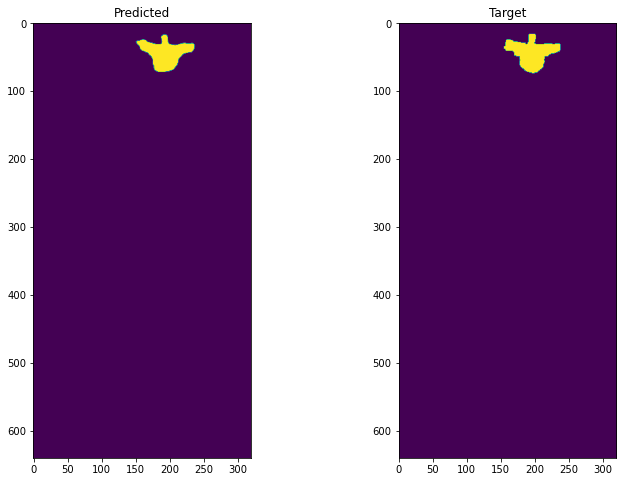

showing label 9


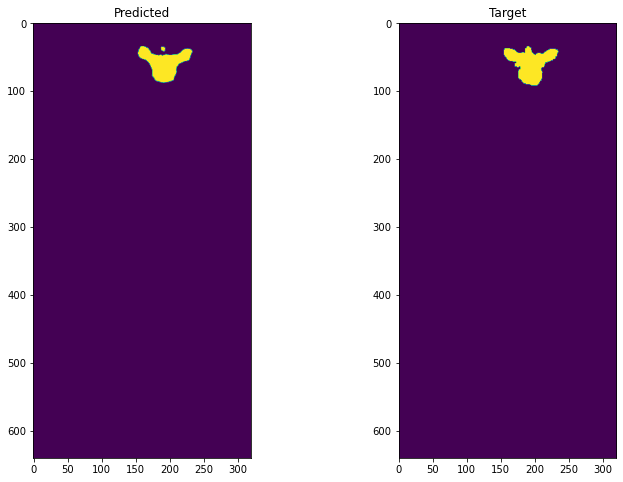

showing label 10


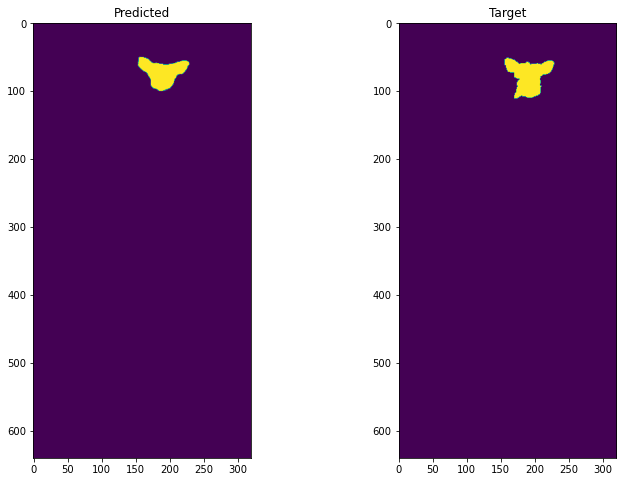

showing label 11


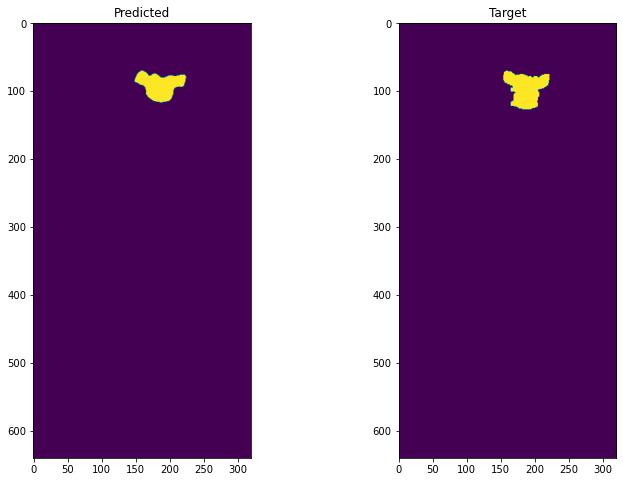

showing label 12


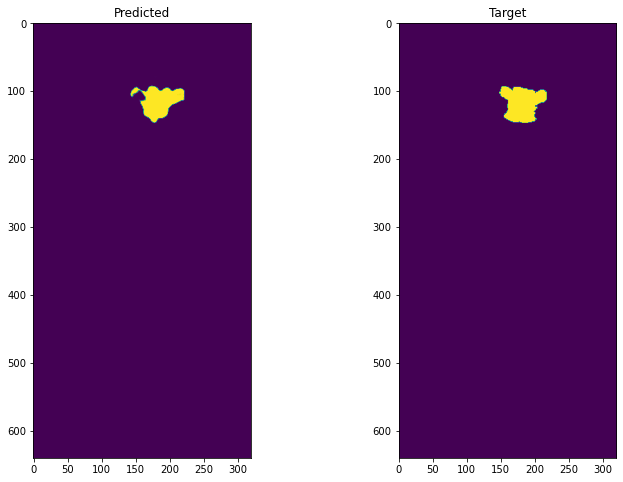

showing label 13


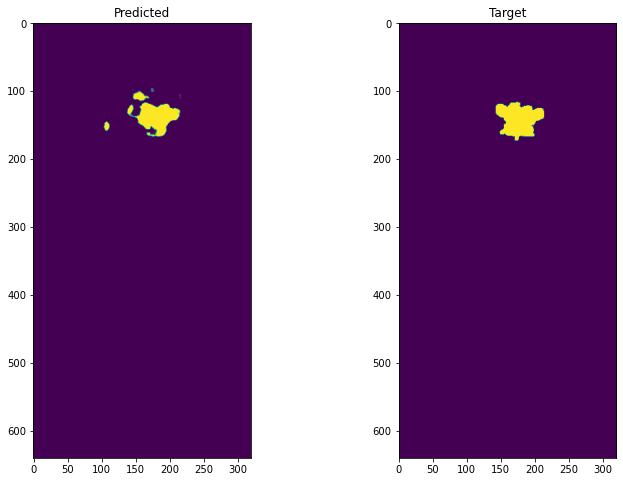

showing label 14


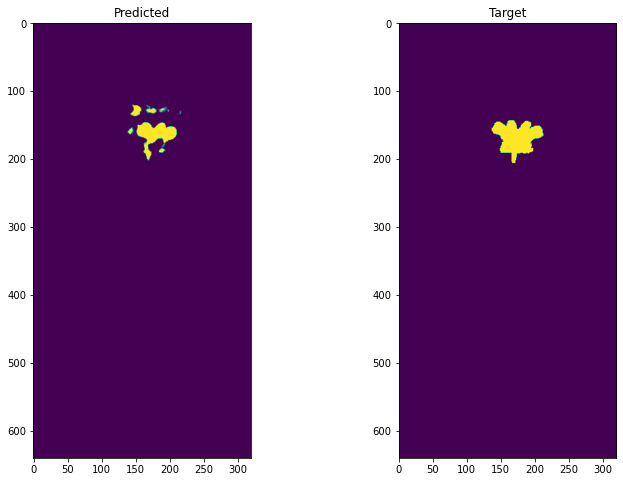

showing label 15


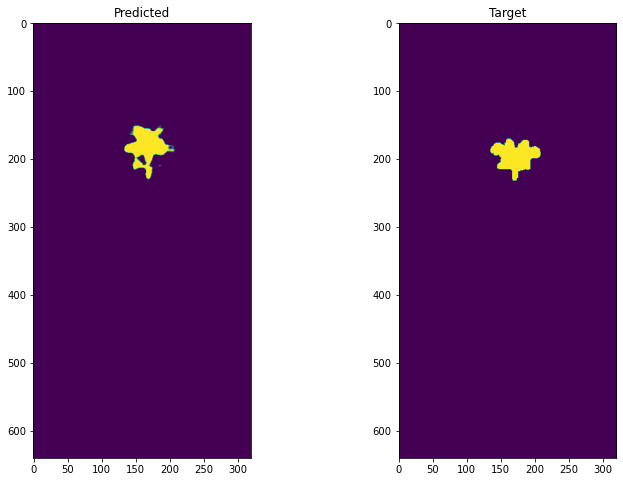

showing label 16


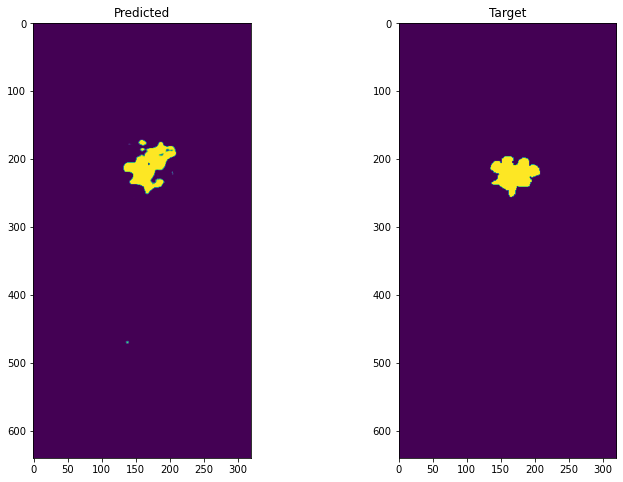

showing label 17


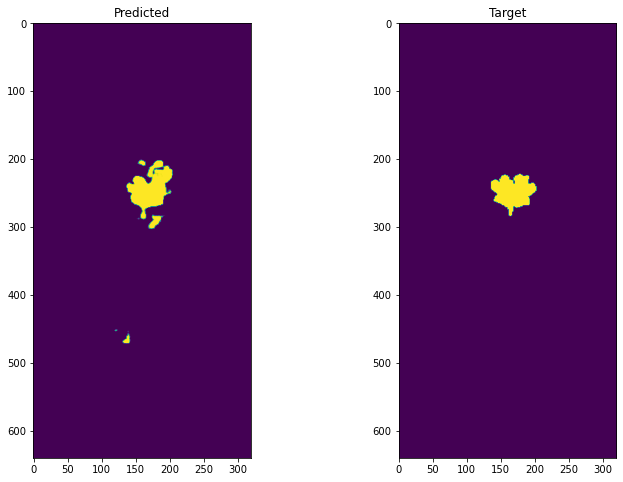

showing label 18


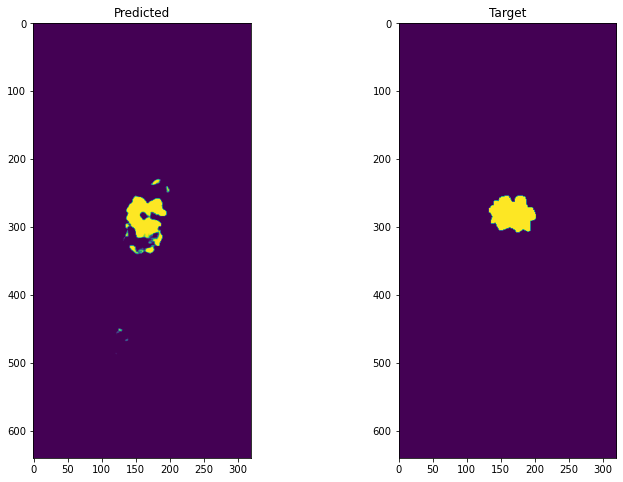

showing label 19


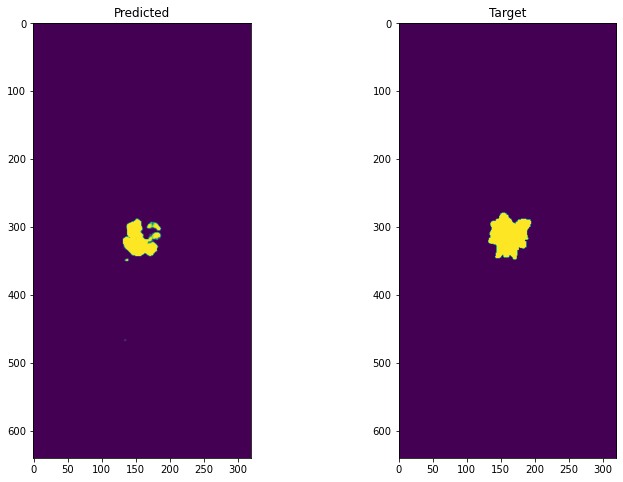

showing label 20


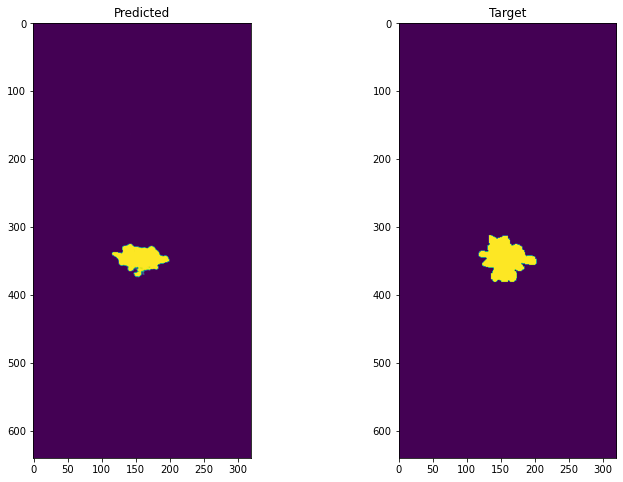

showing label 21


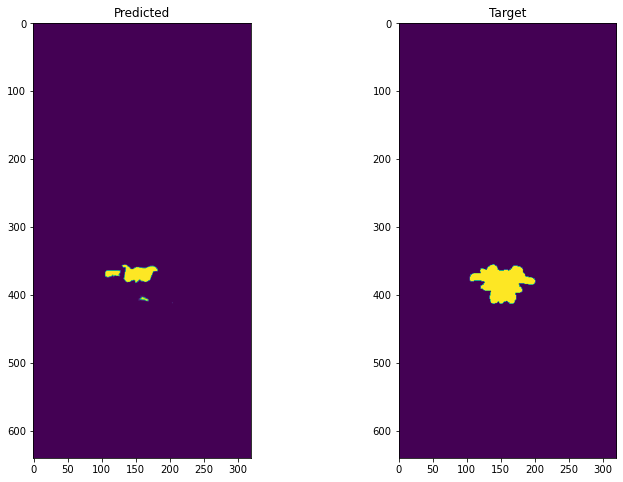

showing label 22


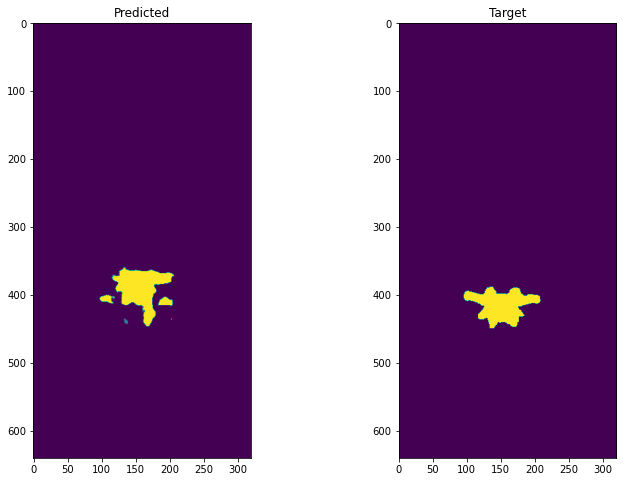

showing label 23


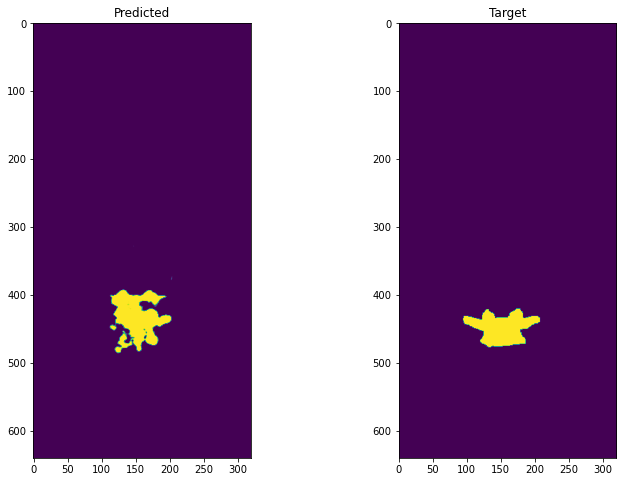

showing label 24


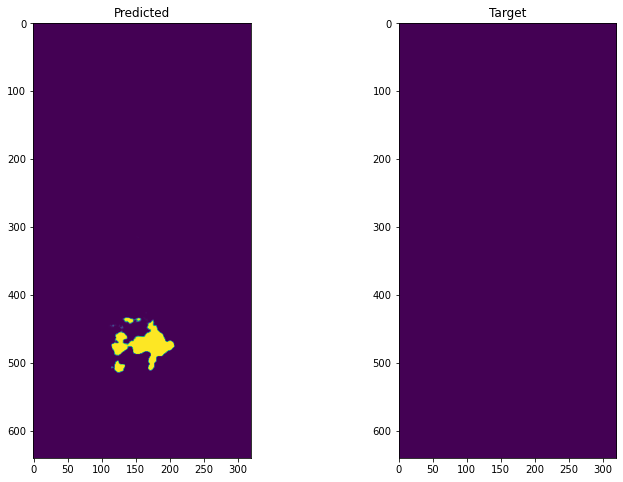

showing label 25


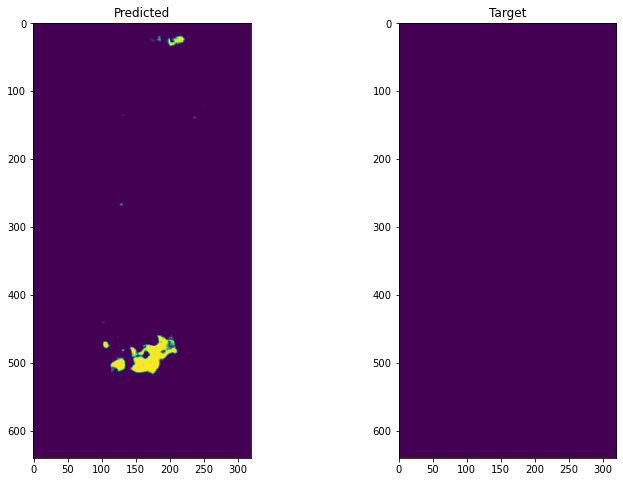

Testing sample: 1
Testing sample: 2
Testing sample: 3
Testing sample: 4
Testing sample: 5
Testing sample: 6
Testing sample: 7
Testing sample: 8
Testing sample: 9
Testing sample: 10
Testing sample: 11
Testing sample: 12
Testing sample: 13
Testing sample: 14
Testing sample: 15
Testing sample: 16
Testing sample: 17
Testing sample: 18
Testing sample: 19
Testing sample: 20
Testing sample: 21
Testing sample: 22
Testing sample: 23
Testing sample: 24
Testing sample: 25
Testing sample: 26
Testing sample: 27
Testing sample: 28
Testing sample: 29
Testing sample: 30
Testing sample: 31
Testing sample: 32
Testing sample: 33
Testing sample: 34
Testing sample: 35
Testing sample: 36
Testing sample: 37
Testing sample: 38
Testing sample: 39
Testing sample: 40
Testing sample: 41
Testing sample: 42
Testing sample: 43
Testing sample: 44
Testing sample: 45
Testing sample: 46
Testing sample: 47
Testing sample: 48
Testing sample: 49
Testing sample: 50
Testing sample: 51
Testing sample: 52
Testing sample: 53
Te

In [11]:
# Evaluate Model on Test Data

# Put in eval mode
model.eval()

test_total = 0
test_batch_loss = 0
test_batch_accuracy = np.empty((0, num_classes))

with torch.no_grad():
    for i, sample in enumerate(test_dataloader):
        print('Testing sample:',i)
        
#         _, y_hat = torch.max(output, dim=1) # argmax over classes
#         _, y_flat = torch.max(y.detach().clone(), dim=1)
#         disp_mask = y_flat.cpu().numpy()
#         disp_y_hat = y_hat.cpu().numpy()
#         plt.figure(figsize=(12,8))
#         plt.subplot(1,2,1)
#         plt.imshow(disp_mask[0])
#         plt.title("Target")
#         plt.subplot(1,2,2)
#         plt.imshow(disp_y_hat[0])
#         plt.title("Predicted")
#         plt.show()

        # move inputs to device
        if torch.cuda.is_available():
            x = sample['img'].to(device)
            y = sample['mask'].to(device)
        
            output = model.forward(x)
            
        if i == 0:
            print('Displaying stats for case 0:')
            print('output shape is',np.shape(output))  # [1, 26, 640, 320]
            output_plt = output.cpu()
            plt.figure(figsize=(12,6))
            plt.subplot(1,3,1)
            plt.imshow(sample['img'][0,0,:,:])
            plt.title('Image')
            plt.subplot(1,3,2)
            plt.imshow(sample['mask'][0,0,:,:])
            plt.title('Mask')
            plt.subplot(1,3,3)
            plt.imshow(output_plt[0,0,:,:])
            plt.title('Predicted')
            plt.show()
            
            print('Displaying mask stats for case 0:')

            for idx in range(26):
                print('showing label', idx)
                plt.figure(figsize=(12,8))
                plt.subplot(1,2,1)
                plt.imshow(output_plt[0,idx,:,:])
                plt.title('Predicted')
                plt.subplot(1,2,2)
                plt.imshow(sample['mask'][0,idx,:,:])
                plt.title('Target')
                plt.show()

        # Dice score for training
#         test_batch_accuracy = np.vstack((val_batch_accuracy, dice_score(output, y)))

In [17]:
# Dice Score Per Class
test_batch_accuracy.mean(axis=0)

<ipython-input-17-cc8d9cbca699>:2: RuntimeWarning: Mean of empty slice.
  test_batch_accuracy.mean(axis=0)
/home-2/jwei9@jhu.edu/.conda/envs/arcade/lib/python3.8/site-packages/numpy/core/_methods.py:162: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


array([nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan])

In [18]:
# Average Dice Score
test_batch_accuracy.mean()

<ipython-input-18-3c857dff5430>:2: RuntimeWarning: Mean of empty slice.
  test_batch_accuracy.mean()
/home-2/jwei9@jhu.edu/.conda/envs/arcade/lib/python3.8/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


nan